In [ ]:
# import needed libraries
import numpy as np
import os
import matplotlib.pyplot as plt
from google.colab import drive
import matplotlib.image as mpimg
from random import randint
import pandas as pd
import math
import networkx as nx
import matplotlib.pyplot as plt
from IPython import display
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
import cv2
from zipfile import ZipFile 
from pathlib import Path
import sys
import tensorflow as tf
from PIL import Image
from PIL import ImageChops
import zipfile
from zipfile import ZipFile
from google.colab.patches import cv2_imshow

In [59]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Extract ZIP Dataset




In [ ]:
file_name = '/content/drive/My Drive/Topology_DataSet/Dataset.zip'
zf = ZipFile(file_name, 'r')
zf.extractall('/content/drive/My Drive/Topology_DataSet')
zf.close()

**Read Files from Dataset**

In [60]:
path_folder = '/content/drive/My Drive/Topology_DataSet/Dataset'
files = os.listdir(path_folder)
print(len(files))
print(files)

31
['ground_truth.txt', 't_10_0.txt', 't_10_1.txt', 't_10_2.txt', 't_10_3.txt', 't_10_4.txt', 't_10_5.txt', 't_10_6.txt', 't_10_7.txt', 't_10_8.txt', 't_10_9.txt', 't_100_0.txt', 't_100_1.txt', 't_100_2.txt', 't_100_3.txt', 't_100_4.txt', 't_100_5.txt', 't_100_6.txt', 't_100_7.txt', 't_100_8.txt', 't_100_9.txt', 't_50_0.txt', 't_50_1.txt', 't_50_2.txt', 't_50_3.txt', 't_50_4.txt', 't_50_5.txt', 't_50_6.txt', 't_50_7.txt', 't_50_8.txt', 't_50_9.txt']


**Read file**

In [61]:
def read_file(path):
  read = open(path, "r")
  Lines = read.readlines()
  read.close()
  file_array = []
  for line in Lines:
    l = line.strip().split()
    l = [int(i) for i in l] 
    file_array.append(np.array(l))
  file_array = np.array(file_array)
  return file_array

**Read ground truth**

In [62]:
ground_truth = path_folder + '/' + files[0]
ground_truth_array = read_file(ground_truth)
ground_truth_array[0][2] = 2

**Fix labels of the dataset**

In [63]:
def fix_groundTruth (ground_truth_array):
  ground_t = []
  for i in range(ground_truth_array.shape[0]):
    gt = ground_truth_array[i]
    max = np.max(gt)
    for j in range(gt.shape[0]):
      flag = False
      cluster = np.where(gt == j)[0]
      if (cluster.shape[0] == 0 and j < max):
        flag = True
        cluster = np.where(gt > j)[0]
        gt2 = {0}
        for k in range (cluster.shape[0]):
          gt2.add(gt[cluster[k]])
        gt2.remove(0)
        gt2 = sorted(gt2)
        for k in range(len(gt2)):
          divide = np.where(gt == gt2[k])[0]
          for s in range(divide.shape[0]):
            gt[divide[s]] = j
          j = j+1
      if (flag):
        break
    ground_t.append(gt)
  ground_t = np.array(ground_t)
  return ground_t

In [64]:
ground_truth_array = fix_groundTruth(ground_truth_array)
print(ground_truth_array)

[array([2, 1, 2, 2, 4, 0, 3, 3, 0, 2])
 array([0, 0, 0, 1, 1, 1, 1, 0, 0, 0])
 array([1, 1, 1, 1, 1, 0, 0, 1, 1, 1])
 array([0, 0, 1, 0, 0, 1, 0, 0, 1, 1])
 array([1, 0, 0, 2, 2, 2, 3, 1, 0, 3])
 array([1, 0, 1, 1, 1, 0, 0, 0, 0, 1])
 array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0])
 array([0, 1, 0, 0, 0, 1, 1, 1, 0, 1])
 array([0, 3, 2, 0, 2, 1, 0, 3, 2, 0])
 array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0])
 array([ 4,  1,  1,  4,  1,  2,  6,  3,  1,  2,  5,  5,  3,  5,  0, 10,  1,
        1,  4,  0,  0,  3,  2,  3,  1,  5,  6,  0,  1,  3,  3,  2,  8,  5,
        9,  7,  4,  2,  4,  6,  3,  5,  1,  6,  3,  0,  0,  6,  4,  0])
 array([ 7,  9, 14,  4, 10,  9,  8,  6,  6, 11,  2, 14,  7, 11, 12,  7,  8,
       16,  0,  4, 13,  3,  2, 12,  4, 12,  5,  1, 10,  5, 10,  3, 11, 15,
       14,  6, 11, 13,  1,  9,  5,  7,  7,  1, 13,  3, 16,  0,  4, 15])
 array([24,  3,  0, 14, 15, 13,  6,  2,  3, 21, 12,  5, 16, 10,  1,  5, 22,
       20,  9, 13, 23, 17,  9,  1,  7, 11, 11,  3, 19,  2,  7, 22, 16, 12,
       18, 19

**Read files**

In [65]:
examples = []
for i in range(len(files)):
  if (i == 0):
    continue
  examples.append(read_file(path_folder + '/' + files[i]))

**Visualize the Topologies Before Clustering**

In [66]:
def visualize_topologies_beforeClustering(array_clusters):
  G=nx.Graph()
  array_clusters = np.array(array_clusters)
  max1 = np.max(array_clusters[:,0])
  max2 = np.max(array_clusters[:,1])
  nodes = 0
  if (max1 <= 10 and max2 <= 10):
    plt.figure()
    nodes = 10
  elif (max1 <= 50 and max2 <= 50):
    plt.figure(figsize=(10,10))
    nodes = 50
  else:
    plt.figure(figsize=(20,20))
    nodes = 100
  for i in range(nodes):
    G.add_node(i+1)
  for j in range(array_clusters.shape[0]):
    G.add_edge(array_clusters[j,0], array_clusters[j,1])
    G[array_clusters[j,0]][array_clusters[j,1]]['weight'] = array_clusters[j,2]
  pos = nx.nx_pydot.pydot_layout(G, prog='dot')
  nx.draw(G,pos, with_labels = True, node_color=('#%06X' % randint(0, 0xFFFFFF)), edge_color='black')
  labels = nx.get_edge_attributes(G,'weight')
  nx.draw_networkx_edge_labels(G,pos,edge_labels=labels)
  plt.show()

**Visualize the Topologies After Clustering**



In [67]:
def visualize_topologies_afterClustering(array_clusters, clusters2):
  clusters = []
  sim = similarity_matrix(array_clusters)
  colors = []
  colors_map = {}
  num_clusters = np.max(clusters2)
  for i in range(num_clusters+1):
    colors.append('#%06X' % randint(0, 0xFFFFFF))
  for i in range(num_clusters + 1):
    nodes = np.where(clusters2 == i)[0]
    nodes = nodes+1
    clusters.append(np.array(nodes))
  clusters = np.array(clusters)
  G=nx.Graph()
  array_clusters = np.array(array_clusters)
  max1 = np.max(array_clusters[:,0])
  max2 = np.max(array_clusters[:,1])
  nodes = 0
  color_map = []
  if (max1 <= 10 and max2 <= 10):
    plt.figure()
    nodes = 10
  elif (max1 <= 50 and max2 <= 50):
    plt.figure(figsize=(10,10))
    nodes = 50
  else:
    plt.figure(figsize=(20,20))
    nodes = 100
  for i in range(clusters.shape[0]):
    clustersi = np.array(clusters[i])
    for j in range(clustersi.shape[0]):
      G.add_node(clustersi[j])
    for j in range(clustersi.shape[0]):
      k = j+1
      colors_map[j] = colors[i]
      while (k < clustersi.shape[0]):
        if (sim[clustersi[j]-1][clustersi[k]-1] != 0):
          G.add_edge(clustersi[j], clustersi[k])
          G[clustersi[j]][clustersi[k]]['weight'] = sim[clustersi[j]-1][clustersi[k]-1]
        k = k+1
    pos = nx.nx_pydot.pydot_layout(G, prog='dot')
    nx.draw(G,pos, with_labels = True, node_color=colors[i], edge_color='black')
    labels = nx.get_edge_attributes(G,'weight')
    nx.draw_networkx_edge_labels(G,pos,edge_labels=labels)
    plt.show()
    G.clear()

helped_link = "https://stackoverflow.com/questions/28372127/add-edge-weights-to-plot-output-in-networkx"

 **Build the similarity matrix A**

In [68]:
def similarity_matrix(topology):
  graph = np.array(topology)
  n = graph.max(axis=0)[0]
  if (n <= 10):
    n = 10
  elif (n <= 50):
    n = 50
  else :
    n = 100
  A = np.zeros([n,n])
  for edge in topology:
    from_node = edge[0] - 1 
    to_node = edge[1] - 1
    weight = edge[2]
    if (A[from_node][to_node] < weight):
      A[from_node][to_node] = weight
      A[to_node][from_node] = weight
  return A

**Implement the spectral clustering algorithm**

In [69]:
from sklearn.cluster import KMeans
def Spectral_Clustring(A, k):
  #construct degree matrix
  sum_rows = A.sum(axis = 1)
  degree_matrix = np.diag(sum_rows)
  #calculate L
  L = degree_matrix - A
  #calculate B 
  if np.linalg.cond(degree_matrix) < 1/sys.float_info.epsilon:
    B = np.dot(np.linalg.inv(degree_matrix), L)
  else:
    B = L
  values, vectors = np.linalg.eigh(B)
  U = vectors[:, :k]
  normalize = 1 / (np.sum(np.abs(U)**2,axis=-1)**(1./2))
  Y = U * normalize[:, np.newaxis]
  kmeans = KMeans(n_clusters=k, random_state=0).fit(Y)
  return kmeans.labels_

**Implement spectural clustering with handleing the division by zero for norm**

In [70]:
def Normalized_cut(A, k):
  #construct degree matrix
  sum_rows = A.sum(axis = 1)
  degree_matrix = np.diag(sum_rows)
  #calculate L
  L = degree_matrix - A
  #print(L)
  #calculate B 
  if np.linalg.cond(degree_matrix) < 1/sys.float_info.epsilon:
    B = np.dot(np.linalg.inv(degree_matrix), L)
  else:
    B = L
  values, vectors = np.linalg.eigh(B)
  U = vectors[:, :k]
  norm = (np.sum(np.abs(U)**2,axis=-1)**(1./2))
  norm[norm == 0] = 1
  U = U / norm[:, np.newaxis]
  kmeans = KMeans(n_clusters=k, random_state=0).fit(U)
  return kmeans.labels_

In [ ]:
def conditionalEntrpoy(clusters2, gt):
  clusters = []
  num_clusters = np.max(clusters2)
  for i in range(num_clusters + 1):
    nodes = np.where(clusters2 == i)[0]
    nodes = nodes+1
    clusters.append(np.array(nodes))
  clusters = np.array(clusters)
  sample_set = set(clusters2)
  num_clusters = max(clusters.shape[0], len(sample_set))
  H_C = 0.0
  for i in range(clusters.shape[0]):
    clusteri = np.array(clusters[i])
    H = 0.0
    count = 0
    for j in (sample_set):
      nodes = np.where(gt == j)[0]
      nodes = nodes + 1
      intersection = np.intersect1d(clusteri, nodes)
      intersection = np.array(intersection)
      count += intersection.shape[0]
      if(intersection.shape[0] != 0):
        H = H + ((-intersection.shape[0] / clusteri.shape[0]) * math.log(float(intersection.shape[0] / clusteri.shape[0]), 10))
    if (count < clusteri.shape[0]):
      for k in range(clusteri.shape[0] - count):
        H = H + ((-1/clusteri.shape[0]) * math.log(1/clusteri[0], 10))
    H_C = H_C + ((clusteri.shape[0] / gt.shape[0]) * H)
  return H_C

**Helping Functions**

In [71]:
def nodes_to_labels(clusters, gt):
  labels = []
  for cluster in clusters:
    label = []
    for i in range(len(cluster)):
      node = cluster[i]
      label.append(gt[node - 1]) 
    labels.append(label)
  labels_arr = np.array(labels)
  return labels_arr

In [72]:
def CountFrequency(labeled_clusters):   
   count = {} 
   for i in labeled_clusters: 
    count[i] = count.get(i, 0) + 1 
   return count

In [73]:
def clusters_arr(Y):
  clusters = []
  num_clusters = np.max(Y)
  for i in range(num_clusters + 1):
    nodes = np.where(Y == i)[0]
    nodes = nodes+1
    clusters.append(np.array(nodes))
  clusters = np.array(clusters)
  return clusters

**External Measure --> Conditional Entrpoy**

In [74]:
def conditional_entropy(clusters, gt):
  clustering = clusters_arr(clusters)
  H_C = 0.0
  labels = nodes_to_labels(clustering, gt)
  for i in range(labels.shape[0]):
    clusteri = np.array(labels[i])
    dic = CountFrequency(clusteri)
    for par in dic.values():
      H_C += ((-par / gt.shape[0]) * math.log(par / clusteri.shape[0], 10))
  return H_C

**Precision**

In [75]:
def precision(Y, gt):
  clusters = clusters_arr(Y)
  precision_list = []
  labeled_clusters = nodes_to_labels(clusters, gt)
  for cluster in labeled_clusters:
    count = CountFrequency(cluster)
    freq = max(count.values())
    precision_list.append(freq / len(cluster))
  precision_arr = np.array(precision_list)
  return precision_arr

**Recall**

In [76]:
def recall(Y, gt):
  clusters = clusters_arr(Y)
  recall_list = []
  labeled_clusters = nodes_to_labels(clusters, gt)
  count_gt = CountFrequency(gt)
  for cluster in labeled_clusters:
    count = CountFrequency(cluster)
    freq = max(count.values())
    max_key = max(count, key=lambda k: count[k])
    total_samples = count_gt[max_key]
    recall = freq / total_samples
    recall_list.append(recall)
  recall_arr = np.array(recall_list)
  return recall_arr

**F - Measure**

In [77]:
def f_measure(precision_arr, recall_arr):
  n = len(precision_arr)
  f_measure_list = []
  for i in range(n):
    fi = (2 * precision_arr[i] * recall_arr[i]) / (precision_arr[i] + recall_arr[i])
    f_measure_list.append(fi)
  f_measure_arr = np.array(f_measure_list)
  F = (np.sum(f_measure_arr, axis=0)) / n
  return F

**Normalized-Cut Evaluation**

In [78]:
def Ncut_eval(Y,similarity_matrix):
  #get distance matrix
  distance_matrix = np.exp(similarity_matrix * -0.01)
  #get cluster array and convert nodes to indecies   
  clusters = clusters_arr(Y) - 1
  #number of clusters                        
  n = len(clusters)
  #matrix that contains W_in & W_out for every cluster                                     
  cluster_matrix = np.zeros([n,n])
  #dim in cluster_matrix                      
  d = 0                                                 
  #calculate W_in for every cluster
  for cluster in clusters:
    w_in = 0
    n_i = len(cluster)
    for i in range(n_i):
      for j in range(i+1,n_i):
        w_in += distance_matrix[cluster[i]][cluster[j]]
    cluster_matrix[d][d] = w_in
    d = d + 1
  #calculate W_out for every cluster  
  for i in range(n):
    for j in range(i+1,n):
      w_out = 0
      combinations = np.array(np.meshgrid(clusters[i], clusters[j])).T.reshape(-1, 2)
      for x in combinations:
        w_out += distance_matrix[x[0]][x[1]]
      cluster_matrix[i][j] = cluster_matrix[j][i] = w_out    
  vol_arr = np.sum(cluster_matrix, axis = 1)
  diag_arr = np.diag(cluster_matrix)
  w_arr = vol_arr - diag_arr
  w_vol_arr = w_arr / vol_arr
  Ncut = np.sum(w_vol_arr)
  return Ncut

**Get the amount of traffic running internally in each individual partition, and the total amount of emulated traffic between different partitions**

In [79]:
def get_traffic(Y, similarity_matrix):
  #get distance matrix
  distance_matrix = similarity_matrix
  #get cluster array and convert nodes to indecies   
  clusters = clusters_arr(Y) - 1
  #number of clusters                        
  n = len(clusters)
  #matrix that contains W_in & W_out for every cluster                                     
  cluster_matrix = np.zeros([n,n])
  #dim in cluster_matrix                      
  d = 0                                                 
  #calculate W_in for every cluster
  for cluster in clusters:
    w_in = 0
    n_i = len(cluster)
    for i in range(n_i):
      for j in range(i+1,n_i):
        w_in += distance_matrix[cluster[i]][cluster[j]]
    cluster_matrix[d][d] = w_in
    d = d + 1
  #calculate W_out for every cluster  
  for i in range(n):
    for j in range(i+1,n):
      w_out = 0
      combinations = np.array(np.meshgrid(clusters[i], clusters[j])).T.reshape(-1, 2)
      for x in combinations:
        w_out += distance_matrix[x[0]][x[1]]
      cluster_matrix[i][j] = cluster_matrix[j][i] = w_out
  return cluster_matrix

In [80]:
K_values_10 = [2,4,6,8,10]
K_values_50 = [2,10,12,15,17,20,25]

Clusters for example 10_0
For k = 2
Clusters = [0 0 1 0 0 0 0 0 0 0]
Coditional Entropy = 0.5952698838139011
F Measure = 0.4307692307692308
The internal traffic for cluster 1 = 9046.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The internal traffic for cluster 2 = 0.0
The graph after clustering:


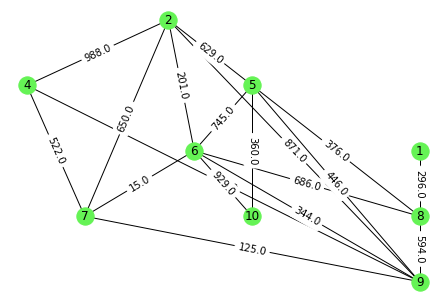

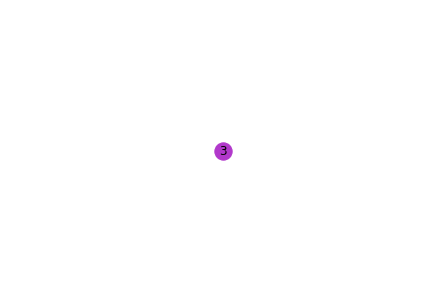

For k = 4
Clusters = [2 0 3 0 1 1 0 1 0 1]
Coditional Entropy = 0.48164799306236983
F Measure = 0.4
The internal traffic for cluster 1 = 3425.0
The emulated traffic between cluster 1 and cluster 2 = 2229.0
The emulated traffic between cluster 1 and cluster 3 = 0.0
The emulated traffic between cluster 1 and cluster 4 = 0.0
The internal traffic for cluster 2 = 3096.0
The emulated traffic between cluster 2 and cluster 3 = 296.0
The emulated traffic between cluster 2 and cluster 4 = 0.0
The internal traffic for cluster 3 = 0.0
The emulated traffic between cluster 3 and cluster 4 = 0.0
The internal traffic for cluster 4 = 0.0
The graph after clustering:


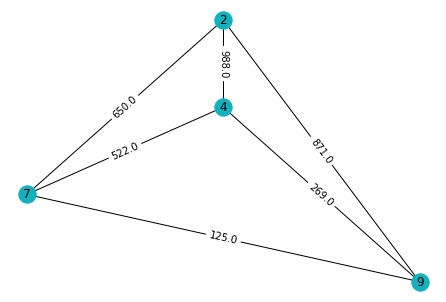

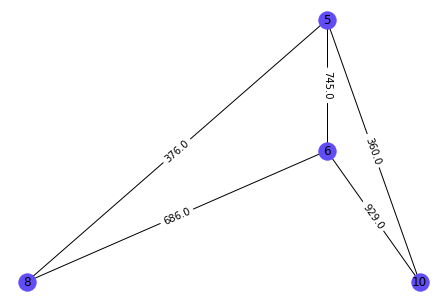

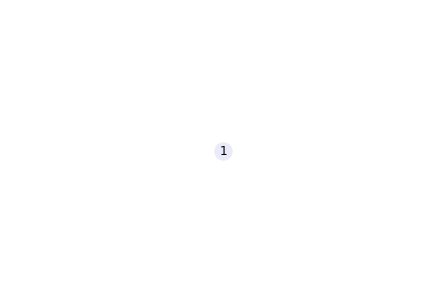

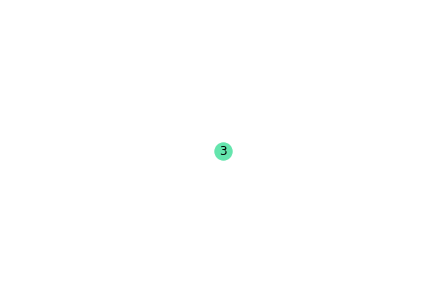

For k = 6
Clusters = [5 0 4 0 1 2 3 1 1 2]
Coditional Entropy = 0.26354837468149117
F Measure = 0.5222222222222221
The internal traffic for cluster 1 = 988.0
The emulated traffic between cluster 1 and cluster 2 = 1769.0
The emulated traffic between cluster 1 and cluster 3 = 201.0
The emulated traffic between cluster 1 and cluster 4 = 1172.0
The emulated traffic between cluster 1 and cluster 5 = 0.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The internal traffic for cluster 2 = 1416.0
The emulated traffic between cluster 2 and cluster 3 = 2135.0
The emulated traffic between cluster 2 and cluster 4 = 125.0
The emulated traffic between cluster 2 and cluster 5 = 0.0
The emulated traffic between cluster 2 and cluster 6 = 296.0
The internal traffic for cluster 3 = 929.0
The emulated traffic between cluster 3 and cluster 4 = 15.0
The emulated traffic between cluster 3 and cluster 5 = 0.0
The emulated traffic between cluster 3 and cluster 6 = 0.0
The internal traffic for cluste

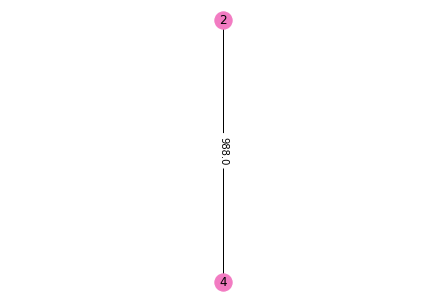

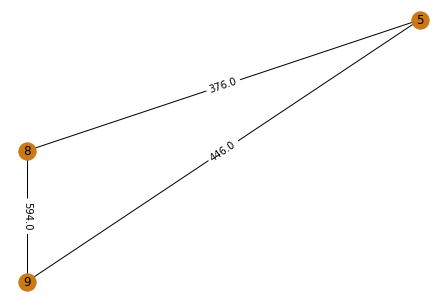

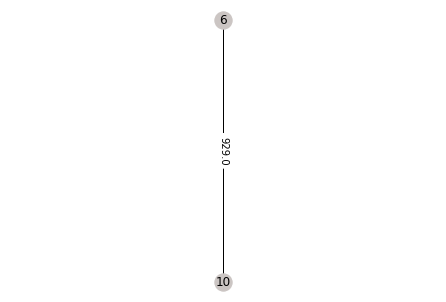

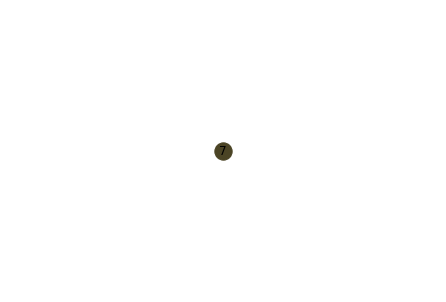

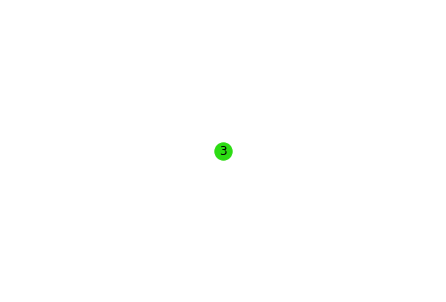

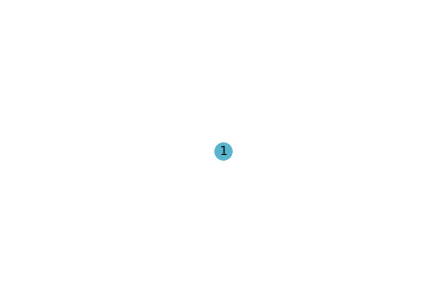

For k = 8
Clusters = [5 2 4 0 3 3 6 1 2 7]
Coditional Entropy = 0.12041199826559246
F Measure = 0.5333333333333333
The internal traffic for cluster 1 = 0.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 1257.0
The emulated traffic between cluster 1 and cluster 4 = 0.0
The emulated traffic between cluster 1 and cluster 5 = 0.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The emulated traffic between cluster 1 and cluster 7 = 522.0
The emulated traffic between cluster 1 and cluster 8 = 0.0
The internal traffic for cluster 2 = 0.0
The emulated traffic between cluster 2 and cluster 3 = 594.0
The emulated traffic between cluster 2 and cluster 4 = 1062.0
The emulated traffic between cluster 2 and cluster 5 = 0.0
The emulated traffic between cluster 2 and cluster 6 = 296.0
The emulated traffic between cluster 2 and cluster 7 = 0.0
The emulated traffic between cluster 2 and cluster 8 = 0.0
The internal traffic for

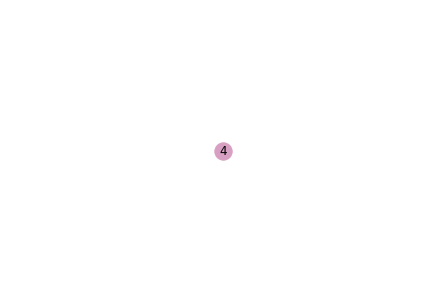

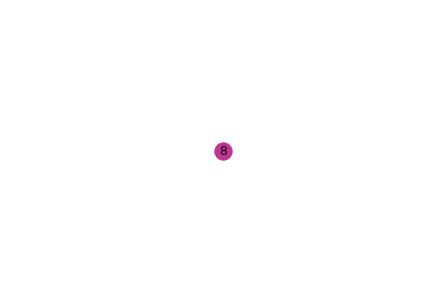

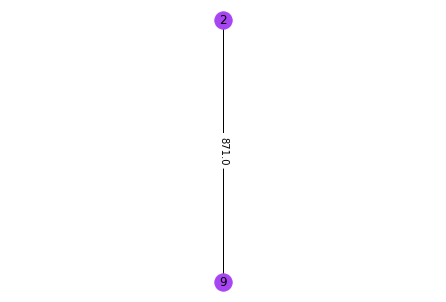

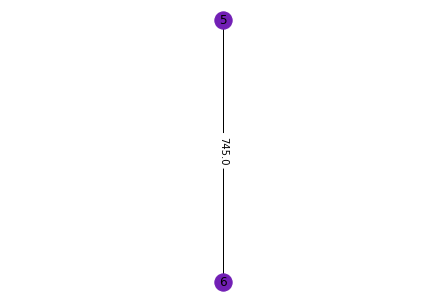

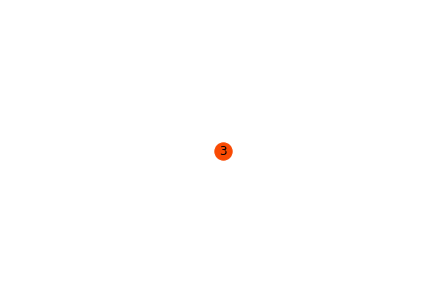

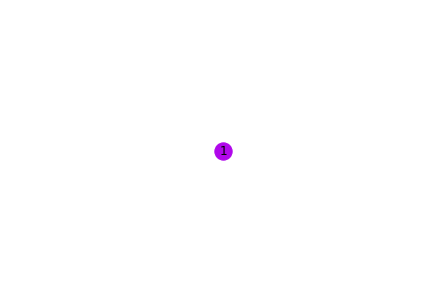

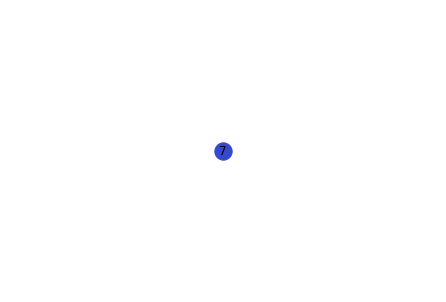

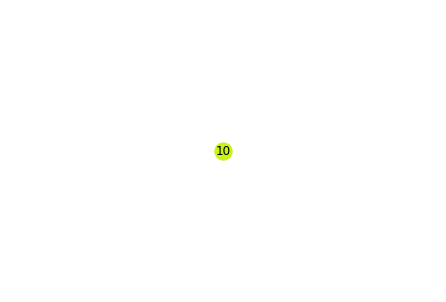

For k = 10
Clusters = [4 9 7 0 8 5 3 6 2 1]
Coditional Entropy = 0.0
F Measure = 0.6266666666666667
The internal traffic for cluster 1 = 0.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 269.0
The emulated traffic between cluster 1 and cluster 4 = 522.0
The emulated traffic between cluster 1 and cluster 5 = 0.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The emulated traffic between cluster 1 and cluster 7 = 0.0
The emulated traffic between cluster 1 and cluster 8 = 0.0
The emulated traffic between cluster 1 and cluster 9 = 0.0
The emulated traffic between cluster 1 and cluster 10 = 988.0
The internal traffic for cluster 2 = 0.0
The emulated traffic between cluster 2 and cluster 3 = 0.0
The emulated traffic between cluster 2 and cluster 4 = 0.0
The emulated traffic between cluster 2 and cluster 5 = 0.0
The emulated traffic between cluster 2 and cluster 6 = 929.0
The emulated traffic between cluster 2 and

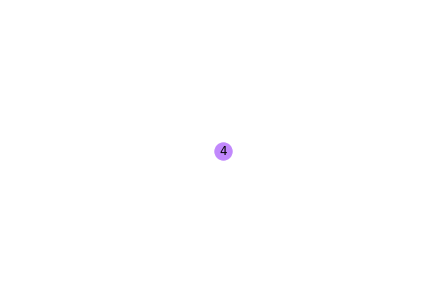

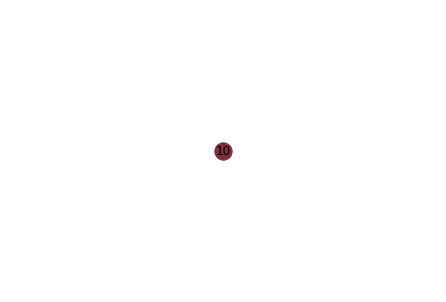

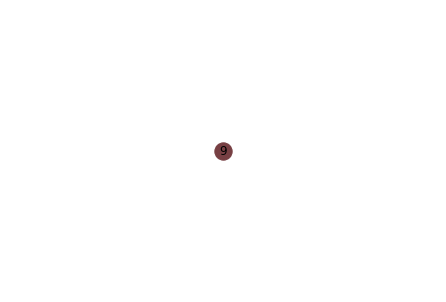

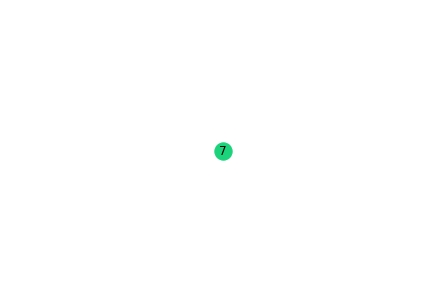

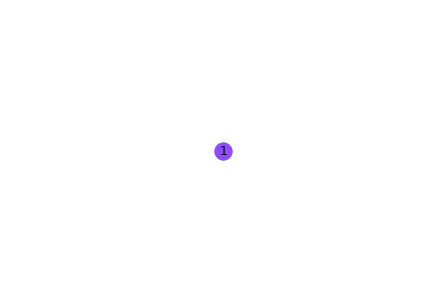

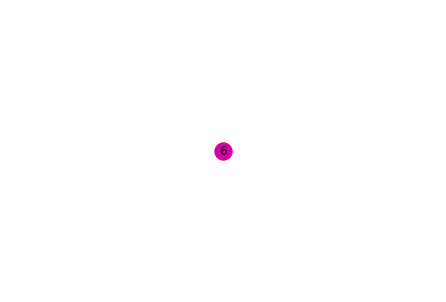

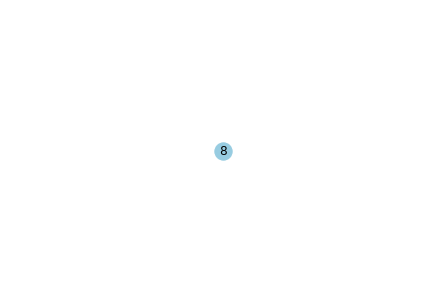

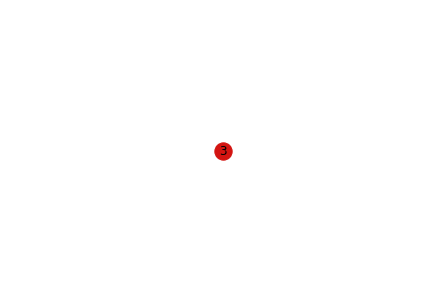

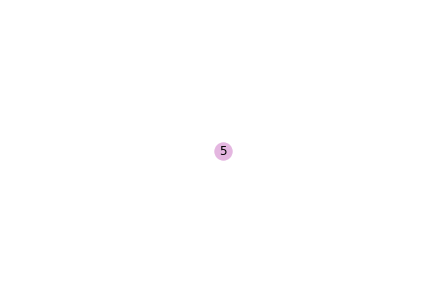

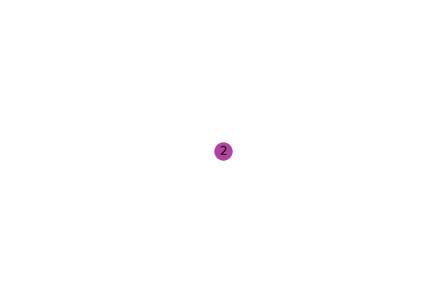

In [ ]:
#nodes = 10
# toplogy 0
example = examples[0]
gt = ground_truth_array[0]
print("Clusters for example 10_0")
for j in K_values_10:
  A = similarity_matrix(example)
  Y = Normalized_cut(A, j)
  cluster_matrix = get_traffic(Y, A)
  print("For k =",j)
  print("Clusters =",Y)
  print("Coditional Entropy =", conditional_entropy(Y, gt))
  print("F Measure =", f_measure(precision(Y, gt), recall(Y, gt)))
  for i in range(cluster_matrix.shape[0]):
    print("The internal traffic for cluster",i+1,"=",cluster_matrix[i,i])
    for k in range(cluster_matrix.shape[0]):
      if (i != k and k > i):
        print("The emulated traffic between cluster", i+1, "and cluster", k+1,"=",cluster_matrix[i][k])
  print("The graph after clustering:")
  visualize_topologies_afterClustering(example, Y)

Clusters for example 10_1
For k = 2
Clusters = [1 1 0 0 1 1 1 1 1 0]
Coditional Entropy = 0.2905386323459986
F Measure = 0.5299145299145298
The internal traffic for cluster 1 = 917.0
The emulated traffic between cluster 1 and cluster 2 = 1206.0
The internal traffic for cluster 2 = 5549.0
The graph after clustering:


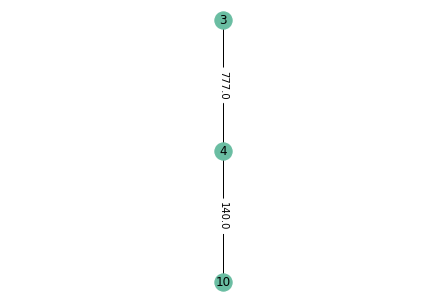

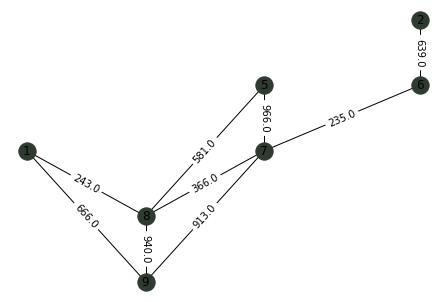

For k = 4
Clusters = [1 2 0 0 3 2 3 1 1 0]
Coditional Entropy = 0.14313637641589871
F Measure = 0.5069444444444444
The internal traffic for cluster 1 = 917.0
The emulated traffic between cluster 1 and cluster 2 = 828.0
The emulated traffic between cluster 1 and cluster 3 = 0.0
The emulated traffic between cluster 1 and cluster 4 = 378.0
The internal traffic for cluster 2 = 1849.0
The emulated traffic between cluster 2 and cluster 3 = 0.0
The emulated traffic between cluster 2 and cluster 4 = 1860.0
The internal traffic for cluster 3 = 639.0
The emulated traffic between cluster 3 and cluster 4 = 235.0
The internal traffic for cluster 4 = 966.0
The graph after clustering:


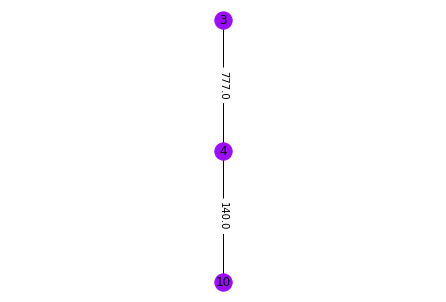

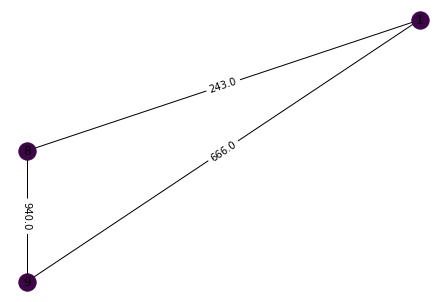

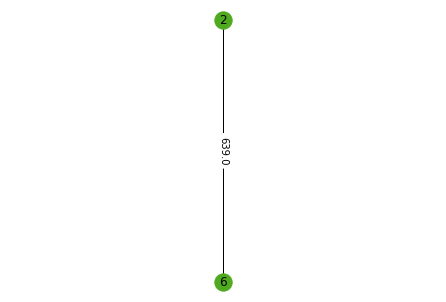

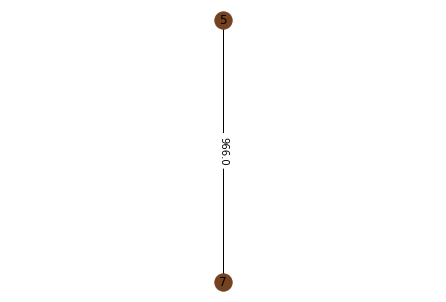

For k = 6
Clusters = [5 2 4 0 1 2 1 3 3 0]
Coditional Entropy = 0.12041199826559246
F Measure = 0.38690476190476186
The internal traffic for cluster 1 = 140.0
The emulated traffic between cluster 1 and cluster 2 = 378.0
The emulated traffic between cluster 1 and cluster 3 = 0.0
The emulated traffic between cluster 1 and cluster 4 = 828.0
The emulated traffic between cluster 1 and cluster 5 = 777.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The internal traffic for cluster 2 = 966.0
The emulated traffic between cluster 2 and cluster 3 = 235.0
The emulated traffic between cluster 2 and cluster 4 = 1860.0
The emulated traffic between cluster 2 and cluster 5 = 0.0
The emulated traffic between cluster 2 and cluster 6 = 0.0
The internal traffic for cluster 3 = 639.0
The emulated traffic between cluster 3 and cluster 4 = 0.0
The emulated traffic between cluster 3 and cluster 5 = 0.0
The emulated traffic between cluster 3 and cluster 6 = 0.0
The internal traffic for cluster 4 =

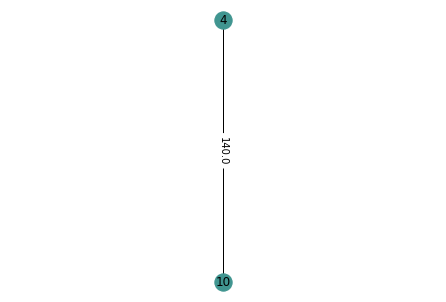

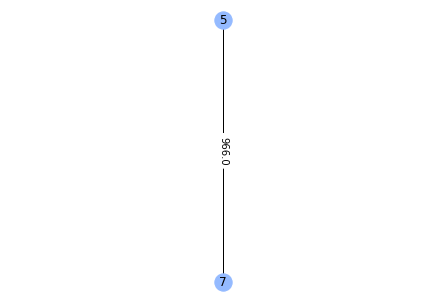

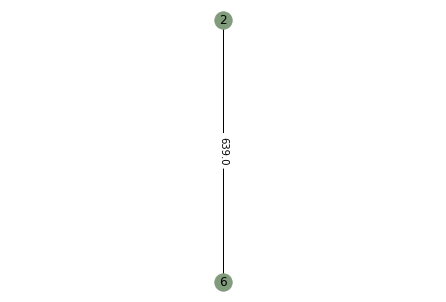

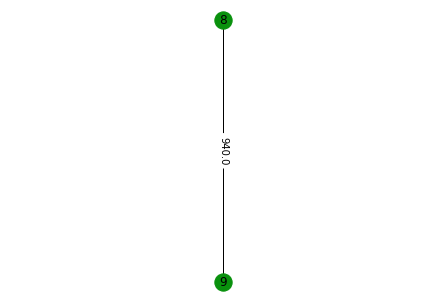

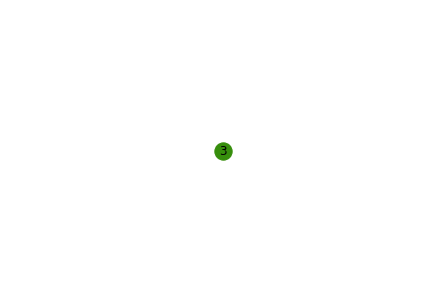

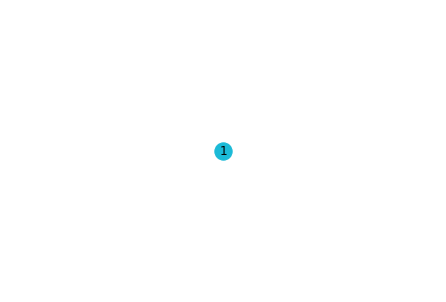

For k = 8
Clusters = [3 1 7 0 4 1 6 5 2 0]
Coditional Entropy = 0.12041199826559246
F Measure = 0.3157738095238095
The internal traffic for cluster 1 = 140.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 0.0
The emulated traffic between cluster 1 and cluster 4 = 0.0
The emulated traffic between cluster 1 and cluster 5 = 378.0
The emulated traffic between cluster 1 and cluster 6 = 828.0
The emulated traffic between cluster 1 and cluster 7 = 0.0
The emulated traffic between cluster 1 and cluster 8 = 777.0
The internal traffic for cluster 2 = 639.0
The emulated traffic between cluster 2 and cluster 3 = 0.0
The emulated traffic between cluster 2 and cluster 4 = 0.0
The emulated traffic between cluster 2 and cluster 5 = 0.0
The emulated traffic between cluster 2 and cluster 6 = 0.0
The emulated traffic between cluster 2 and cluster 7 = 235.0
The emulated traffic between cluster 2 and cluster 8 = 0.0
The internal traffic for

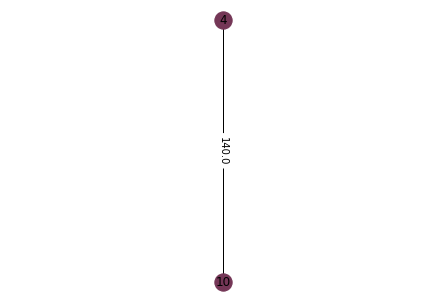

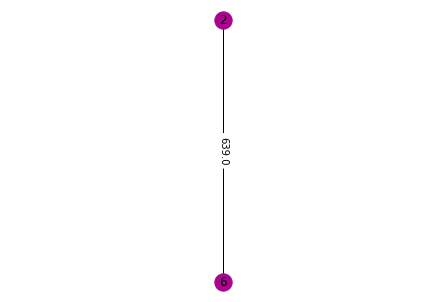

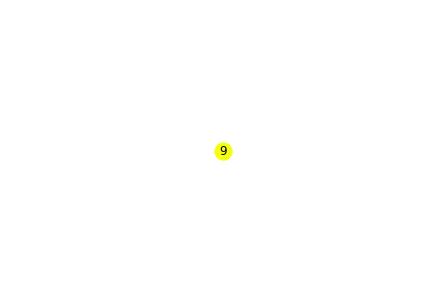

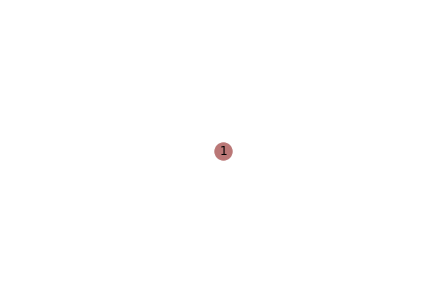

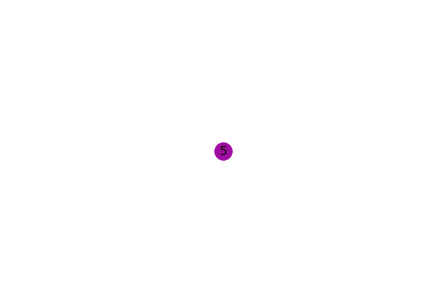

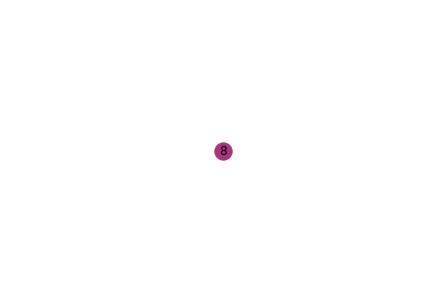

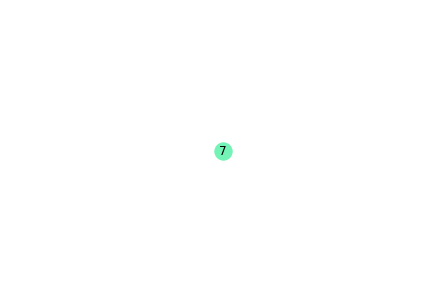

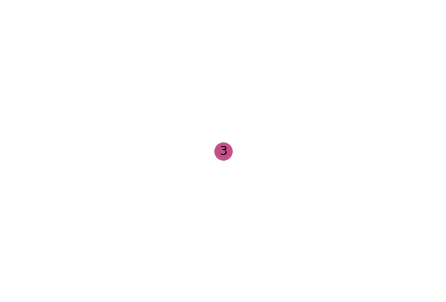

For k = 10
Clusters = [8 4 9 0 7 5 3 1 6 2]
Coditional Entropy = 0.0
F Measure = 0.3314285714285714
The internal traffic for cluster 1 = 0.0
The emulated traffic between cluster 1 and cluster 2 = 828.0
The emulated traffic between cluster 1 and cluster 3 = 140.0
The emulated traffic between cluster 1 and cluster 4 = 0.0
The emulated traffic between cluster 1 and cluster 5 = 0.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The emulated traffic between cluster 1 and cluster 7 = 0.0
The emulated traffic between cluster 1 and cluster 8 = 378.0
The emulated traffic between cluster 1 and cluster 9 = 0.0
The emulated traffic between cluster 1 and cluster 10 = 777.0
The internal traffic for cluster 2 = 0.0
The emulated traffic between cluster 2 and cluster 3 = 0.0
The emulated traffic between cluster 2 and cluster 4 = 366.0
The emulated traffic between cluster 2 and cluster 5 = 0.0
The emulated traffic between cluster 2 and cluster 6 = 0.0
The emulated traffic between cluster 2 a

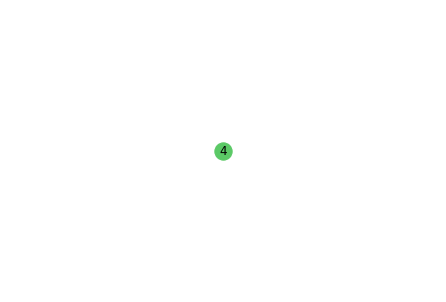

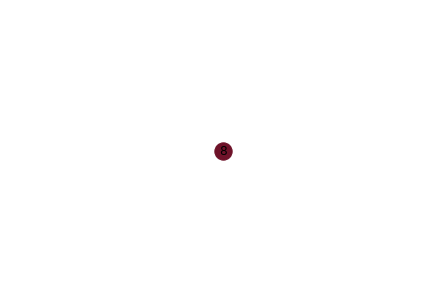

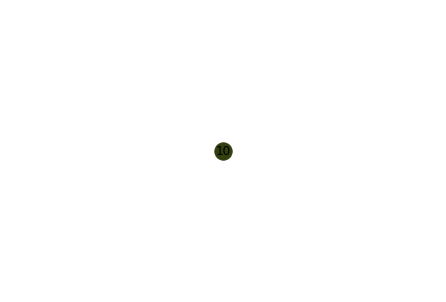

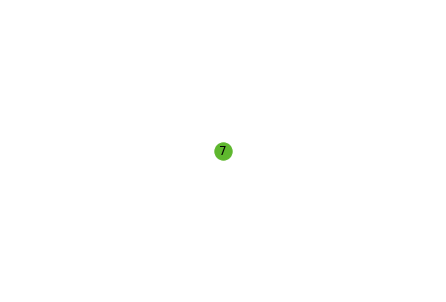

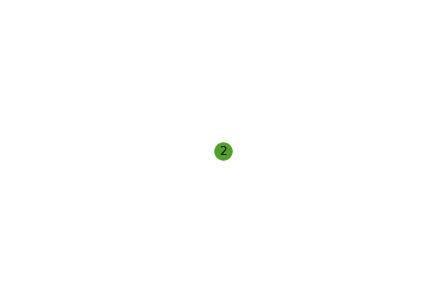

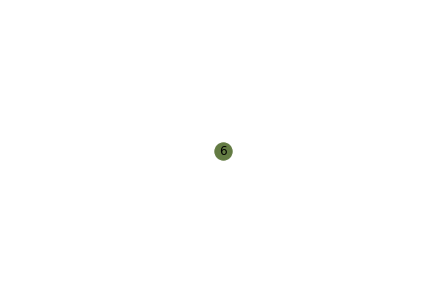

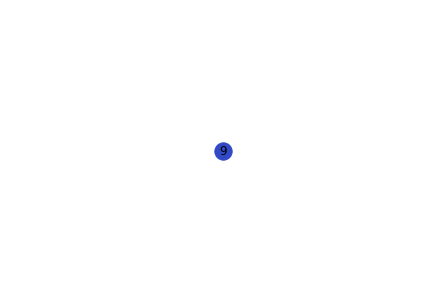

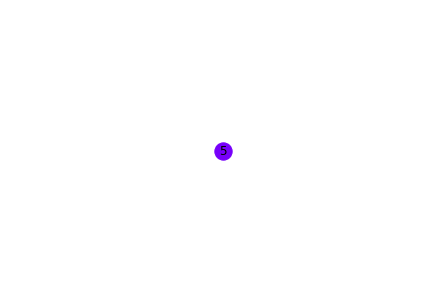

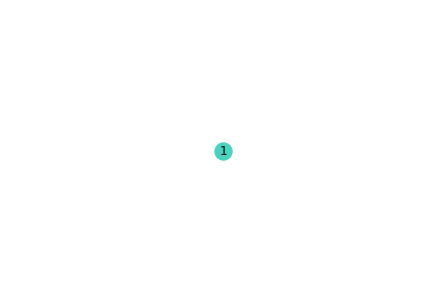

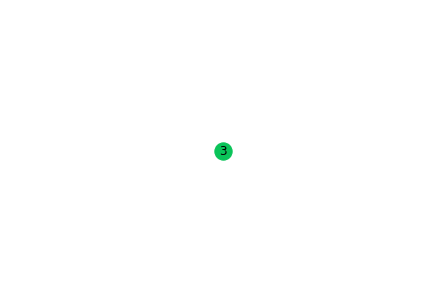

In [ ]:
#nodes = 10
# toplogy 1
example = examples[1]
gt = ground_truth_array[1]
print("Clusters for example 10_1")
for j in K_values_10:
  A = similarity_matrix(example)
  Y = Normalized_cut(A, j)
  cluster_matrix = get_traffic(Y, A)
  print("For k =",j)
  print("Clusters =",Y)
  print("Coditional Entropy =", conditional_entropy(Y, gt))
  print("F Measure =", f_measure(precision(Y, gt), recall(Y, gt)))
  for i in range(cluster_matrix.shape[0]):
    print("The internal traffic for cluster",i+1,"=",cluster_matrix[i,i])
    for k in range(cluster_matrix.shape[0]):
      if (i != k and k > i):
        print("The emulated traffic between cluster", i+1, "and cluster", k+1,"=",cluster_matrix[i][k])
  print("The graph after clustering:")
  visualize_topologies_afterClustering(example, Y)

Clusters for example 10_2
For k = 2
Clusters = [1 1 0 0 0 1 1 0 1 1]
Coditional Entropy = 0.16586075456620497
F Measure = 0.6190476190476191
The internal traffic for cluster 1 = 2653.0
The emulated traffic between cluster 1 and cluster 2 = 1693.0
The internal traffic for cluster 2 = 5472.0
The graph after clustering:


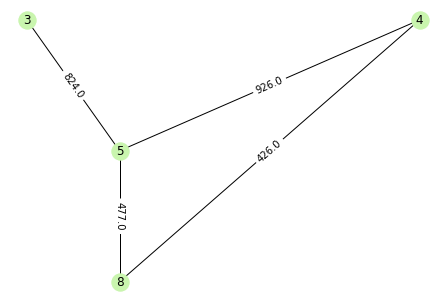

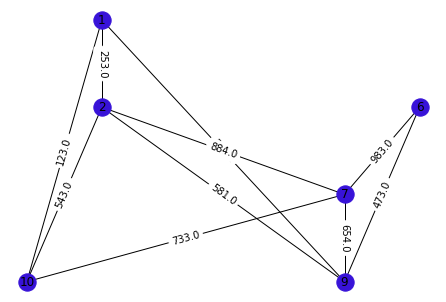

For k = 4
Clusters = [1 1 0 0 0 3 2 2 3 2]
Coditional Entropy = 0.14313637641589871
F Measure = 0.45227272727272727
The internal traffic for cluster 1 = 1750.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 1012.0
The emulated traffic between cluster 1 and cluster 4 = 191.0
The internal traffic for cluster 2 = 253.0
The emulated traffic between cluster 2 and cluster 3 = 1550.0
The emulated traffic between cluster 2 and cluster 4 = 826.0
The internal traffic for cluster 3 = 1584.0
The emulated traffic between cluster 3 and cluster 4 = 2179.0
The internal traffic for cluster 4 = 473.0
The graph after clustering:


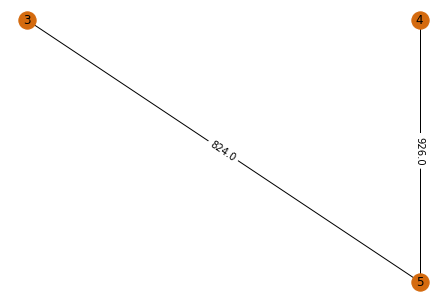

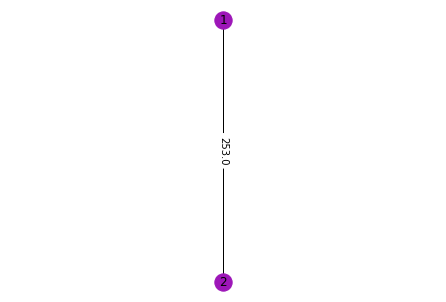

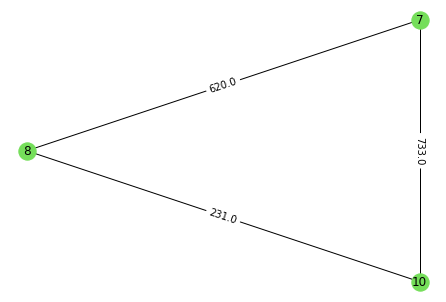

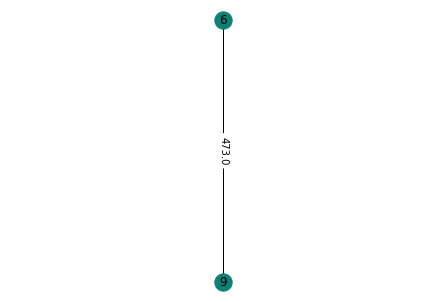

For k = 6
Clusters = [2 4 3 0 0 5 1 5 4 1]
Coditional Entropy = 0.12041199826559246
F Measure = 0.37407407407407406
The internal traffic for cluster 1 = 926.0
The emulated traffic between cluster 1 and cluster 2 = 75.0
The emulated traffic between cluster 1 and cluster 3 = 0.0
The emulated traffic between cluster 1 and cluster 4 = 824.0
The emulated traffic between cluster 1 and cluster 5 = 0.0
The emulated traffic between cluster 1 and cluster 6 = 903.0
The internal traffic for cluster 2 = 733.0
The emulated traffic between cluster 2 and cluster 3 = 123.0
The emulated traffic between cluster 2 and cluster 4 = 34.0
The emulated traffic between cluster 2 and cluster 5 = 2081.0
The emulated traffic between cluster 2 and cluster 6 = 1834.0
The internal traffic for cluster 3 = 0.0
The emulated traffic between cluster 3 and cluster 4 = 0.0
The emulated traffic between cluster 3 and cluster 5 = 498.0
The emulated traffic between cluster 3 and cluster 6 = 0.0
The internal traffic for cluster 

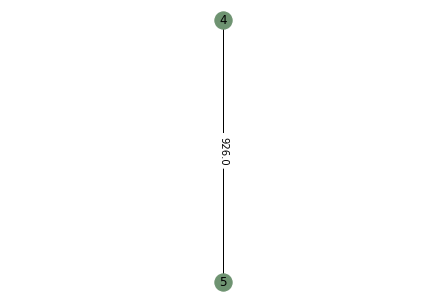

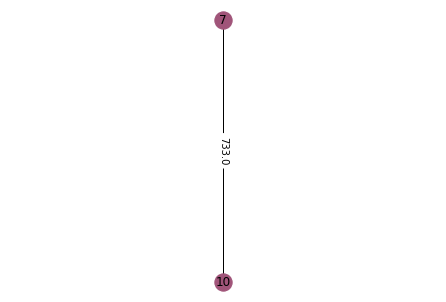

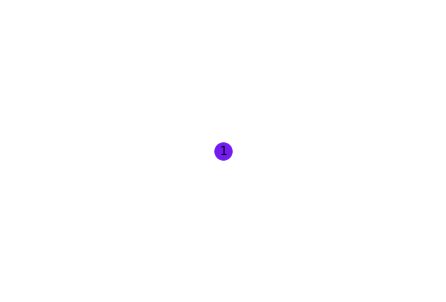

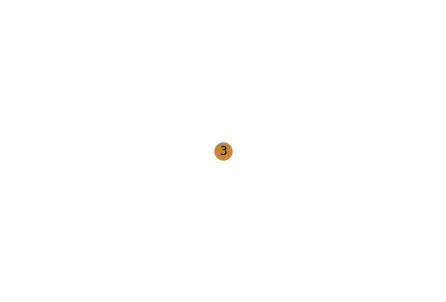

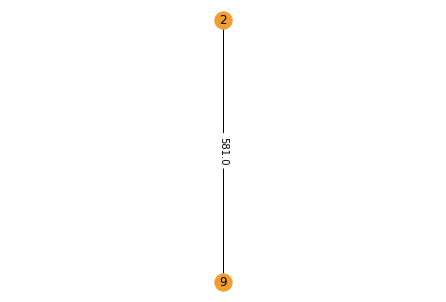

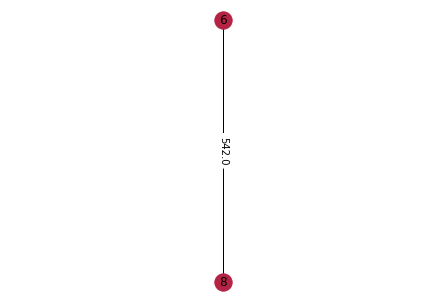

For k = 8
Clusters = [4 2 5 0 5 3 1 6 7 1]
Coditional Entropy = 0.06020599913279623
F Measure = 0.33472222222222225
The internal traffic for cluster 1 = 0.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 0.0
The emulated traffic between cluster 1 and cluster 4 = 0.0
The emulated traffic between cluster 1 and cluster 5 = 0.0
The emulated traffic between cluster 1 and cluster 6 = 926.0
The emulated traffic between cluster 1 and cluster 7 = 426.0
The emulated traffic between cluster 1 and cluster 8 = 0.0
The internal traffic for cluster 2 = 733.0
The emulated traffic between cluster 2 and cluster 3 = 1427.0
The emulated traffic between cluster 2 and cluster 4 = 983.0
The emulated traffic between cluster 2 and cluster 5 = 123.0
The emulated traffic between cluster 2 and cluster 6 = 109.0
The emulated traffic between cluster 2 and cluster 7 = 851.0
The emulated traffic between cluster 2 and cluster 8 = 654.0
The internal tra

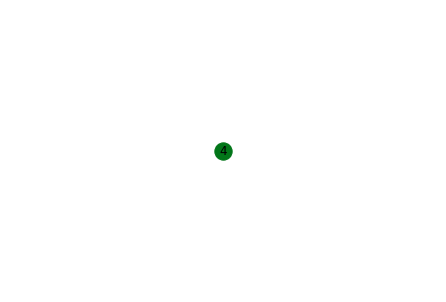

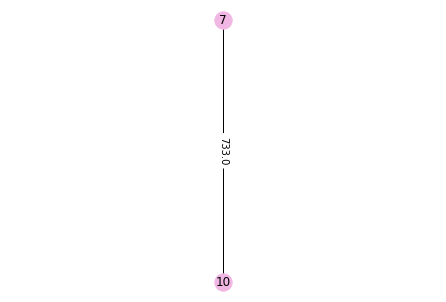

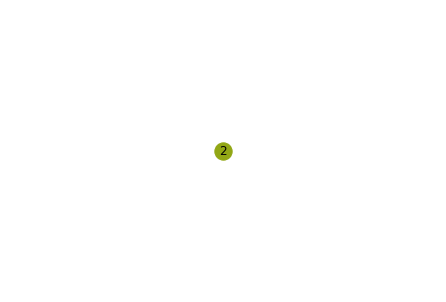

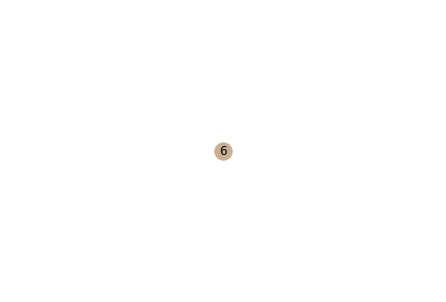

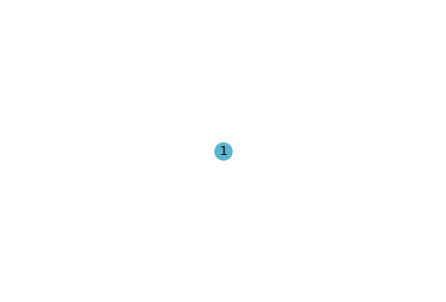

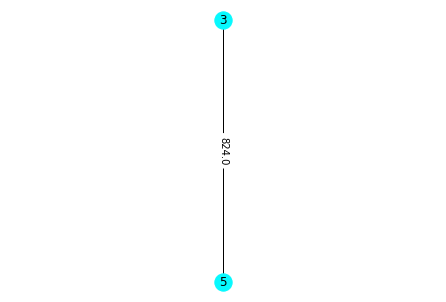

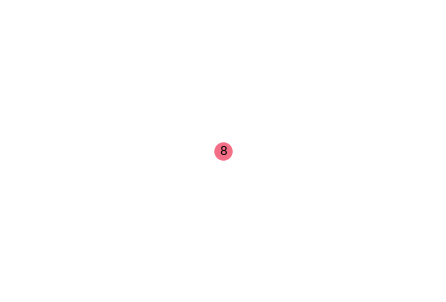

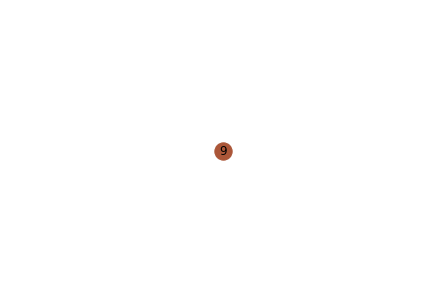

For k = 10
Clusters = [3 7 9 0 8 5 6 1 4 2]
Coditional Entropy = 0.0
F Measure = 0.3111111111111111
The internal traffic for cluster 1 = 0.0
The emulated traffic between cluster 1 and cluster 2 = 426.0
The emulated traffic between cluster 1 and cluster 3 = 0.0
The emulated traffic between cluster 1 and cluster 4 = 0.0
The emulated traffic between cluster 1 and cluster 5 = 0.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The emulated traffic between cluster 1 and cluster 7 = 0.0
The emulated traffic between cluster 1 and cluster 8 = 0.0
The emulated traffic between cluster 1 and cluster 9 = 926.0
The emulated traffic between cluster 1 and cluster 10 = 0.0
The internal traffic for cluster 2 = 0.0
The emulated traffic between cluster 2 and cluster 3 = 231.0
The emulated traffic between cluster 2 and cluster 4 = 0.0
The emulated traffic between cluster 2 and cluster 5 = 0.0
The emulated traffic between cluster 2 and cluster 6 = 542.0
The emulated traffic between cluster 2 and

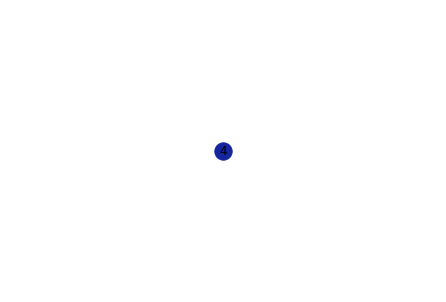

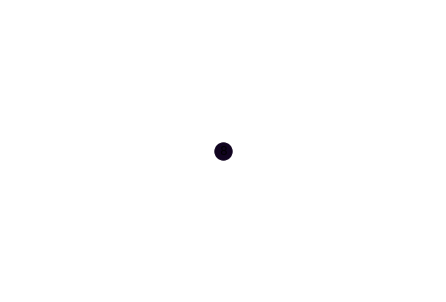

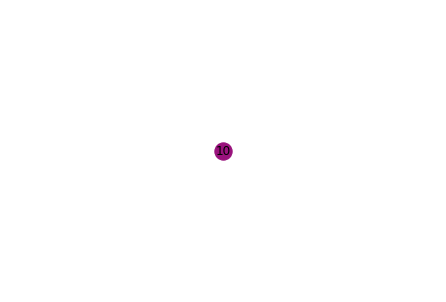

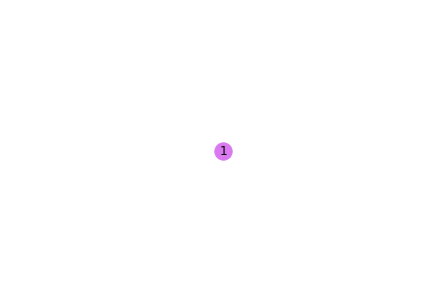

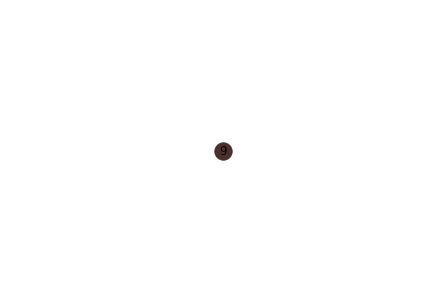

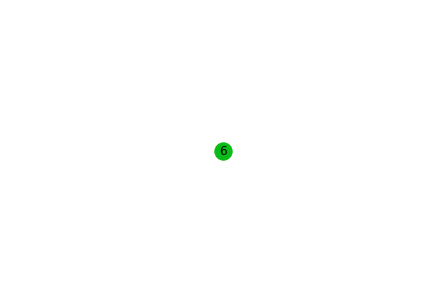

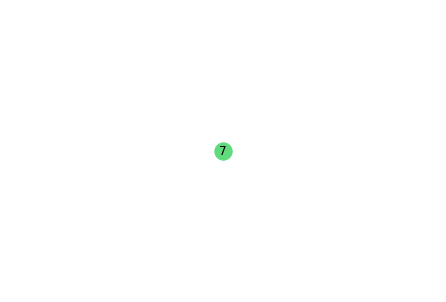

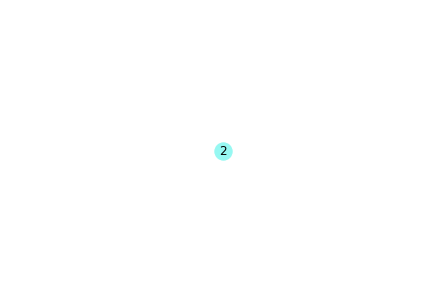

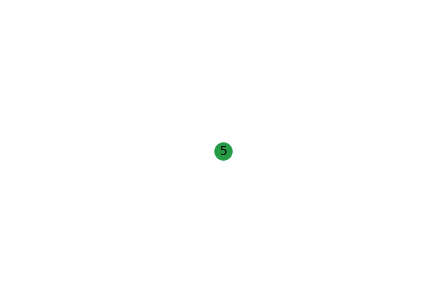

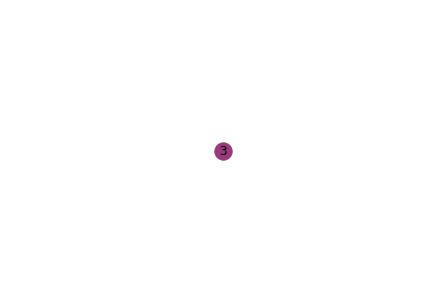

In [ ]:
#nodes = 10
# toplogy 2
example = examples[2]
gt = ground_truth_array[2]
print("Clusters for example 10_2")
for j in K_values_10:
  A = similarity_matrix(example)
  Y = Normalized_cut(A, j)
  cluster_matrix = get_traffic(Y, A)
  print("For k =",j)
  print("Clusters =",Y)
  print("Coditional Entropy =", conditional_entropy(Y, gt))
  print("F Measure =", f_measure(precision(Y, gt), recall(Y, gt)))
  for i in range(cluster_matrix.shape[0]):
    print("The internal traffic for cluster",i+1,"=",cluster_matrix[i,i])
    for k in range(cluster_matrix.shape[0]):
      if (i != k and k > i):
        print("The emulated traffic between cluster", i+1, "and cluster", k+1,"=",cluster_matrix[i][k])
  print("The graph after clustering:")
  visualize_topologies_afterClustering(example, Y)

Clusters for example 10_3
For k = 2
Clusters = [0 0 0 0 0 0 0 1 1 0]
Coditional Entropy = 0.29005661014244294
F Measure = 0.48214285714285715
The internal traffic for cluster 1 = 6353.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The internal traffic for cluster 2 = 163.0
The graph after clustering:


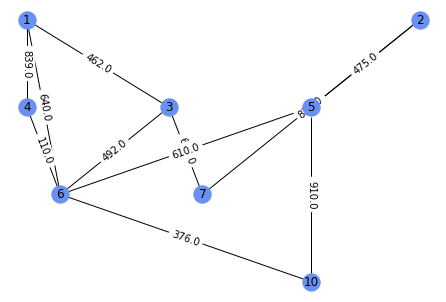

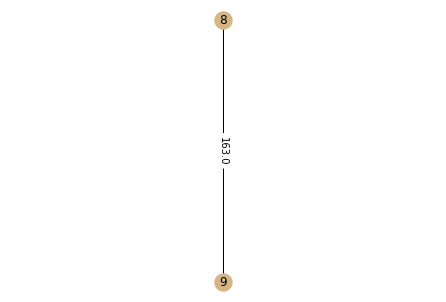

For k = 4
Clusters = [0 2 2 0 1 1 2 3 3 1]
Coditional Entropy = 0.2260667536990012
F Measure = 0.441468253968254
The internal traffic for cluster 1 = 839.0
The emulated traffic between cluster 1 and cluster 2 = 750.0
The emulated traffic between cluster 1 and cluster 3 = 462.0
The emulated traffic between cluster 1 and cluster 4 = 0.0
The internal traffic for cluster 2 = 1896.0
The emulated traffic between cluster 2 and cluster 3 = 967.0
The emulated traffic between cluster 2 and cluster 4 = 0.0
The internal traffic for cluster 3 = 1439.0
The emulated traffic between cluster 3 and cluster 4 = 0.0
The internal traffic for cluster 4 = 163.0
The graph after clustering:


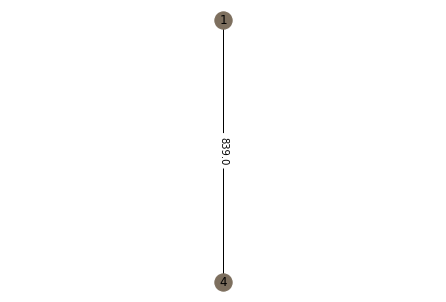

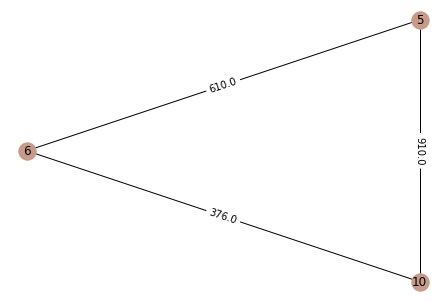

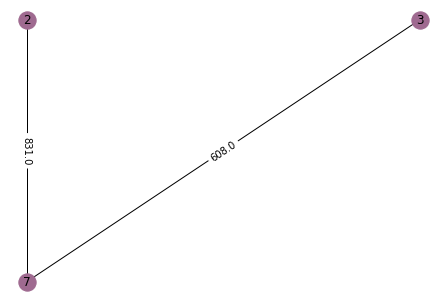

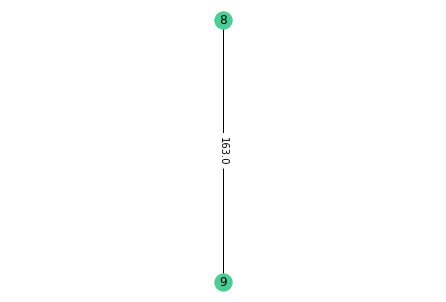

For k = 6
Clusters = [0 1 5 0 3 4 1 2 2 3]
Coditional Entropy = 0.12041199826559246
F Measure = 0.3833333333333333
The internal traffic for cluster 1 = 839.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 0.0
The emulated traffic between cluster 1 and cluster 4 = 0.0
The emulated traffic between cluster 1 and cluster 5 = 750.0
The emulated traffic between cluster 1 and cluster 6 = 462.0
The internal traffic for cluster 2 = 831.0
The emulated traffic between cluster 2 and cluster 3 = 0.0
The emulated traffic between cluster 2 and cluster 4 = 475.0
The emulated traffic between cluster 2 and cluster 5 = 0.0
The emulated traffic between cluster 2 and cluster 6 = 608.0
The internal traffic for cluster 3 = 163.0
The emulated traffic between cluster 3 and cluster 4 = 0.0
The emulated traffic between cluster 3 and cluster 5 = 0.0
The emulated traffic between cluster 3 and cluster 6 = 0.0
The internal traffic for cluster 4 = 910

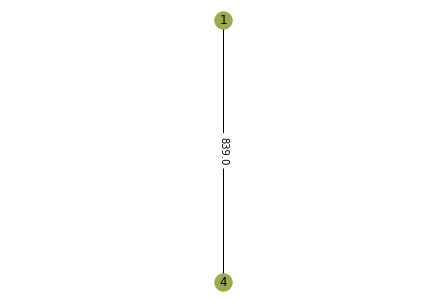

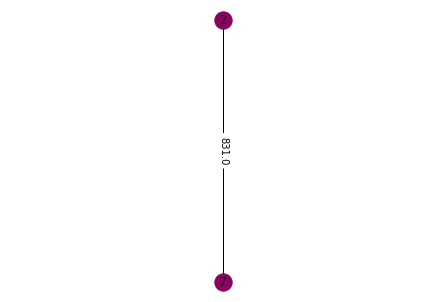

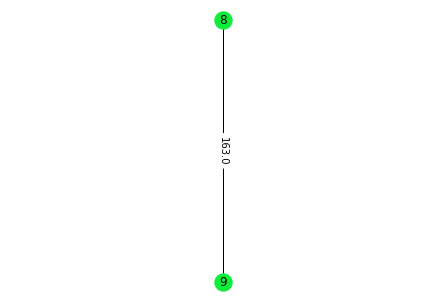

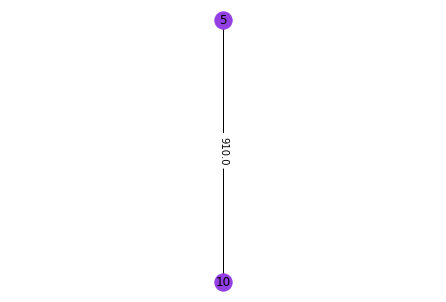

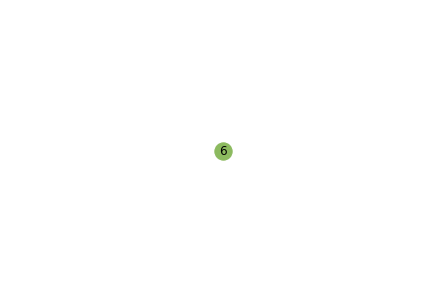

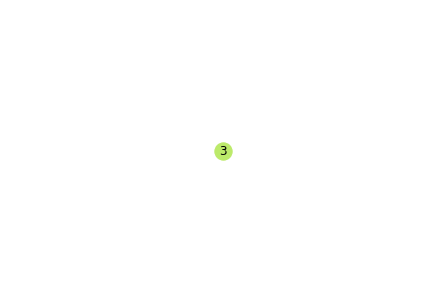

For k = 8
Clusters = [0 4 5 0 6 3 7 1 1 2]
Coditional Entropy = 0.06020599913279623
F Measure = 0.3508928571428571
The internal traffic for cluster 1 = 839.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 0.0
The emulated traffic between cluster 1 and cluster 4 = 750.0
The emulated traffic between cluster 1 and cluster 5 = 0.0
The emulated traffic between cluster 1 and cluster 6 = 462.0
The emulated traffic between cluster 1 and cluster 7 = 0.0
The emulated traffic between cluster 1 and cluster 8 = 0.0
The internal traffic for cluster 2 = 163.0
The emulated traffic between cluster 2 and cluster 3 = 0.0
The emulated traffic between cluster 2 and cluster 4 = 0.0
The emulated traffic between cluster 2 and cluster 5 = 0.0
The emulated traffic between cluster 2 and cluster 6 = 0.0
The emulated traffic between cluster 2 and cluster 7 = 0.0
The emulated traffic between cluster 2 and cluster 8 = 0.0
The internal traffic for clu

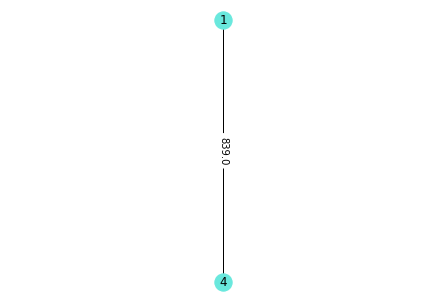

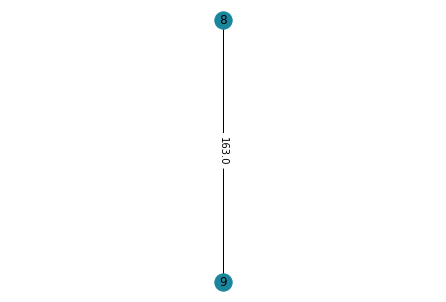

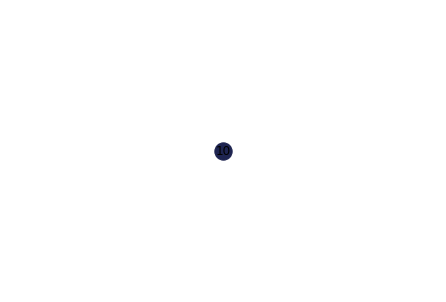

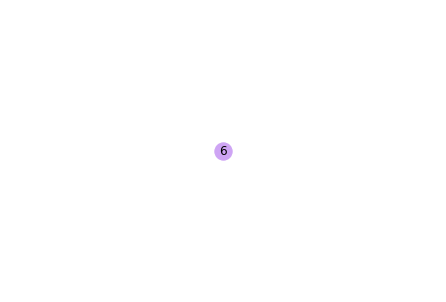

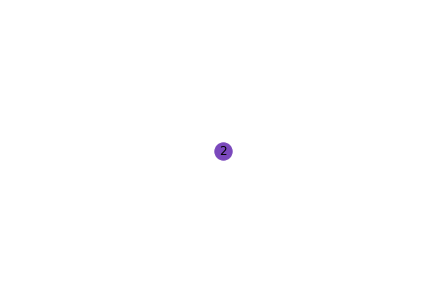

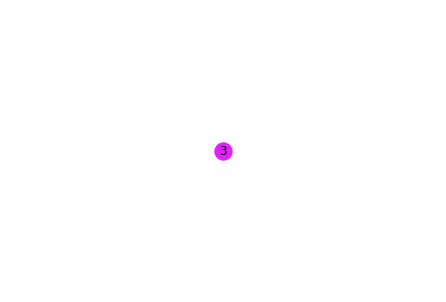

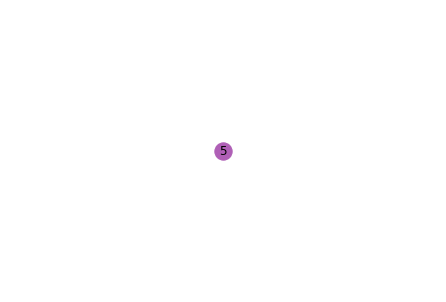

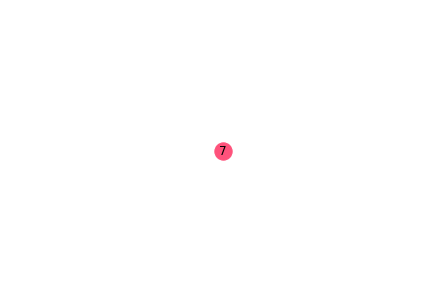

For k = 10
Clusters = [6 4 7 0 8 9 3 5 2 1]
Coditional Entropy = 0.0
F Measure = 0.3314285714285714
The internal traffic for cluster 1 = 0.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 0.0
The emulated traffic between cluster 1 and cluster 4 = 0.0
The emulated traffic between cluster 1 and cluster 5 = 0.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The emulated traffic between cluster 1 and cluster 7 = 839.0
The emulated traffic between cluster 1 and cluster 8 = 0.0
The emulated traffic between cluster 1 and cluster 9 = 0.0
The emulated traffic between cluster 1 and cluster 10 = 110.0
The internal traffic for cluster 2 = 0.0
The emulated traffic between cluster 2 and cluster 3 = 0.0
The emulated traffic between cluster 2 and cluster 4 = 0.0
The emulated traffic between cluster 2 and cluster 5 = 0.0
The emulated traffic between cluster 2 and cluster 6 = 0.0
The emulated traffic between cluster 2 and clu

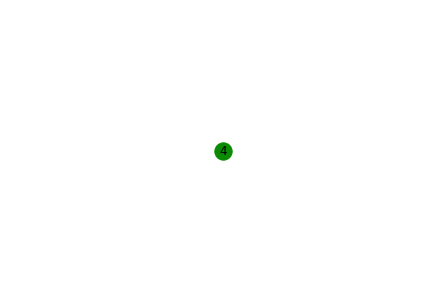

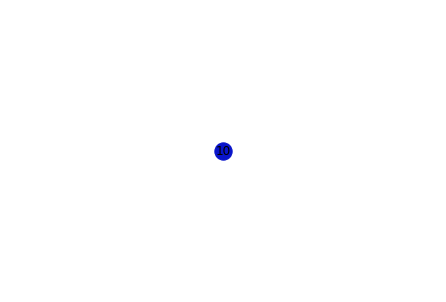

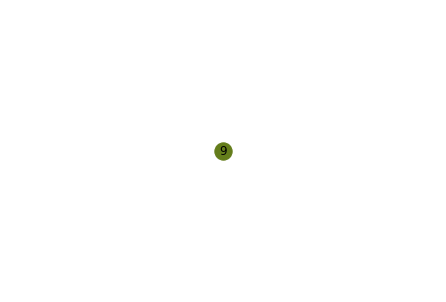

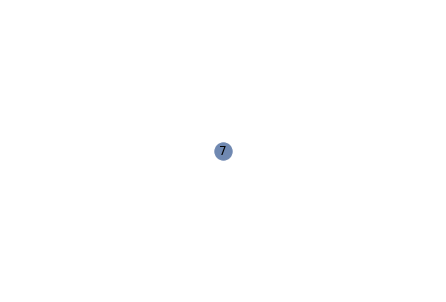

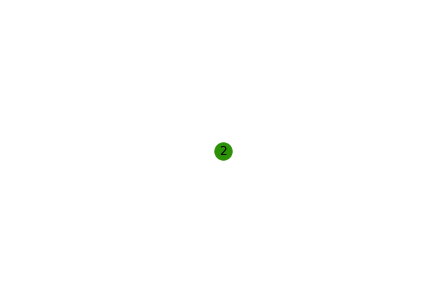

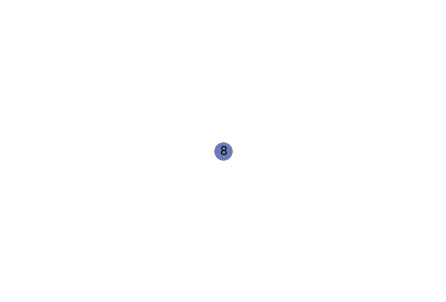

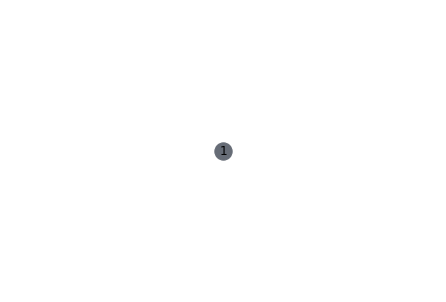

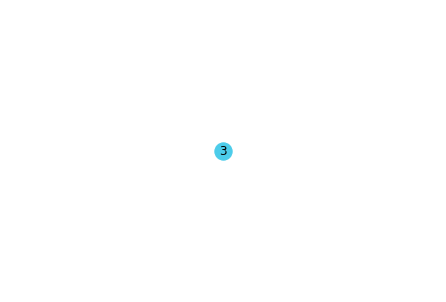

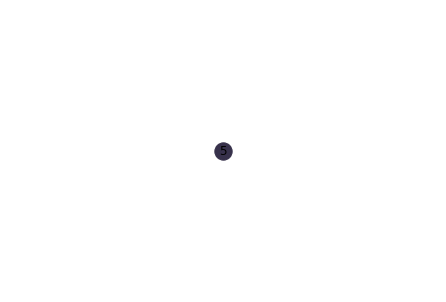

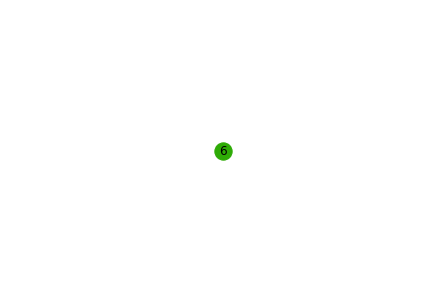

In [ ]:
#nodes = 10
# toplogy 3
example = examples[3]
gt = ground_truth_array[3]
print("Clusters for example 10_3")
for j in K_values_10:
  A = similarity_matrix(example)
  Y = Normalized_cut(A, j)
  cluster_matrix = get_traffic(Y, A)
  print("For k =",j)
  print("Clusters =",Y)
  print("Coditional Entropy =", conditional_entropy(Y, gt))
  print("F Measure =", f_measure(precision(Y, gt), recall(Y, gt)))
  for i in range(cluster_matrix.shape[0]):
    print("The internal traffic for cluster",i+1,"=",cluster_matrix[i,i])
    for k in range(cluster_matrix.shape[0]):
      if (i != k and k > i):
        print("The emulated traffic between cluster", i+1, "and cluster", k+1,"=",cluster_matrix[i][k])
  print("The graph after clustering:")
  visualize_topologies_afterClustering(example, Y)

Clusters for example 10_4
For k = 2
Clusters = [1 0 0 0 0 0 0 0 1 0]
Coditional Entropy = 0.5191296140448598
F Measure = 0.5227272727272727
The internal traffic for cluster 1 = 6483.0
The emulated traffic between cluster 1 and cluster 2 = 1163.0
The internal traffic for cluster 2 = 946.0
The graph after clustering:


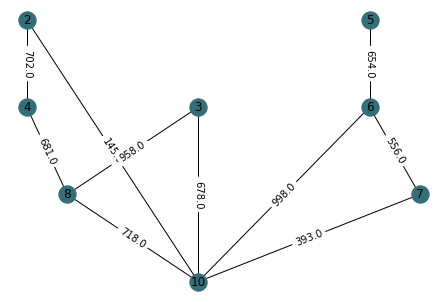

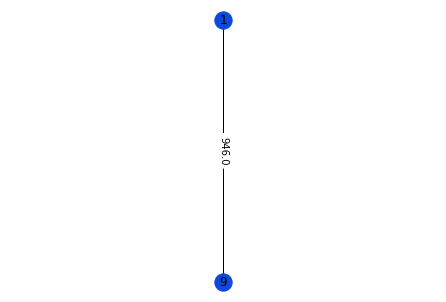

For k = 4
Clusters = [2 0 1 0 3 3 3 1 2 1]
Coditional Entropy = 0.34647875196459366
F Measure = 0.475
The internal traffic for cluster 1 = 702.0
The emulated traffic between cluster 1 and cluster 2 = 826.0
The emulated traffic between cluster 1 and cluster 3 = 0.0
The emulated traffic between cluster 1 and cluster 4 = 0.0
The internal traffic for cluster 2 = 2354.0
The emulated traffic between cluster 2 and cluster 3 = 374.0
The emulated traffic between cluster 2 and cluster 4 = 1391.0
The internal traffic for cluster 3 = 946.0
The emulated traffic between cluster 3 and cluster 4 = 789.0
The internal traffic for cluster 4 = 1210.0
The graph after clustering:


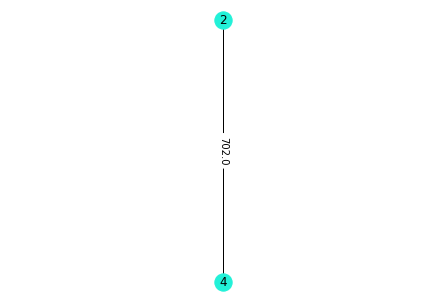

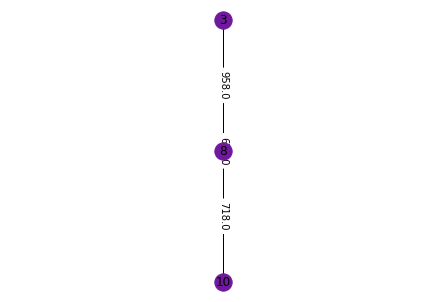

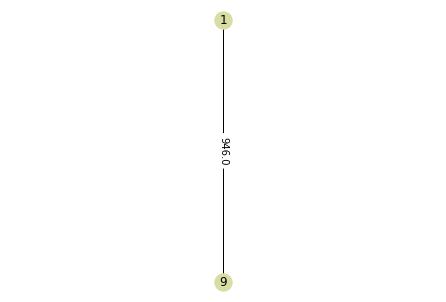

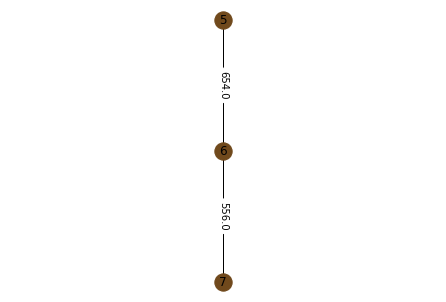

For k = 6
Clusters = [2 0 3 0 4 1 1 3 2 5]
Coditional Entropy = 0.24082399653118491
F Measure = 0.4777777777777778
The internal traffic for cluster 1 = 702.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 0.0
The emulated traffic between cluster 1 and cluster 4 = 681.0
The emulated traffic between cluster 1 and cluster 5 = 0.0
The emulated traffic between cluster 1 and cluster 6 = 145.0
The internal traffic for cluster 2 = 556.0
The emulated traffic between cluster 2 and cluster 3 = 789.0
The emulated traffic between cluster 2 and cluster 4 = 0.0
The emulated traffic between cluster 2 and cluster 5 = 654.0
The emulated traffic between cluster 2 and cluster 6 = 1391.0
The internal traffic for cluster 3 = 946.0
The emulated traffic between cluster 3 and cluster 4 = 374.0
The emulated traffic between cluster 3 and cluster 5 = 0.0
The emulated traffic between cluster 3 and cluster 6 = 0.0
The internal traffic for cluster 4 

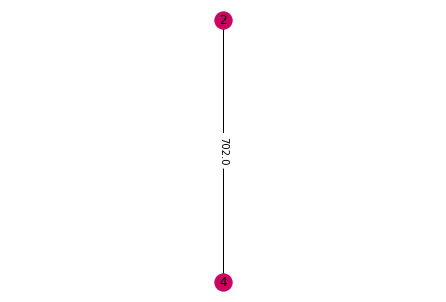

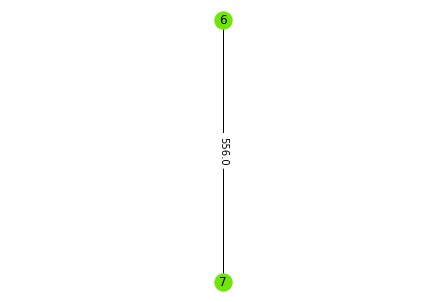

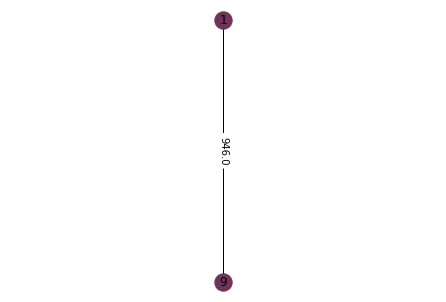

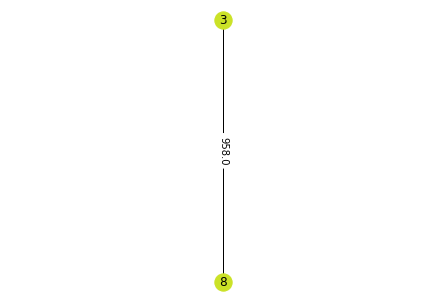

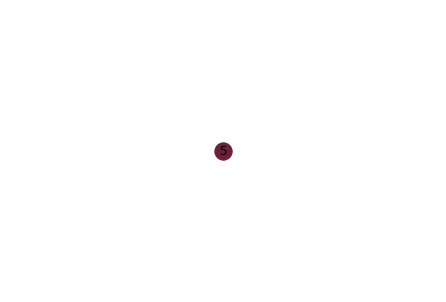

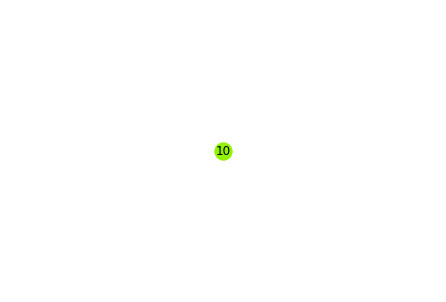

For k = 8
Clusters = [2 7 6 0 5 1 1 3 2 4]
Coditional Entropy = 0.12041199826559246
F Measure = 0.5291666666666666
The internal traffic for cluster 1 = 0.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 0.0
The emulated traffic between cluster 1 and cluster 4 = 681.0
The emulated traffic between cluster 1 and cluster 5 = 0.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The emulated traffic between cluster 1 and cluster 7 = 0.0
The emulated traffic between cluster 1 and cluster 8 = 702.0
The internal traffic for cluster 2 = 556.0
The emulated traffic between cluster 2 and cluster 3 = 789.0
The emulated traffic between cluster 2 and cluster 4 = 0.0
The emulated traffic between cluster 2 and cluster 5 = 1391.0
The emulated traffic between cluster 2 and cluster 6 = 654.0
The emulated traffic between cluster 2 and cluster 7 = 0.0
The emulated traffic between cluster 2 and cluster 8 = 0.0
The internal traffic fo

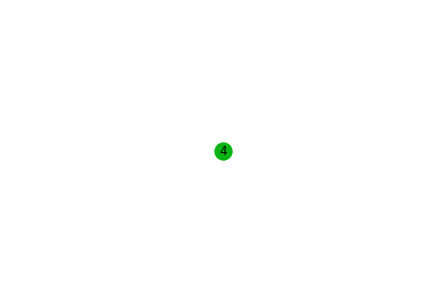

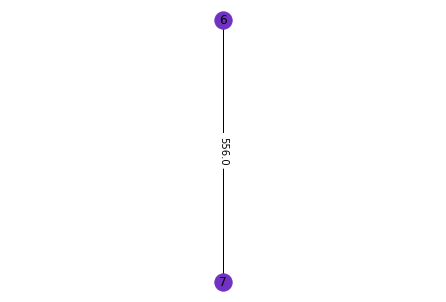

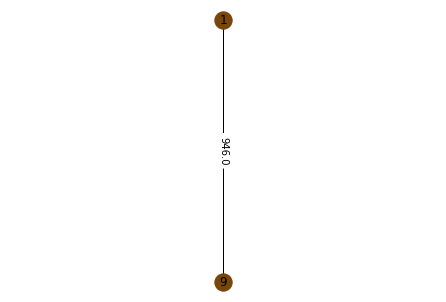

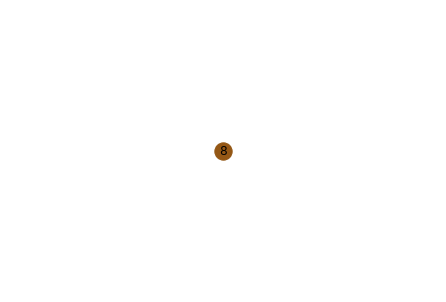

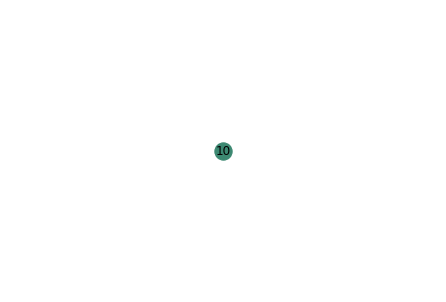

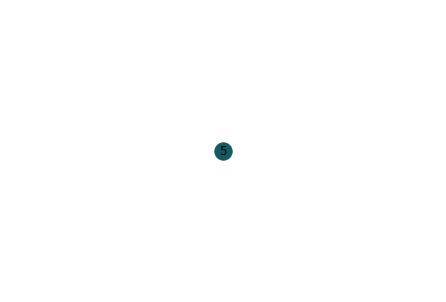

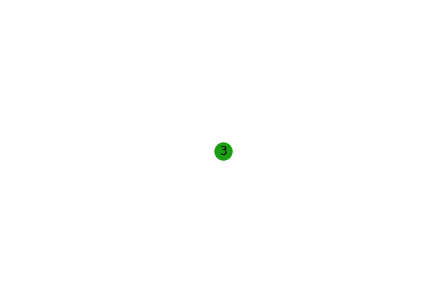

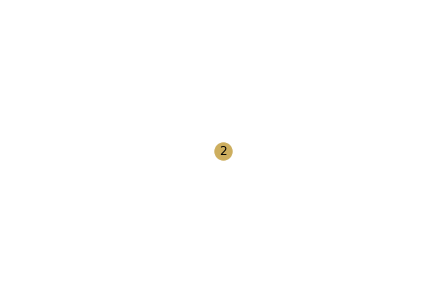

For k = 10
Clusters = [6 4 7 0 8 5 3 9 2 1]
Coditional Entropy = 0.0
F Measure = 0.5666666666666667
The internal traffic for cluster 1 = 0.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 0.0
The emulated traffic between cluster 1 and cluster 4 = 0.0
The emulated traffic between cluster 1 and cluster 5 = 702.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The emulated traffic between cluster 1 and cluster 7 = 0.0
The emulated traffic between cluster 1 and cluster 8 = 0.0
The emulated traffic between cluster 1 and cluster 9 = 0.0
The emulated traffic between cluster 1 and cluster 10 = 681.0
The internal traffic for cluster 2 = 0.0
The emulated traffic between cluster 2 and cluster 3 = 0.0
The emulated traffic between cluster 2 and cluster 4 = 393.0
The emulated traffic between cluster 2 and cluster 5 = 145.0
The emulated traffic between cluster 2 and cluster 6 = 998.0
The emulated traffic between cluster 2 a

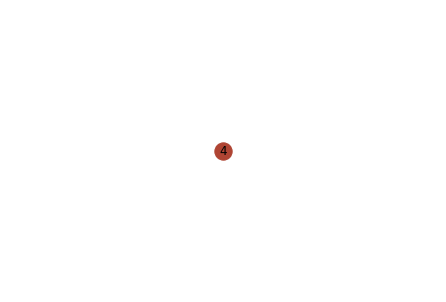

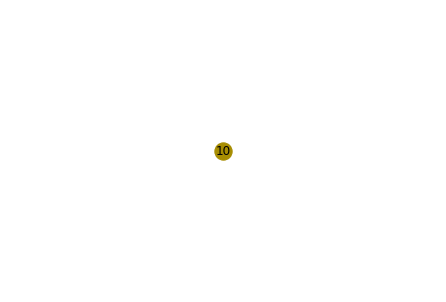

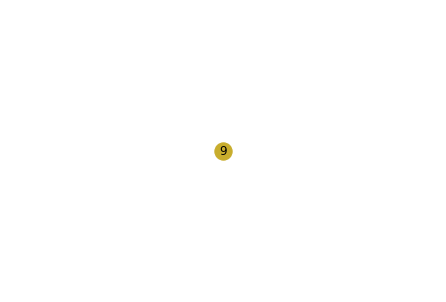

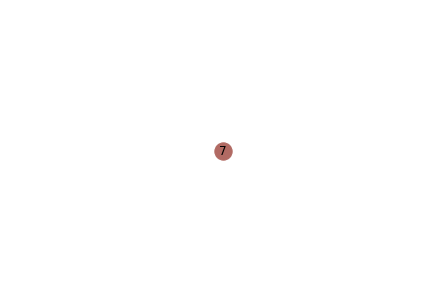

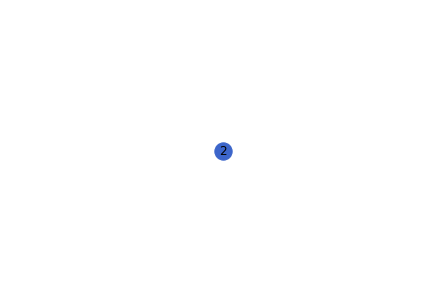

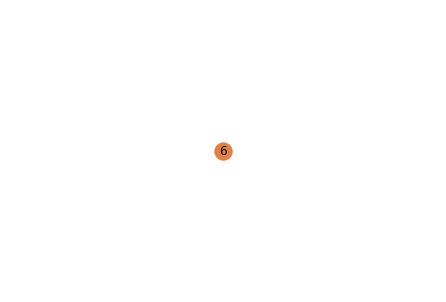

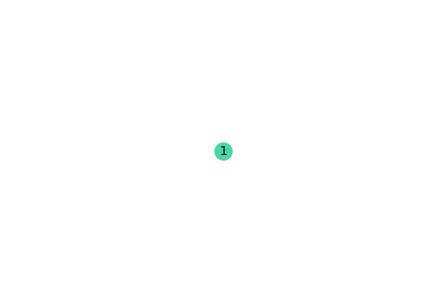

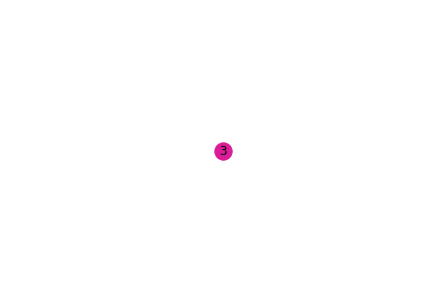

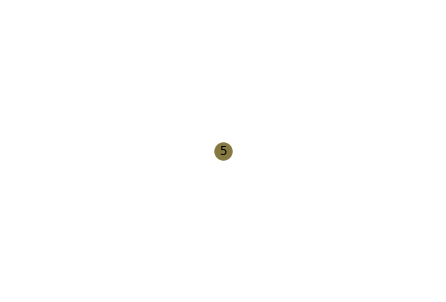

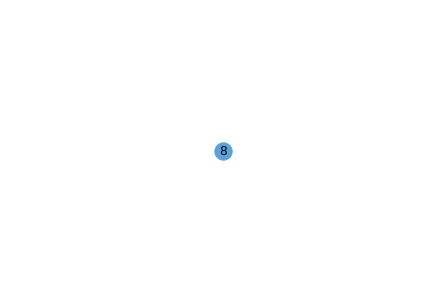

In [ ]:
#nodes = 10
# toplogy 4
example = examples[4]
gt = ground_truth_array[4]
print("Clusters for example 10_4")
for j in K_values_10:
  A = similarity_matrix(example)
  Y = Normalized_cut(A, j)
  cluster_matrix = get_traffic(Y, A)
  print("For k =",j)
  print("Clusters =",Y)
  print("Coditional Entropy =", conditional_entropy(Y, gt))
  print("F Measure =", f_measure(precision(Y, gt), recall(Y, gt)))
  for i in range(cluster_matrix.shape[0]):
    print("The internal traffic for cluster",i+1,"=",cluster_matrix[i,i])
    for k in range(cluster_matrix.shape[0]):
      if (i != k and k > i):
        print("The emulated traffic between cluster", i+1, "and cluster", k+1,"=",cluster_matrix[i][k])
  print("The graph after clustering:")
  visualize_topologies_afterClustering(example, Y)

Clusters for example 10_5
For k = 2
Clusters = [1 1 1 0 0 1 0 1 0 1]
Coditional Entropy = 0.30102999566398114
F Measure = 0.4949494949494949
The internal traffic for cluster 1 = 1466.0
The emulated traffic between cluster 1 and cluster 2 = 241.0
The internal traffic for cluster 2 = 2545.0
The graph after clustering:


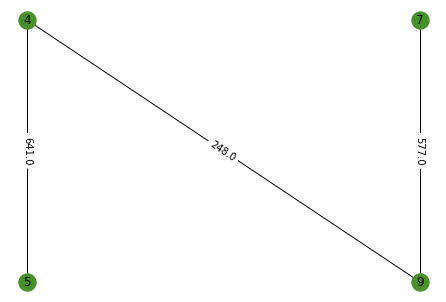

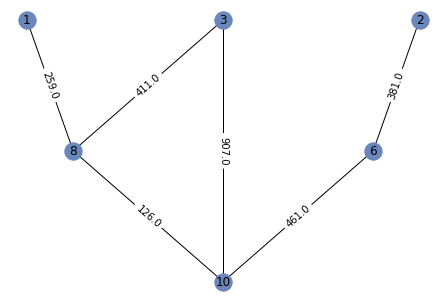

For k = 4
Clusters = [3 1 3 0 0 1 2 3 2 1]
Coditional Entropy = 0.16586075456620497
F Measure = 0.5357142857142858
The internal traffic for cluster 1 = 641.0
The emulated traffic between cluster 1 and cluster 2 = 241.0
The emulated traffic between cluster 1 and cluster 3 = 248.0
The emulated traffic between cluster 1 and cluster 4 = 0.0
The internal traffic for cluster 2 = 842.0
The emulated traffic between cluster 2 and cluster 3 = 0.0
The emulated traffic between cluster 2 and cluster 4 = 1033.0
The internal traffic for cluster 3 = 577.0
The emulated traffic between cluster 3 and cluster 4 = 0.0
The internal traffic for cluster 4 = 670.0
The graph after clustering:


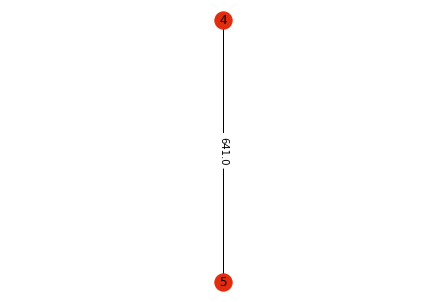

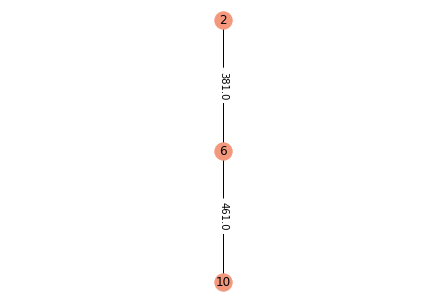

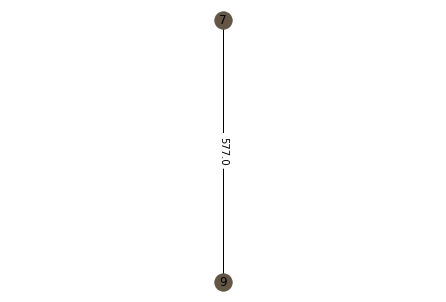

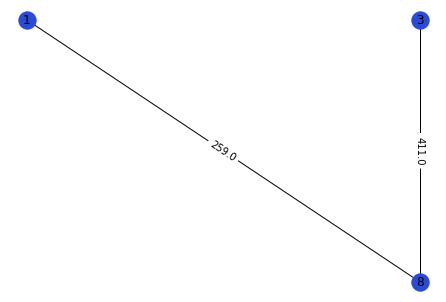

For k = 6
Clusters = [5 4 3 0 0 1 2 3 2 1]
Coditional Entropy = 0.12041199826559246
F Measure = 0.3968253968253969
The internal traffic for cluster 1 = 641.0
The emulated traffic between cluster 1 and cluster 2 = 241.0
The emulated traffic between cluster 1 and cluster 3 = 248.0
The emulated traffic between cluster 1 and cluster 4 = 0.0
The emulated traffic between cluster 1 and cluster 5 = 0.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The internal traffic for cluster 2 = 461.0
The emulated traffic between cluster 2 and cluster 3 = 0.0
The emulated traffic between cluster 2 and cluster 4 = 1033.0
The emulated traffic between cluster 2 and cluster 5 = 381.0
The emulated traffic between cluster 2 and cluster 6 = 0.0
The internal traffic for cluster 3 = 577.0
The emulated traffic between cluster 3 and cluster 4 = 0.0
The emulated traffic between cluster 3 and cluster 5 = 0.0
The emulated traffic between cluster 3 and cluster 6 = 0.0
The internal traffic for cluster 4 = 41

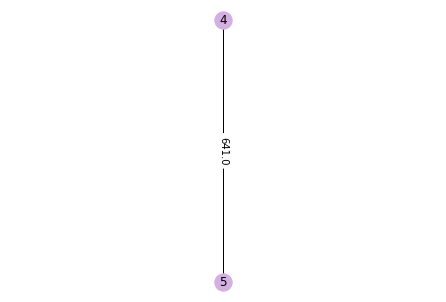

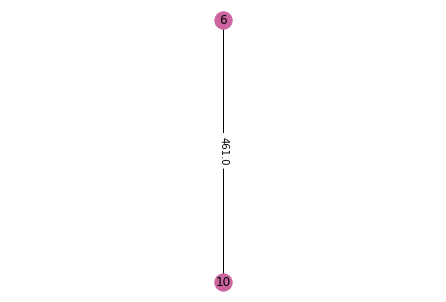

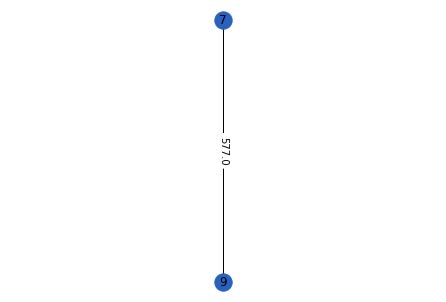

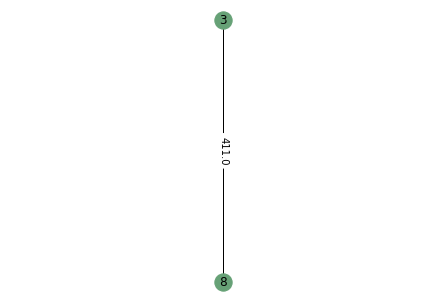

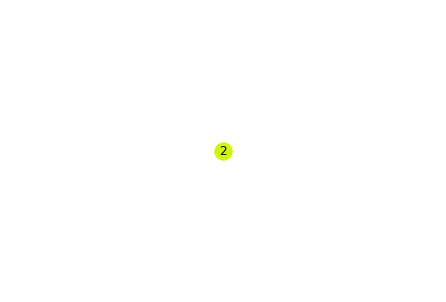

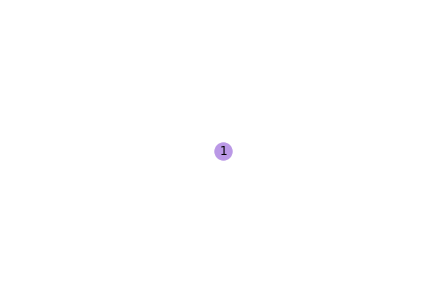

For k = 8
Clusters = [5 4 1 0 7 6 2 3 0 1]
Coditional Entropy = 0.06020599913279623
F Measure = 0.3571428571428572
The internal traffic for cluster 1 = 248.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 577.0
The emulated traffic between cluster 1 and cluster 4 = 0.0
The emulated traffic between cluster 1 and cluster 5 = 0.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The emulated traffic between cluster 1 and cluster 7 = 0.0
The emulated traffic between cluster 1 and cluster 8 = 641.0
The internal traffic for cluster 2 = 907.0
The emulated traffic between cluster 2 and cluster 3 = 0.0
The emulated traffic between cluster 2 and cluster 4 = 537.0
The emulated traffic between cluster 2 and cluster 5 = 0.0
The emulated traffic between cluster 2 and cluster 6 = 0.0
The emulated traffic between cluster 2 and cluster 7 = 461.0
The emulated traffic between cluster 2 and cluster 8 = 0.0
The internal traffic for

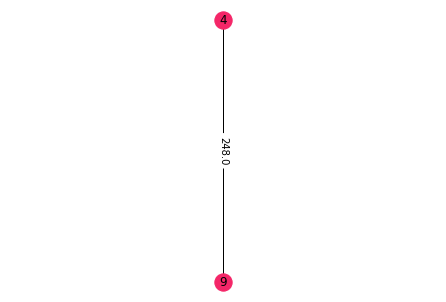

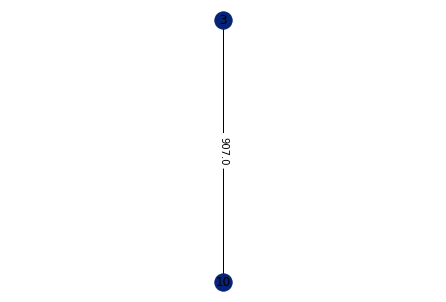

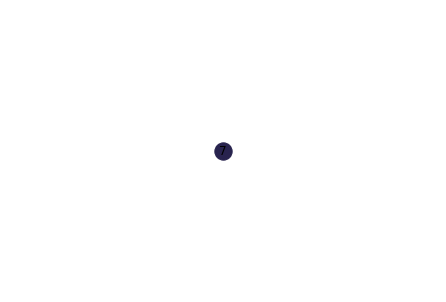

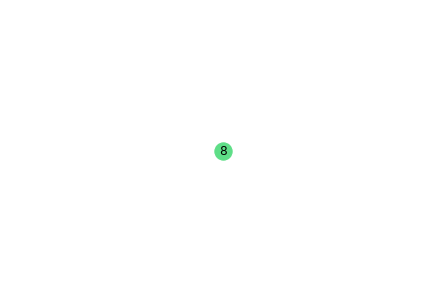

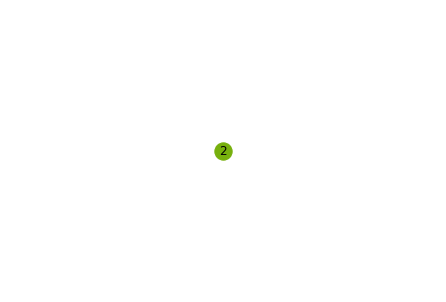

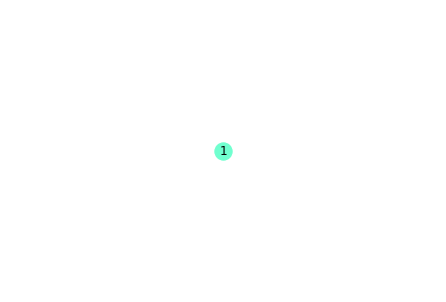

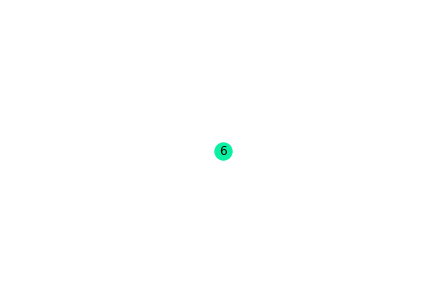

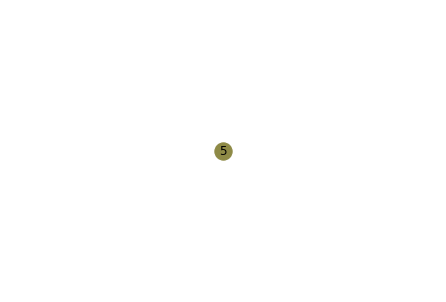

For k = 10
Clusters = [7 8 9 0 5 6 1 3 4 2]
Coditional Entropy = 0.0
F Measure = 0.33333333333333337
The internal traffic for cluster 1 = 0.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 0.0
The emulated traffic between cluster 1 and cluster 4 = 0.0
The emulated traffic between cluster 1 and cluster 5 = 248.0
The emulated traffic between cluster 1 and cluster 6 = 641.0
The emulated traffic between cluster 1 and cluster 7 = 0.0
The emulated traffic between cluster 1 and cluster 8 = 0.0
The emulated traffic between cluster 1 and cluster 9 = 0.0
The emulated traffic between cluster 1 and cluster 10 = 0.0
The internal traffic for cluster 2 = 0.0
The emulated traffic between cluster 2 and cluster 3 = 0.0
The emulated traffic between cluster 2 and cluster 4 = 0.0
The emulated traffic between cluster 2 and cluster 5 = 577.0
The emulated traffic between cluster 2 and cluster 6 = 0.0
The emulated traffic between cluster 2 and 

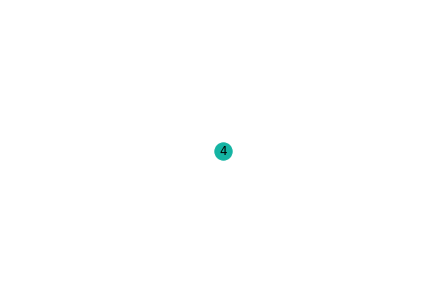

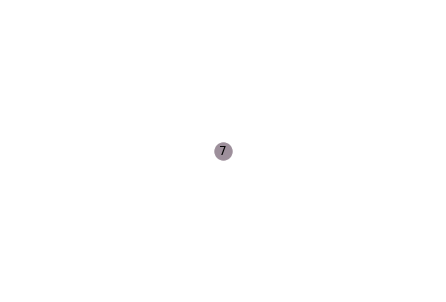

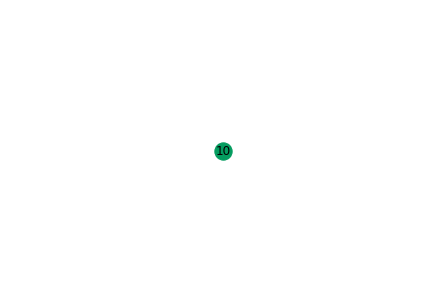

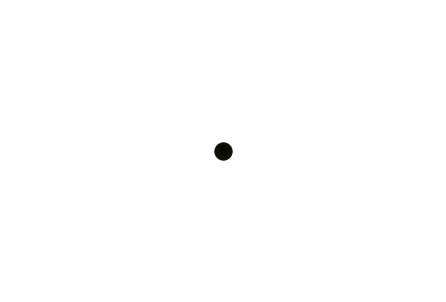

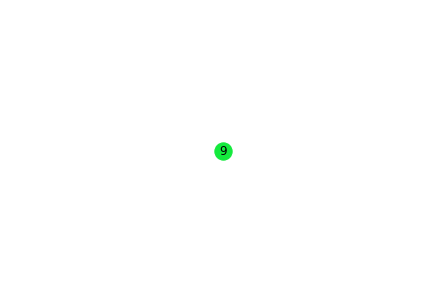

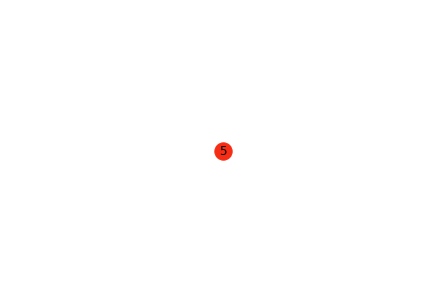

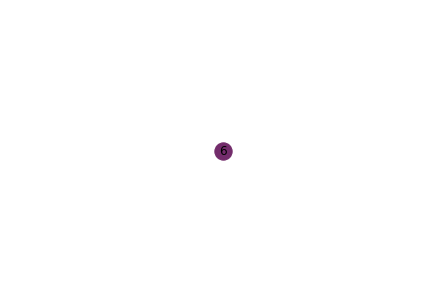

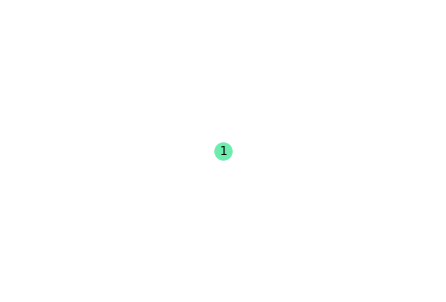

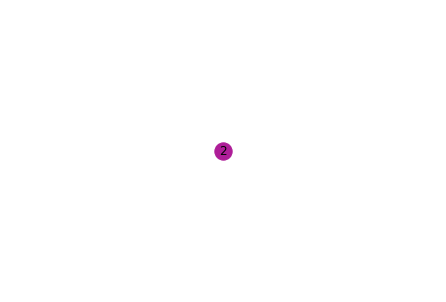

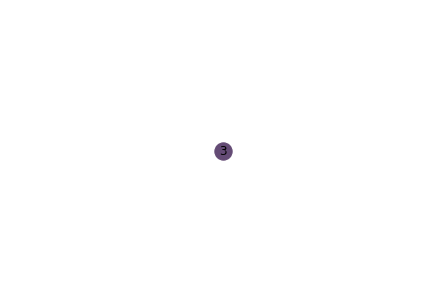

In [ ]:
#nodes = 10
# toplogy 5
example = examples[5]
gt = ground_truth_array[5]
print("Clusters for example 10_5")
for j in K_values_10:
  A = similarity_matrix(example)
  Y = Normalized_cut(A, j)
  cluster_matrix = get_traffic(Y, A)
  print("For k =",j)
  print("Clusters =",Y)
  print("Coditional Entropy =", conditional_entropy(Y, gt))
  print("F Measure =", f_measure(precision(Y, gt), recall(Y, gt)))
  for i in range(cluster_matrix.shape[0]):
    print("The internal traffic for cluster",i+1,"=",cluster_matrix[i,i])
    for k in range(cluster_matrix.shape[0]):
      if (i != k and k > i):
        print("The emulated traffic between cluster", i+1, "and cluster", k+1,"=",cluster_matrix[i][k])
  print("The graph after clustering:")
  visualize_topologies_afterClustering(example, Y)

Clusters for example 10_6
For k = 2
Clusters = [0 0 0 0 0 0 0 1 0 0]
Coditional Entropy = 0.0
F Measure = 0.5645933014354068
The internal traffic for cluster 1 = 3448.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The internal traffic for cluster 2 = 0.0
The graph after clustering:


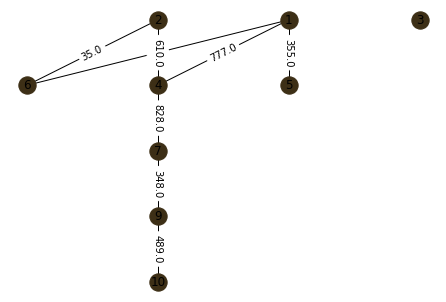

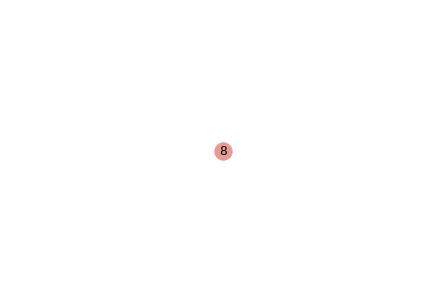

For k = 4
Clusters = [0 0 2 0 0 3 0 1 0 0]
Coditional Entropy = 0.0
F Measure = 0.34224598930481287
The internal traffic for cluster 1 = 3407.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 0.0
The emulated traffic between cluster 1 and cluster 4 = 41.0
The internal traffic for cluster 2 = 0.0
The emulated traffic between cluster 2 and cluster 3 = 0.0
The emulated traffic between cluster 2 and cluster 4 = 0.0
The internal traffic for cluster 3 = 0.0
The emulated traffic between cluster 3 and cluster 4 = 0.0
The internal traffic for cluster 4 = 0.0
The graph after clustering:


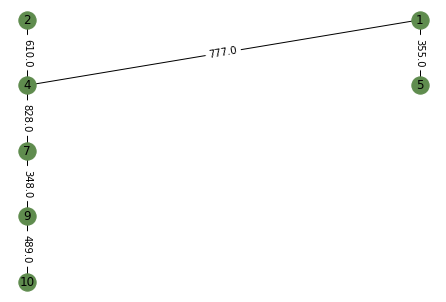

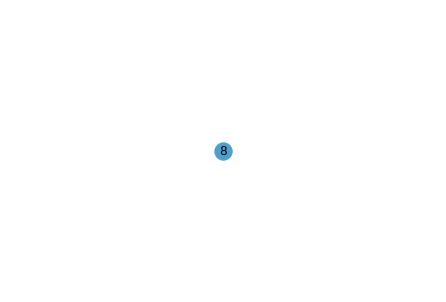

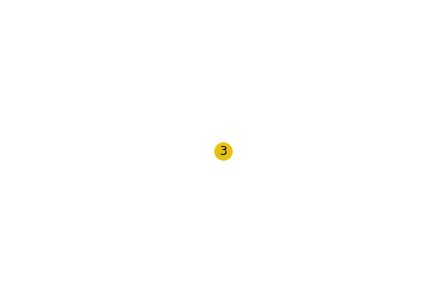

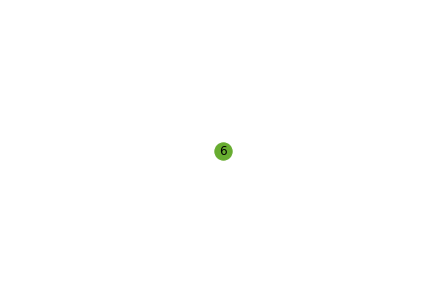

For k = 6
Clusters = [0 1 3 1 0 5 1 4 2 2]
Coditional Entropy = 0.0
F Measure = 0.27894327894327897
The internal traffic for cluster 1 = 355.0
The emulated traffic between cluster 1 and cluster 2 = 777.0
The emulated traffic between cluster 1 and cluster 3 = 0.0
The emulated traffic between cluster 1 and cluster 4 = 0.0
The emulated traffic between cluster 1 and cluster 5 = 0.0
The emulated traffic between cluster 1 and cluster 6 = 6.0
The internal traffic for cluster 2 = 1438.0
The emulated traffic between cluster 2 and cluster 3 = 348.0
The emulated traffic between cluster 2 and cluster 4 = 0.0
The emulated traffic between cluster 2 and cluster 5 = 0.0
The emulated traffic between cluster 2 and cluster 6 = 35.0
The internal traffic for cluster 3 = 489.0
The emulated traffic between cluster 3 and cluster 4 = 0.0
The emulated traffic between cluster 3 and cluster 5 = 0.0
The emulated traffic between cluster 3 and cluster 6 = 0.0
The internal traffic for cluster 4 = 0.0
The emulated tra

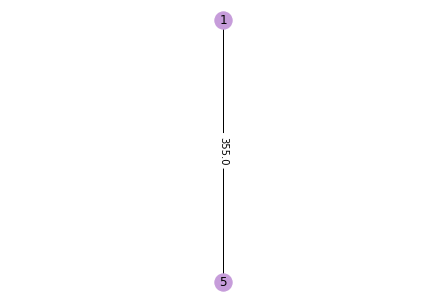

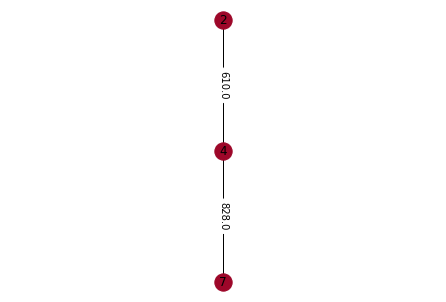

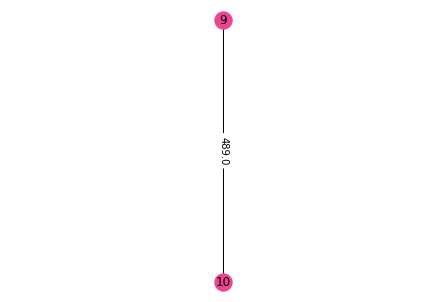

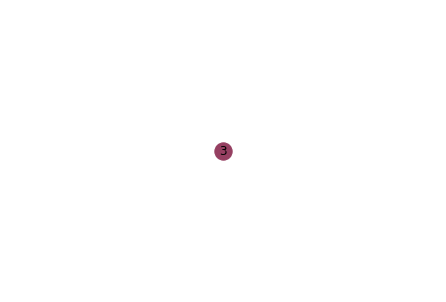

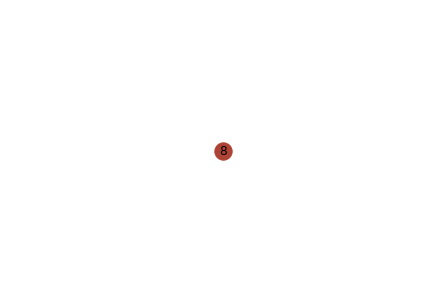

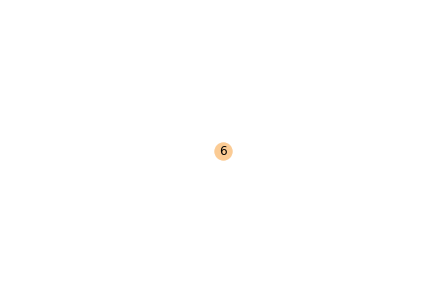

For k = 8
Clusters = [3 0 2 3 6 4 1 5 1 7]
Coditional Entropy = 0.0
F Measure = 0.2196969696969697
The internal traffic for cluster 1 = 0.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 0.0
The emulated traffic between cluster 1 and cluster 4 = 610.0
The emulated traffic between cluster 1 and cluster 5 = 35.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The emulated traffic between cluster 1 and cluster 7 = 0.0
The emulated traffic between cluster 1 and cluster 8 = 0.0
The internal traffic for cluster 2 = 348.0
The emulated traffic between cluster 2 and cluster 3 = 0.0
The emulated traffic between cluster 2 and cluster 4 = 828.0
The emulated traffic between cluster 2 and cluster 5 = 0.0
The emulated traffic between cluster 2 and cluster 6 = 0.0
The emulated traffic between cluster 2 and cluster 7 = 0.0
The emulated traffic between cluster 2 and cluster 8 = 489.0
The internal traffic for cluster 3 = 0.0
Th

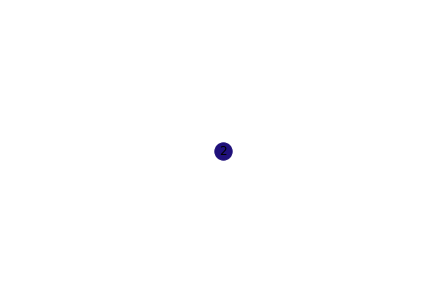

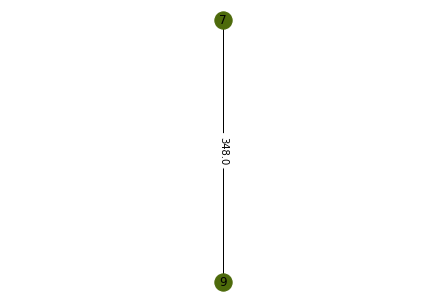

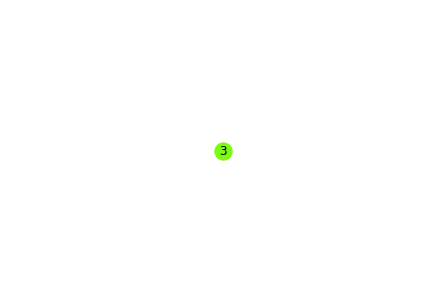

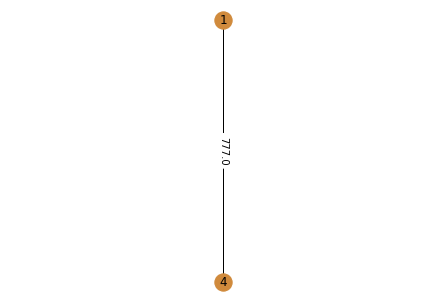

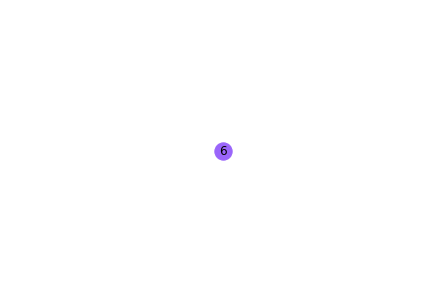

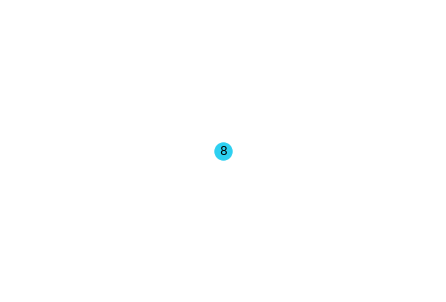

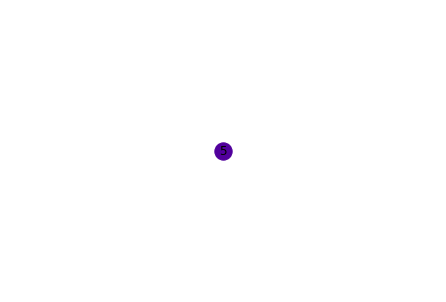

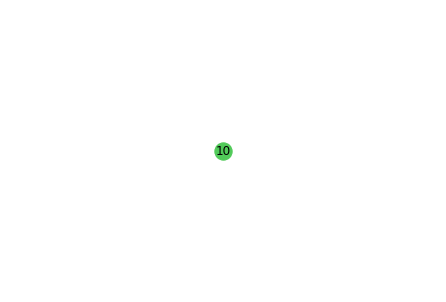

For k = 10
Clusters = [7 4 8 0 9 5 3 1 6 2]
Coditional Entropy = 0.0
F Measure = 0.18181818181818182
The internal traffic for cluster 1 = 0.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 0.0
The emulated traffic between cluster 1 and cluster 4 = 828.0
The emulated traffic between cluster 1 and cluster 5 = 610.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The emulated traffic between cluster 1 and cluster 7 = 0.0
The emulated traffic between cluster 1 and cluster 8 = 777.0
The emulated traffic between cluster 1 and cluster 9 = 0.0
The emulated traffic between cluster 1 and cluster 10 = 0.0
The internal traffic for cluster 2 = 0.0
The emulated traffic between cluster 2 and cluster 3 = 0.0
The emulated traffic between cluster 2 and cluster 4 = 0.0
The emulated traffic between cluster 2 and cluster 5 = 0.0
The emulated traffic between cluster 2 and cluster 6 = 0.0
The emulated traffic between cluster 2 and 

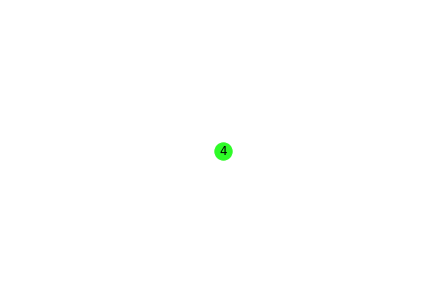

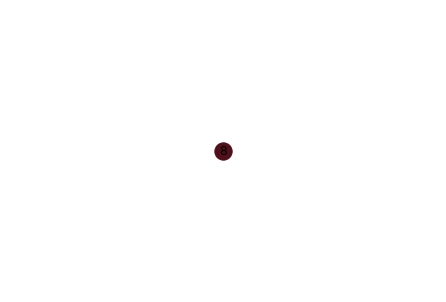

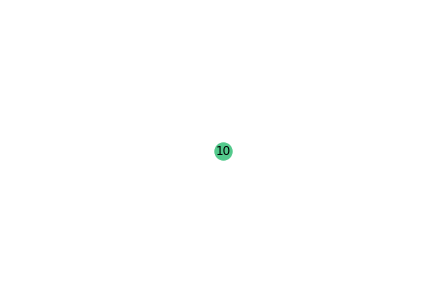

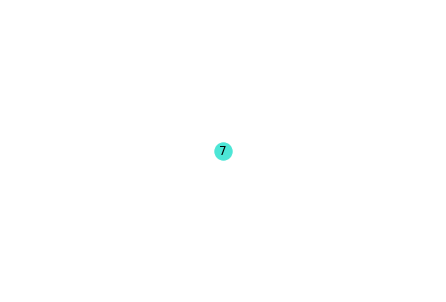

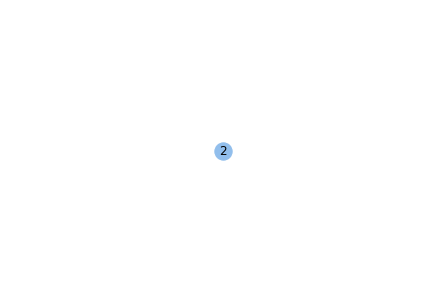

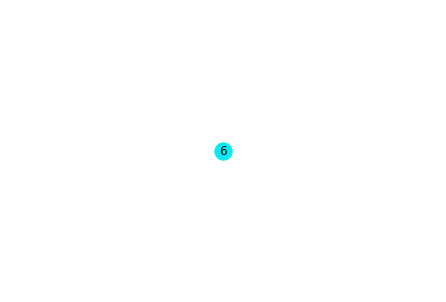

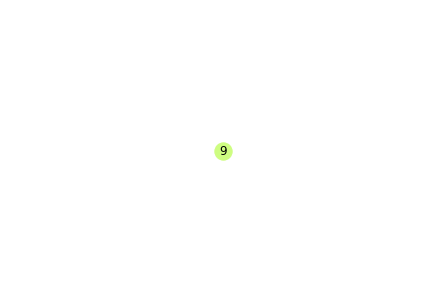

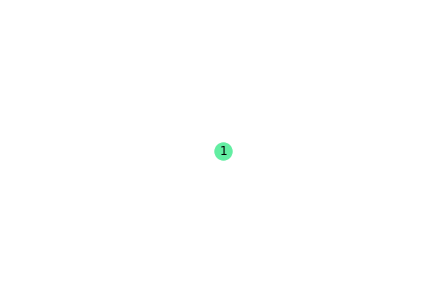

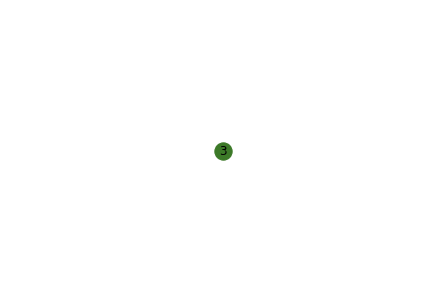

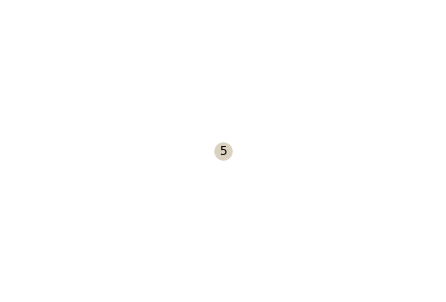

In [ ]:
#nodes = 10
# toplogy 6
example = examples[6]
gt = ground_truth_array[6]
print("Clusters for example 10_6")
for j in K_values_10:
  A = similarity_matrix(example)
  Y = Normalized_cut(A, j)
  cluster_matrix = get_traffic(Y, A)
  print("For k =",j)
  print("Clusters =",Y)
  print("Coditional Entropy =", conditional_entropy(Y, gt))
  print("F Measure =", f_measure(precision(Y, gt), recall(Y, gt)))
  for i in range(cluster_matrix.shape[0]):
    print("The internal traffic for cluster",i+1,"=",cluster_matrix[i,i])
    for k in range(cluster_matrix.shape[0]):
      if (i != k and k > i):
        print("The emulated traffic between cluster", i+1, "and cluster", k+1,"=",cluster_matrix[i][k])
  print("The graph after clustering:")
  visualize_topologies_afterClustering(example, Y)

Clusters for example 10_7
For k = 2
Clusters = [0 0 1 0 0 0 1 1 0 0]
Coditional Entropy = 0.2905386323459986
F Measure = 0.5833333333333333
The internal traffic for cluster 1 = 5855.0
The emulated traffic between cluster 1 and cluster 2 = 2185.0
The internal traffic for cluster 2 = 988.0
The graph after clustering:


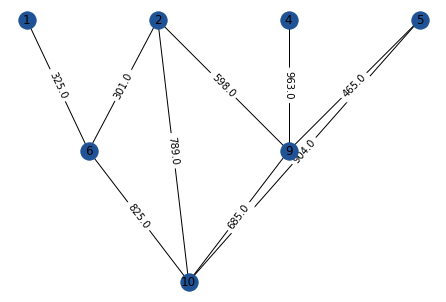

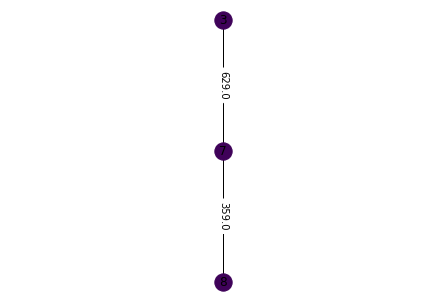

For k = 4
Clusters = [3 1 3 0 1 3 2 2 0 1]
Coditional Entropy = 0.16586075456620497
F Measure = 0.5357142857142858
The internal traffic for cluster 1 = 963.0
The emulated traffic between cluster 1 and cluster 2 = 1748.0
The emulated traffic between cluster 1 and cluster 3 = 797.0
The emulated traffic between cluster 1 and cluster 4 = 874.0
The internal traffic for cluster 2 = 1693.0
The emulated traffic between cluster 2 and cluster 3 = 0.0
The emulated traffic between cluster 2 and cluster 4 = 1126.0
The internal traffic for cluster 3 = 359.0
The emulated traffic between cluster 3 and cluster 4 = 629.0
The internal traffic for cluster 4 = 839.0
The graph after clustering:


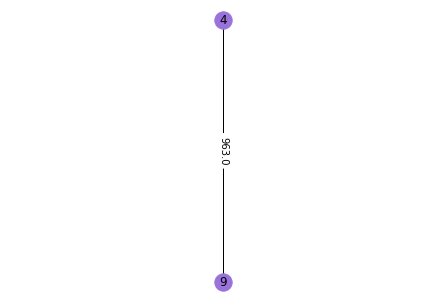

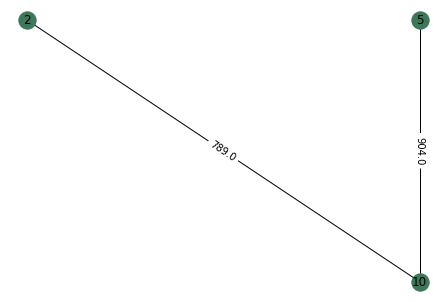

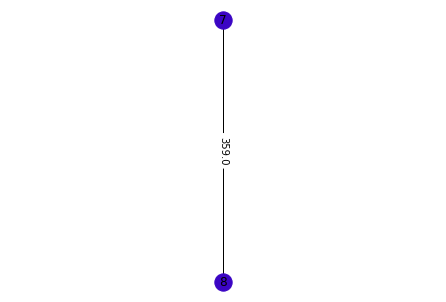

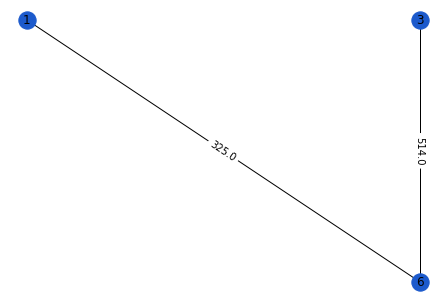

For k = 6
Clusters = [5 0 2 1 4 2 3 3 1 4]
Coditional Entropy = 0.12041199826559246
F Measure = 0.3968253968253969
The internal traffic for cluster 1 = 0.0
The emulated traffic between cluster 1 and cluster 2 = 598.0
The emulated traffic between cluster 1 and cluster 3 = 301.0
The emulated traffic between cluster 1 and cluster 4 = 0.0
The emulated traffic between cluster 1 and cluster 5 = 789.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The internal traffic for cluster 2 = 963.0
The emulated traffic between cluster 2 and cluster 3 = 874.0
The emulated traffic between cluster 2 and cluster 4 = 797.0
The emulated traffic between cluster 2 and cluster 5 = 1150.0
The emulated traffic between cluster 2 and cluster 6 = 0.0
The internal traffic for cluster 3 = 514.0
The emulated traffic between cluster 3 and cluster 4 = 629.0
The emulated traffic between cluster 3 and cluster 5 = 825.0
The emulated traffic between cluster 3 and cluster 6 = 325.0
The internal traffic for cluste

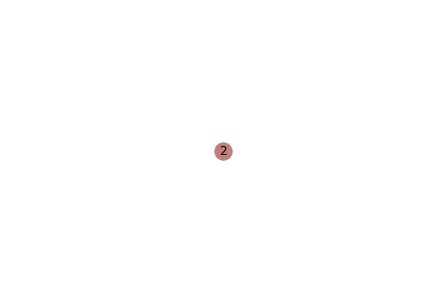

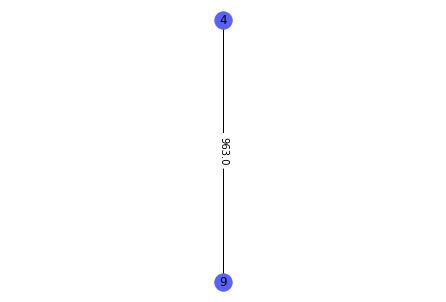

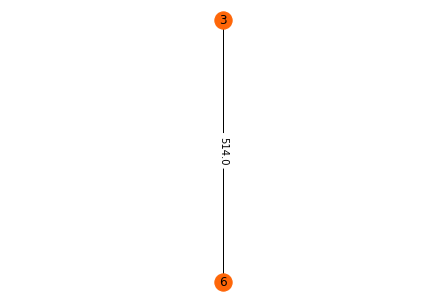

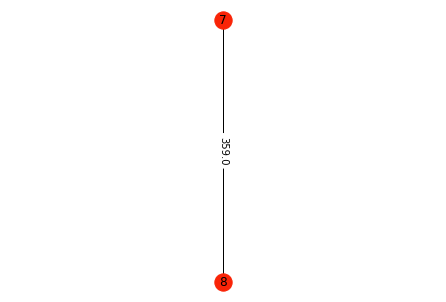

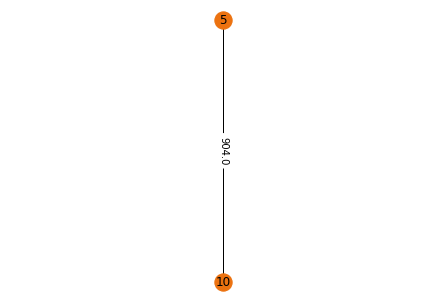

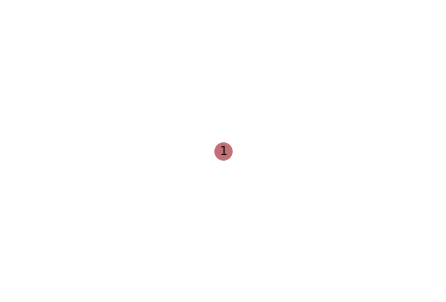

For k = 8
Clusters = [3 4 6 0 5 2 1 1 7 2]
Coditional Entropy = 0.0
F Measure = 0.3928571428571429
The internal traffic for cluster 1 = 0.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 0.0
The emulated traffic between cluster 1 and cluster 4 = 0.0
The emulated traffic between cluster 1 and cluster 5 = 0.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The emulated traffic between cluster 1 and cluster 7 = 0.0
The emulated traffic between cluster 1 and cluster 8 = 963.0
The internal traffic for cluster 2 = 359.0
The emulated traffic between cluster 2 and cluster 3 = 0.0
The emulated traffic between cluster 2 and cluster 4 = 0.0
The emulated traffic between cluster 2 and cluster 5 = 0.0
The emulated traffic between cluster 2 and cluster 6 = 0.0
The emulated traffic between cluster 2 and cluster 7 = 629.0
The emulated traffic between cluster 2 and cluster 8 = 797.0
The internal traffic for cluster 3 = 825.0
T

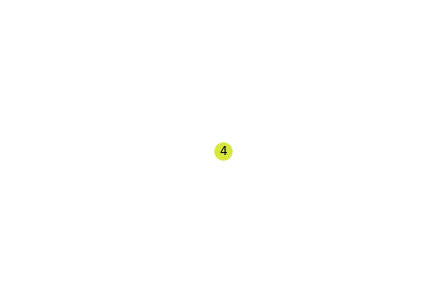

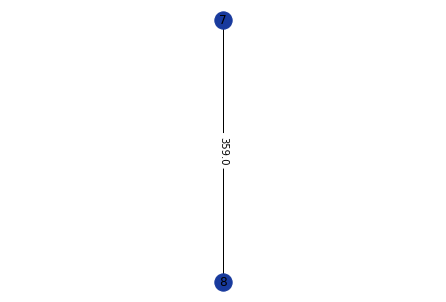

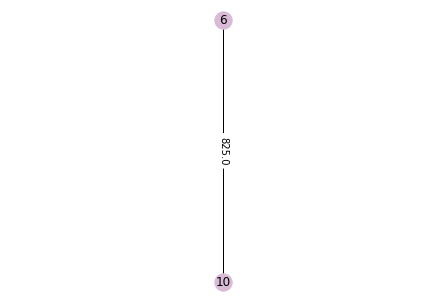

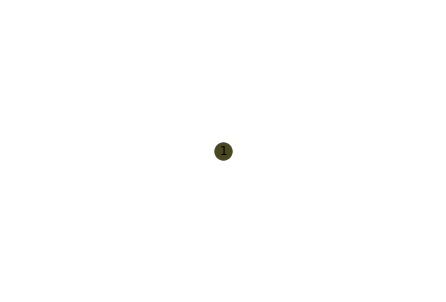

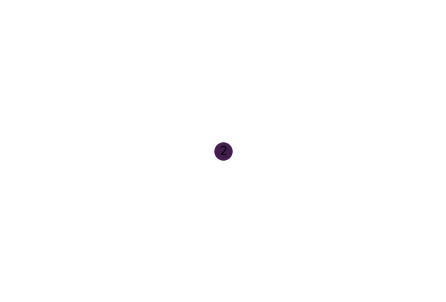

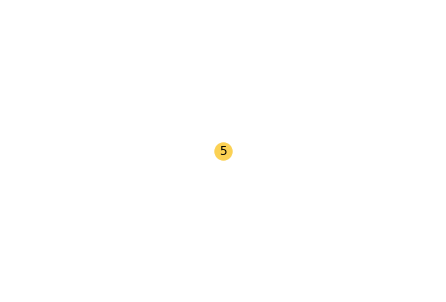

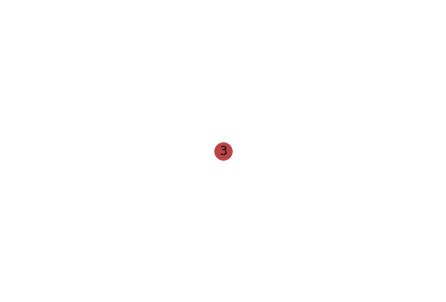

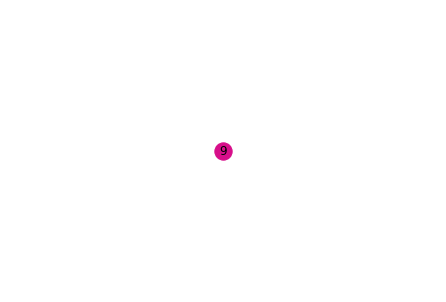

For k = 10
Clusters = [7 4 8 0 9 5 3 6 2 1]
Coditional Entropy = 0.0
F Measure = 0.33333333333333337
The internal traffic for cluster 1 = 0.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 963.0
The emulated traffic between cluster 1 and cluster 4 = 0.0
The emulated traffic between cluster 1 and cluster 5 = 0.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The emulated traffic between cluster 1 and cluster 7 = 0.0
The emulated traffic between cluster 1 and cluster 8 = 0.0
The emulated traffic between cluster 1 and cluster 9 = 0.0
The emulated traffic between cluster 1 and cluster 10 = 0.0
The internal traffic for cluster 2 = 0.0
The emulated traffic between cluster 2 and cluster 3 = 685.0
The emulated traffic between cluster 2 and cluster 4 = 0.0
The emulated traffic between cluster 2 and cluster 5 = 789.0
The emulated traffic between cluster 2 and cluster 6 = 825.0
The emulated traffic between cluster 2 an

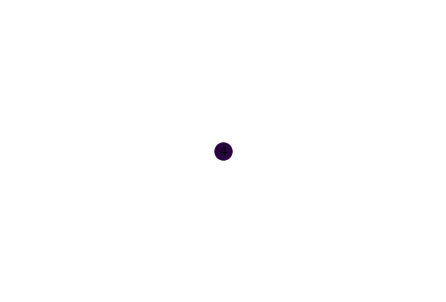

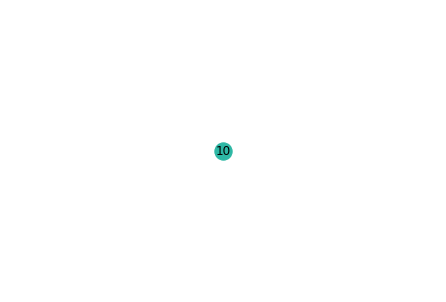

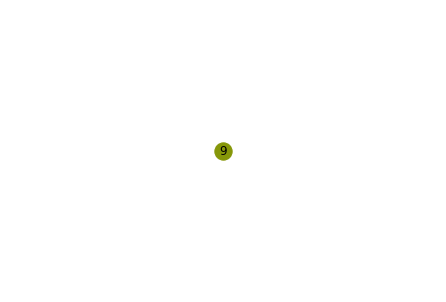

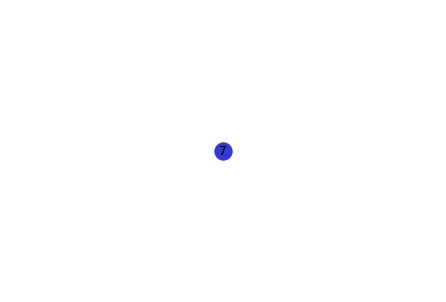

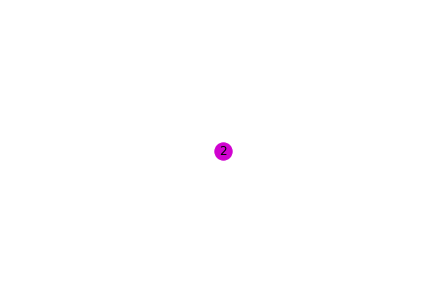

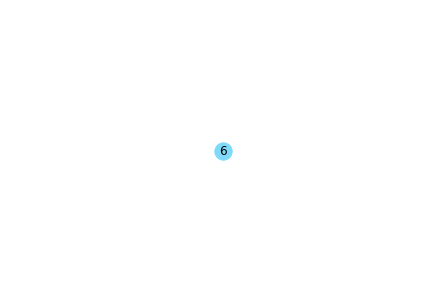

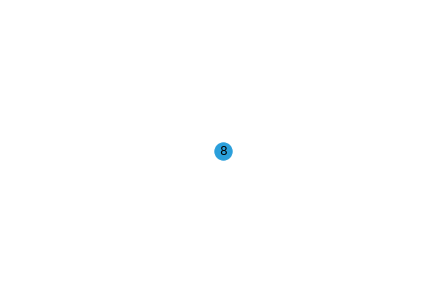

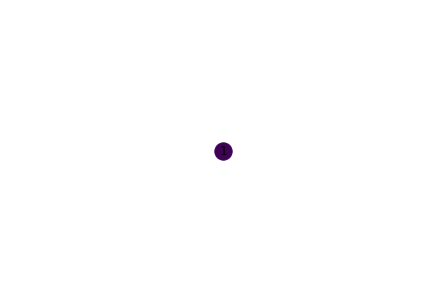

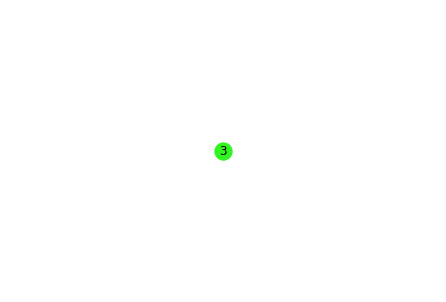

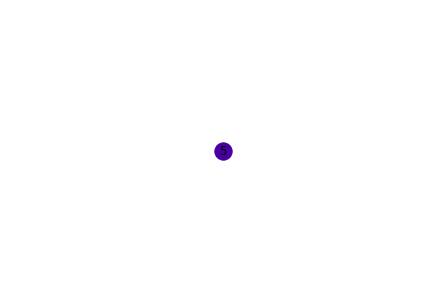

In [ ]:
#nodes = 10
# toplogy 7
example = examples[7]
gt = ground_truth_array[7]
print("Clusters for example 10_7")
for j in K_values_10:
  A = similarity_matrix(example)
  Y = Normalized_cut(A, j)
  cluster_matrix = get_traffic(Y, A)
  print("For k =",j)
  print("Clusters =",Y)
  print("Coditional Entropy =", conditional_entropy(Y, gt))
  print("F Measure =", f_measure(precision(Y, gt), recall(Y, gt)))
  for i in range(cluster_matrix.shape[0]):
    print("The internal traffic for cluster",i+1,"=",cluster_matrix[i,i])
    for k in range(cluster_matrix.shape[0]):
      if (i != k and k > i):
        print("The emulated traffic between cluster", i+1, "and cluster", k+1,"=",cluster_matrix[i][k])
  print("The graph after clustering:")
  visualize_topologies_afterClustering(example, Y)

Clusters for example 10_8
For k = 2
Clusters = [0 0 0 0 0 0 0 0 0 1]
Coditional Entropy = 0.5123395065307986
F Measure = 0.4307692307692308
The internal traffic for cluster 1 = 8088.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The internal traffic for cluster 2 = 0.0
The graph after clustering:


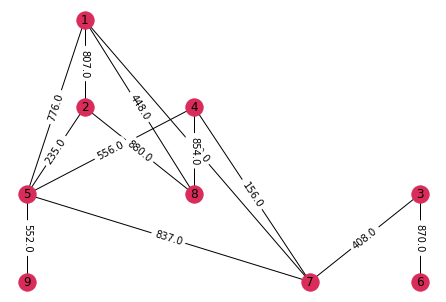

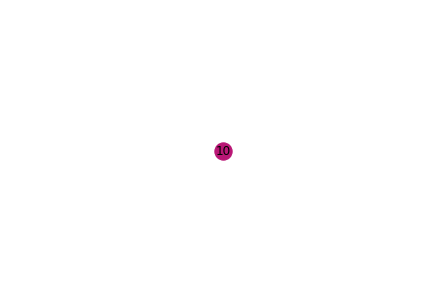

For k = 4
Clusters = [0 0 1 0 0 1 0 0 3 2]
Coditional Entropy = 0.3237543738142874
F Measure = 0.475
The internal traffic for cluster 1 = 6258.0
The emulated traffic between cluster 1 and cluster 2 = 408.0
The emulated traffic between cluster 1 and cluster 3 = 0.0
The emulated traffic between cluster 1 and cluster 4 = 552.0
The internal traffic for cluster 2 = 870.0
The emulated traffic between cluster 2 and cluster 3 = 0.0
The emulated traffic between cluster 2 and cluster 4 = 0.0
The internal traffic for cluster 3 = 0.0
The emulated traffic between cluster 3 and cluster 4 = 0.0
The internal traffic for cluster 4 = 0.0
The graph after clustering:


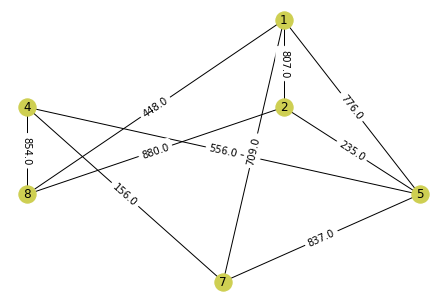

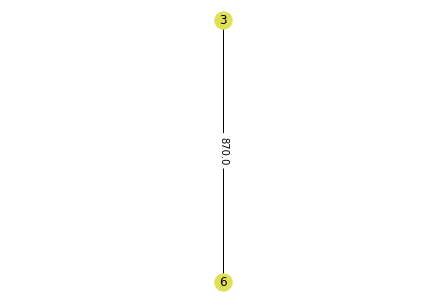

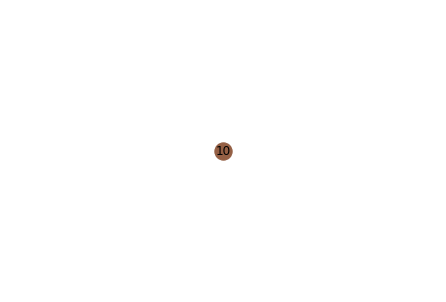

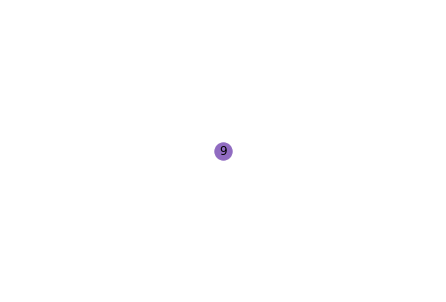

For k = 6
Clusters = [2 1 0 5 2 0 2 1 4 3]
Coditional Entropy = 0.14313637641589871
F Measure = 0.5452380952380952
The internal traffic for cluster 1 = 870.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 408.0
The emulated traffic between cluster 1 and cluster 4 = 0.0
The emulated traffic between cluster 1 and cluster 5 = 0.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The internal traffic for cluster 2 = 880.0
The emulated traffic between cluster 2 and cluster 3 = 1490.0
The emulated traffic between cluster 2 and cluster 4 = 0.0
The emulated traffic between cluster 2 and cluster 5 = 0.0
The emulated traffic between cluster 2 and cluster 6 = 854.0
The internal traffic for cluster 3 = 2322.0
The emulated traffic between cluster 3 and cluster 4 = 0.0
The emulated traffic between cluster 3 and cluster 5 = 552.0
The emulated traffic between cluster 3 and cluster 6 = 712.0
The internal traffic for cluster 4 =

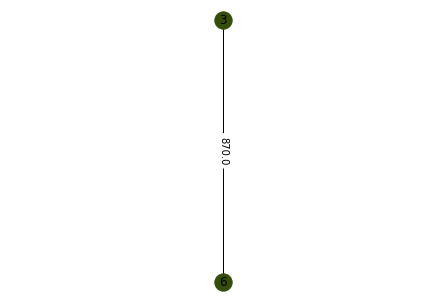

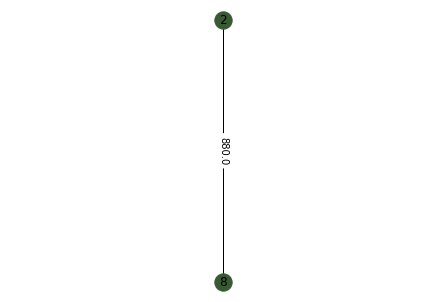

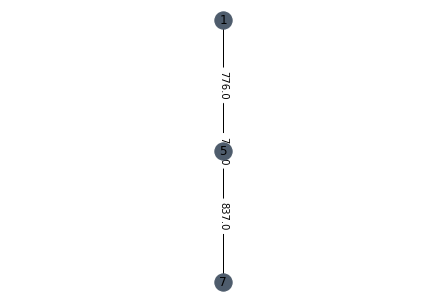

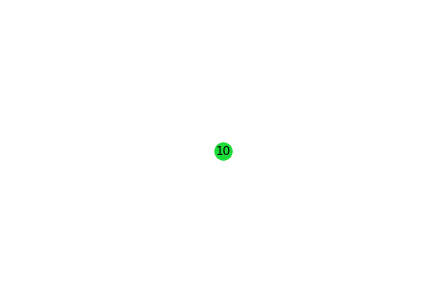

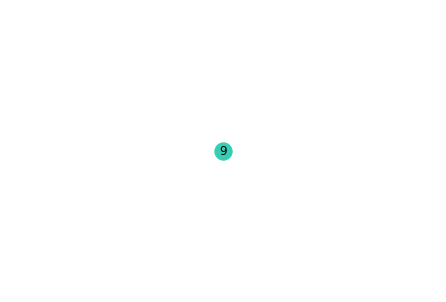

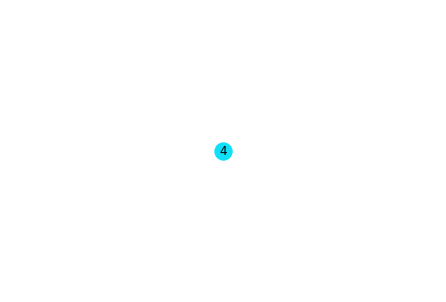

For k = 8
Clusters = [0 6 4 7 0 1 0 3 5 2]
Coditional Entropy = 0.08293037728310249
F Measure = 0.5880952380952381
The internal traffic for cluster 1 = 2322.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 0.0
The emulated traffic between cluster 1 and cluster 4 = 448.0
The emulated traffic between cluster 1 and cluster 5 = 408.0
The emulated traffic between cluster 1 and cluster 6 = 552.0
The emulated traffic between cluster 1 and cluster 7 = 1042.0
The emulated traffic between cluster 1 and cluster 8 = 712.0
The internal traffic for cluster 2 = 0.0
The emulated traffic between cluster 2 and cluster 3 = 0.0
The emulated traffic between cluster 2 and cluster 4 = 0.0
The emulated traffic between cluster 2 and cluster 5 = 870.0
The emulated traffic between cluster 2 and cluster 6 = 0.0
The emulated traffic between cluster 2 and cluster 7 = 0.0
The emulated traffic between cluster 2 and cluster 8 = 0.0
The internal traffic

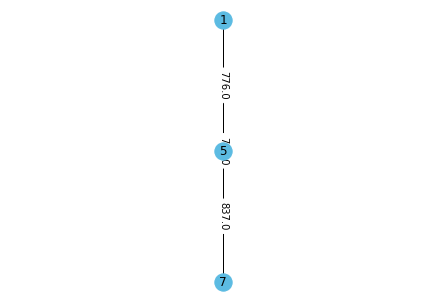

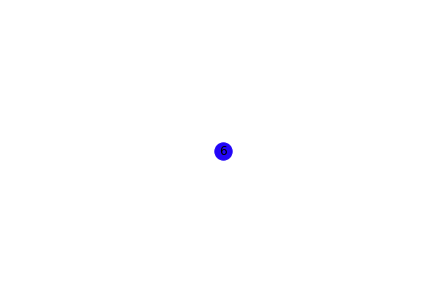

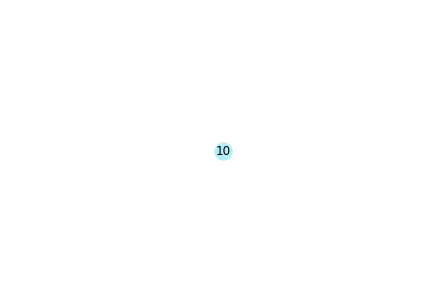

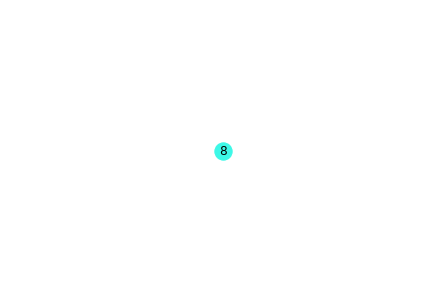

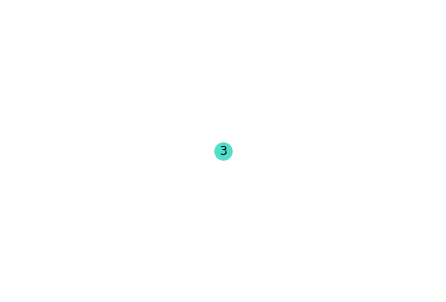

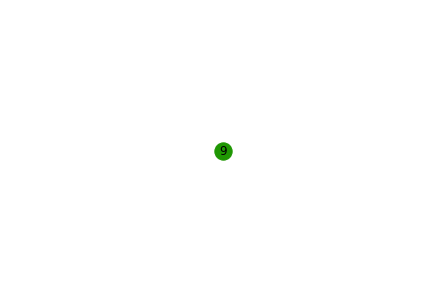

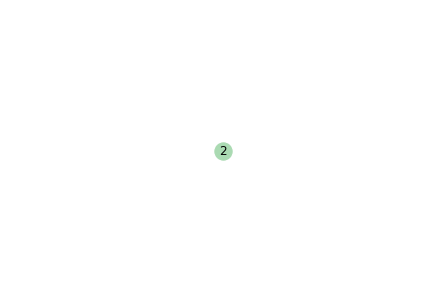

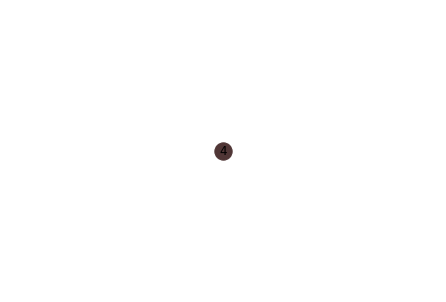

For k = 10
Clusters = [4 2 7 0 8 9 5 1 3 6]
Coditional Entropy = 0.0
F Measure = 0.5433333333333333
The internal traffic for cluster 1 = 0.0
The emulated traffic between cluster 1 and cluster 2 = 854.0
The emulated traffic between cluster 1 and cluster 3 = 0.0
The emulated traffic between cluster 1 and cluster 4 = 0.0
The emulated traffic between cluster 1 and cluster 5 = 0.0
The emulated traffic between cluster 1 and cluster 6 = 156.0
The emulated traffic between cluster 1 and cluster 7 = 0.0
The emulated traffic between cluster 1 and cluster 8 = 0.0
The emulated traffic between cluster 1 and cluster 9 = 556.0
The emulated traffic between cluster 1 and cluster 10 = 0.0
The internal traffic for cluster 2 = 0.0
The emulated traffic between cluster 2 and cluster 3 = 880.0
The emulated traffic between cluster 2 and cluster 4 = 0.0
The emulated traffic between cluster 2 and cluster 5 = 448.0
The emulated traffic between cluster 2 and cluster 6 = 0.0
The emulated traffic between cluster 2 a

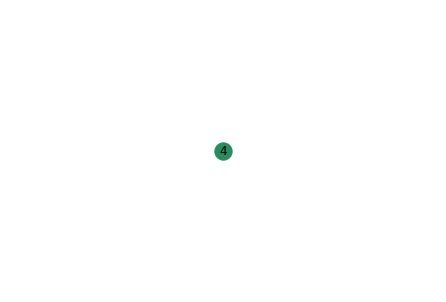

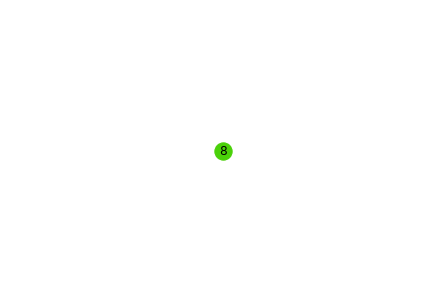

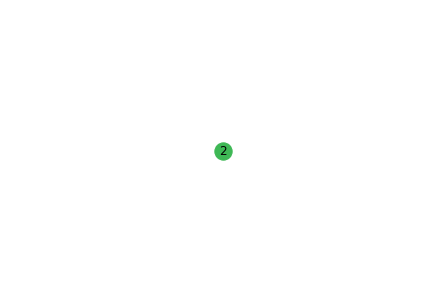

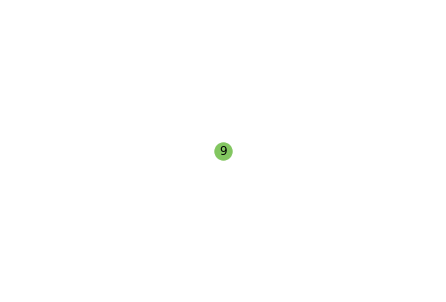

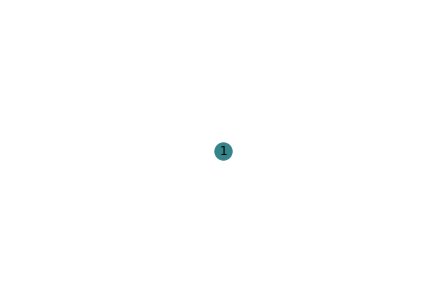

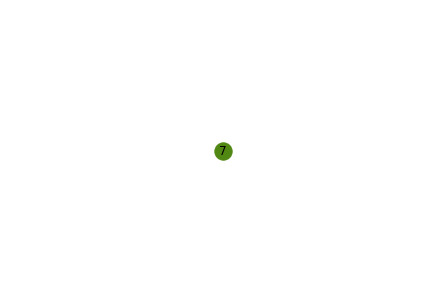

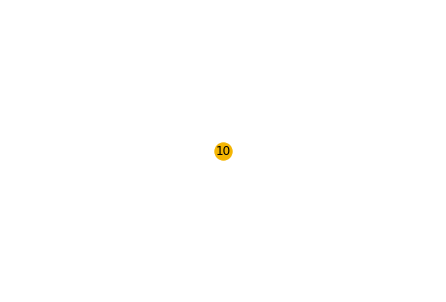

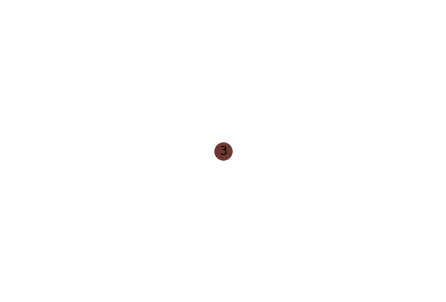

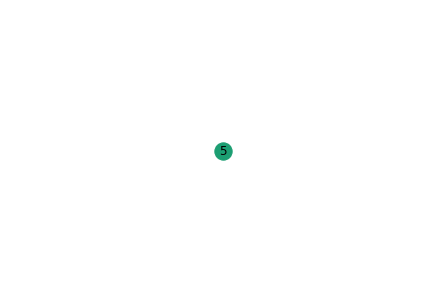

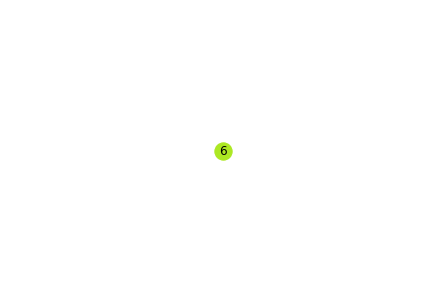

In [ ]:
#nodes = 10
# toplogy 8
example = examples[8]
gt = ground_truth_array[8]
print("Clusters for example 10_8")
for j in K_values_10:
  A = similarity_matrix(example)
  Y = Normalized_cut(A, j)
  cluster_matrix = get_traffic(Y, A)
  print("For k =",j)
  print("Clusters =",Y)
  print("Coditional Entropy =", conditional_entropy(Y, gt))
  print("F Measure =", f_measure(precision(Y, gt), recall(Y, gt)))
  for i in range(cluster_matrix.shape[0]):
    print("The internal traffic for cluster",i+1,"=",cluster_matrix[i,i])
    for k in range(cluster_matrix.shape[0]):
      if (i != k and k > i):
        print("The emulated traffic between cluster", i+1, "and cluster", k+1,"=",cluster_matrix[i][k])
  print("The graph after clustering:")
  visualize_topologies_afterClustering(example, Y)

Clusters for example 10_9
For k = 2
Clusters = [1 1 1 0 1 1 1 1 1 1]
Coditional Entropy = 0.0
F Measure = 0.5645933014354068
The internal traffic for cluster 1 = 0.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The internal traffic for cluster 2 = 5779.0
The graph after clustering:


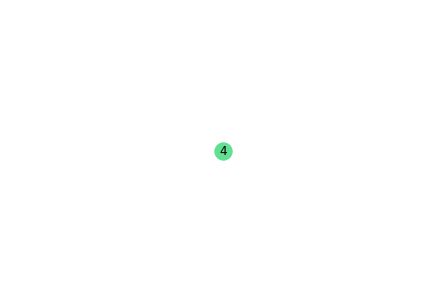

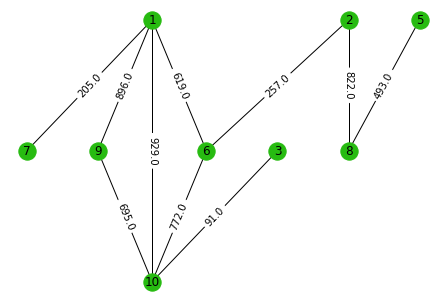

For k = 4
Clusters = [1 2 3 0 2 1 1 2 1 1]
Coditional Entropy = 0.0
F Measure = 0.37296037296037293
The internal traffic for cluster 1 = 0.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 0.0
The emulated traffic between cluster 1 and cluster 4 = 0.0
The internal traffic for cluster 2 = 4116.0
The emulated traffic between cluster 2 and cluster 3 = 257.0
The emulated traffic between cluster 2 and cluster 4 = 91.0
The internal traffic for cluster 3 = 1315.0
The emulated traffic between cluster 3 and cluster 4 = 0.0
The internal traffic for cluster 4 = 0.0
The graph after clustering:


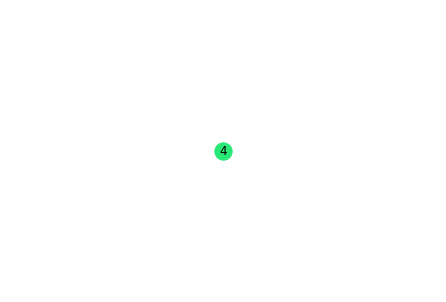

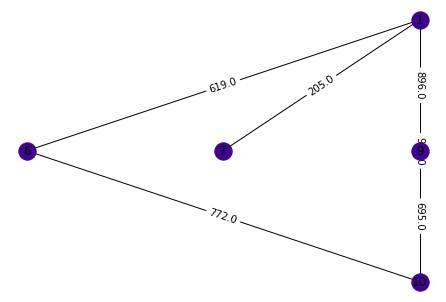

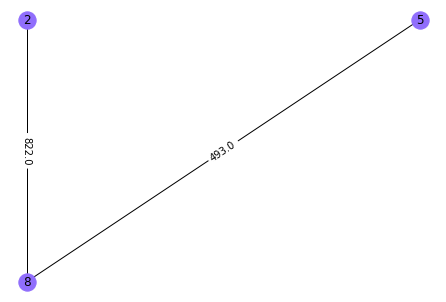

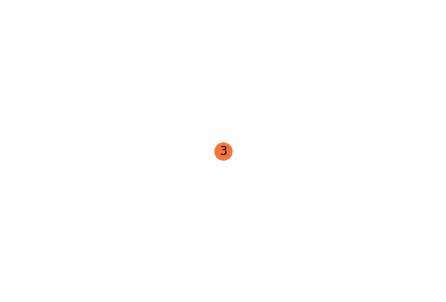

For k = 6
Clusters = [1 2 4 0 5 1 3 2 1 1]
Coditional Entropy = 0.0
F Measure = 0.2720057720057721
The internal traffic for cluster 1 = 0.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 0.0
The emulated traffic between cluster 1 and cluster 4 = 0.0
The emulated traffic between cluster 1 and cluster 5 = 0.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The internal traffic for cluster 2 = 3911.0
The emulated traffic between cluster 2 and cluster 3 = 257.0
The emulated traffic between cluster 2 and cluster 4 = 205.0
The emulated traffic between cluster 2 and cluster 5 = 91.0
The emulated traffic between cluster 2 and cluster 6 = 0.0
The internal traffic for cluster 3 = 822.0
The emulated traffic between cluster 3 and cluster 4 = 0.0
The emulated traffic between cluster 3 and cluster 5 = 0.0
The emulated traffic between cluster 3 and cluster 6 = 493.0
The internal traffic for cluster 4 = 0.0
The emulated traf

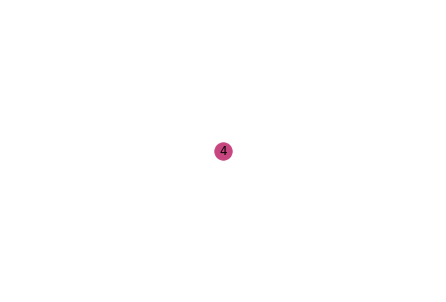

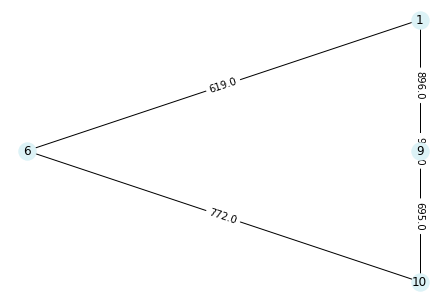

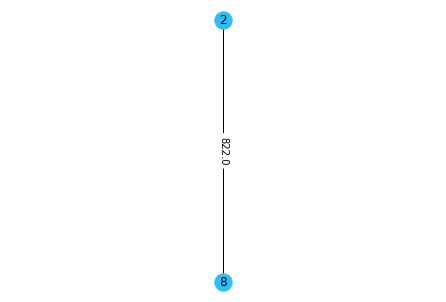

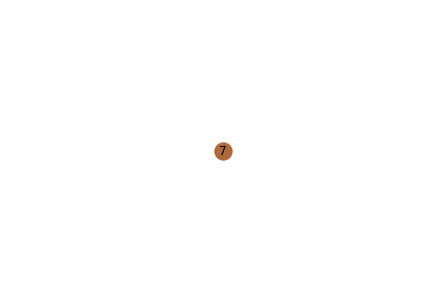

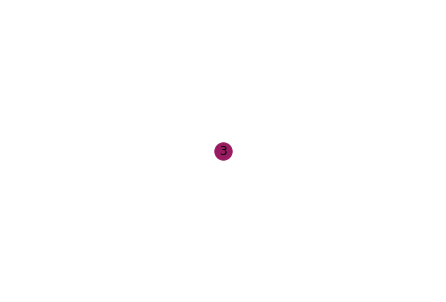

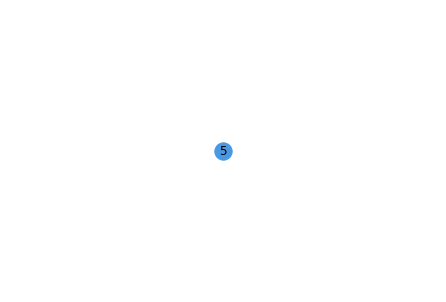

For k = 8
Clusters = [1 2 3 0 4 7 6 5 1 1]
Coditional Entropy = 0.0
F Measure = 0.2167832167832168
The internal traffic for cluster 1 = 0.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 0.0
The emulated traffic between cluster 1 and cluster 4 = 0.0
The emulated traffic between cluster 1 and cluster 5 = 0.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The emulated traffic between cluster 1 and cluster 7 = 0.0
The emulated traffic between cluster 1 and cluster 8 = 0.0
The internal traffic for cluster 2 = 2520.0
The emulated traffic between cluster 2 and cluster 3 = 0.0
The emulated traffic between cluster 2 and cluster 4 = 91.0
The emulated traffic between cluster 2 and cluster 5 = 0.0
The emulated traffic between cluster 2 and cluster 6 = 0.0
The emulated traffic between cluster 2 and cluster 7 = 205.0
The emulated traffic between cluster 2 and cluster 8 = 1391.0
The internal traffic for cluster 3 = 0.0
Th

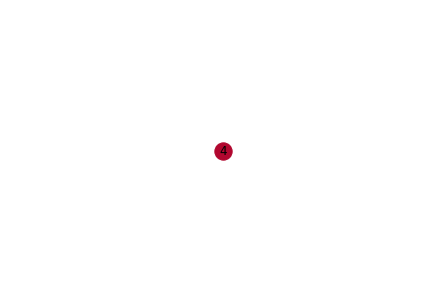

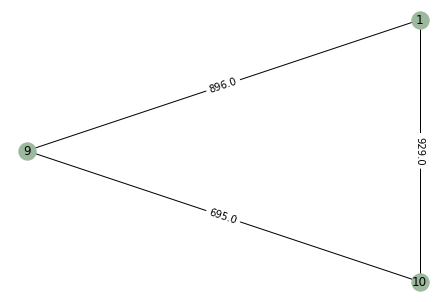

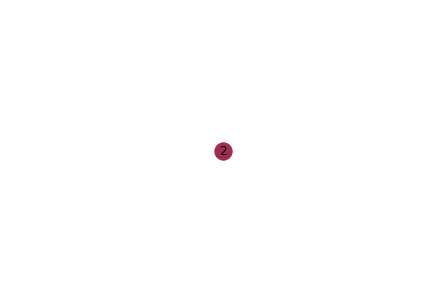

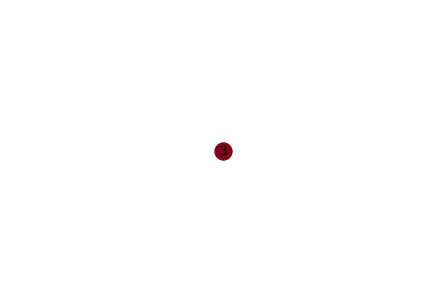

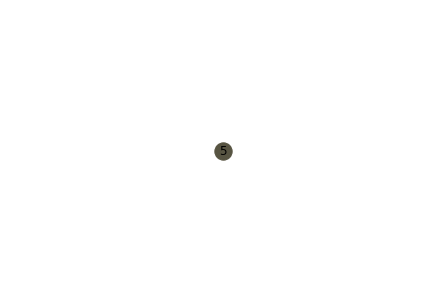

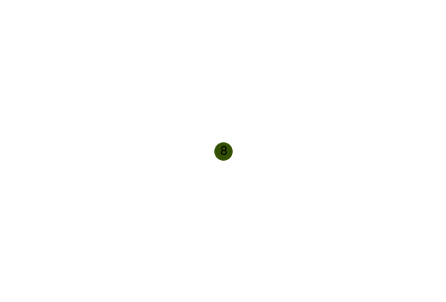

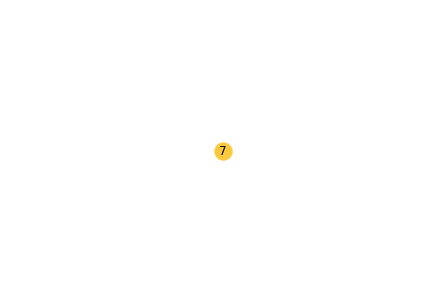

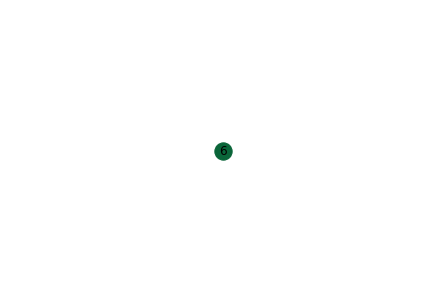

For k = 10
Clusters = [8 4 7 0 9 5 3 1 6 2]
Coditional Entropy = 0.0
F Measure = 0.18181818181818182
The internal traffic for cluster 1 = 0.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 0.0
The emulated traffic between cluster 1 and cluster 4 = 0.0
The emulated traffic between cluster 1 and cluster 5 = 0.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The emulated traffic between cluster 1 and cluster 7 = 0.0
The emulated traffic between cluster 1 and cluster 8 = 0.0
The emulated traffic between cluster 1 and cluster 9 = 0.0
The emulated traffic between cluster 1 and cluster 10 = 0.0
The internal traffic for cluster 2 = 0.0
The emulated traffic between cluster 2 and cluster 3 = 0.0
The emulated traffic between cluster 2 and cluster 4 = 0.0
The emulated traffic between cluster 2 and cluster 5 = 822.0
The emulated traffic between cluster 2 and cluster 6 = 0.0
The emulated traffic between cluster 2 and clus

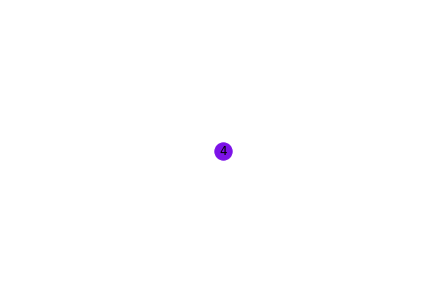

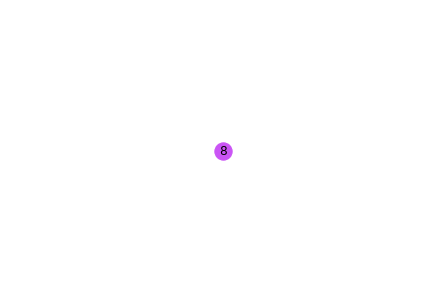

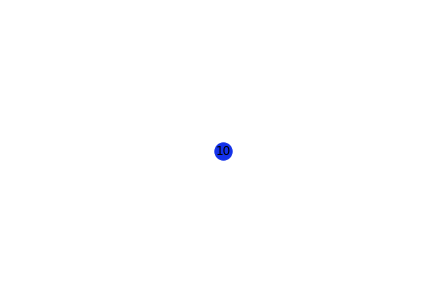

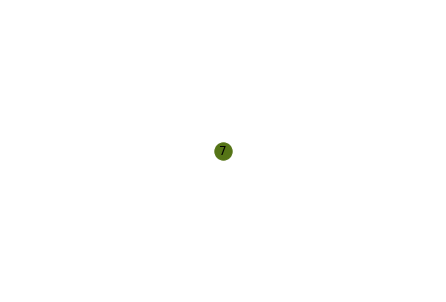

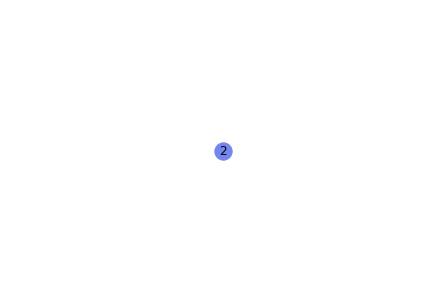

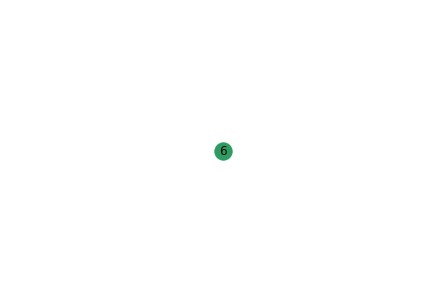

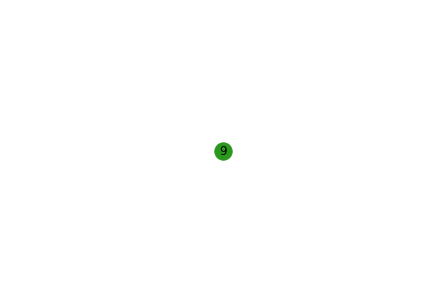

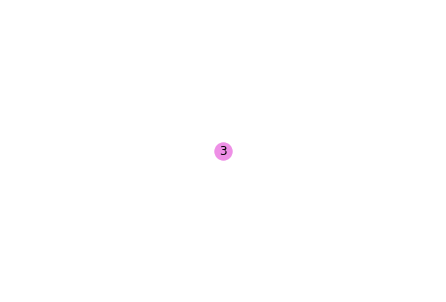

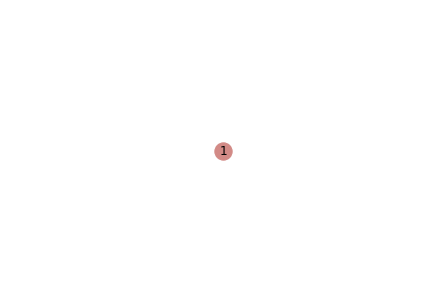

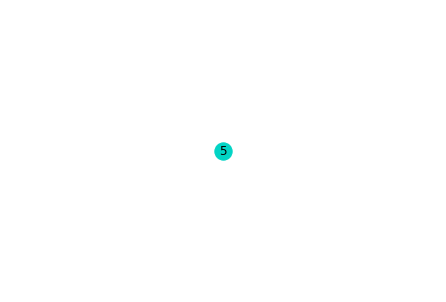

In [ ]:
#nodes = 10
# toplogy 9
example = examples[9]
gt = ground_truth_array[9]
print("Clusters for example 10_9")
for j in K_values_10:
  A = similarity_matrix(example)
  Y = Normalized_cut(A, j)
  cluster_matrix = get_traffic(Y, A)
  print("For k =",j)
  print("Clusters =",Y)
  print("Coditional Entropy =", conditional_entropy(Y, gt))
  print("F Measure =", f_measure(precision(Y, gt), recall(Y, gt)))
  for i in range(cluster_matrix.shape[0]):
    print("The internal traffic for cluster",i+1,"=",cluster_matrix[i,i])
    for k in range(cluster_matrix.shape[0]):
      if (i != k and k > i):
        print("The emulated traffic between cluster", i+1, "and cluster", k+1,"=",cluster_matrix[i][k])
  print("The graph after clustering:")
  visualize_topologies_afterClustering(example, Y)

Clusters for example 50_0
For k = 2
Clusters = [1 0 0 1 0 0 1 1 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 0 0 1
 0 1 0 0 0 0 0 0 0 1 0 0 0]
Coditional Entropy = 0.8699312838216944
F Measure = 0.4479905437352246
The internal traffic for cluster 1 = 33057.0
The emulated traffic between cluster 1 and cluster 2 = 8752.0
The internal traffic for cluster 2 = 6468.0
The graph after clustering:


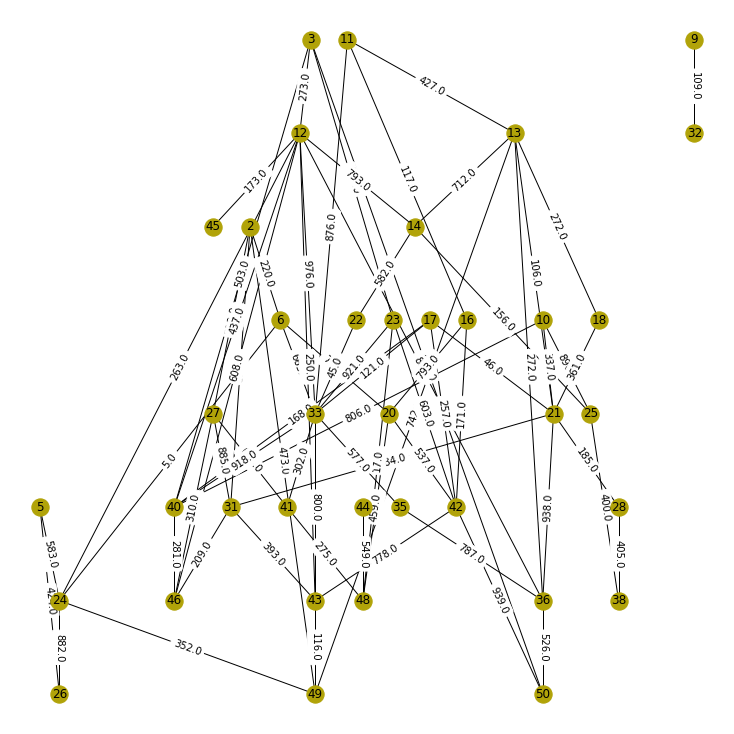

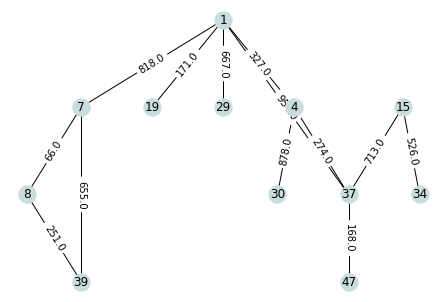

For k = 10
Clusters = [9 0 1 2 3 2 9 9 7 4 3 6 0 8 5 2 1 0 2 2 4 8 1 3 4 3 0 4 9 2 0 7 1 3 2 1 5
 4 1 6 2 1 1 2 6 6 5 2 0 1]
Coditional Entropy = 0.6003909269822585
F Measure = 0.30272727272727273
The internal traffic for cluster 1 = 3245.0
The emulated traffic between cluster 1 and cluster 2 = 781.0
The emulated traffic between cluster 1 and cluster 3 = 834.0
The emulated traffic between cluster 1 and cluster 4 = 779.0
The emulated traffic between cluster 1 and cluster 5 = 751.0
The emulated traffic between cluster 1 and cluster 6 = 106.0
The emulated traffic between cluster 1 and cluster 7 = 519.0
The emulated traffic between cluster 1 and cluster 8 = 0.0
The emulated traffic between cluster 1 and cluster 9 = 712.0
The emulated traffic between cluster 1 and cluster 10 = 85.0
The internal traffic for cluster 2 = 6677.0
The emulated traffic between cluster 2 and cluster 3 = 3199.0
The emulated traffic between cluster 2 and cluster 4 = 876.0
The emulated traffic between cluster 2 and cl

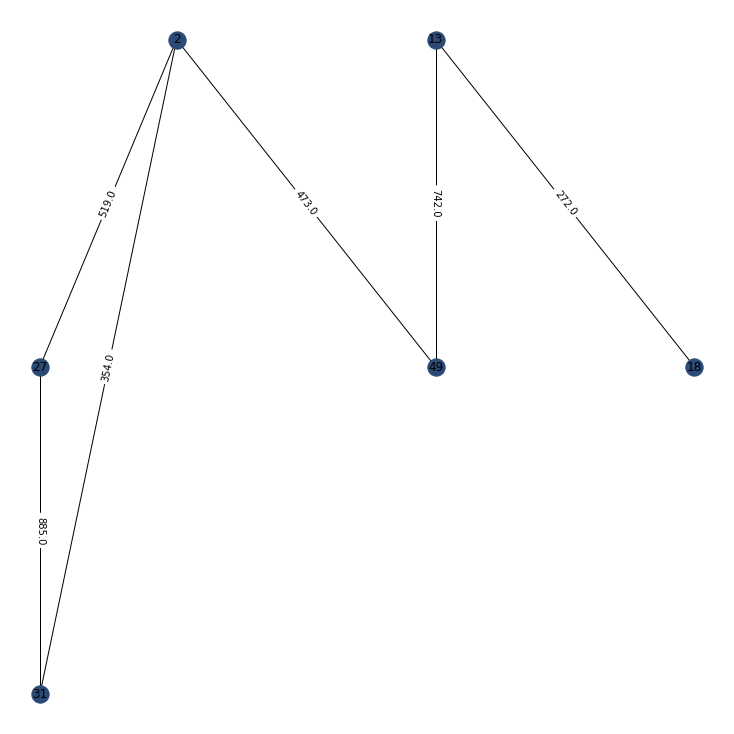

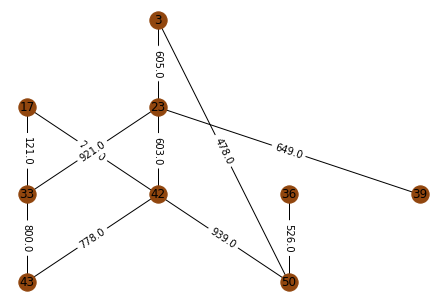

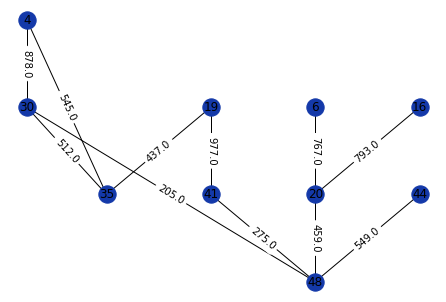

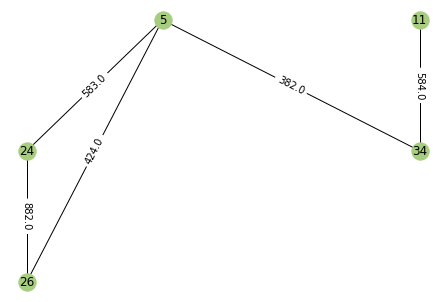

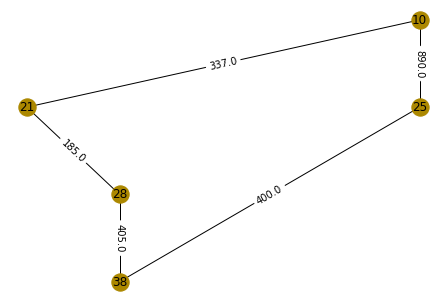

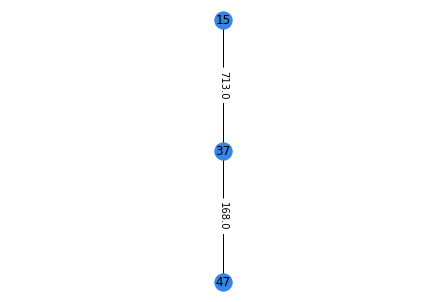

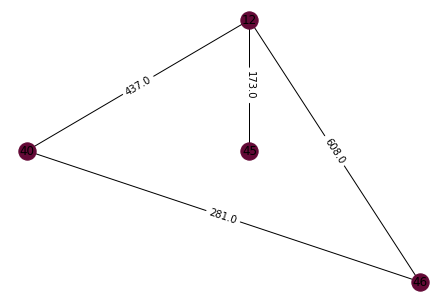

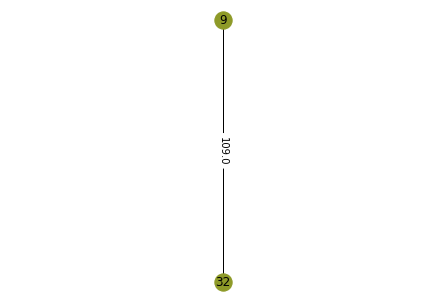

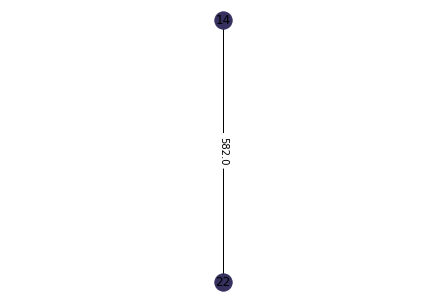

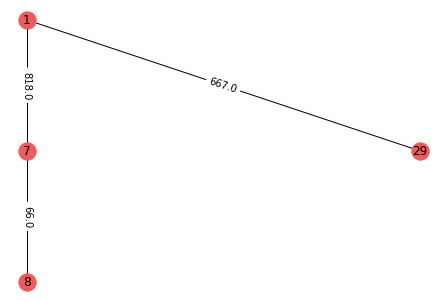

For k = 12
Clusters = [ 5  0  2  3  4  6  5  5  8  9  1  7  1 11 10  6  2  1  8  6  9 11  2  4
  9  4  0  9  5  3  0  8  2  1  3  3 10  9  5  2  0  2  2  6  7  7 10  6
  1  2]
Coditional Entropy = 0.5340466251557761
F Measure = 0.301591899386017
The internal traffic for cluster 1 = 2372.0
The emulated traffic between cluster 1 and cluster 2 = 473.0
The emulated traffic between cluster 1 and cluster 3 = 695.0
The emulated traffic between cluster 1 and cluster 4 = 0.0
The emulated traffic between cluster 1 and cluster 5 = 0.0
The emulated traffic between cluster 1 and cluster 6 = 85.0
The emulated traffic between cluster 1 and cluster 7 = 495.0
The emulated traffic between cluster 1 and cluster 8 = 519.0
The emulated traffic between cluster 1 and cluster 9 = 977.0
The emulated traffic between cluster 1 and cluster 10 = 284.0
The emulated traffic between cluster 1 and cluster 11 = 0.0
The emulated traffic between cluster 1 and cluster 12 = 0.0
The internal traffic for cluster 2 = 2025.0
T

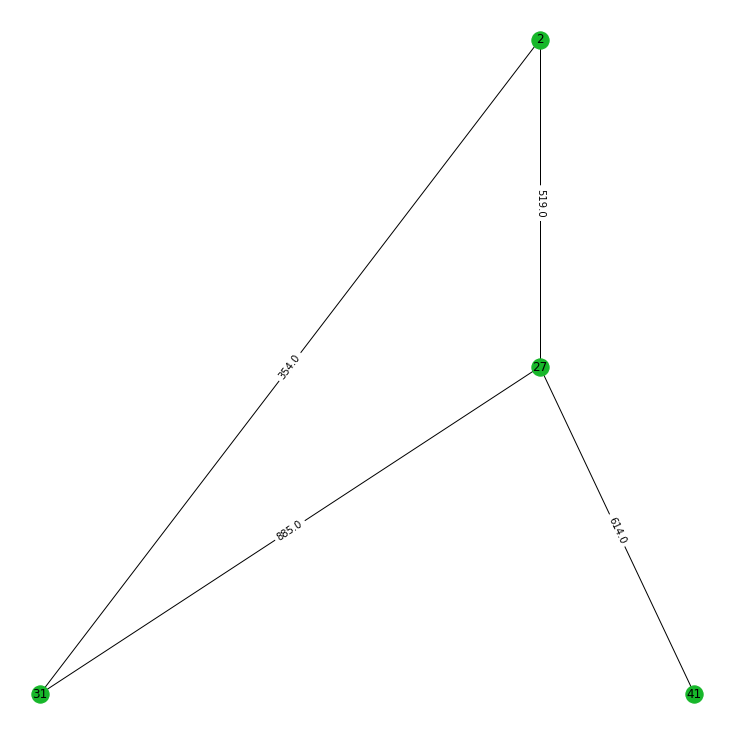

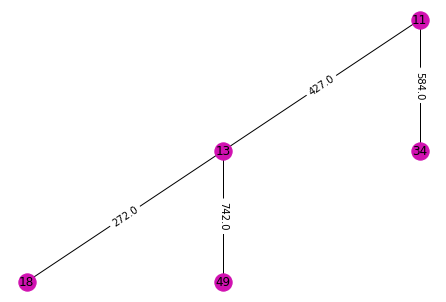

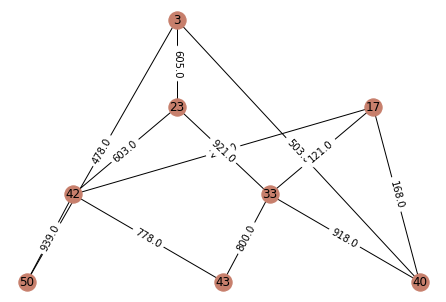

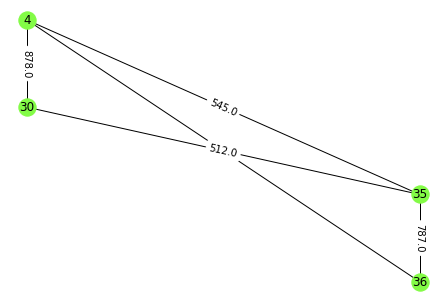

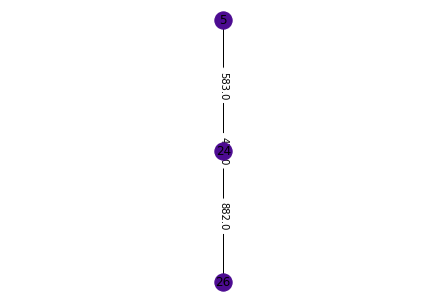

...

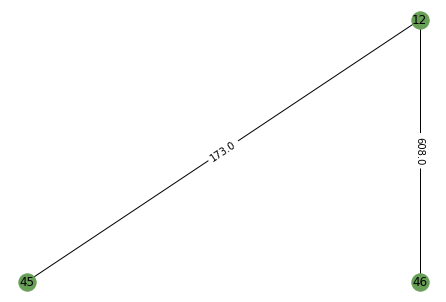

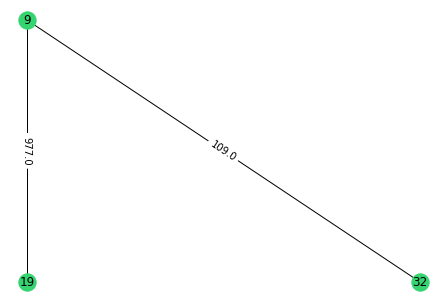

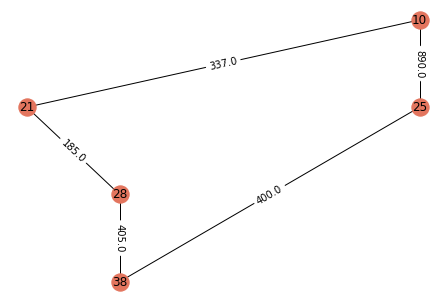

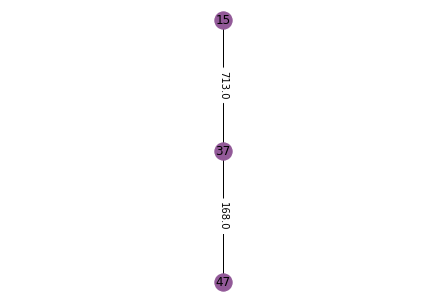

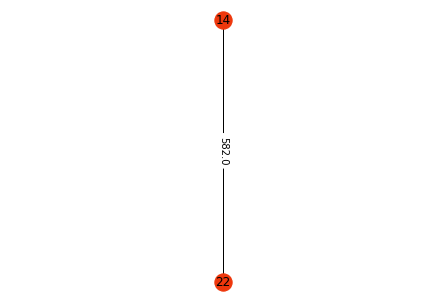

For k = 15
Clusters = [14  0  2 11  3  6  5  5  8  7  4 10  1 13  4  6  2  1 12  6  7 13  5  3
  7  3  0  7 14 11  0  8  4  4 11  2  9  7  5  4 12  2  4  6 10  0  9  6
  1  2]
Coditional Entropy = 0.49732177563541546
F Measure = 0.25317608317608314
The internal traffic for cluster 1 = 2277.0
The emulated traffic between cluster 1 and cluster 2 = 473.0
The emulated traffic between cluster 1 and cluster 3 = 0.0
The emulated traffic between cluster 1 and cluster 4 = 0.0
The emulated traffic between cluster 1 and cluster 5 = 674.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The emulated traffic between cluster 1 and cluster 7 = 220.0
The emulated traffic between cluster 1 and cluster 8 = 284.0
The emulated traffic between cluster 1 and cluster 9 = 0.0
The emulated traffic between cluster 1 and cluster 10 = 0.0
The emulated traffic between cluster 1 and cluster 11 = 608.0
The emulated traffic between cluster 1 and cluster 12 = 0.0
The emulated traffic between cluster 1 and cl

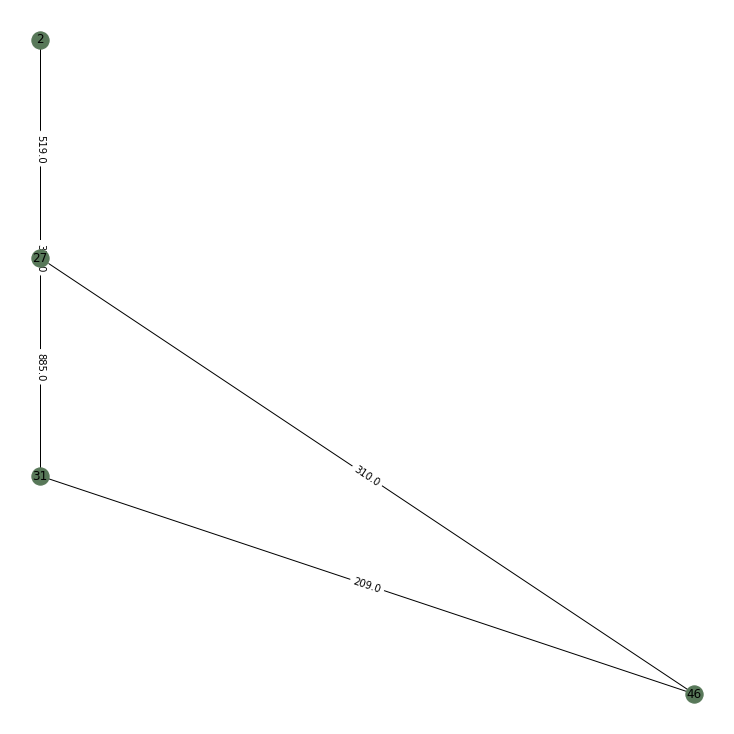

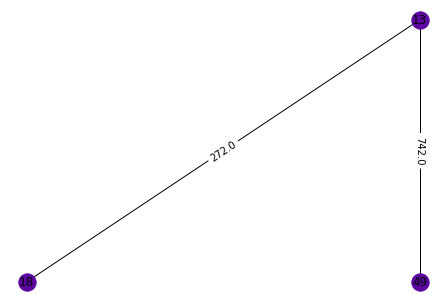

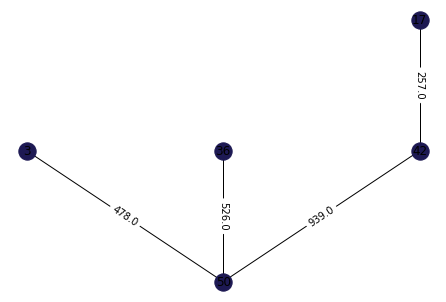

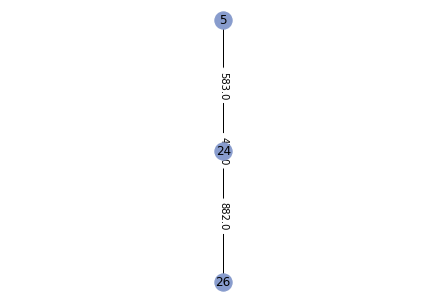

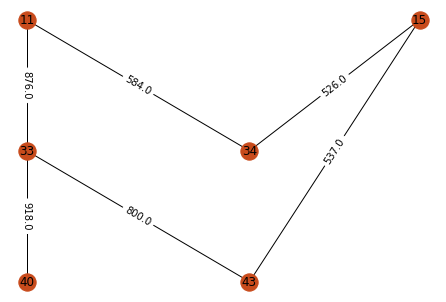

...

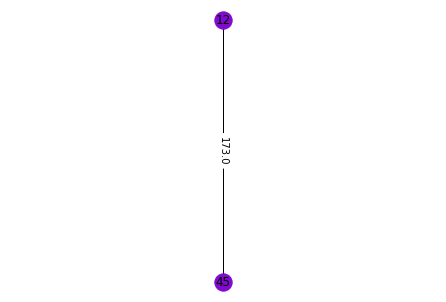

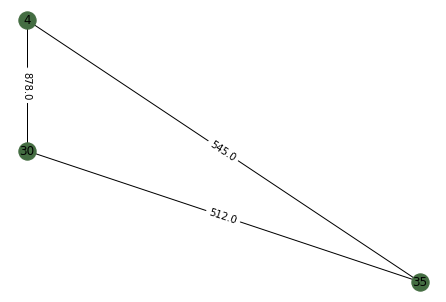

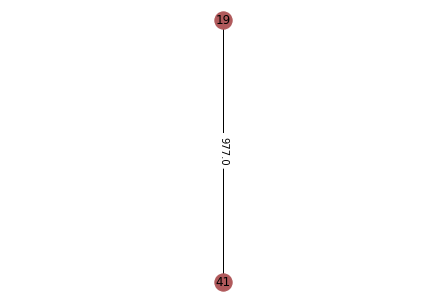

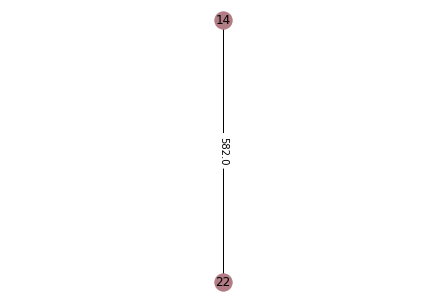

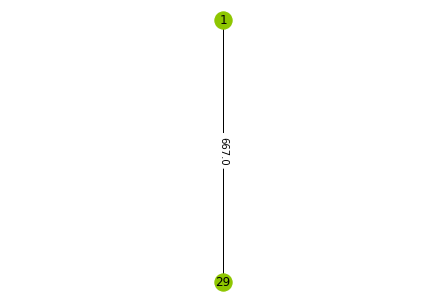

For k = 17
Clusters = [11 16  1  0  5 12  2  2 13 14  6  3 10  8  6 12 14 10  4 12 15  8  2  5
  7  5 16 15 11  0 16 13 14  6  0 15  9  7  2 14  4  1  6  4  3  3  9  4
 10  1]
Coditional Entropy = 0.4457597991435044
F Measure = 0.24581105169340464
The internal traffic for cluster 1 = 1935.0
The emulated traffic between cluster 1 and cluster 2 = 54.0
The emulated traffic between cluster 1 and cluster 3 = 0.0
The emulated traffic between cluster 1 and cluster 4 = 0.0
The emulated traffic between cluster 1 and cluster 5 = 642.0
The emulated traffic between cluster 1 and cluster 6 = 359.0
The emulated traffic between cluster 1 and cluster 7 = 0.0
The emulated traffic between cluster 1 and cluster 8 = 254.0
The emulated traffic between cluster 1 and cluster 9 = 0.0
The emulated traffic between cluster 1 and cluster 10 = 274.0
The emulated traffic between cluster 1 and cluster 11 = 0.0
The emulated traffic between cluster 1 and cluster 12 = 327.0
The emulated traffic between cluster 1 and cl

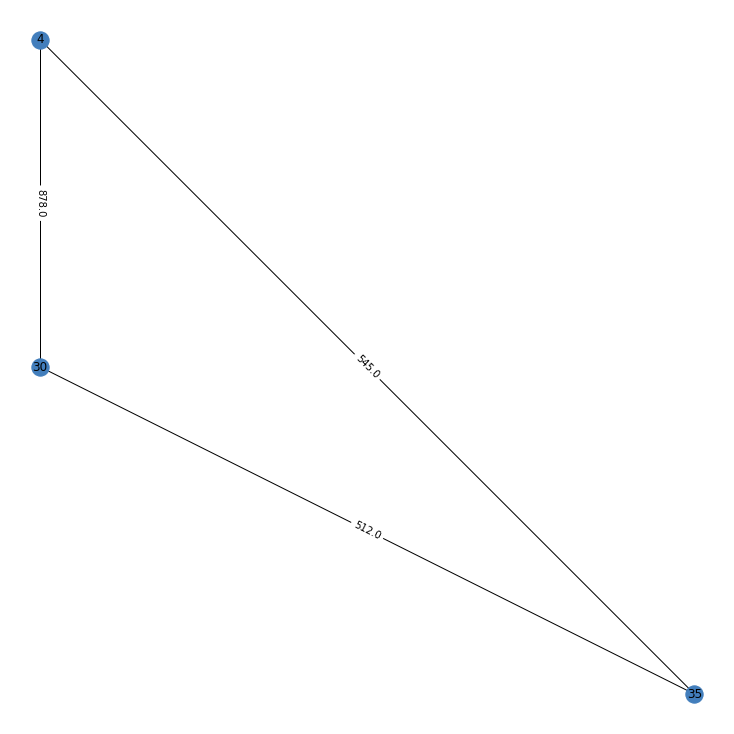

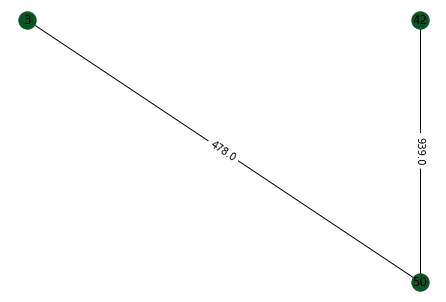

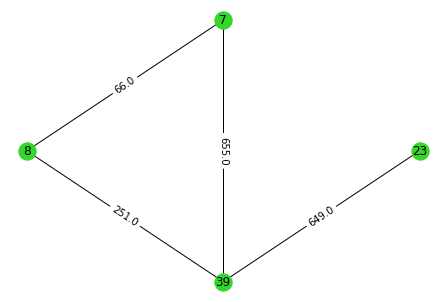

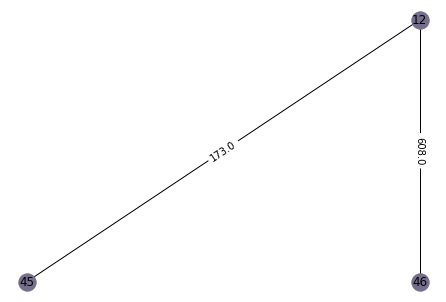

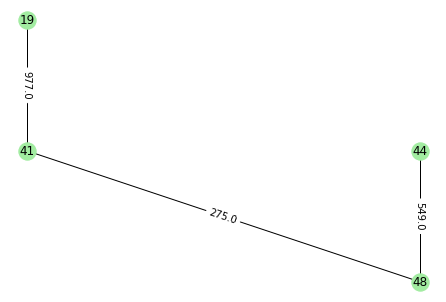

...

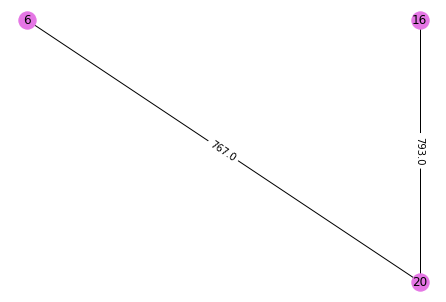

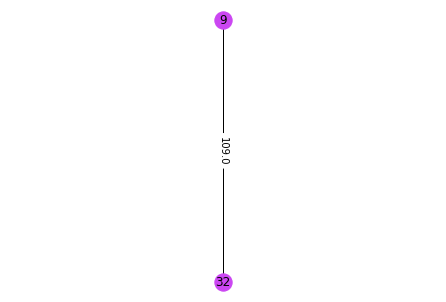

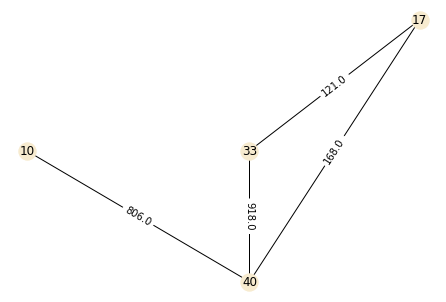

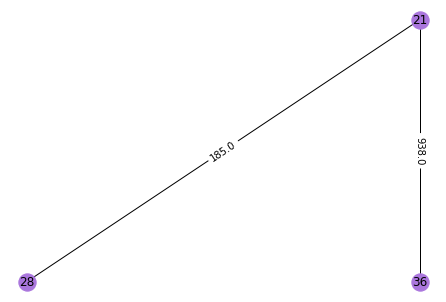

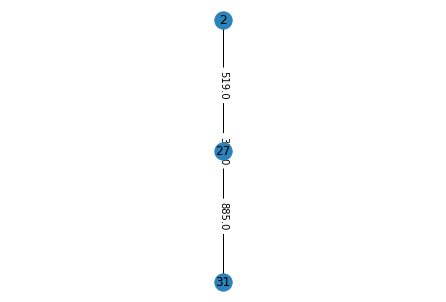

For k = 20
Clusters = [13  1 19  2 14 12  5  5  7  9  3 17  1 11  3 12  8  1 15 12 16 11 19 14
  9 14  0 18 13  2  0  7  8  3  2 16 10 18  5  8 15  6  8  4 17  0 10  4
  1  6]
Coditional Entropy = 0.36442284892402654
F Measure = 0.2681970806970807
The internal traffic for cluster 1 = 1404.0
The emulated traffic between cluster 1 and cluster 2 = 873.0
The emulated traffic between cluster 1 and cluster 3 = 0.0
The emulated traffic between cluster 1 and cluster 4 = 0.0
The emulated traffic between cluster 1 and cluster 5 = 0.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The emulated traffic between cluster 1 and cluster 7 = 0.0
The emulated traffic between cluster 1 and cluster 8 = 0.0
The emulated traffic between cluster 1 and cluster 9 = 674.0
The emulated traffic between cluster 1 and cluster 10 = 0.0
The emulated traffic between cluster 1 and cluster 11 = 0.0
The emulated traffic between cluster 1 and cluster 12 = 0.0
The emulated traffic between cluster 1 and cluster 1

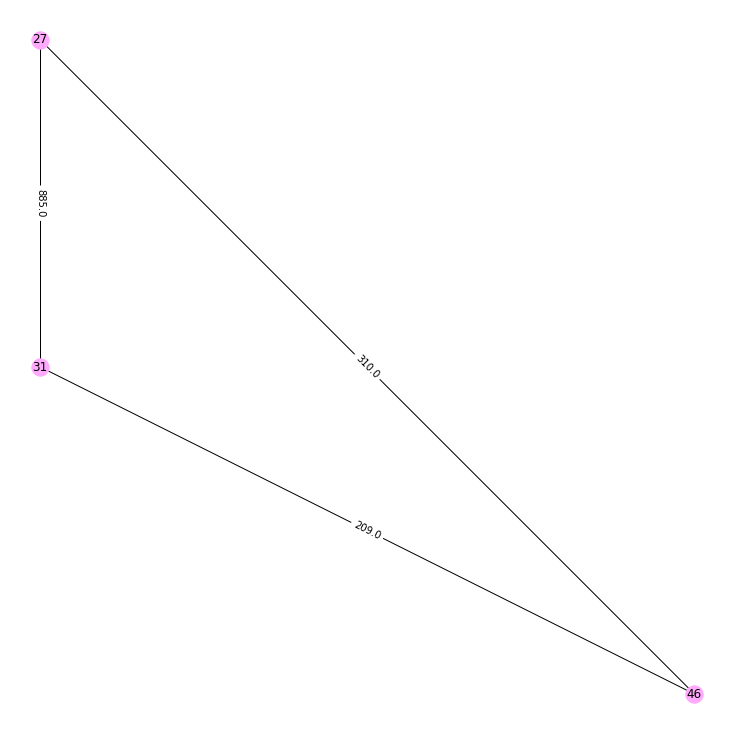

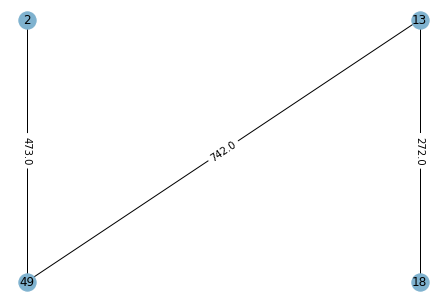

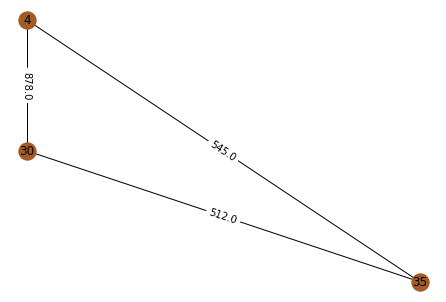

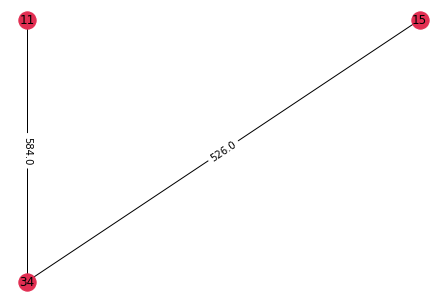

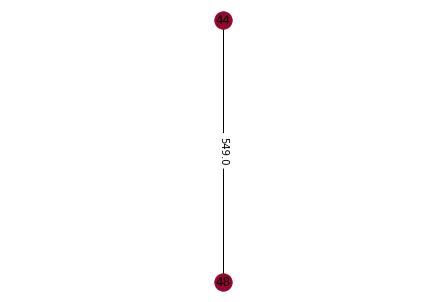

...

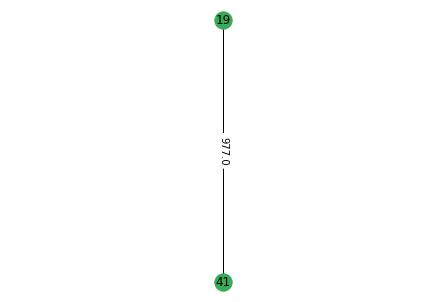

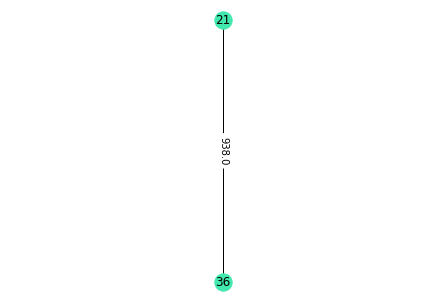

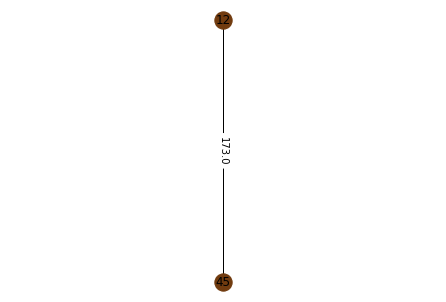

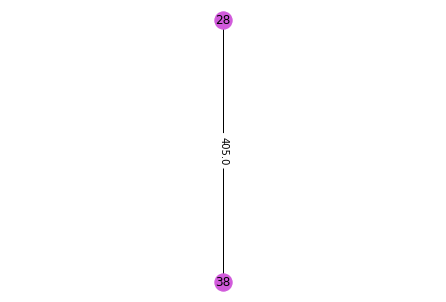

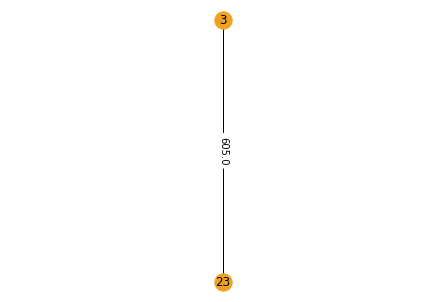

For k = 25
Clusters = [15  1 23  9  2 24  3  3  7  6 16 12 10  8 16  4 22 10 19  4  5  8 20  2
  6  2 11 18 15  9 11  7  0 16  5  5 13 18 20 23 19 17 21 14 12 11 13 14
  1 17]
Coditional Entropy = 0.2951270985311078
F Measure = 0.3042943722943723
The internal traffic for cluster 1 = 0.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 0.0
The emulated traffic between cluster 1 and cluster 4 = 0.0
The emulated traffic between cluster 1 and cluster 5 = 0.0
The emulated traffic between cluster 1 and cluster 6 = 577.0
The emulated traffic between cluster 1 and cluster 7 = 0.0
The emulated traffic between cluster 1 and cluster 8 = 0.0
The emulated traffic between cluster 1 and cluster 9 = 45.0
The emulated traffic between cluster 1 and cluster 10 = 0.0
The emulated traffic between cluster 1 and cluster 11 = 0.0
The emulated traffic between cluster 1 and cluster 12 = 0.0
The emulated traffic between cluster 1 and cluster 13 = 9

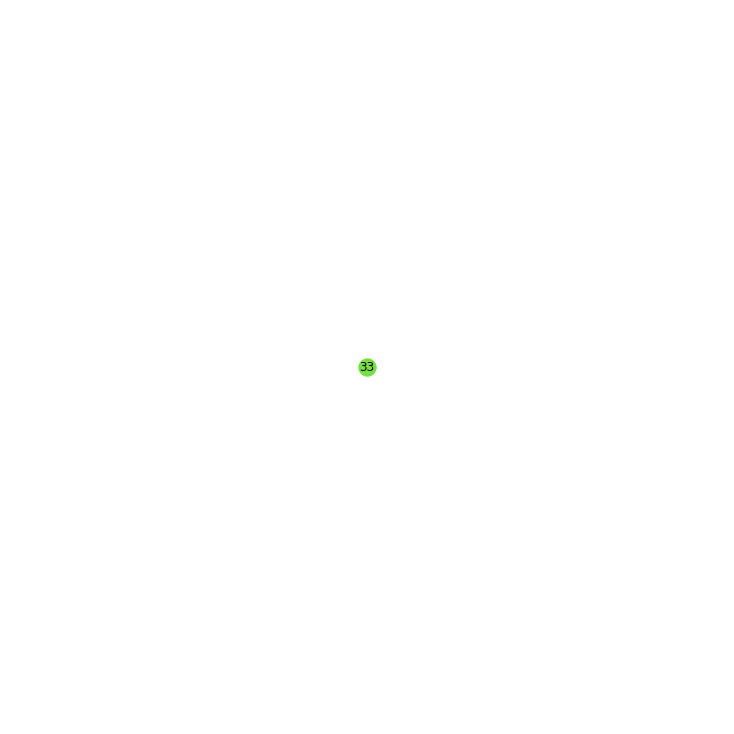

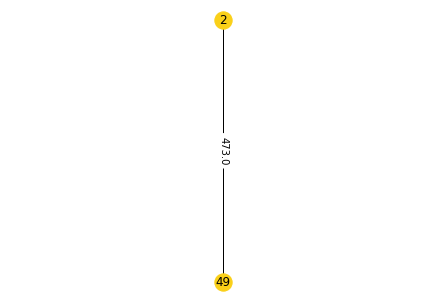

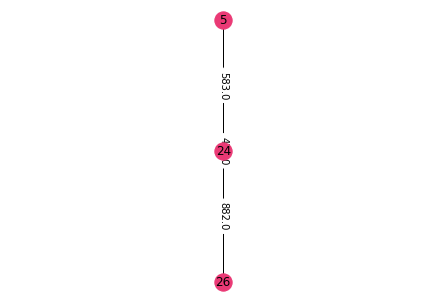

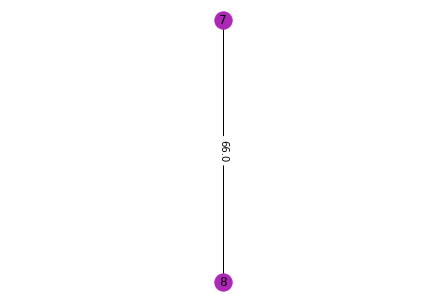

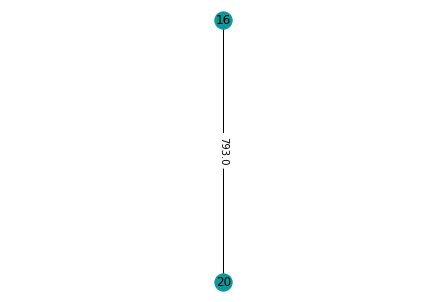

...

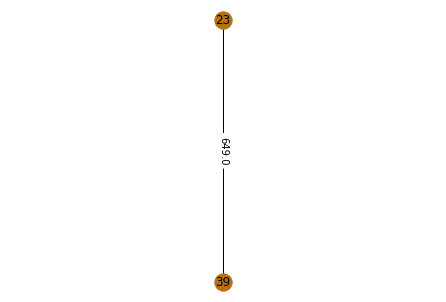

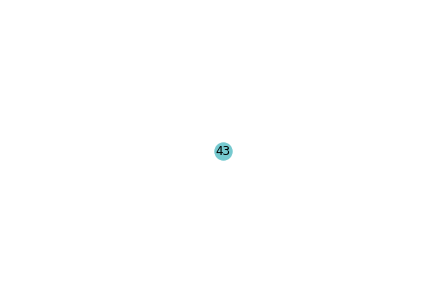

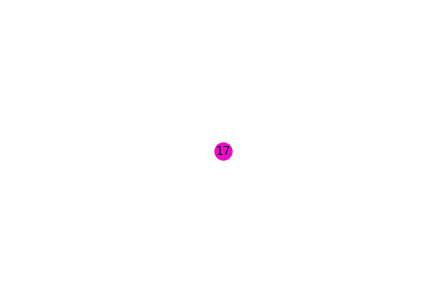

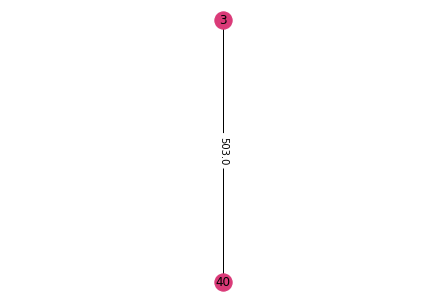

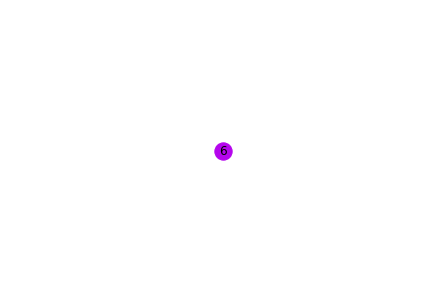

In [ ]:
#nodes = 50
# toplogy 0
example = examples[len(examples)-1-0]
gt = ground_truth_array[10+0]
print("Clusters for example 50_0")
for j in K_values_50:
  A = similarity_matrix(example)
  Y = Normalized_cut(A, j)
  cluster_matrix = get_traffic(Y, A)
  print("For k =",j)
  print("Clusters =",Y)
  print("Coditional Entropy =", conditional_entropy(Y, gt))
  print("F Measure =", f_measure(precision(Y, gt), recall(Y, gt)))
  for i in range(cluster_matrix.shape[0]):
    print("The internal traffic for cluster",i+1,"=",cluster_matrix[i,i])
    for k in range(cluster_matrix.shape[0]):
      if (i != k and k > i):
        print("The emulated traffic between cluster", i+1, "and cluster", k+1,"=",cluster_matrix[i][k])
  print("The graph after clustering:")
  visualize_topologies_afterClustering(example, Y)

Clusters for example 50_1
For k = 2
Clusters = [0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 1 0 0 0 0 0 0 0 0]
Coditional Entropy = 1.1757281129335573
F Measure = 0.32547169811320753
The internal traffic for cluster 1 = 49888.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The internal traffic for cluster 2 = 0.0
The graph after clustering:


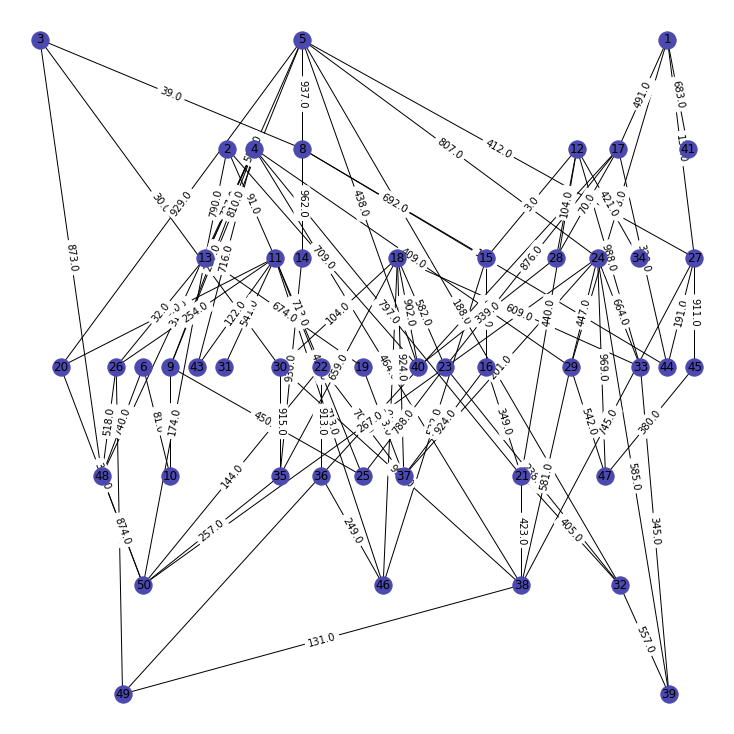

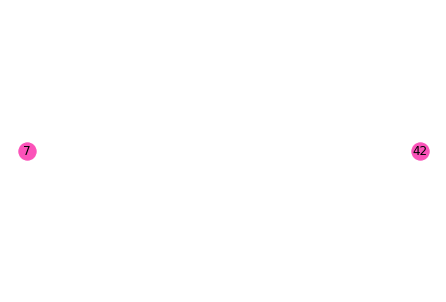

For k = 10
Clusters = [7 4 2 1 1 2 1 0 5 5 8 6 0 0 0 0 3 0 0 8 1 8 3 1 5 2 1 4 1 1 8 1 6 6 0 8 0
 1 1 4 7 9 1 3 1 8 1 2 2 2]
Coditional Entropy = 0.705111628497803
F Measure = 0.3657703081232493
The internal traffic for cluster 1 = 7411.0
The emulated traffic between cluster 1 and cluster 2 = 3788.0
The emulated traffic between cluster 1 and cluster 3 = 502.0
The emulated traffic between cluster 1 and cluster 4 = 600.0
The emulated traffic between cluster 1 and cluster 5 = 1692.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The emulated traffic between cluster 1 and cluster 7 = 612.0
The emulated traffic between cluster 1 and cluster 8 = 0.0
The emulated traffic between cluster 1 and cluster 9 = 2075.0
The emulated traffic between cluster 1 and cluster 10 = 0.0
The internal traffic for cluster 2 = 11329.0
The emulated traffic between cluster 2 and cluster 3 = 740.0
The emulated traffic between cluster 2 and cluster 4 = 429.0
The emulated traffic between cluster 2 and clus

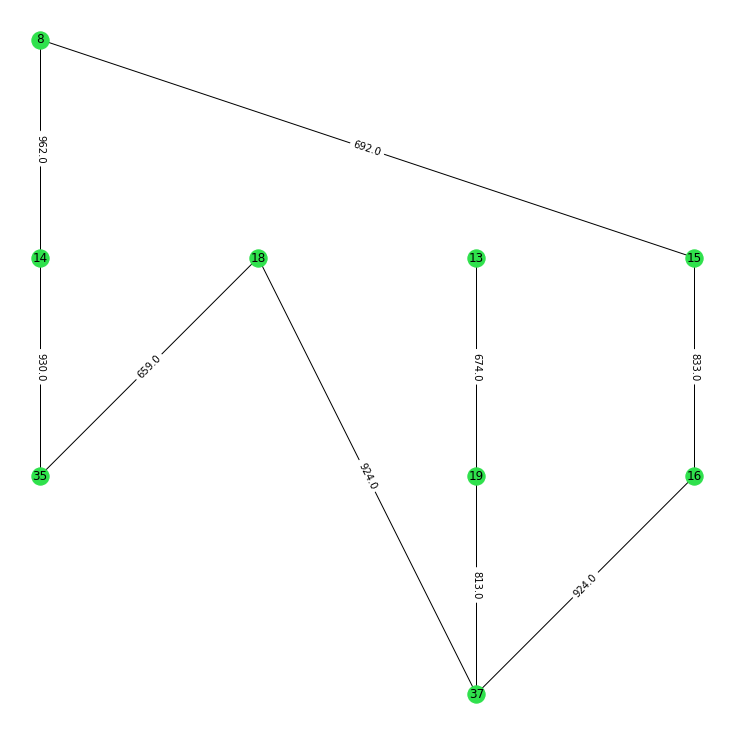

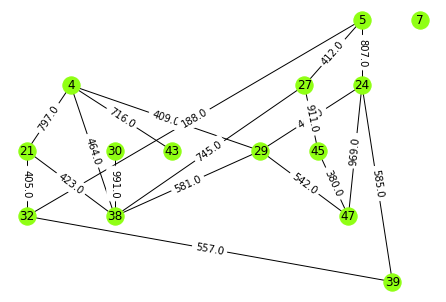

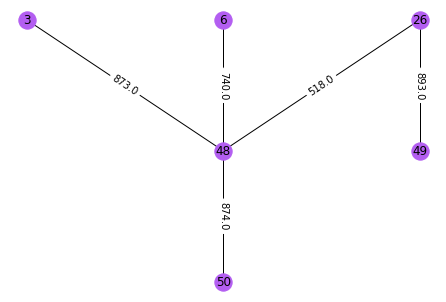

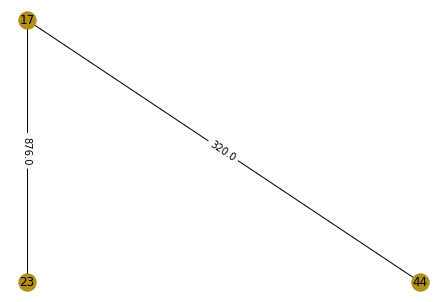

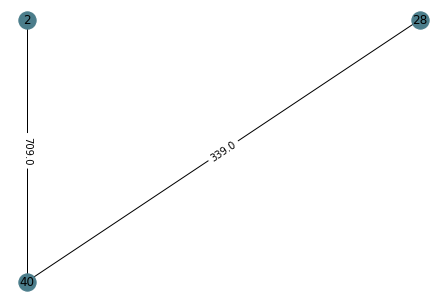

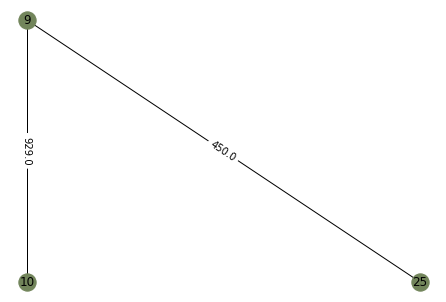

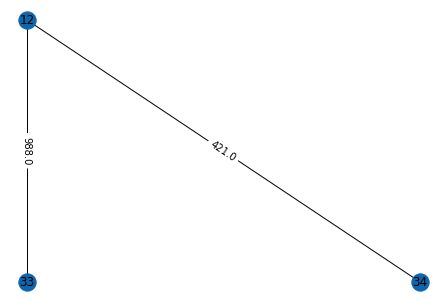

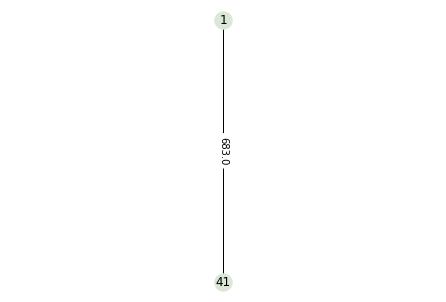

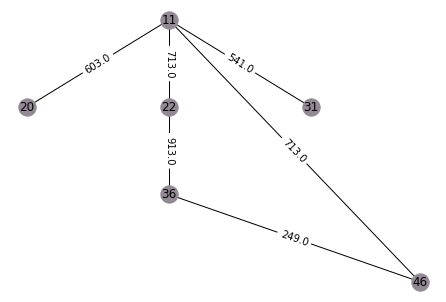

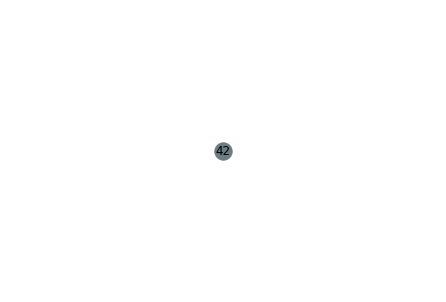

For k = 12
Clusters = [ 7  0  4  3  8  4 11  1  5  5  8  9  0  1  1  1  2  1  1  8  3  1  2  3
  5  6  3  0  3  3  8  3  9  9  1  1  1  3  3  0  7 10  3  2  3  1  3  4
  6  4]
Coditional Entropy = 0.6416940389650734
F Measure = 0.4055555555555556
The internal traffic for cluster 1 = 1838.0
The emulated traffic between cluster 1 and cluster 2 = 1576.0
The emulated traffic between cluster 1 and cluster 3 = 70.0
The emulated traffic between cluster 1 and cluster 4 = 727.0
The emulated traffic between cluster 1 and cluster 5 = 174.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The emulated traffic between cluster 1 and cluster 7 = 32.0
The emulated traffic between cluster 1 and cluster 8 = 0.0
The emulated traffic between cluster 1 and cluster 9 = 1084.0
The emulated traffic between cluster 1 and cluster 10 = 104.0
The emulated traffic between cluster 1 and cluster 11 = 0.0
The emulated traffic between cluster 1 and cluster 12 = 0.0
The internal traffic for cluster 2 = 9974.0

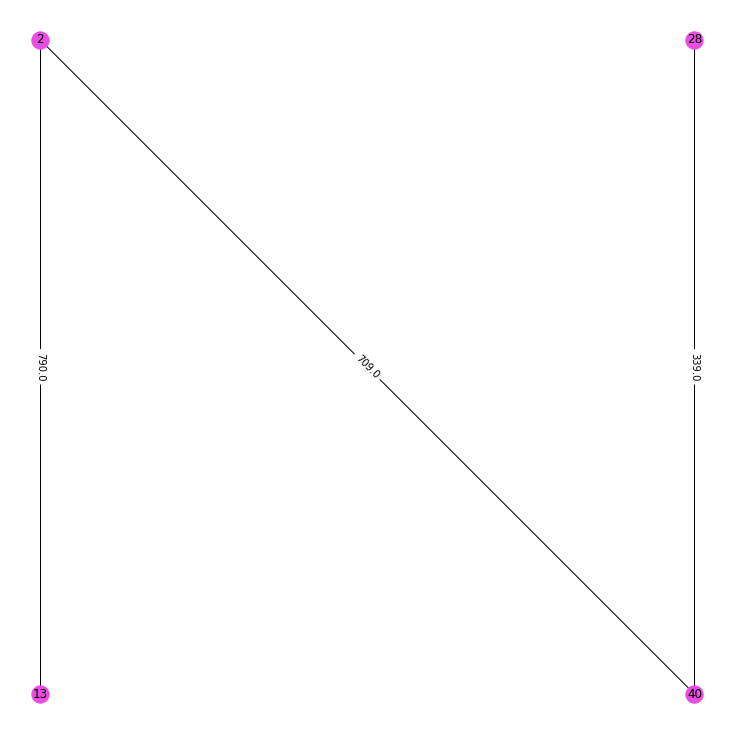

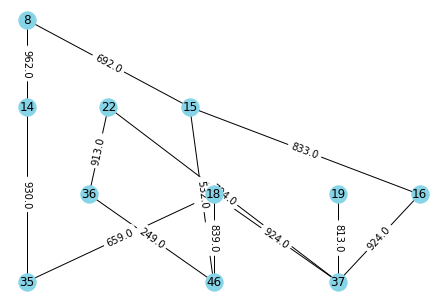

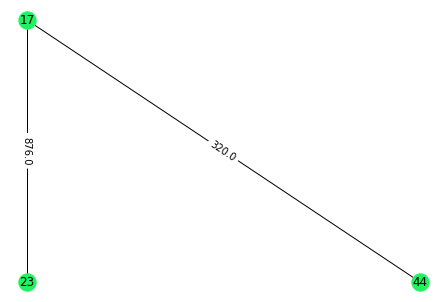

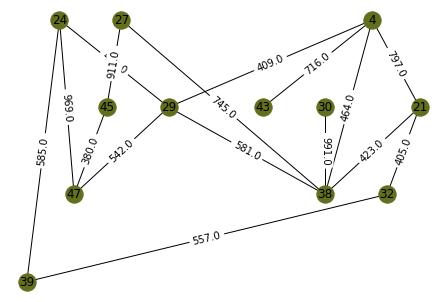

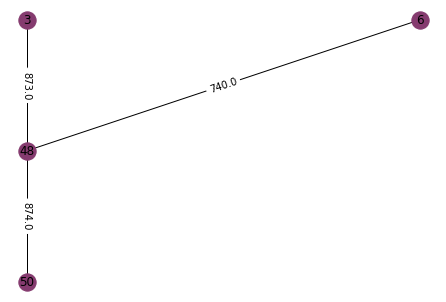

...

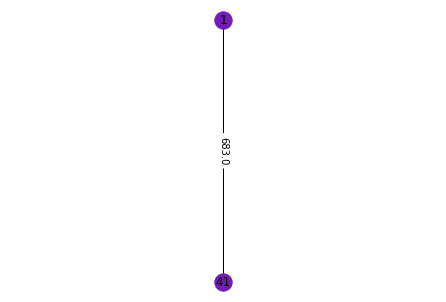

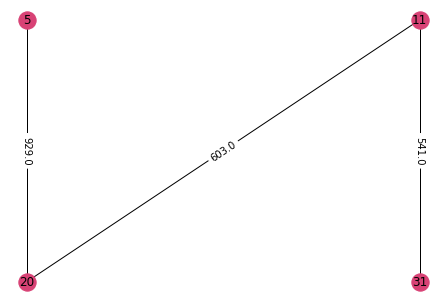

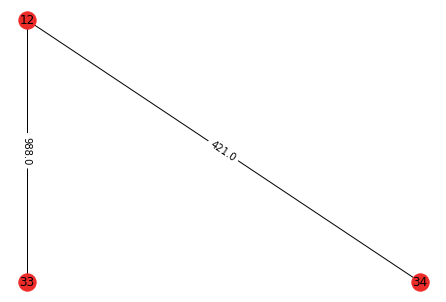

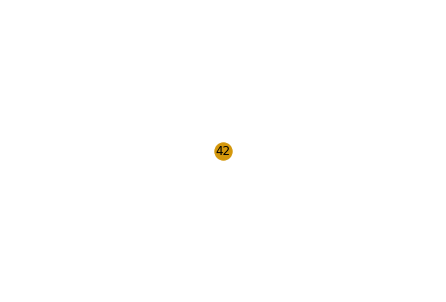

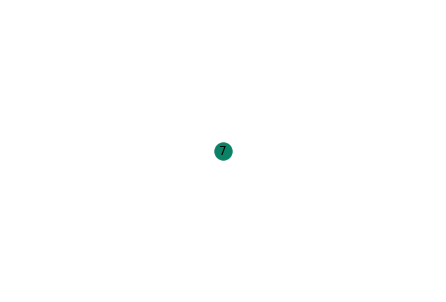

For k = 15
Clusters = [ 7 11  2 10  8  2 14  4  3  3  8 12 10  4  1  1 13  1  1  8 10  6  3  5
  3  9  0 11  0  4  8  5  5 12  4  6  1  0  5 11  7  6 10 13  0  1  0  2
  9  2]
Coditional Entropy = 0.5095184968834208
F Measure = 0.40888888888888897
The internal traffic for cluster 1 = 3159.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 0.0
The emulated traffic between cluster 1 and cluster 4 = 0.0
The emulated traffic between cluster 1 and cluster 5 = 991.0
The emulated traffic between cluster 1 and cluster 6 = 1416.0
The emulated traffic between cluster 1 and cluster 7 = 0.0
The emulated traffic between cluster 1 and cluster 8 = 442.0
The emulated traffic between cluster 1 and cluster 9 = 412.0
The emulated traffic between cluster 1 and cluster 10 = 131.0
The emulated traffic between cluster 1 and cluster 11 = 1296.0
The emulated traffic between cluster 1 and cluster 12 = 0.0
The emulated traffic between cluster 1 and

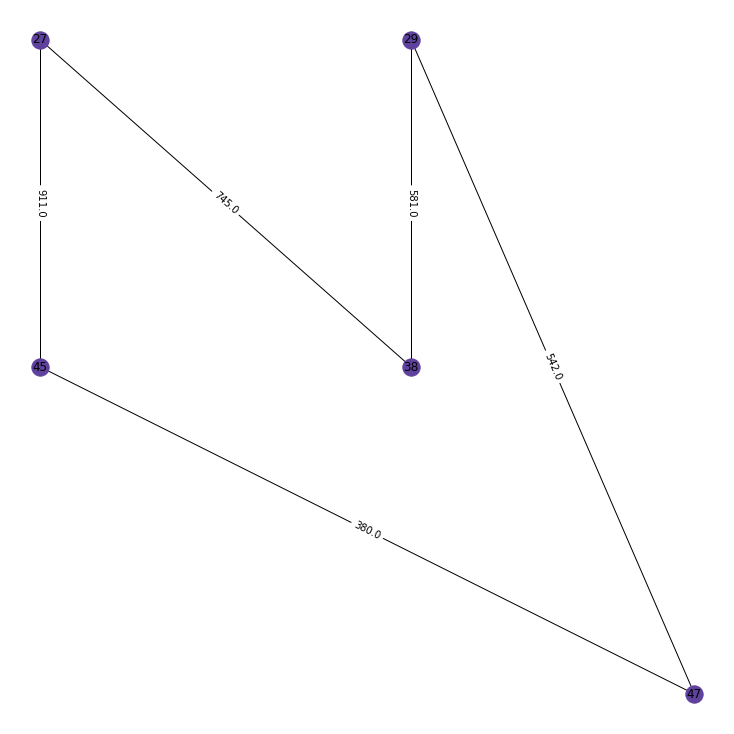

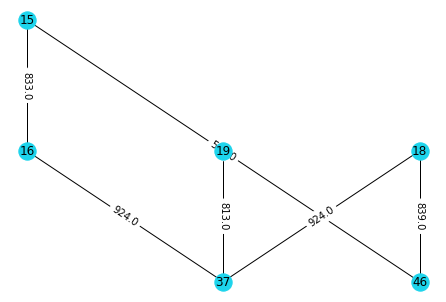

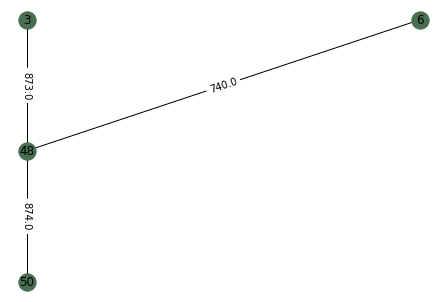

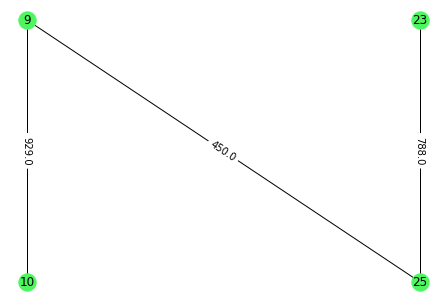

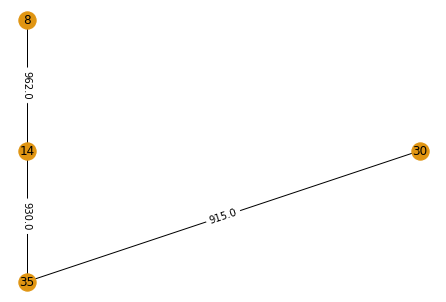

...

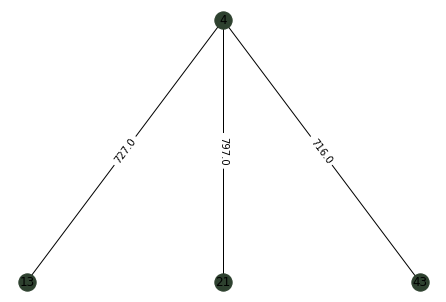

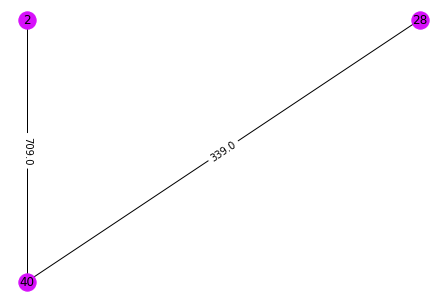

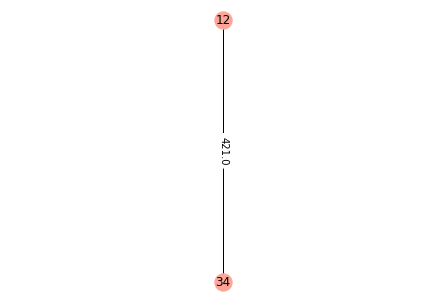

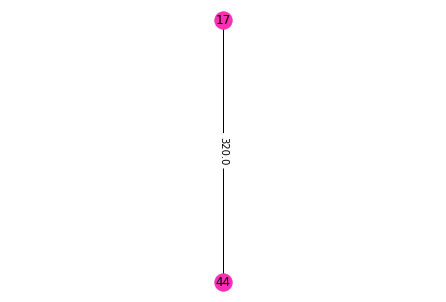

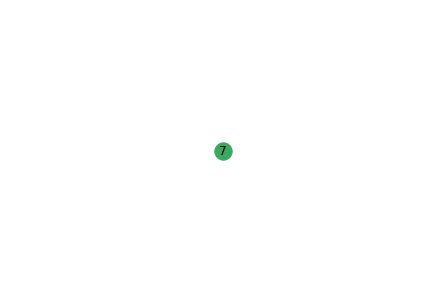

For k = 17
Clusters = [12 15  5  6 13  5 16  1 14 14  0  8 15  1  1 13  4 13 15 13  6  7  4 10
  4  9  2  3  2  1  0 10 10  8  1  7 13  2 10  3 12 11  6  4  2  7  2  5
  9  5]
Coditional Entropy = 0.48823202437529295
F Measure = 0.38683473389355744
The internal traffic for cluster 1 = 541.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 0.0
The emulated traffic between cluster 1 and cluster 4 = 0.0
The emulated traffic between cluster 1 and cluster 5 = 431.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The emulated traffic between cluster 1 and cluster 7 = 122.0
The emulated traffic between cluster 1 and cluster 8 = 1426.0
The emulated traffic between cluster 1 and cluster 9 = 0.0
The emulated traffic between cluster 1 and cluster 10 = 254.0
The emulated traffic between cluster 1 and cluster 11 = 0.0
The emulated traffic between cluster 1 and cluster 12 = 0.0
The emulated traffic between cluster 1 and clus

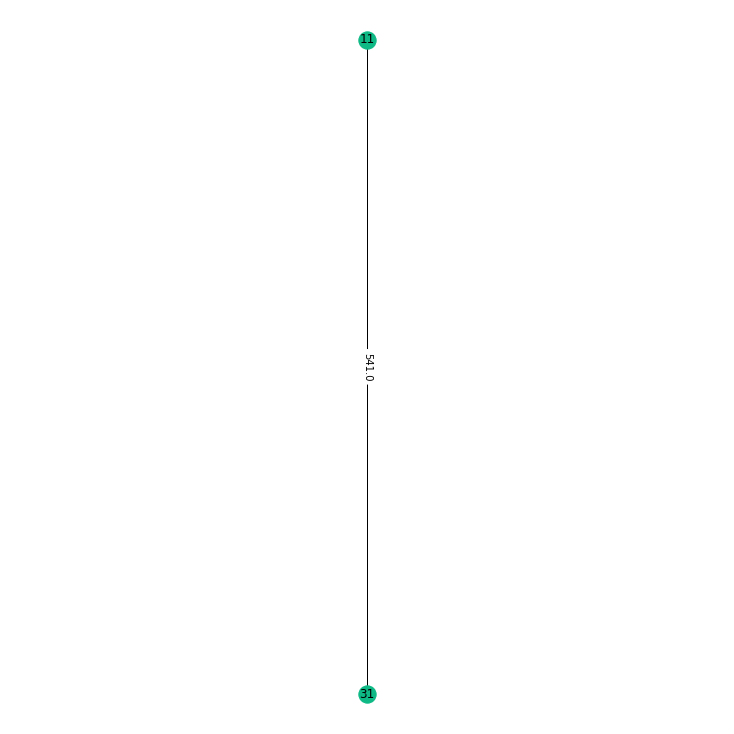

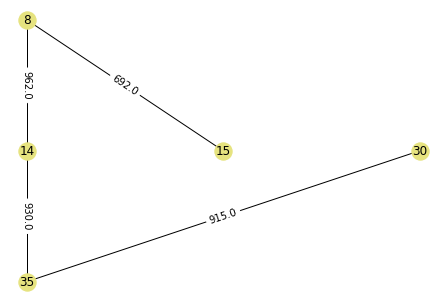

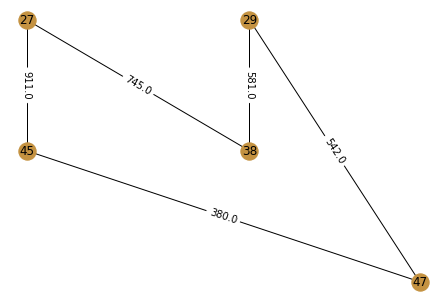

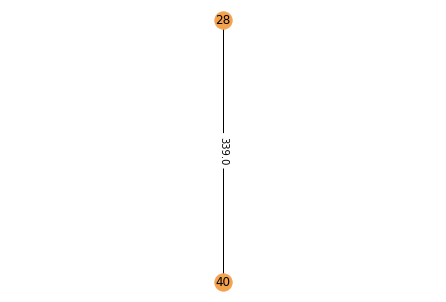

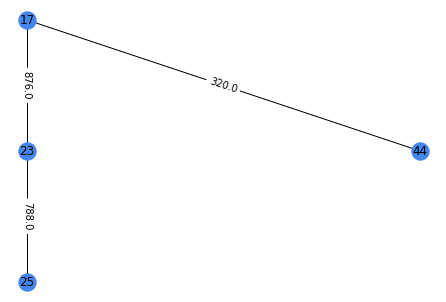

...

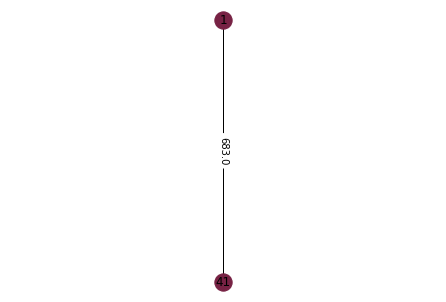

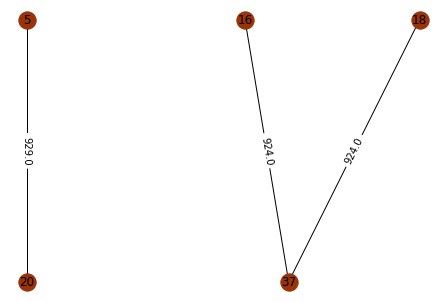

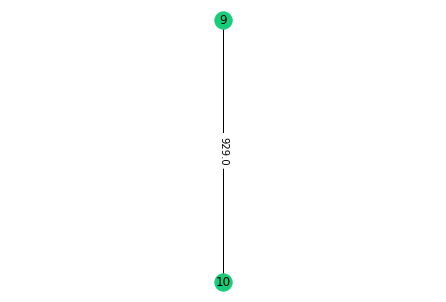

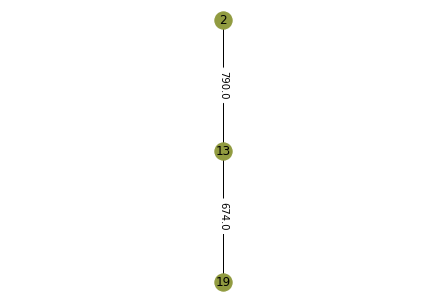

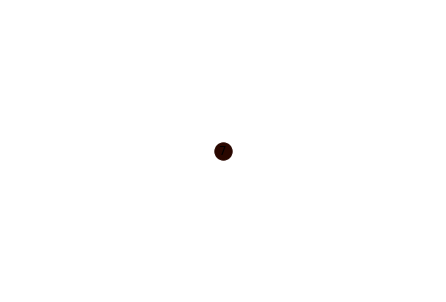

For k = 20
Clusters = [ 9 16  5 18  0  5 15 19 11 11 12  4 16 19 14 14  1  7  7  0  2 10  1  2
  1  6  8  4  3  3 12  2  2  4 19 10  7  3  2 16  9 17 18 13  8 14  8  5
  6  5]
Coditional Entropy = 0.4193272009646322
F Measure = 0.39440476190476187
The internal traffic for cluster 1 = 929.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 995.0
The emulated traffic between cluster 1 and cluster 4 = 0.0
The emulated traffic between cluster 1 and cluster 5 = 0.0
The emulated traffic between cluster 1 and cluster 6 = 354.0
The emulated traffic between cluster 1 and cluster 7 = 0.0
The emulated traffic between cluster 1 and cluster 8 = 0.0
The emulated traffic between cluster 1 and cluster 9 = 412.0
The emulated traffic between cluster 1 and cluster 10 = 0.0
The emulated traffic between cluster 1 and cluster 11 = 0.0
The emulated traffic between cluster 1 and cluster 12 = 810.0
The emulated traffic between cluster 1 and cluste

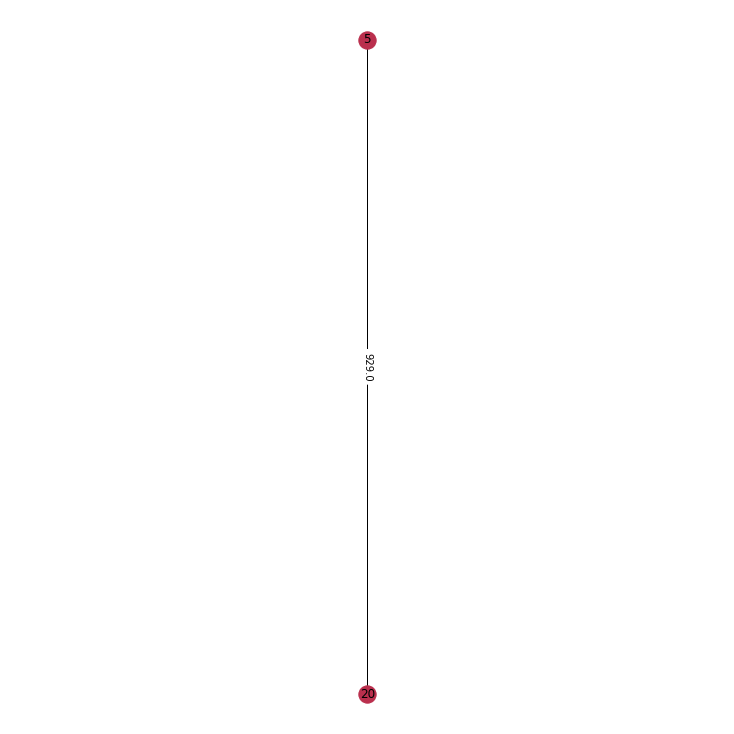

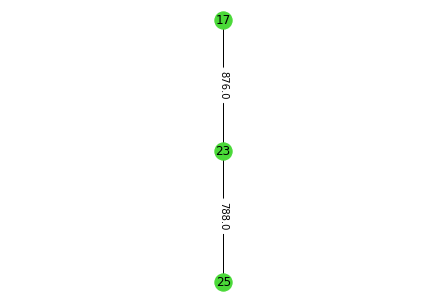

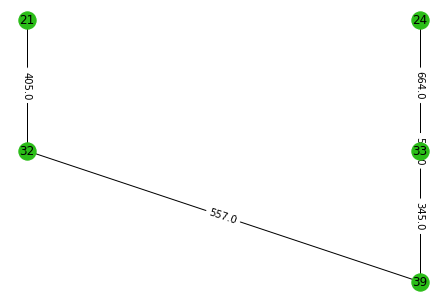

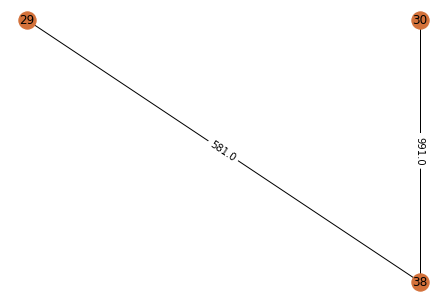

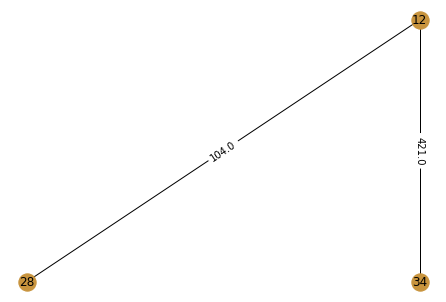

...

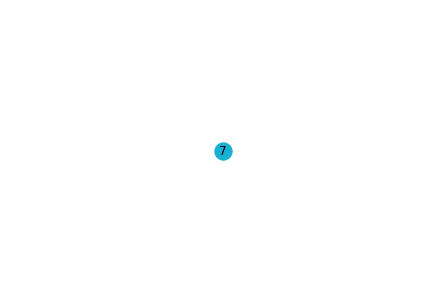

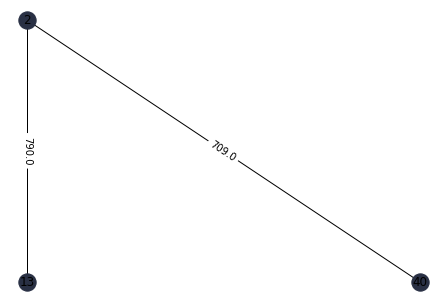

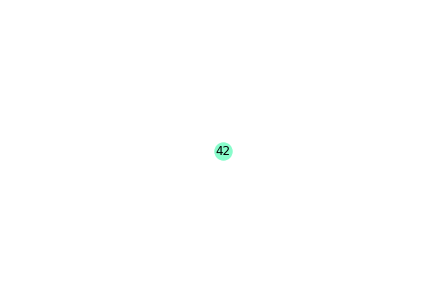

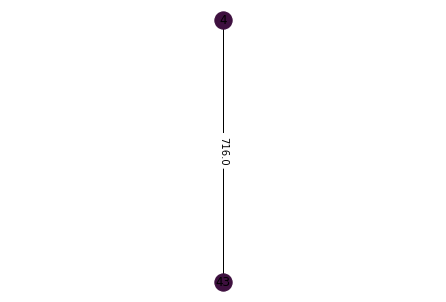

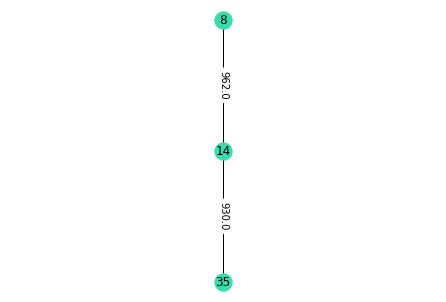

For k = 25
Clusters = [ 9  7 17  1  3 17 15 21 10 10  2  8 11 21 22 22 12  2 11  3  1 14 12  6
 12  5  4 19  6  0 24 23  8 18  0 14 11  1 23  7  9 16 13 20  4  2  6 17
  5  3]
Coditional Entropy = 0.3087617254212915
F Measure = 0.4360952380952381
The internal traffic for cluster 1 = 915.0
The emulated traffic between cluster 1 and cluster 2 = 991.0
The emulated traffic between cluster 1 and cluster 3 = 763.0
The emulated traffic between cluster 1 and cluster 4 = 257.0
The emulated traffic between cluster 1 and cluster 5 = 0.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The emulated traffic between cluster 1 and cluster 7 = 0.0
The emulated traffic between cluster 1 and cluster 8 = 0.0
The emulated traffic between cluster 1 and cluster 9 = 0.0
The emulated traffic between cluster 1 and cluster 10 = 0.0
The emulated traffic between cluster 1 and cluster 11 = 0.0
The emulated traffic between cluster 1 and cluster 12 = 0.0
The emulated traffic between cluster 1 and cluster 1

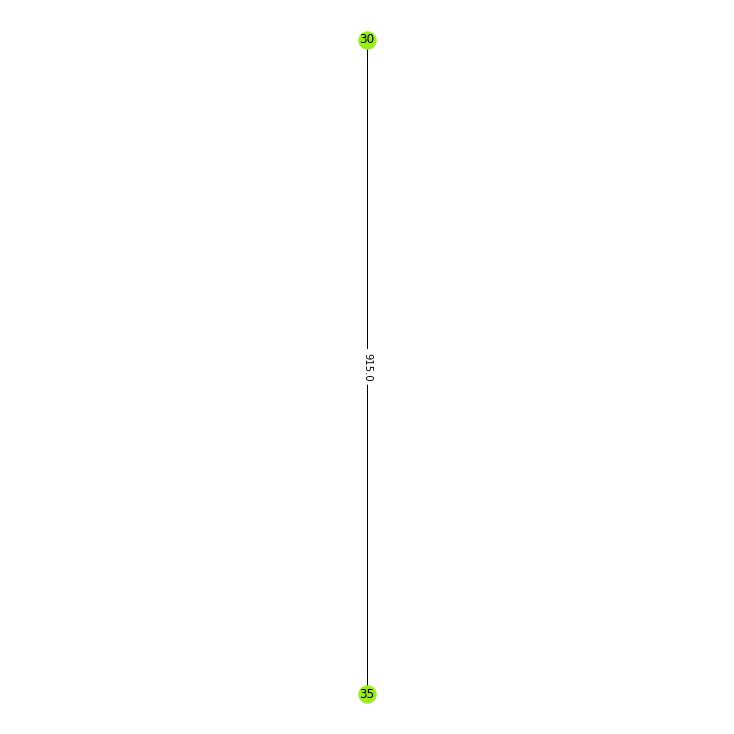

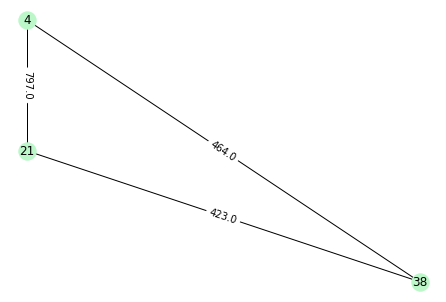

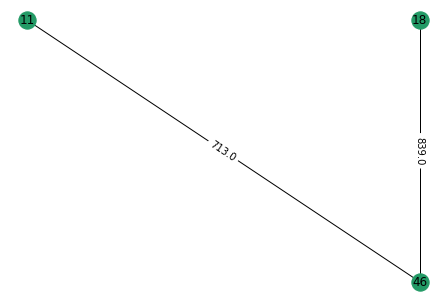

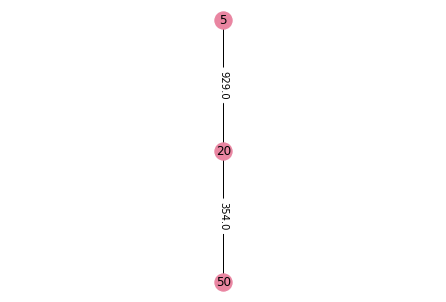

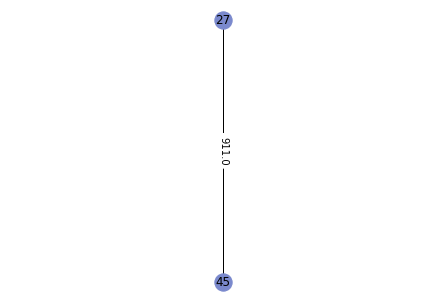

...

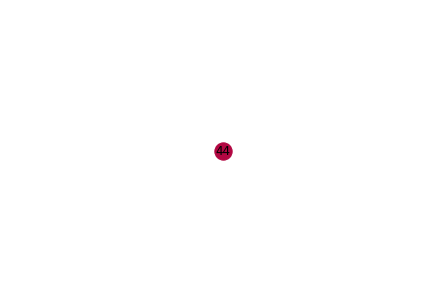

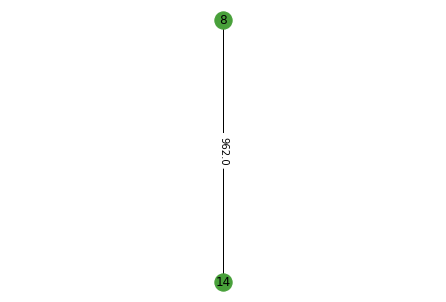

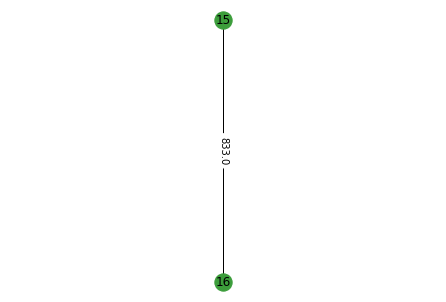

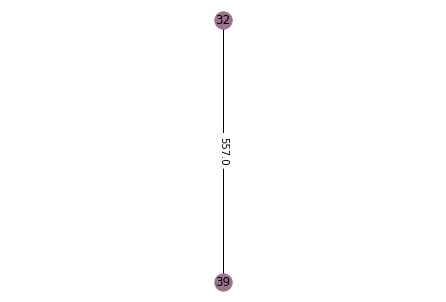

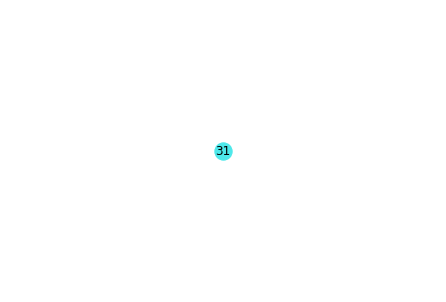

In [ ]:
#nodes = 50
# toplogy 1
example = examples[len(examples)-1-1]
gt = ground_truth_array[10+1]
print("Clusters for example 50_1")
for j in K_values_50:
  A = similarity_matrix(example)
  Y = Normalized_cut(A, j)
  cluster_matrix = get_traffic(Y, A)
  print("For k =",j)
  print("Clusters =",Y)
  print("Coditional Entropy =", conditional_entropy(Y, gt))
  print("F Measure =", f_measure(precision(Y, gt), recall(Y, gt)))
  for i in range(cluster_matrix.shape[0]):
    print("The internal traffic for cluster",i+1,"=",cluster_matrix[i,i])
    for k in range(cluster_matrix.shape[0]):
      if (i != k and k > i):
        print("The emulated traffic between cluster", i+1, "and cluster", k+1,"=",cluster_matrix[i][k])
  print("The graph after clustering:")
  visualize_topologies_afterClustering(example, Y)

Clusters for example 50_2
For k = 2
Clusters = [0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 0 0 0 1 0 0 1 0 1 0 1 0 0 1 1 0 1
 1 0 1 0 0 0 0 0 1 0 1 1 1]
Coditional Entropy = 1.2594913602126863
F Measure = 0.18859649122807018
The internal traffic for cluster 1 = 45890.0
The emulated traffic between cluster 1 and cluster 2 = 30580.0
The internal traffic for cluster 2 = 16647.0
The graph after clustering:


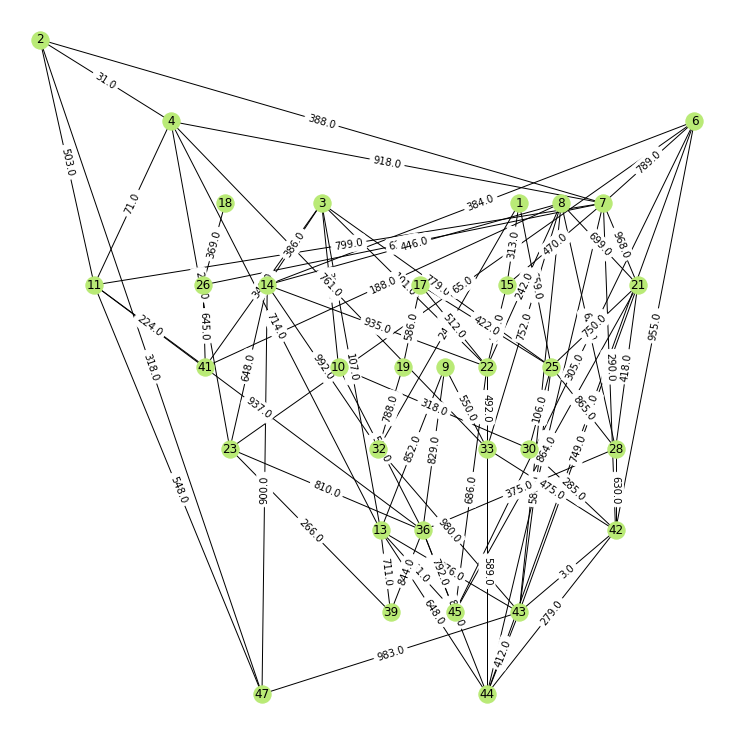

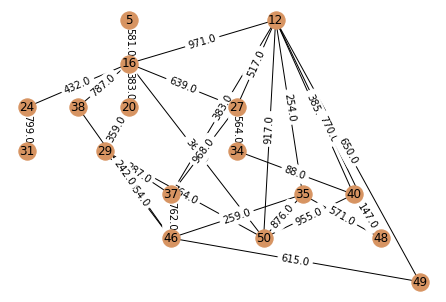

For k = 10
Clusters = [8 5 1 0 5 4 5 3 9 4 5 1 9 2 8 7 6 0 8 4 3 2 2 6 3 5 0 3 4 1 6 2 4 0 1 9 0
 7 9 1 5 4 2 9 9 8 2 1 8 1]
Coditional Entropy = 0.684330001589647
F Measure = 0.3707142857142857
The internal traffic for cluster 1 = 4251.0
The emulated traffic between cluster 1 and cluster 2 = 2160.0
The emulated traffic between cluster 1 and cluster 3 = 298.0
The emulated traffic between cluster 1 and cluster 4 = 1540.0
The emulated traffic between cluster 1 and cluster 5 = 1968.0
The emulated traffic between cluster 1 and cluster 6 = 2879.0
The emulated traffic between cluster 1 and cluster 7 = 589.0
The emulated traffic between cluster 1 and cluster 8 = 639.0
The emulated traffic between cluster 1 and cluster 9 = 1396.0
The emulated traffic between cluster 1 and cluster 10 = 1869.0
The internal traffic for cluster 2 = 5811.0
The emulated traffic between cluster 2 and cluster 3 = 2811.0
The emulated traffic between cluster 2 and cluster 4 = 2140.0
The emulated traffic between cluster 

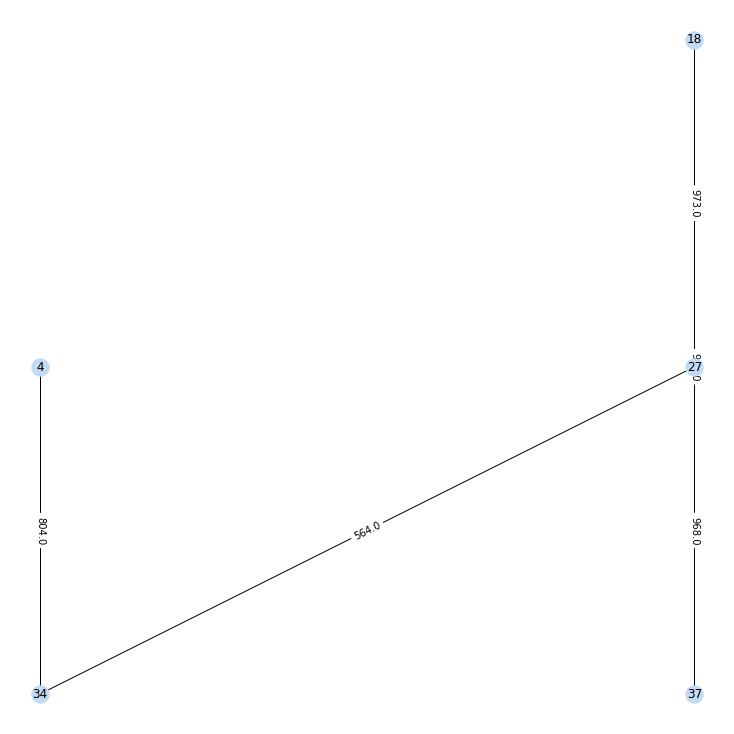

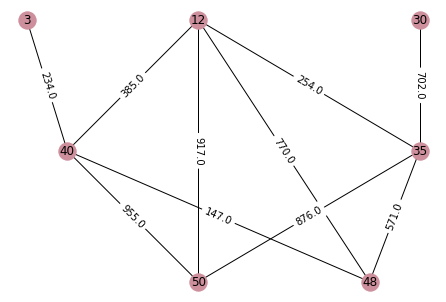

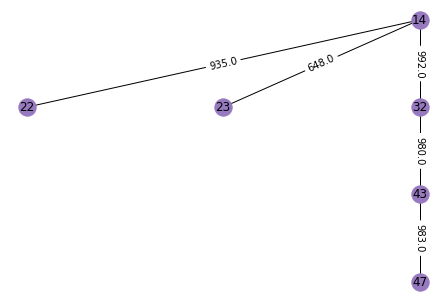

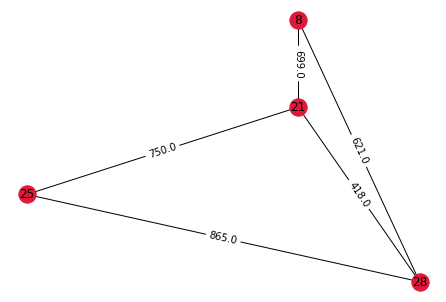

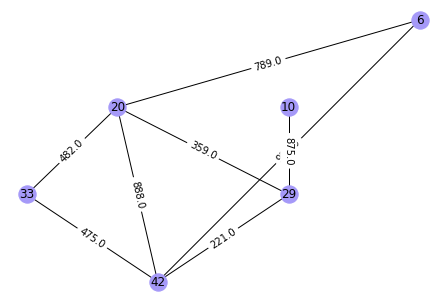

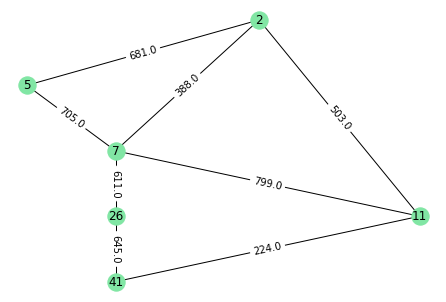

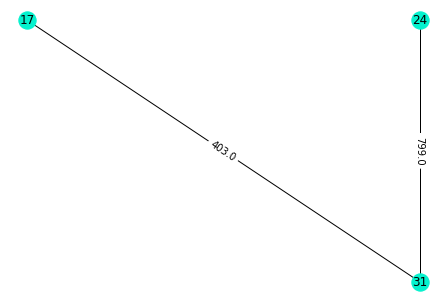

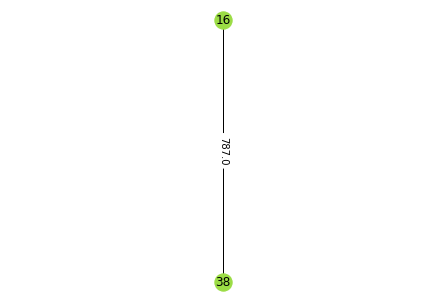

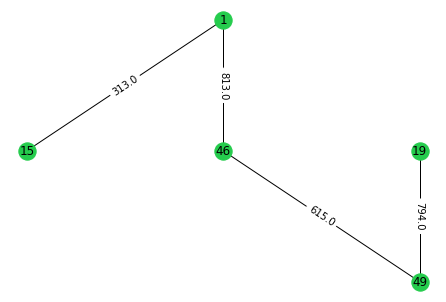

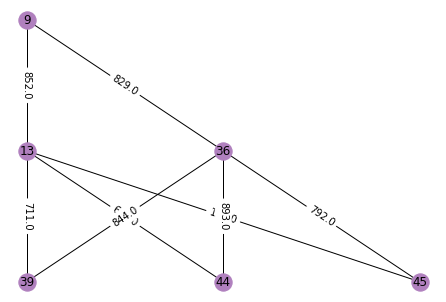

For k = 12
Clusters = [ 2  5  1  3  3  8  9  4 10  1  9  0 10  5  9  7  6  0  2  8  4 11 11  6
  4  9  0  4  1  1  6  5  8  3  1 11  0  7 10 10  0  8  5 10 11  2  5  0
  2  1]
Coditional Entropy = 0.5885052485771451
F Measure = 0.42771164021164015
The internal traffic for cluster 1 = 5705.0
The emulated traffic between cluster 1 and cluster 2 = 2372.0
The emulated traffic between cluster 1 and cluster 3 = 2046.0
The emulated traffic between cluster 1 and cluster 4 = 1505.0
The emulated traffic between cluster 1 and cluster 5 = 1728.0
The emulated traffic between cluster 1 and cluster 6 = 1742.0
The emulated traffic between cluster 1 and cluster 7 = 0.0
The emulated traffic between cluster 1 and cluster 8 = 1610.0
The emulated traffic between cluster 1 and cluster 9 = 920.0
The emulated traffic between cluster 1 and cluster 10 = 1923.0
The emulated traffic between cluster 1 and cluster 11 = 1298.0
The emulated traffic between cluster 1 and cluster 12 = 0.0
The internal traffic for clust

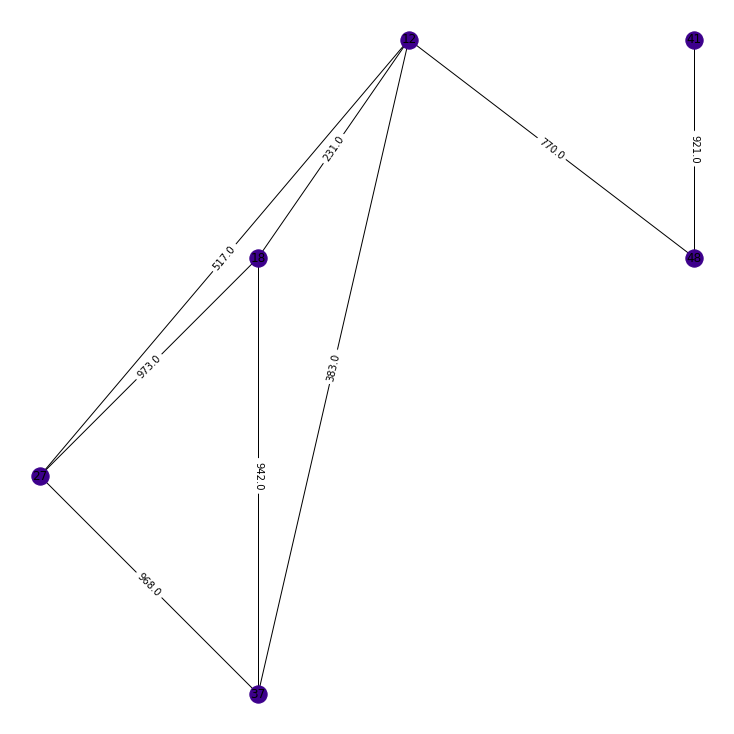

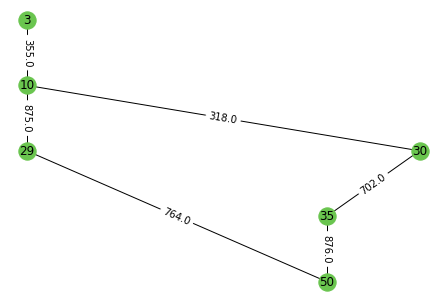

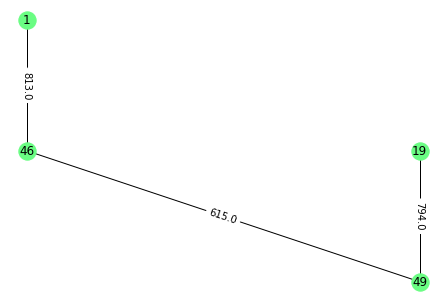

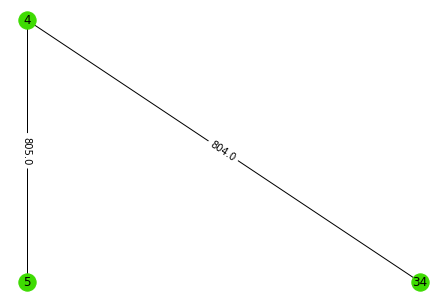

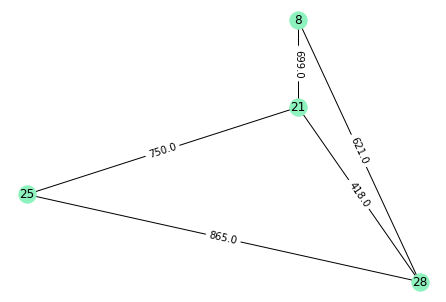

...

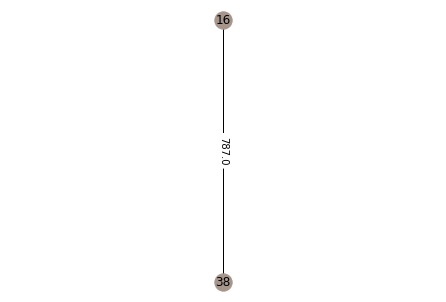

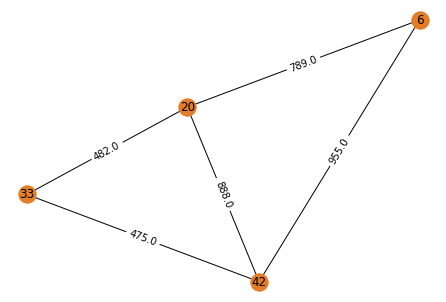

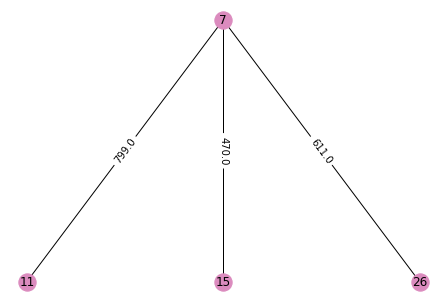

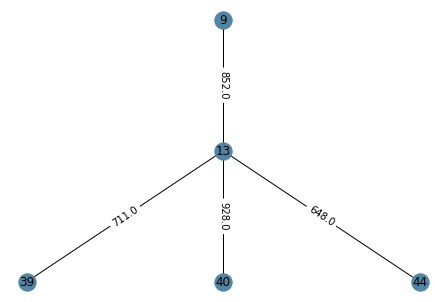

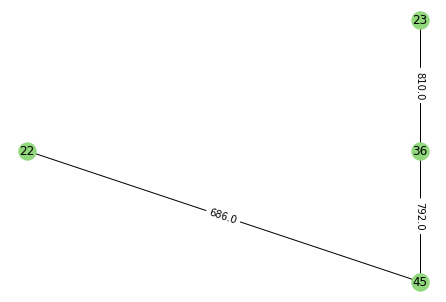

For k = 15
Clusters = [ 5  2  8 10 10  3  7  9 11  8  2 12  6  0  5 13  1  4  1  3 14  0  0  9
 14  7  4 14  8  8  9  1  3 10 12 11  4 13 11  6  7  3  2 11  0  5  2 12
  1 12]
Coditional Entropy = 0.4968760470161782
F Measure = 0.46380952380952384
The internal traffic for cluster 1 = 2269.0
The emulated traffic between cluster 1 and cluster 2 = 1504.0
The emulated traffic between cluster 1 and cluster 3 = 900.0
The emulated traffic between cluster 1 and cluster 4 = 1246.0
The emulated traffic between cluster 1 and cluster 5 = 0.0
The emulated traffic between cluster 1 and cluster 6 = 195.0
The emulated traffic between cluster 1 and cluster 7 = 151.0
The emulated traffic between cluster 1 and cluster 8 = 0.0
The emulated traffic between cluster 1 and cluster 9 = 487.0
The emulated traffic between cluster 1 and cluster 10 = 922.0
The emulated traffic between cluster 1 and cluster 11 = 298.0
The emulated traffic between cluster 1 and cluster 12 = 1868.0
The emulated traffic between cluste

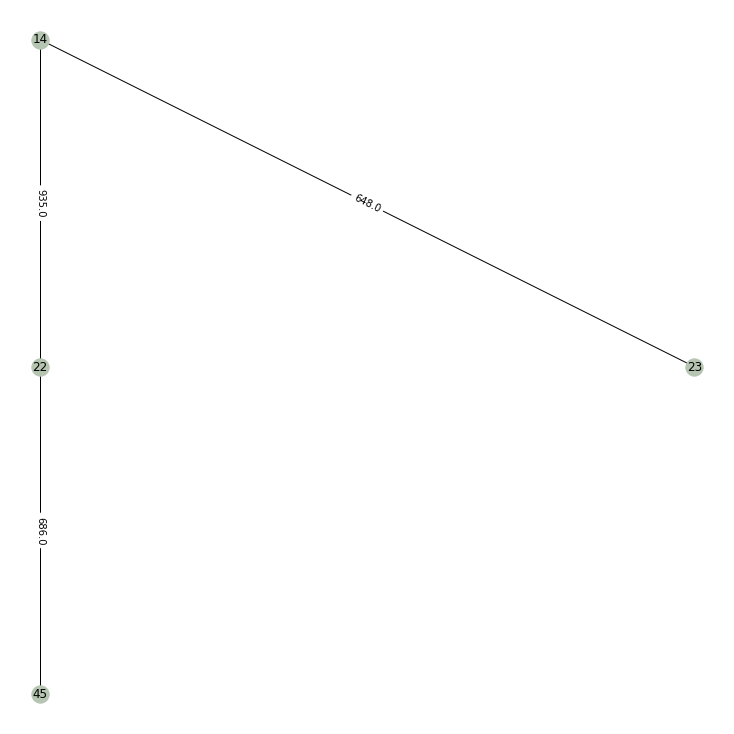

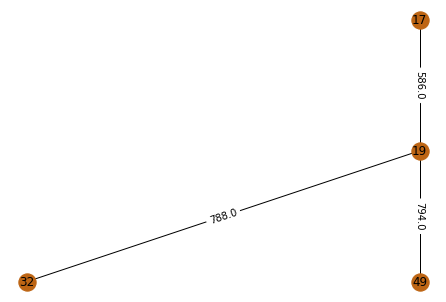

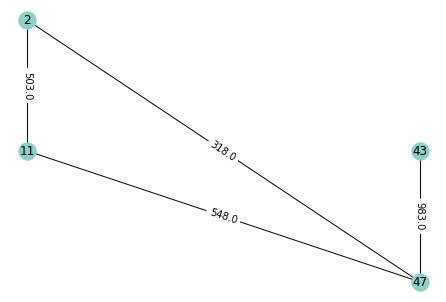

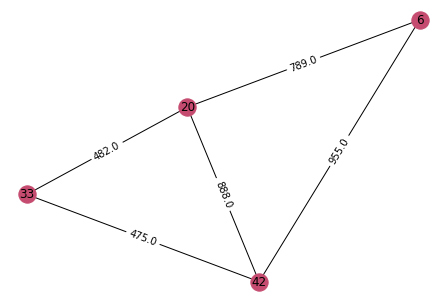

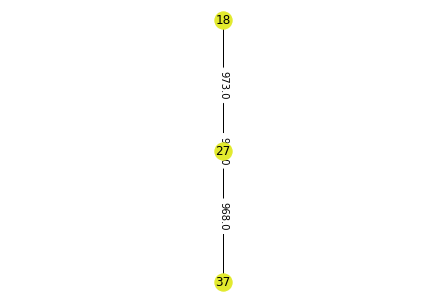

...

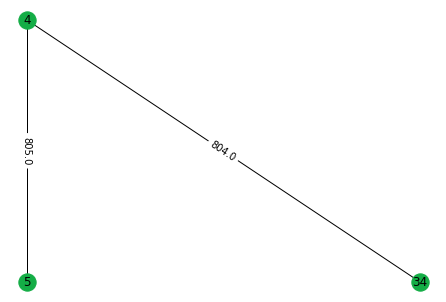

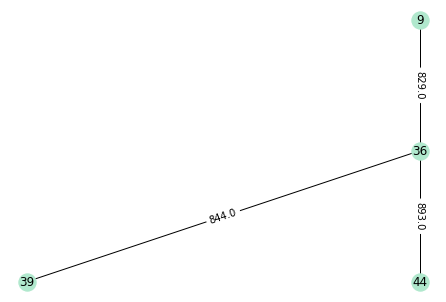

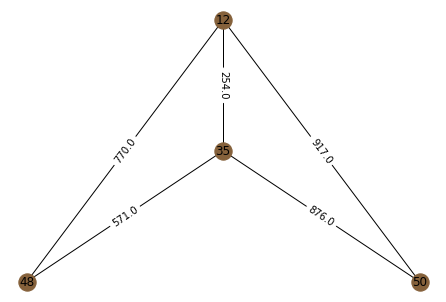

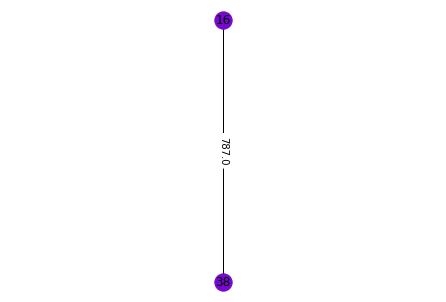

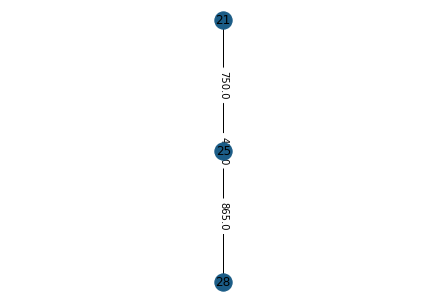

For k = 17
Clusters = [11  5  6  5  5 12 14  1  9  6  5  0  9  7 11 10 15  2 15 12  4 13  0  8
  4 14  2  4  6  6  8  7  1  5  0  3  2 10  3  9 14 12 16  3 13 11 16  0
  3  0]
Coditional Entropy = 0.45605205048499325
F Measure = 0.48991596638655466
The internal traffic for cluster 1 = 4285.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 1131.0
The emulated traffic between cluster 1 and cluster 4 = 2153.0
The emulated traffic between cluster 1 and cluster 5 = 1255.0
The emulated traffic between cluster 1 and cluster 6 = 2054.0
The emulated traffic between cluster 1 and cluster 7 = 1466.0
The emulated traffic between cluster 1 and cluster 8 = 1901.0
The emulated traffic between cluster 1 and cluster 9 = 0.0
The emulated traffic between cluster 1 and cluster 10 = 1487.0
The emulated traffic between cluster 1 and cluster 11 = 1339.0
The emulated traffic between cluster 1 and cluster 12 = 259.0
The emulated traffic between 

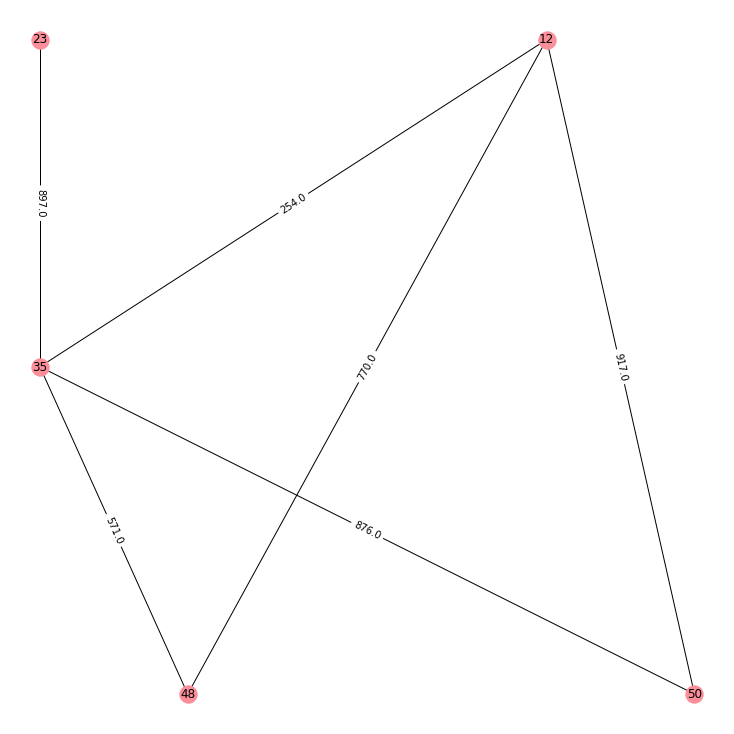

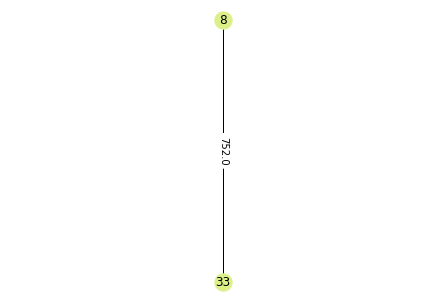

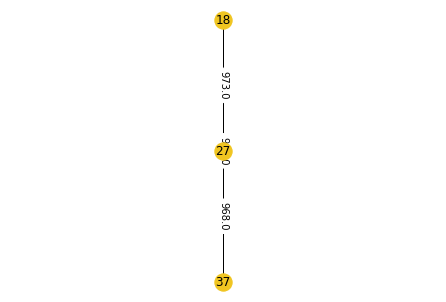

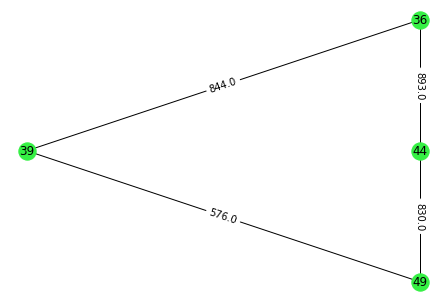

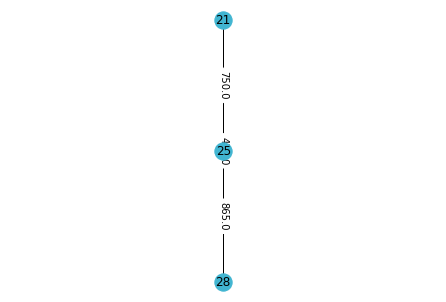

...

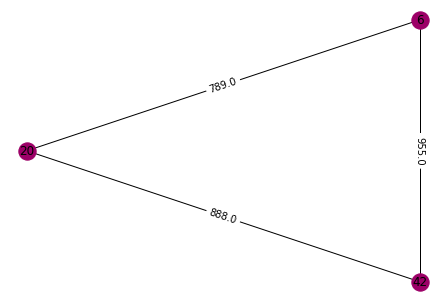

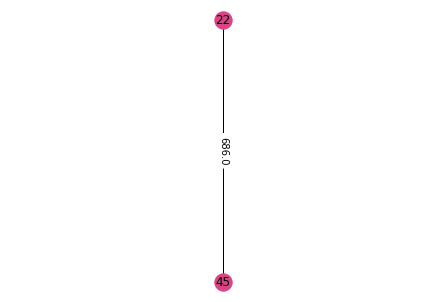

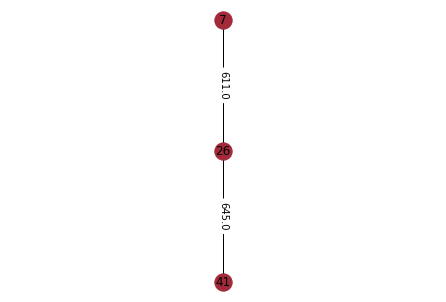

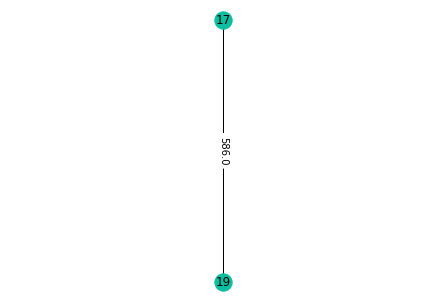

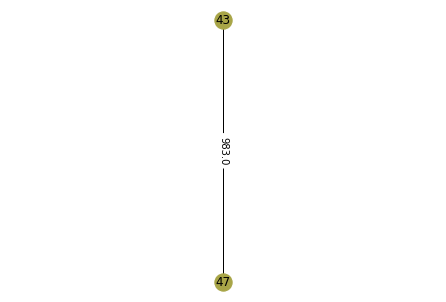

For k = 20
Clusters = [12  5  1  7  5  4 18  0  0 16  5  6 15  2 18 13  9 11  9  4 10  2  2  8
 19 11  7 19 16 16  8 17  0  7  6  5 11 13 15 15 14  4 17  3 10 12 17 14
  3  6]
Coditional Entropy = 0.39009867564076933
F Measure = 0.5026190476190476
The internal traffic for cluster 1 = 1302.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 1180.0
The emulated traffic between cluster 1 and cluster 4 = 589.0
The emulated traffic between cluster 1 and cluster 5 = 957.0
The emulated traffic between cluster 1 and cluster 6 = 829.0
The emulated traffic between cluster 1 and cluster 7 = 0.0
The emulated traffic between cluster 1 and cluster 8 = 1527.0
The emulated traffic between cluster 1 and cluster 9 = 921.0
The emulated traffic between cluster 1 and cluster 10 = 0.0
The emulated traffic between cluster 1 and cluster 11 = 699.0
The emulated traffic between cluster 1 and cluster 12 = 862.0
The emulated traffic between cluster 1

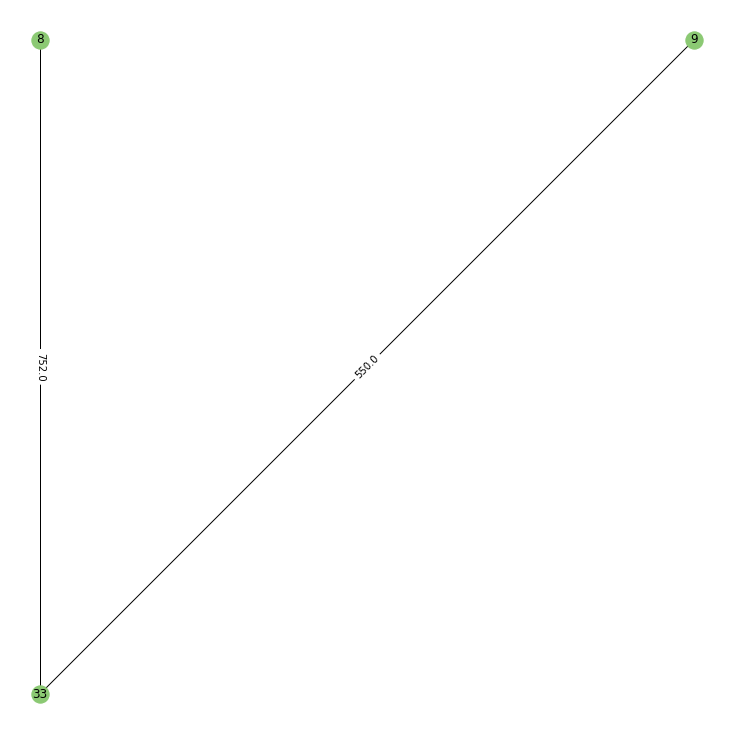

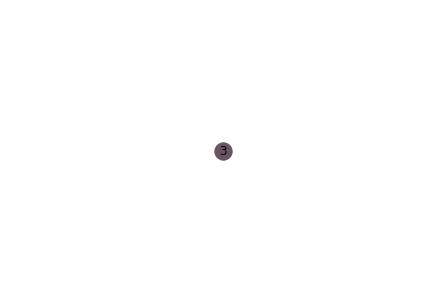

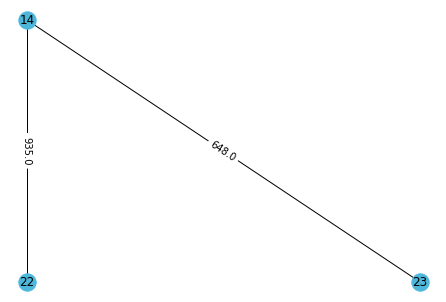

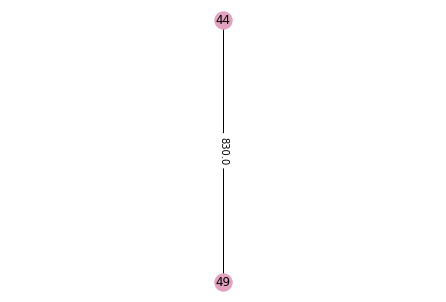

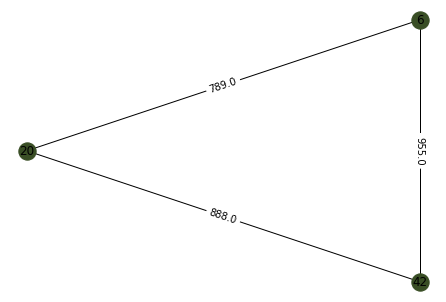

...

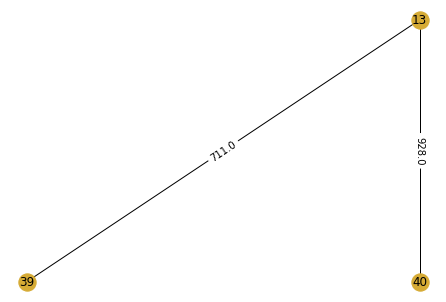

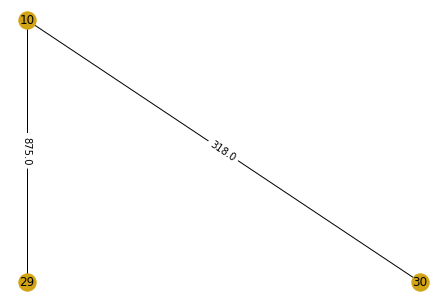

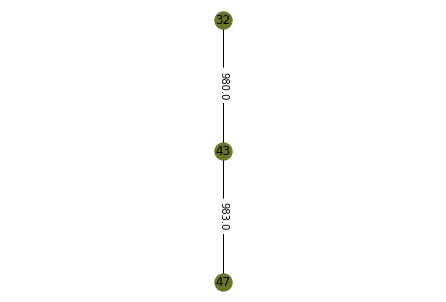

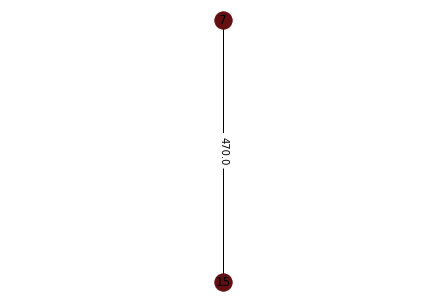

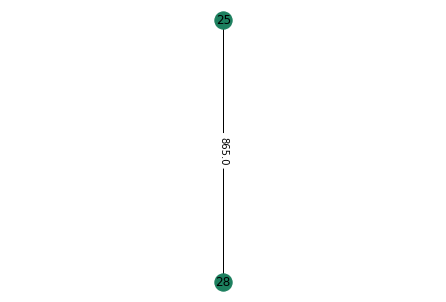

For k = 25
Clusters = [ 9 17  8 10 17 22 19  5 20 18 19 14 15 12 19  6  7  3  7  1 21 12  0 11
  8  3 23  5 18 18 11  1 20 10  0  2 24  6  2 15 13 22  4 16 21 24  4 13
 16 14]
Coditional Entropy = 0.31011974692410377
F Measure = 0.49599999999999994
The internal traffic for cluster 1 = 897.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 1076.0
The emulated traffic between cluster 1 and cluster 4 = 0.0
The emulated traffic between cluster 1 and cluster 5 = 0.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The emulated traffic between cluster 1 and cluster 7 = 0.0
The emulated traffic between cluster 1 and cluster 8 = 0.0
The emulated traffic between cluster 1 and cluster 9 = 705.0
The emulated traffic between cluster 1 and cluster 10 = 0.0
The emulated traffic between cluster 1 and cluster 11 = 298.0
The emulated traffic between cluster 1 and cluster 12 = 0.0
The emulated traffic between cluster 1 and cluste

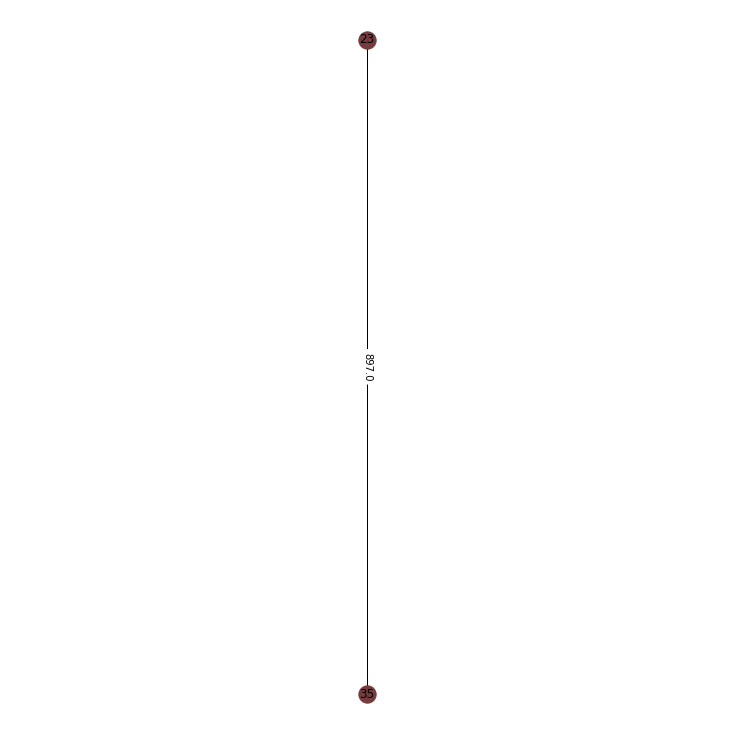

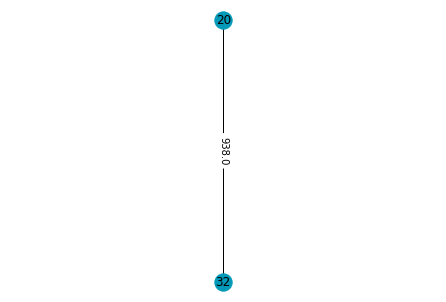

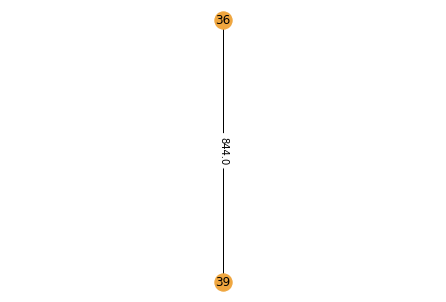

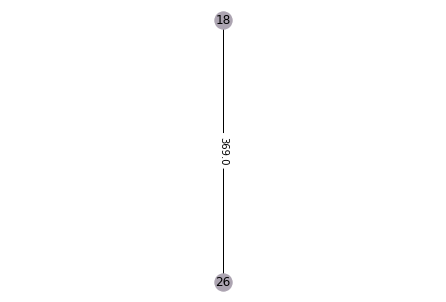

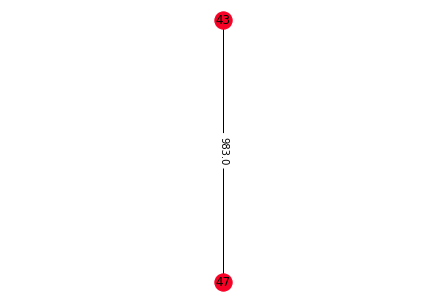

...

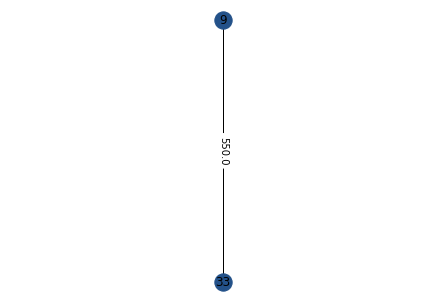

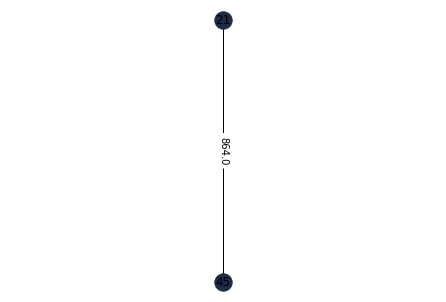

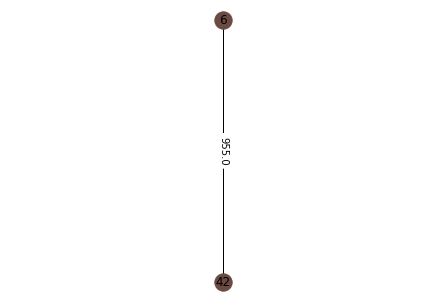

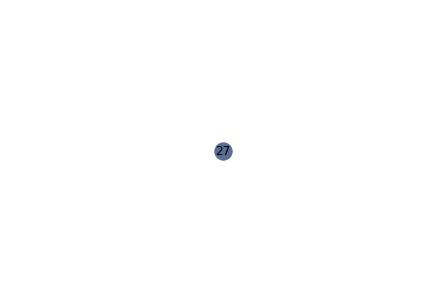

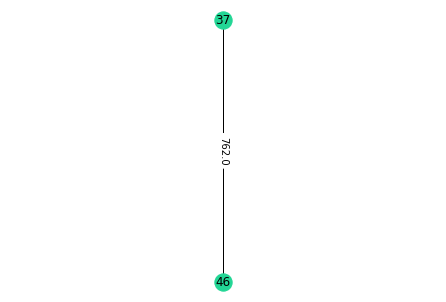

In [ ]:
#nodes = 50
# toplogy 2
example = examples[len(examples)-1-2]
gt = ground_truth_array[10+2]
print("Clusters for example 50_2")
for j in K_values_50:
  A = similarity_matrix(example)
  Y = Normalized_cut(A, j)
  cluster_matrix = get_traffic(Y, A)
  print("For k =",j)
  print("Clusters =",Y)
  print("Coditional Entropy =", conditional_entropy(Y, gt))
  print("F Measure =", f_measure(precision(Y, gt), recall(Y, gt)))
  for i in range(cluster_matrix.shape[0]):
    print("The internal traffic for cluster",i+1,"=",cluster_matrix[i,i])
    for k in range(cluster_matrix.shape[0]):
      if (i != k and k > i):
        print("The emulated traffic between cluster", i+1, "and cluster", k+1,"=",cluster_matrix[i][k])
  print("The graph after clustering:")
  visualize_topologies_afterClustering(example, Y)

Clusters for example 50_3
For k = 2
Clusters = [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0]
Coditional Entropy = 1.3296863360472195
F Measure = 0.5754716981132075
The internal traffic for cluster 1 = 56075.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The internal traffic for cluster 2 = 0.0
The graph after clustering:


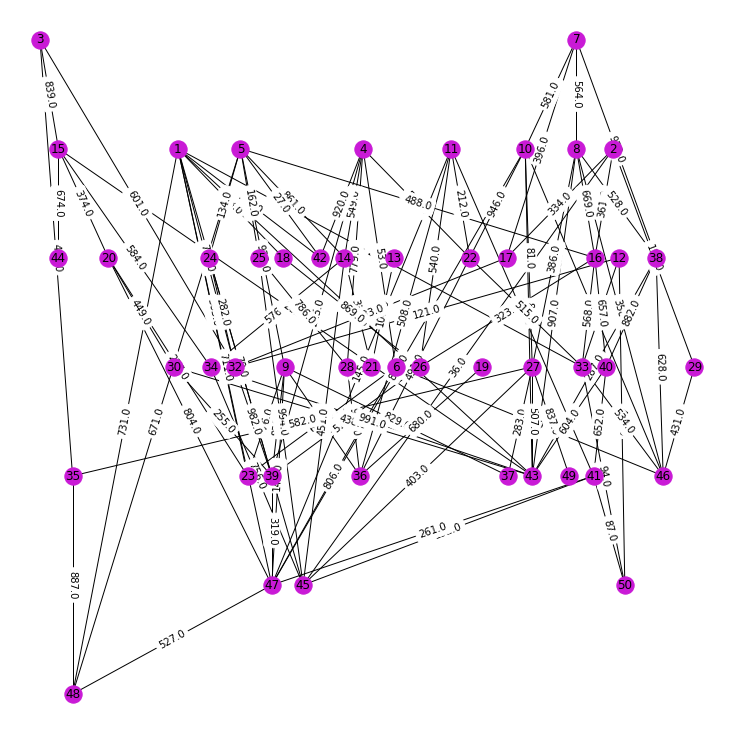

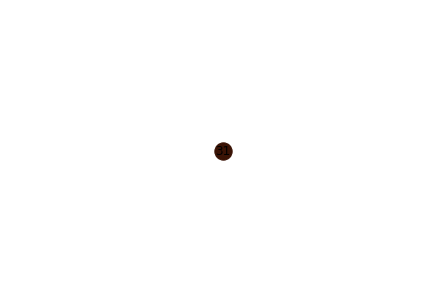

For k = 10
Clusters = [7 9 3 4 0 1 1 1 4 1 4 6 2 0 3 1 9 7 4 7 0 4 7 5 4 7 8 4 9 7 2 7 6 0 8 4 8
 1 7 1 1 7 1 3 0 9 7 0 8 6]
Coditional Entropy = 0.7391379491895417
F Measure = 0.40826340326340327
The internal traffic for cluster 1 = 3652.0
The emulated traffic between cluster 1 and cluster 2 = 1671.0
The emulated traffic between cluster 1 and cluster 3 = 100.0
The emulated traffic between cluster 1 and cluster 4 = 584.0
The emulated traffic between cluster 1 and cluster 5 = 2634.0
The emulated traffic between cluster 1 and cluster 6 = 134.0
The emulated traffic between cluster 1 and cluster 7 = 0.0
The emulated traffic between cluster 1 and cluster 8 = 1931.0
The emulated traffic between cluster 1 and cluster 9 = 1290.0
The emulated traffic between cluster 1 and cluster 10 = 36.0
The internal traffic for cluster 2 = 7338.0
The emulated traffic between cluster 2 and cluster 3 = 0.0
The emulated traffic between cluster 2 and cluster 4 = 262.0
The emulated traffic between cluster 2 and c

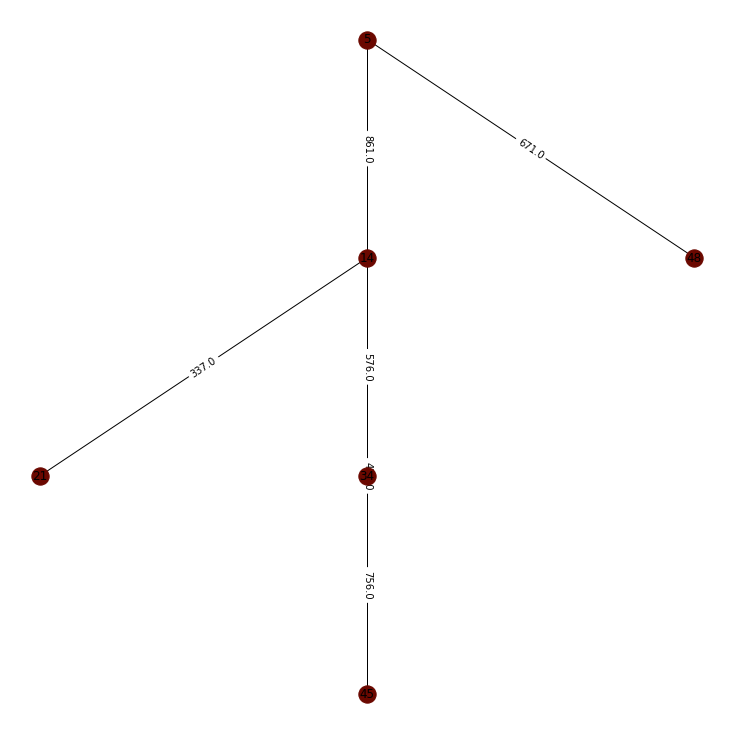

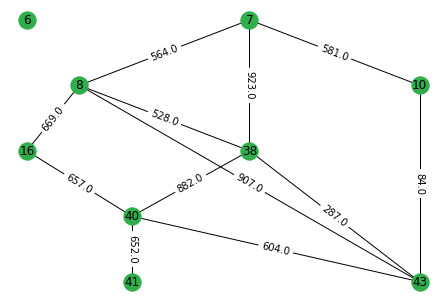

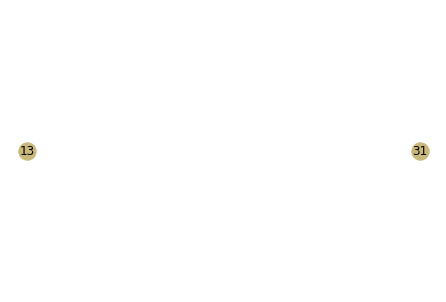

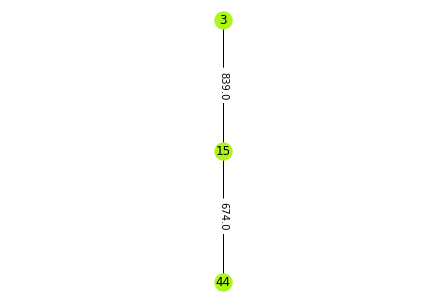

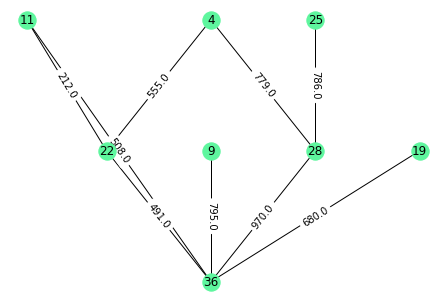

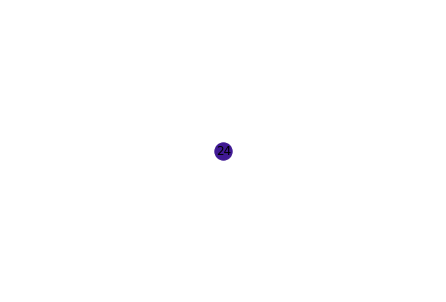

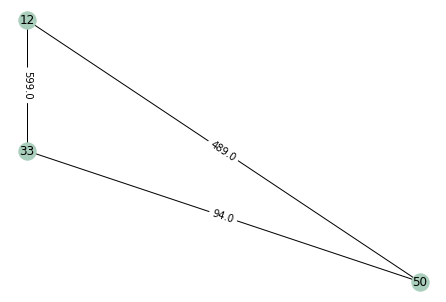

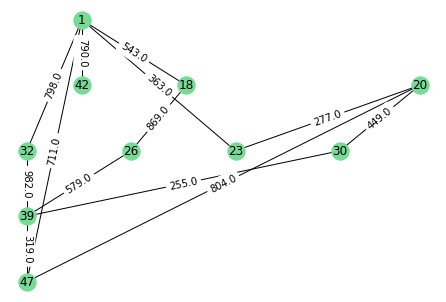

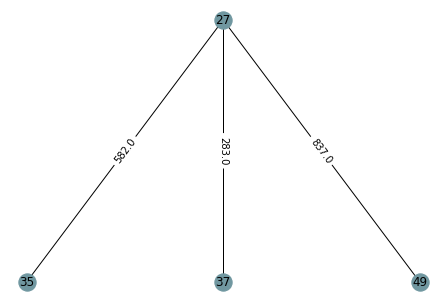

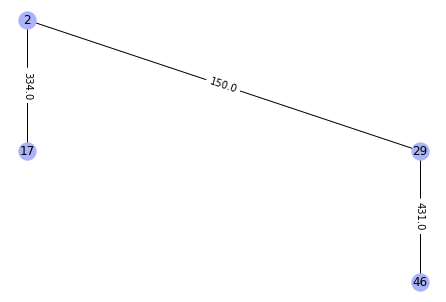

For k = 12
Clusters = [ 7  0 10  1  3  8  2  2  1  2 11  4  9  3 10  0  0 11  1  8  3  1  8  7
  1 11  5  1  6  8  7  7  4  3  5  1  5  2  7  2  2  7  2 10  3  6  8  7
  5  4]
Coditional Entropy = 0.6333266784590297
F Measure = 0.41124338624338636
The internal traffic for cluster 1 = 695.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 1722.0
The emulated traffic between cluster 1 and cluster 4 = 524.0
The emulated traffic between cluster 1 and cluster 5 = 568.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The emulated traffic between cluster 1 and cluster 7 = 150.0
The emulated traffic between cluster 1 and cluster 8 = 533.0
The emulated traffic between cluster 1 and cluster 9 = 0.0
The emulated traffic between cluster 1 and cluster 10 = 0.0
The emulated traffic between cluster 1 and cluster 11 = 0.0
The emulated traffic between cluster 1 and cluster 12 = 323.0
The internal traffic for cluster 2 = 5056.0


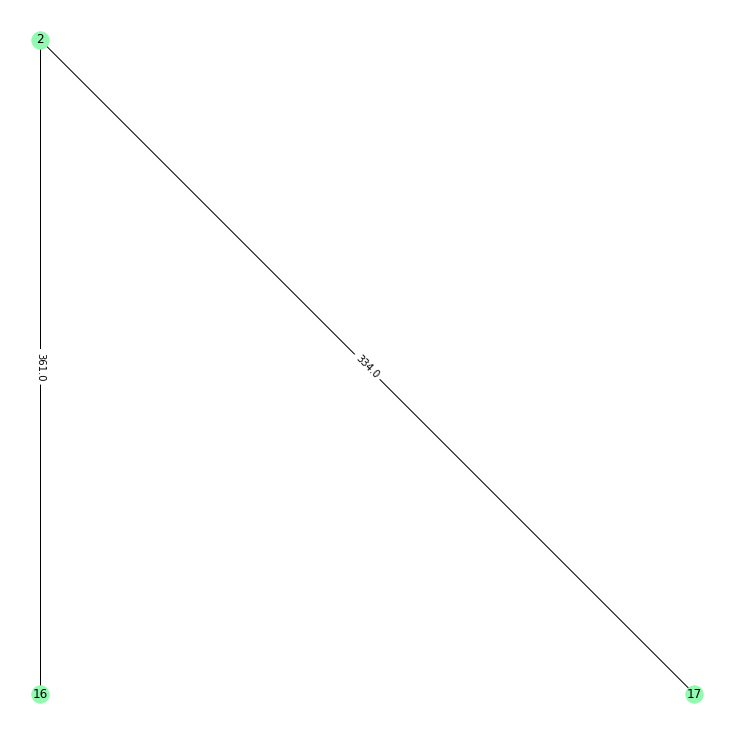

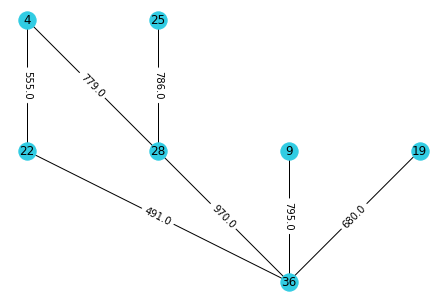

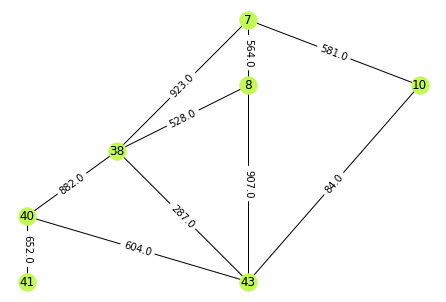

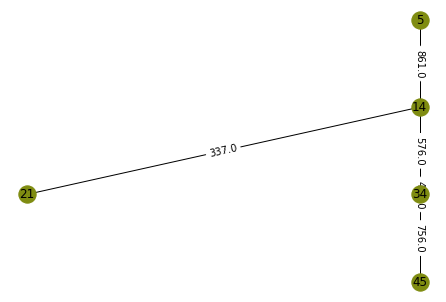

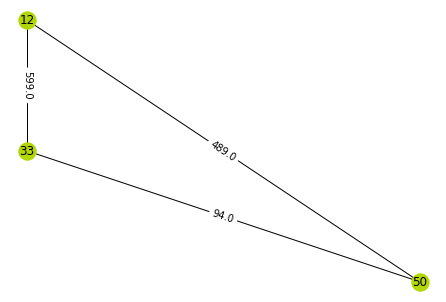

...

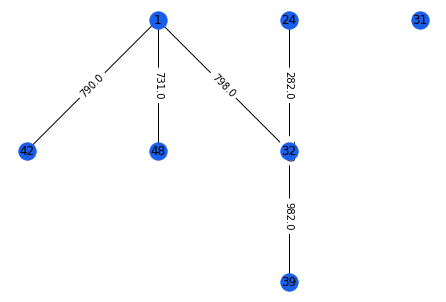

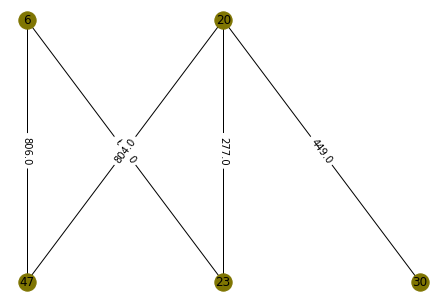

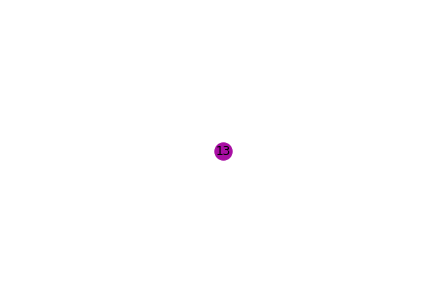

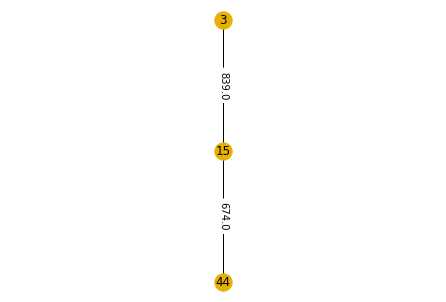

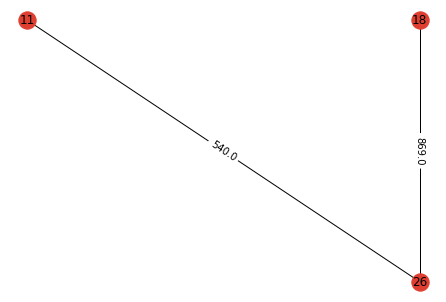

For k = 15
Clusters = [ 3  8  5 11  3  2  1  1  2  1  0  7 14 11  5  1  8  0  4  9 10 11  2  3
 11  0  6 11 12  9 13  3  7 10  6  4  2  1  3  1  1 11  1  5 11 12  2  3
  6  7]
Coditional Entropy = 0.5646747747861837
F Measure = 0.46275132275132275
The internal traffic for cluster 1 = 1409.0
The emulated traffic between cluster 1 and cluster 2 = 496.0
The emulated traffic between cluster 1 and cluster 3 = 145.0
The emulated traffic between cluster 1 and cluster 4 = 1122.0
The emulated traffic between cluster 1 and cluster 5 = 508.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The emulated traffic between cluster 1 and cluster 7 = 0.0
The emulated traffic between cluster 1 and cluster 8 = 0.0
The emulated traffic between cluster 1 and cluster 9 = 0.0
The emulated traffic between cluster 1 and cluster 10 = 0.0
The emulated traffic between cluster 1 and cluster 11 = 0.0
The emulated traffic between cluster 1 and cluster 12 = 212.0
The emulated traffic between cluster 1 and cl

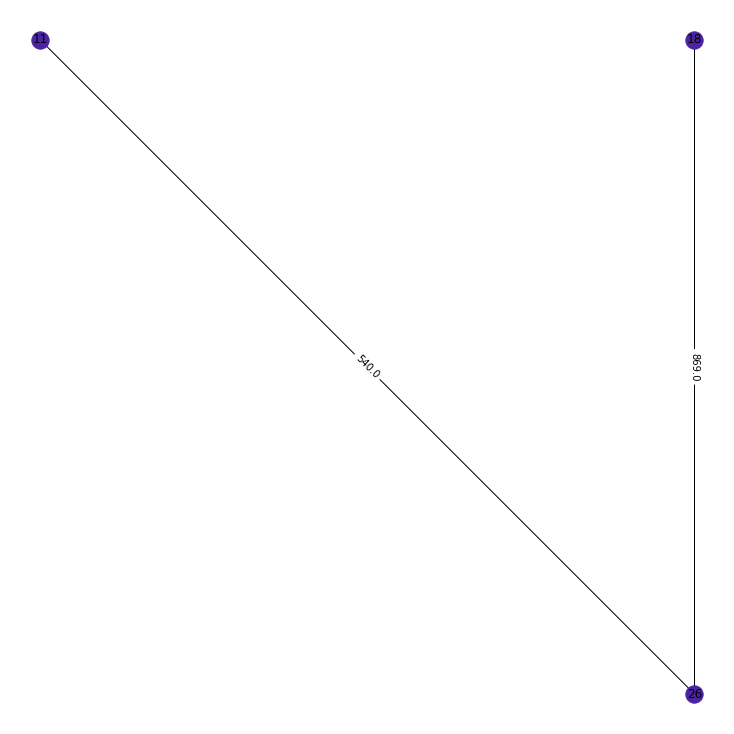

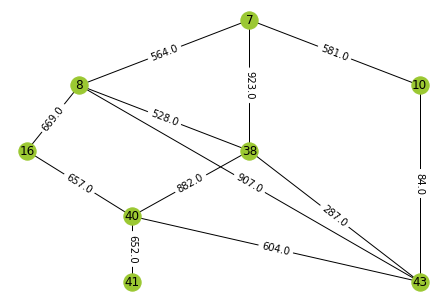

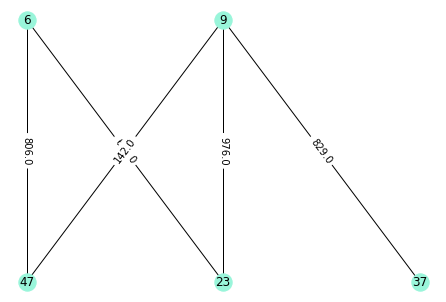

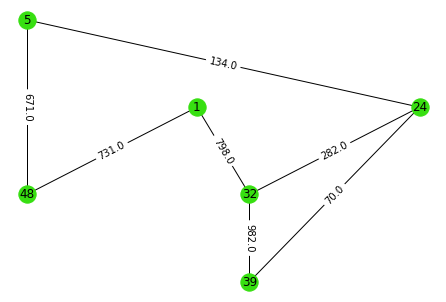

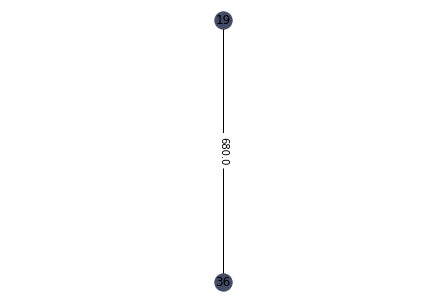

...

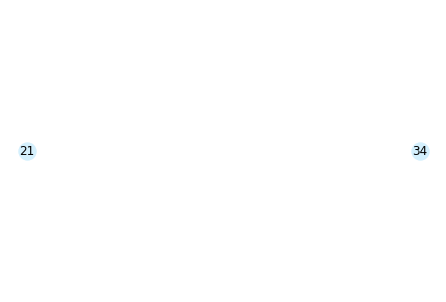

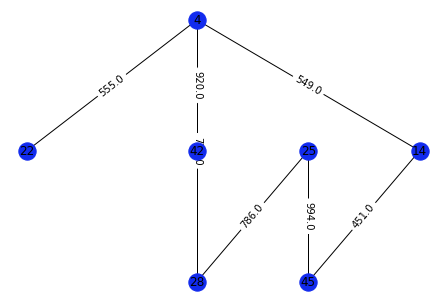

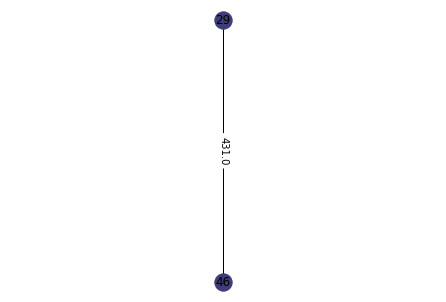

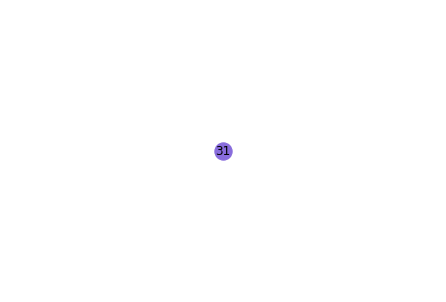

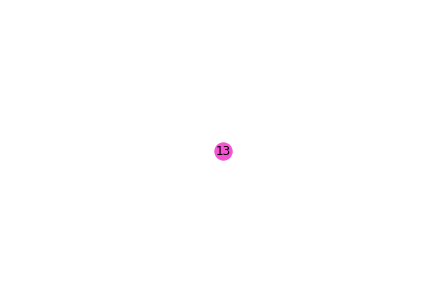

For k = 17
Clusters = [ 8 10  0  1  3  5  2  2 11  1  4  6 14  3  9  2 10  4 14 13 15  1  5  8
  3  4  7  3 12 13 16  8  6  3  0 14 11  2  8  2  2  1  2  9  3  5  5  0
  7  6]
Coditional Entropy = 0.506818974179141
F Measure = 0.47689075630252103
The internal traffic for cluster 1 = 1305.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 0.0
The emulated traffic between cluster 1 and cluster 4 = 671.0
The emulated traffic between cluster 1 and cluster 5 = 0.0
The emulated traffic between cluster 1 and cluster 6 = 527.0
The emulated traffic between cluster 1 and cluster 7 = 0.0
The emulated traffic between cluster 1 and cluster 8 = 582.0
The emulated traffic between cluster 1 and cluster 9 = 1332.0
The emulated traffic between cluster 1 and cluster 10 = 839.0
The emulated traffic between cluster 1 and cluster 11 = 0.0
The emulated traffic between cluster 1 and cluster 12 = 0.0
The emulated traffic between cluster 1 and clu

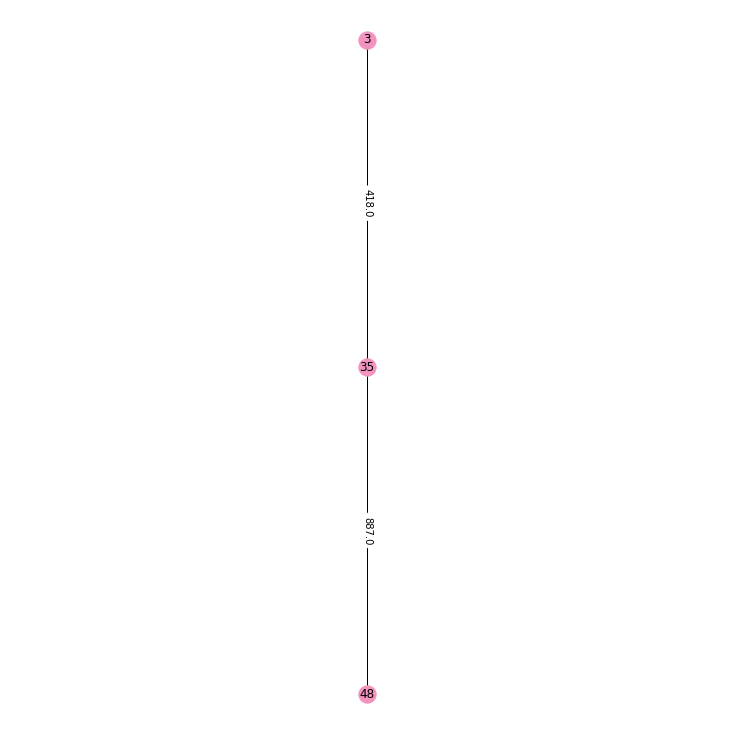

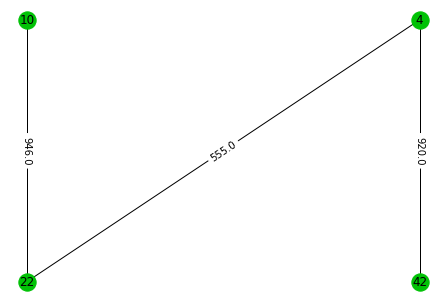

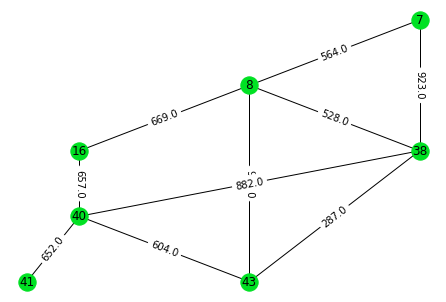

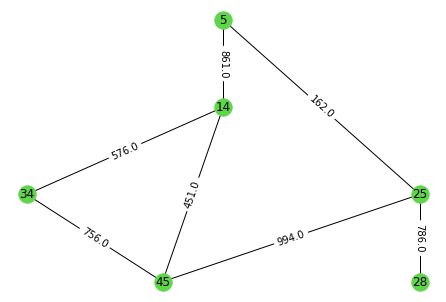

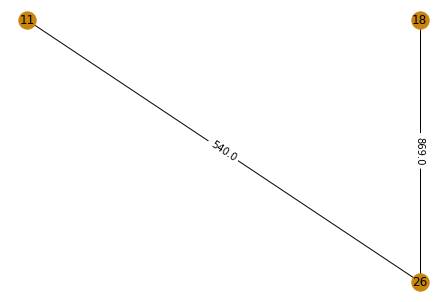

...

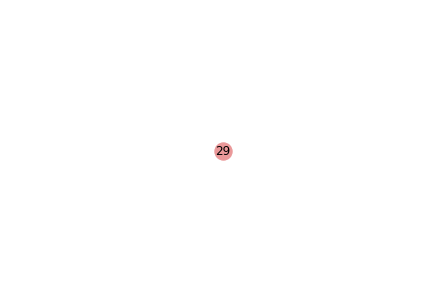

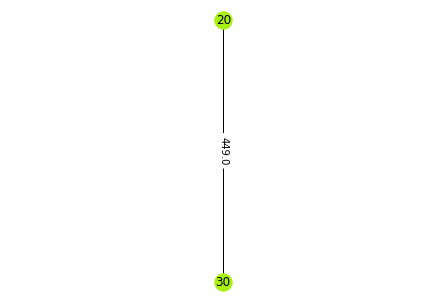

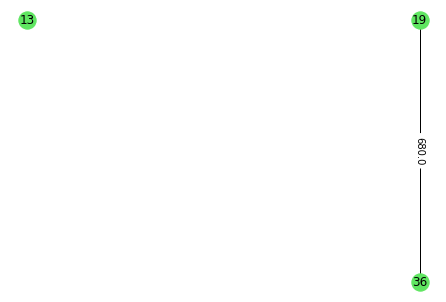

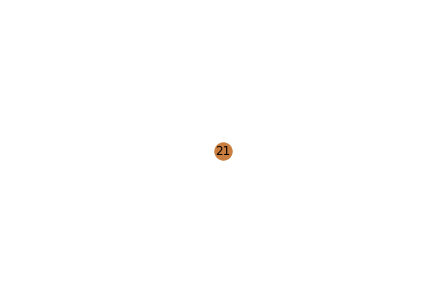

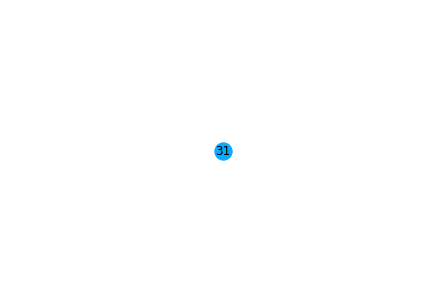

For k = 20
Clusters = [ 4 17  0  4 13 15  2  2 13  1  5 18  9  3 11  2  7  5 14  6 12  1 15  7
  3  5  8  3 19  6 16  7 18  3  0 14 13  2  7  2 10  4  2 11  3 18 15  0
  8 10]
Coditional Entropy = 0.4313684007911916
F Measure = 0.4997222222222222
The internal traffic for cluster 1 = 1305.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 0.0
The emulated traffic between cluster 1 and cluster 4 = 0.0
The emulated traffic between cluster 1 and cluster 5 = 731.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The emulated traffic between cluster 1 and cluster 7 = 0.0
The emulated traffic between cluster 1 and cluster 8 = 601.0
The emulated traffic between cluster 1 and cluster 9 = 582.0
The emulated traffic between cluster 1 and cluster 10 = 0.0
The emulated traffic between cluster 1 and cluster 11 = 0.0
The emulated traffic between cluster 1 and cluster 12 = 839.0
The emulated traffic between cluster 1 and cluste

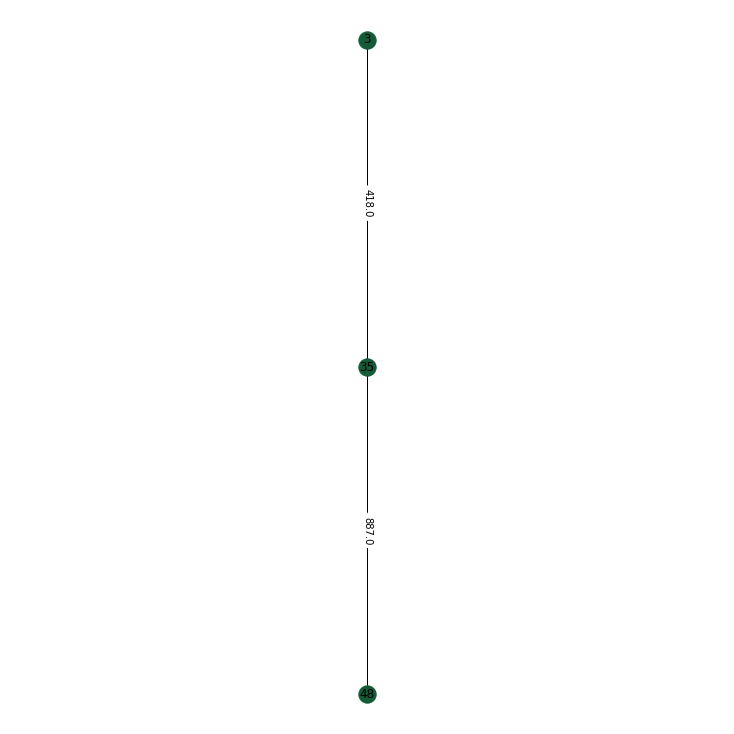

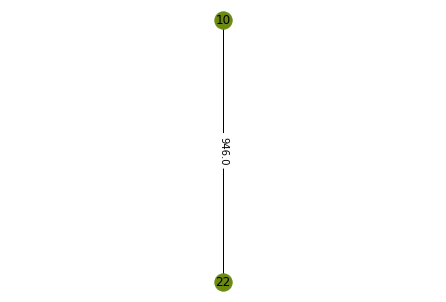

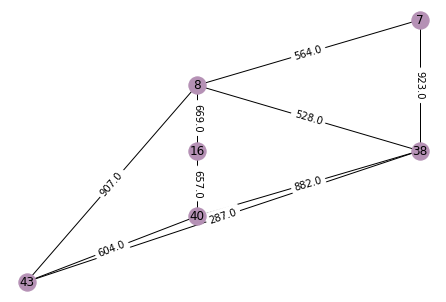

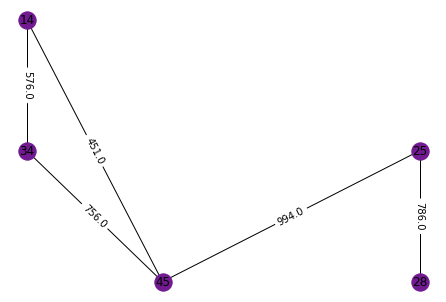

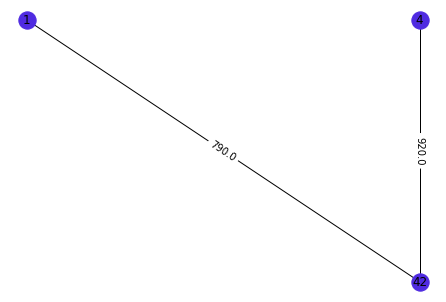

...

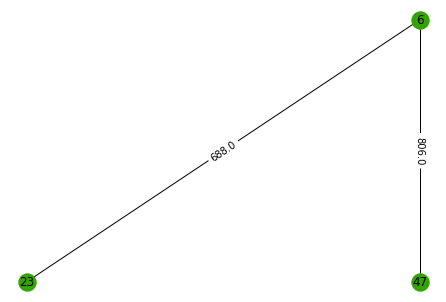

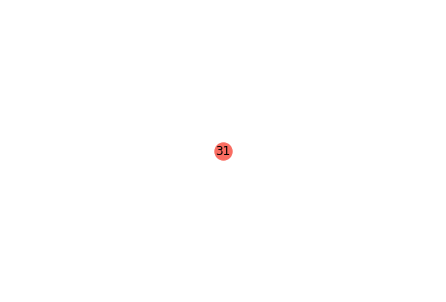

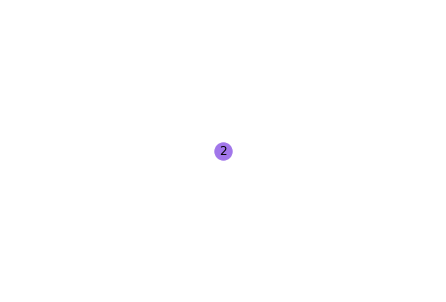

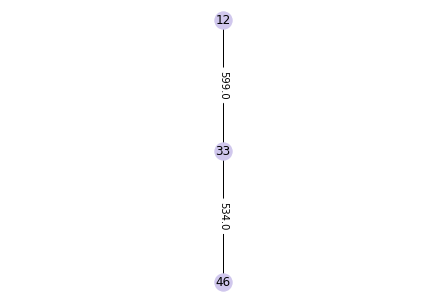

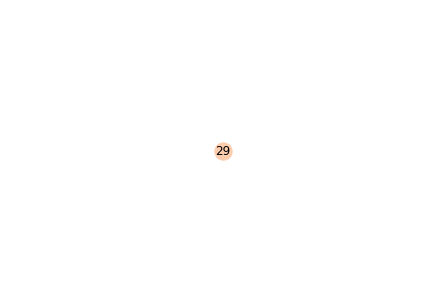

For k = 25
Clusters = [ 4 16 11  4  5 23  1  1 13 24  8  9 14  5 11  1  3 10  8  2 12 24 23 19
  7 10  6  7 15 22  0  3  9  5 21  8 13  1  3  1 20  4  1 18  7 23  2 21
  6 17]
Coditional Entropy = 0.3494302005310304
F Measure = 0.5297777777777778
The internal traffic for cluster 1 = 0.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 0.0
The emulated traffic between cluster 1 and cluster 4 = 0.0
The emulated traffic between cluster 1 and cluster 5 = 0.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The emulated traffic between cluster 1 and cluster 7 = 0.0
The emulated traffic between cluster 1 and cluster 8 = 0.0
The emulated traffic between cluster 1 and cluster 9 = 0.0
The emulated traffic between cluster 1 and cluster 10 = 0.0
The emulated traffic between cluster 1 and cluster 11 = 0.0
The emulated traffic between cluster 1 and cluster 12 = 0.0
The emulated traffic between cluster 1 and cluster 13 = 0.0


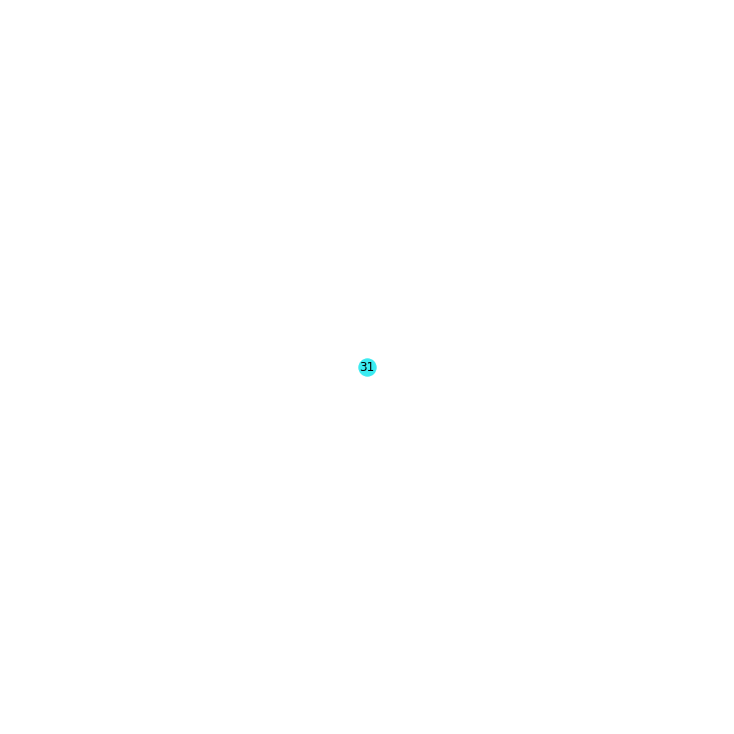

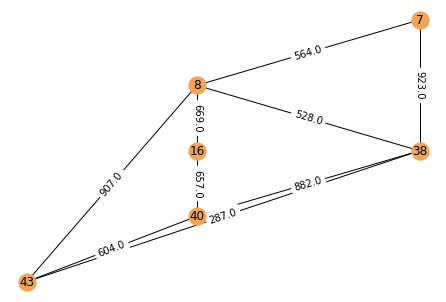

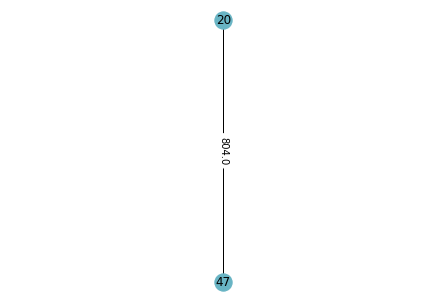

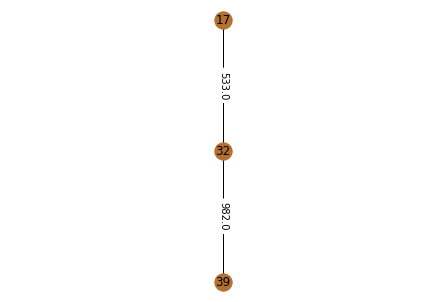

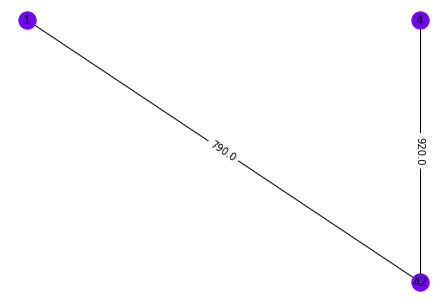

...

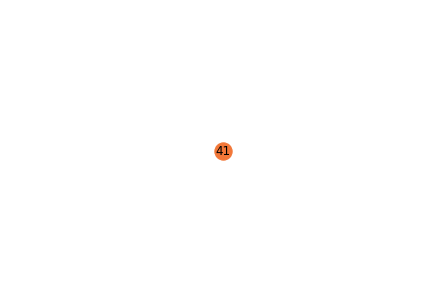

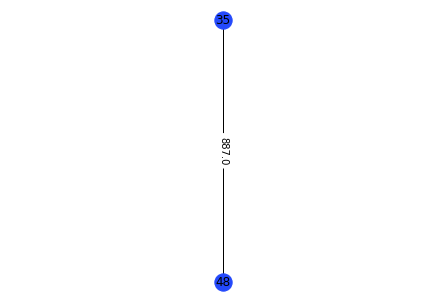

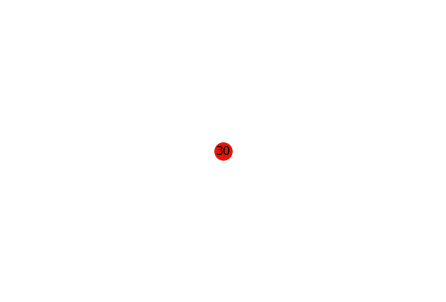

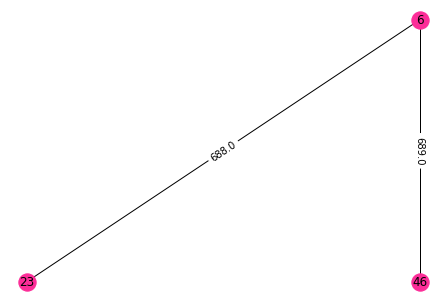

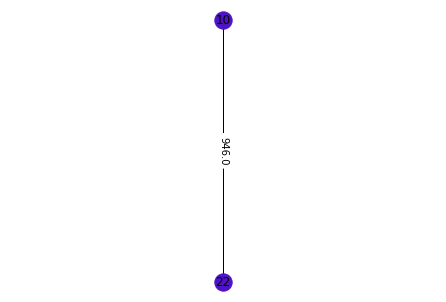

In [ ]:
#nodes = 50
# toplogy 3
example = examples[len(examples)-1-3]
gt = ground_truth_array[10+3]
print("Clusters for example 50_3")
for j in K_values_50:
  A = similarity_matrix(example)
  Y = Normalized_cut(A, j)
  cluster_matrix = get_traffic(Y, A)
  print("For k =",j)
  print("Clusters =",Y)
  print("Coditional Entropy =", conditional_entropy(Y, gt))
  print("F Measure =", f_measure(precision(Y, gt), recall(Y, gt)))
  for i in range(cluster_matrix.shape[0]):
    print("The internal traffic for cluster",i+1,"=",cluster_matrix[i,i])
    for k in range(cluster_matrix.shape[0]):
      if (i != k and k > i):
        print("The emulated traffic between cluster", i+1, "and cluster", k+1,"=",cluster_matrix[i][k])
  print("The graph after clustering:")
  visualize_topologies_afterClustering(example, Y)

Clusters for example 50_4
For k = 2
Clusters = [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0]
Coditional Entropy = 1.0425056056756028
F Measure = 0.325
The internal traffic for cluster 1 = 42139.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The internal traffic for cluster 2 = 0.0
The graph after clustering:


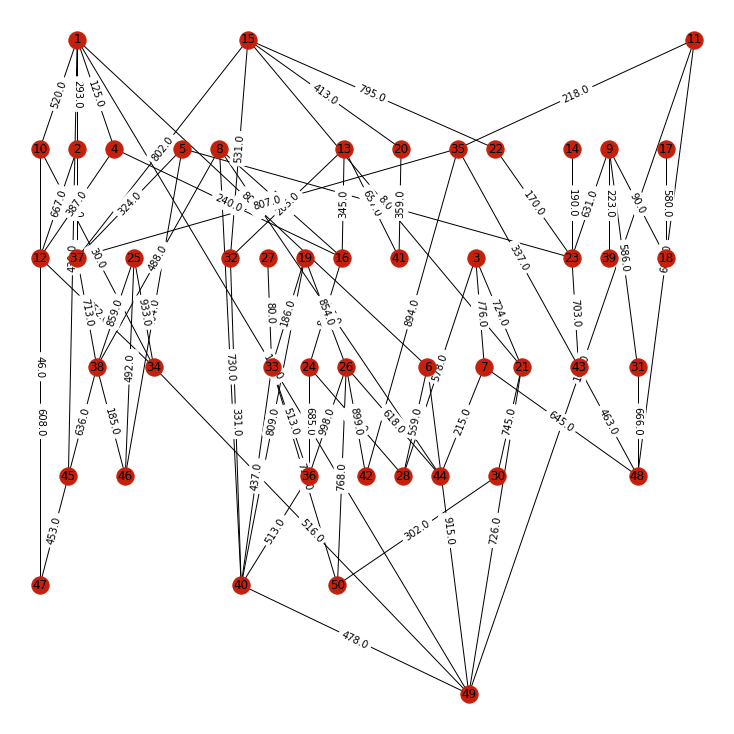

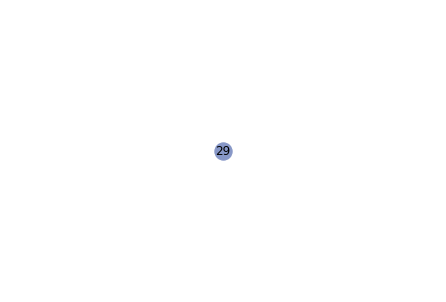

For k = 10
Clusters = [4 4 1 4 0 1 7 2 5 4 7 4 3 5 9 3 6 6 2 3 1 9 5 1 0 2 5 1 8 1 7 9 2 4 0 2 0
 0 5 2 3 2 7 2 4 0 4 7 1 2]
Coditional Entropy = 0.7038675256127043
F Measure = 0.26900294150294146
The internal traffic for cluster 1 = 3984.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 1382.0
The emulated traffic between cluster 1 and cluster 4 = 0.0
The emulated traffic between cluster 1 and cluster 5 = 2124.0
The emulated traffic between cluster 1 and cluster 6 = 792.0
The emulated traffic between cluster 1 and cluster 7 = 0.0
The emulated traffic between cluster 1 and cluster 8 = 555.0
The emulated traffic between cluster 1 and cluster 9 = 0.0
The emulated traffic between cluster 1 and cluster 10 = 802.0
The internal traffic for cluster 2 = 5103.0
The emulated traffic between cluster 2 and cluster 3 = 1465.0
The emulated traffic between cluster 2 and cluster 4 = 842.0
The emulated traffic between cluster 2 and clust

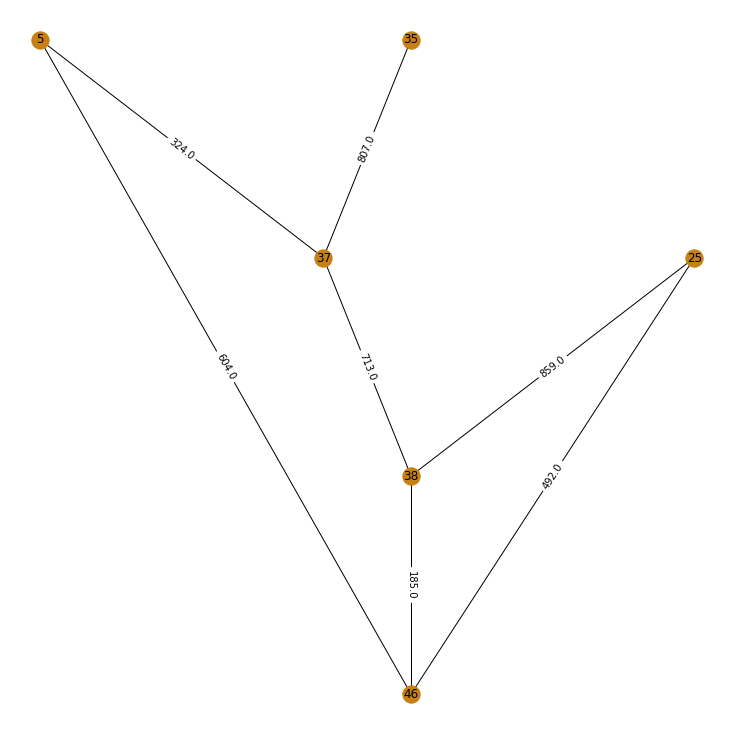

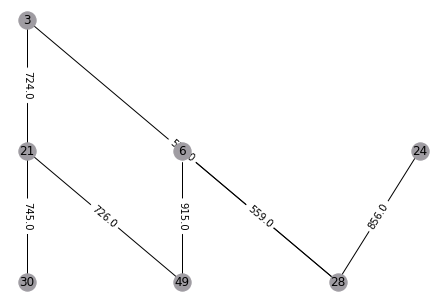

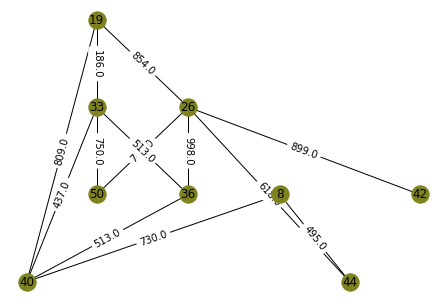

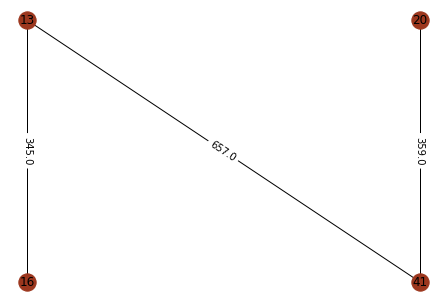

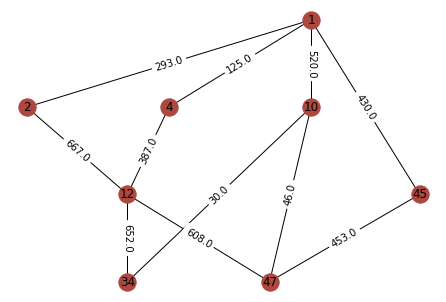

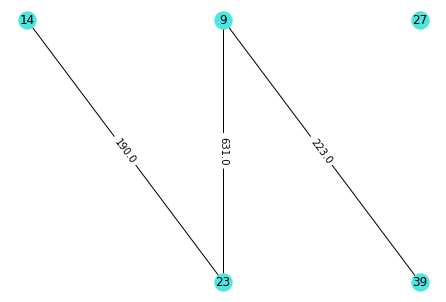

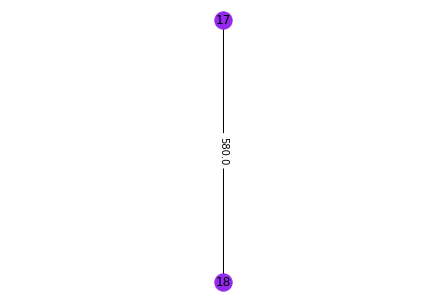

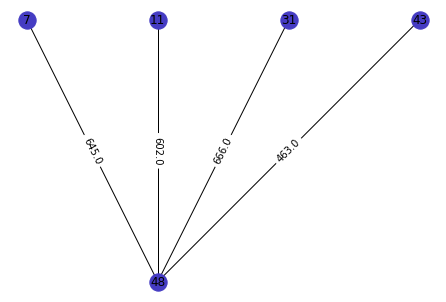

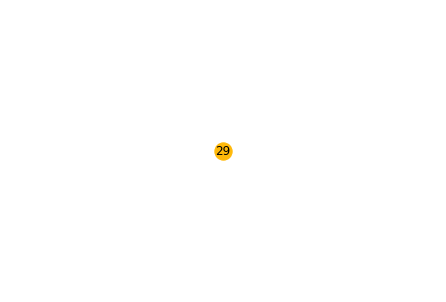

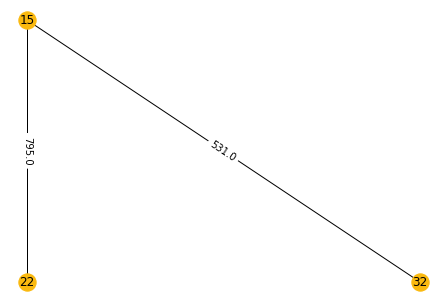

For k = 12
Clusters = [ 7  6  1  6  0  7  1  2  3  7  3  6  5  3 11  5  4  4  2 11  1 11  3  5
  0  2  8  1 10  1  3 11  2  6  3  2  0  0  9  2  5  2  3  2  6  0  6  3
  1  2]
Coditional Entropy = 0.633117349276262
F Measure = 0.36380170755170754
The internal traffic for cluster 1 = 3177.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 488.0
The emulated traffic between cluster 1 and cluster 4 = 1599.0
The emulated traffic between cluster 1 and cluster 5 = 0.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The emulated traffic between cluster 1 and cluster 7 = 2124.0
The emulated traffic between cluster 1 and cluster 8 = 0.0
The emulated traffic between cluster 1 and cluster 9 = 0.0
The emulated traffic between cluster 1 and cluster 10 = 0.0
The emulated traffic between cluster 1 and cluster 11 = 0.0
The emulated traffic between cluster 1 and cluster 12 = 802.0
The internal traffic for cluster 2 = 3549.0
The

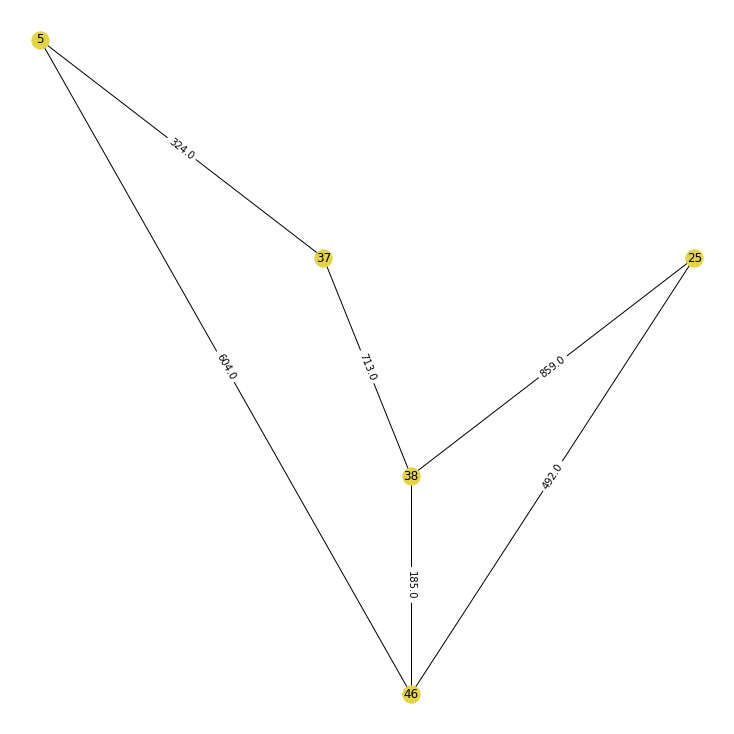

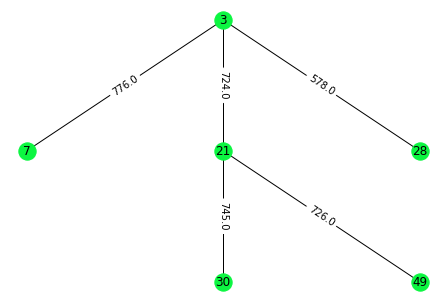

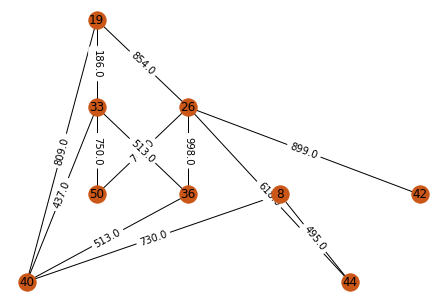

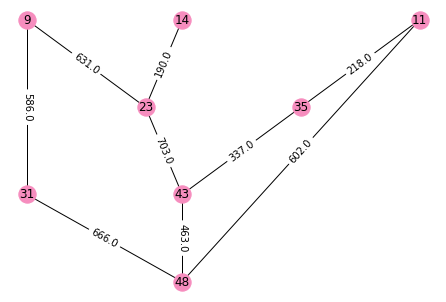

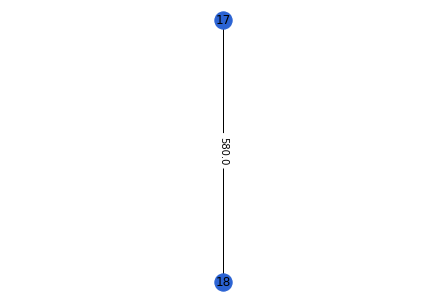

...

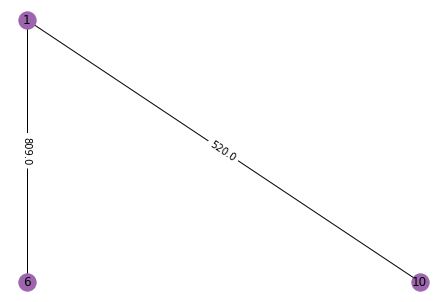

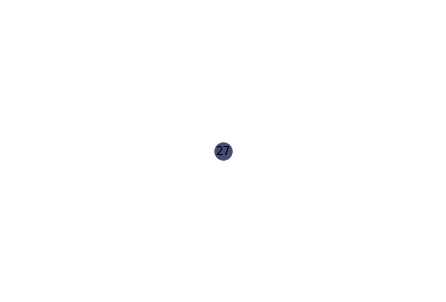

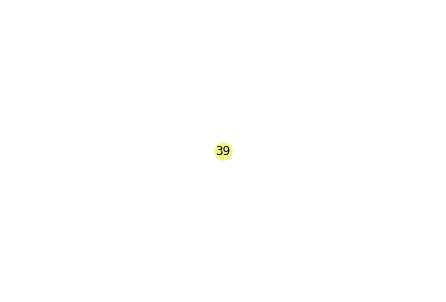

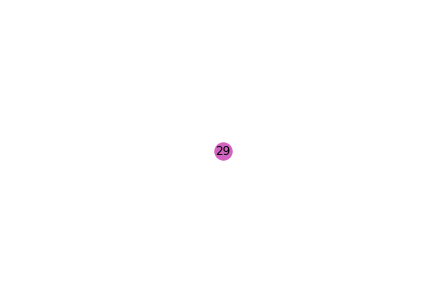

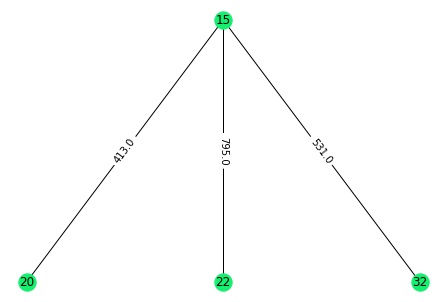

For k = 15
Clusters = [ 7  0  6  2  4  7  6  3  4  7  6  0 10 12  1  2  5  5  3 10 11  1  4  2
  8  3 13  2  9 11  4  1  3  8  3  3  1  8 14  3 10  3  4  3  0  8  0  6
  6  3]
Coditional Entropy = 0.5610804733753316
F Measure = 0.3649579831932773
The internal traffic for cluster 1 = 1728.0
The emulated traffic between cluster 1 and cluster 2 = 555.0
The emulated traffic between cluster 1 and cluster 3 = 387.0
The emulated traffic between cluster 1 and cluster 4 = 0.0
The emulated traffic between cluster 1 and cluster 5 = 0.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The emulated traffic between cluster 1 and cluster 7 = 0.0
The emulated traffic between cluster 1 and cluster 8 = 769.0
The emulated traffic between cluster 1 and cluster 9 = 1288.0
The emulated traffic between cluster 1 and cluster 10 = 0.0
The emulated traffic between cluster 1 and cluster 11 = 0.0
The emulated traffic between cluster 1 and cluster 12 = 0.0
The emulated traffic between cluster 1 and clust

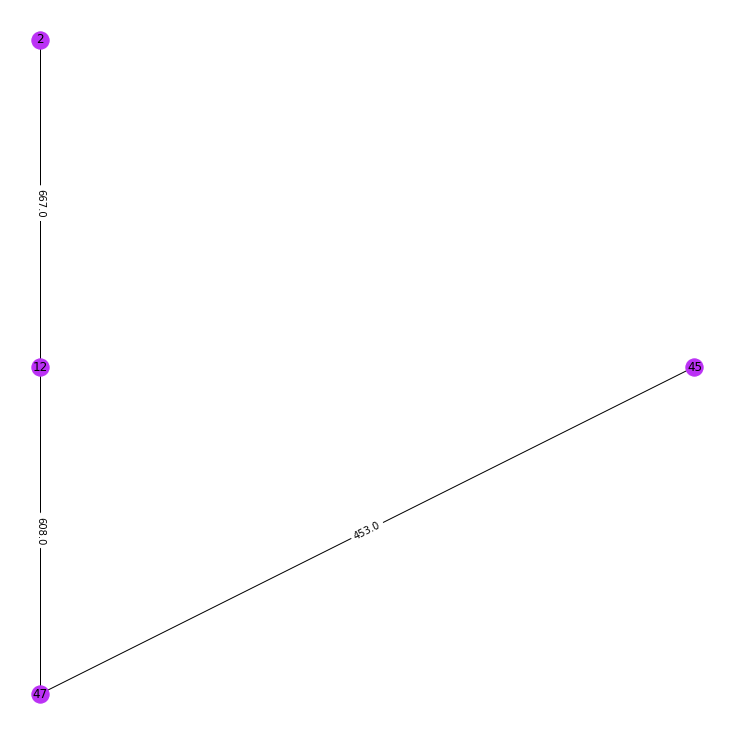

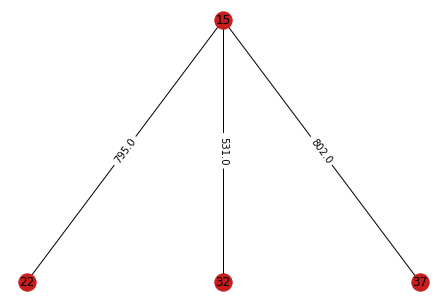

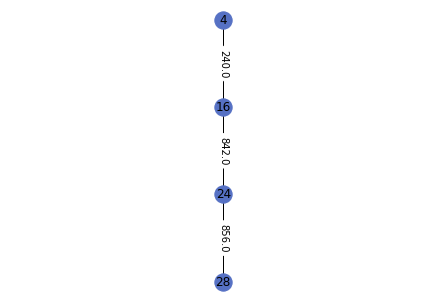

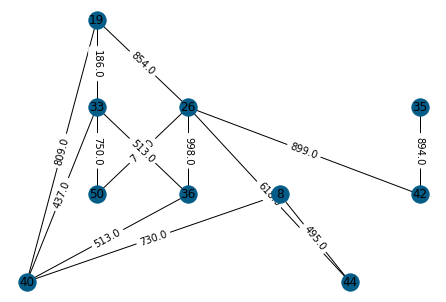

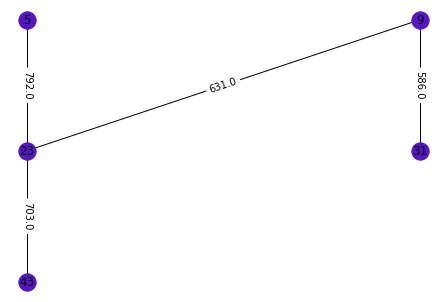

...

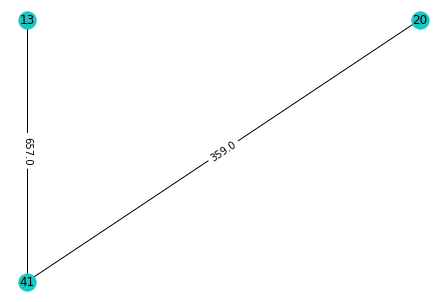

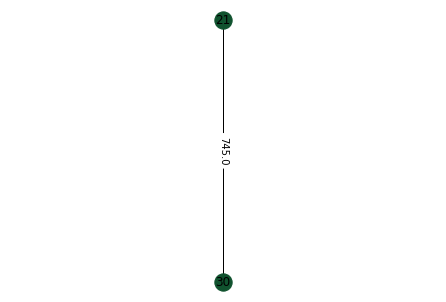

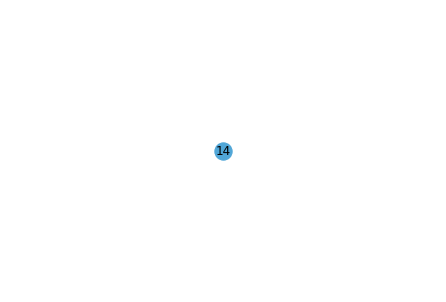

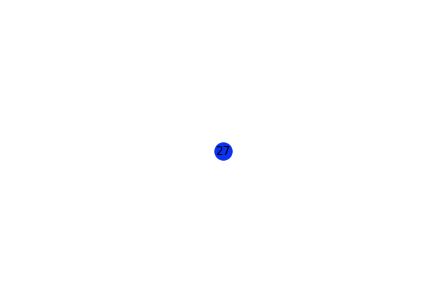

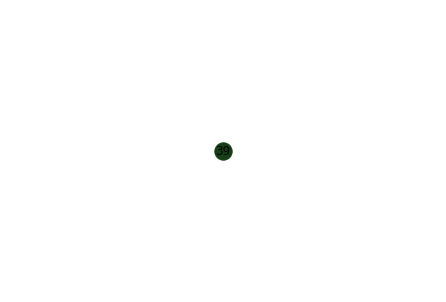

For k = 17
Clusters = [ 2  9  8  5  3  2  8  0  1  2 12  9 10 15  6  5  7  7 11 10 14  6  1  5
  3 11  4  8 13 14  1  6 11  3 12  0 12  3 16  0 10 12  1  0  9  3  9  1
 14 11]
Coditional Entropy = 0.4680932503115525
F Measure = 0.3625201595789832
The internal traffic for cluster 1 = 1738.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 0.0
The emulated traffic between cluster 1 and cluster 4 = 488.0
The emulated traffic between cluster 1 and cluster 5 = 0.0
The emulated traffic between cluster 1 and cluster 6 = 878.0
The emulated traffic between cluster 1 and cluster 7 = 331.0
The emulated traffic between cluster 1 and cluster 8 = 0.0
The emulated traffic between cluster 1 and cluster 9 = 215.0
The emulated traffic between cluster 1 and cluster 10 = 0.0
The emulated traffic between cluster 1 and cluster 11 = 0.0
The emulated traffic between cluster 1 and cluster 12 = 3375.0
The emulated traffic between cluster 1 and clu

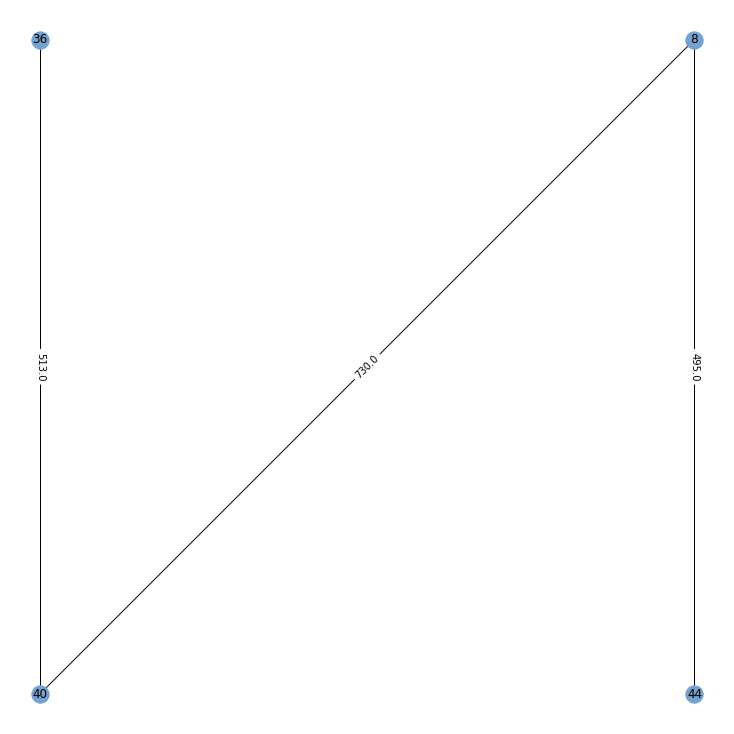

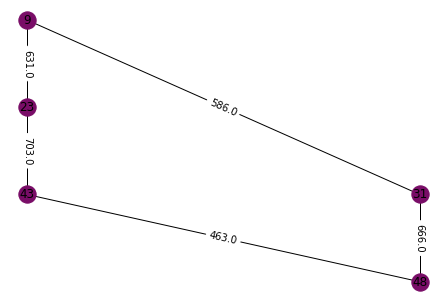

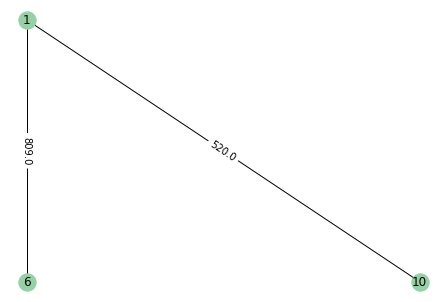

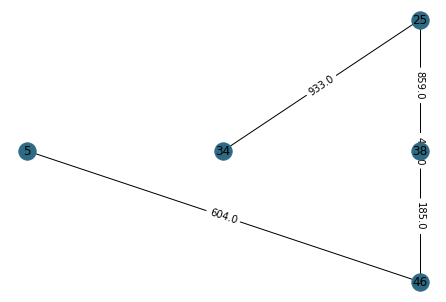

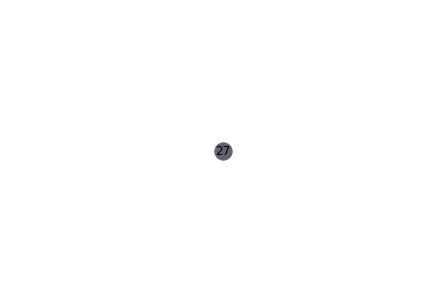

...

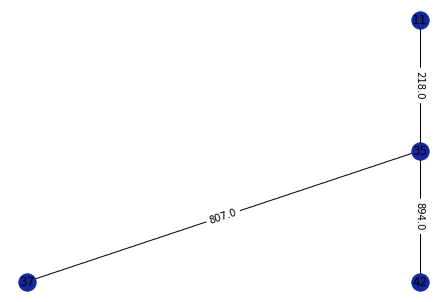

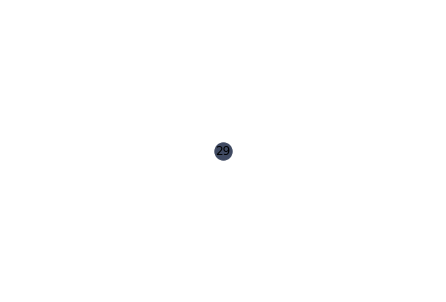

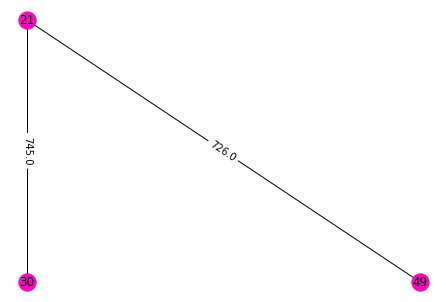

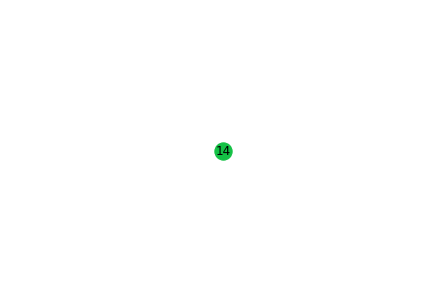

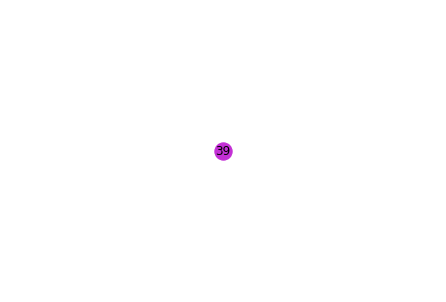

For k = 20
Clusters = [14  3 11  3  4  2 11 11 13 14  9  3  5 17  8  7  0  0  1 19  2  8  4  7
  6  1 12  7 16  2 13  8  1  6 18  1 18  6 10  1  5 18  4 11 15  6 15  9
  2  1]
Coditional Entropy = 0.4005464484037042
F Measure = 0.3698265623265623
The internal traffic for cluster 1 = 580.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 0.0
The emulated traffic between cluster 1 and cluster 4 = 0.0
The emulated traffic between cluster 1 and cluster 5 = 0.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The emulated traffic between cluster 1 and cluster 7 = 0.0
The emulated traffic between cluster 1 and cluster 8 = 0.0
The emulated traffic between cluster 1 and cluster 9 = 0.0
The emulated traffic between cluster 1 and cluster 10 = 0.0
The emulated traffic between cluster 1 and cluster 11 = 0.0
The emulated traffic between cluster 1 and cluster 12 = 0.0
The emulated traffic between cluster 1 and cluster 13 = 0.

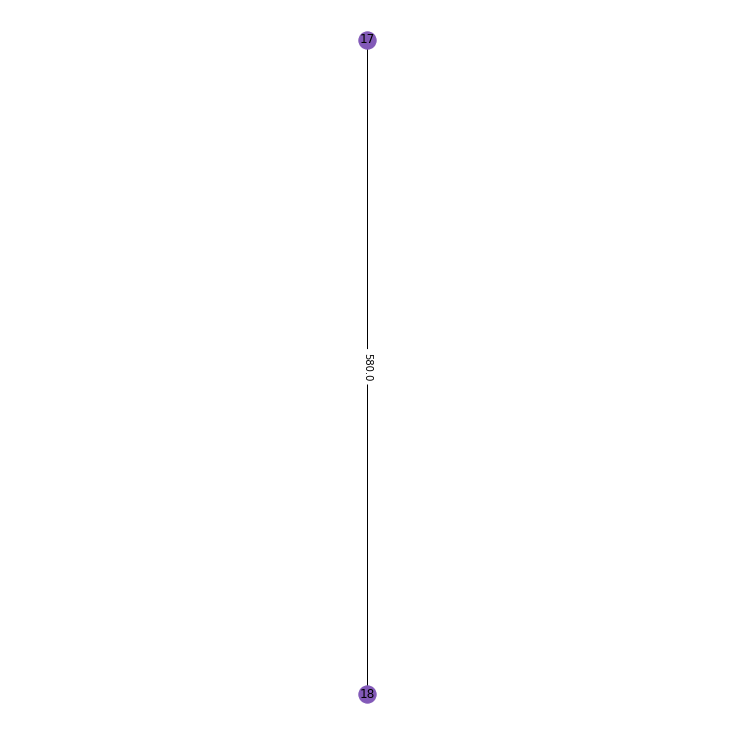

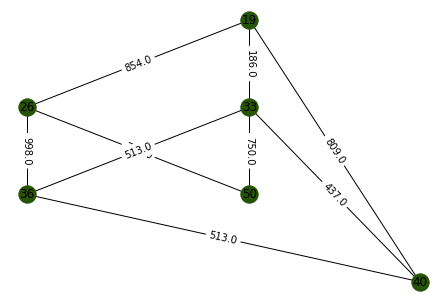

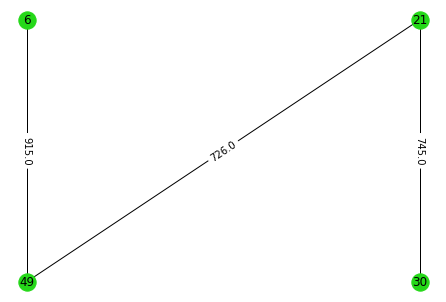

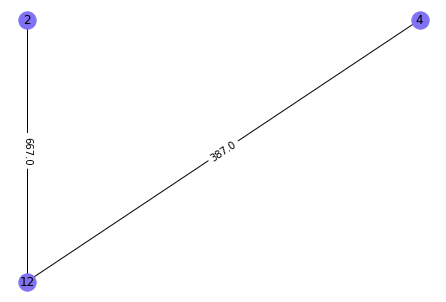

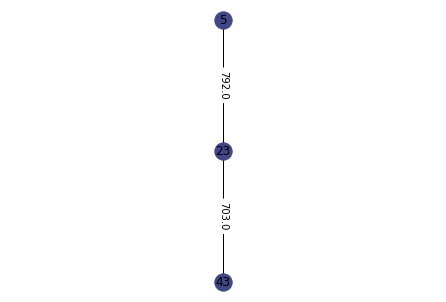

...

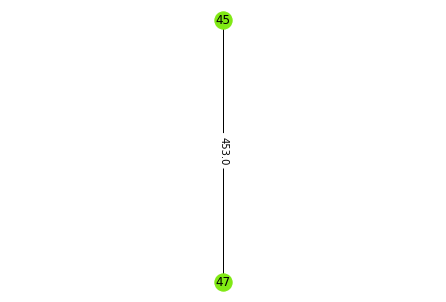

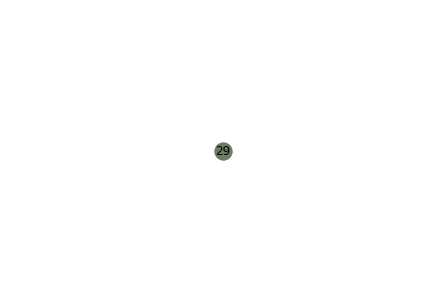

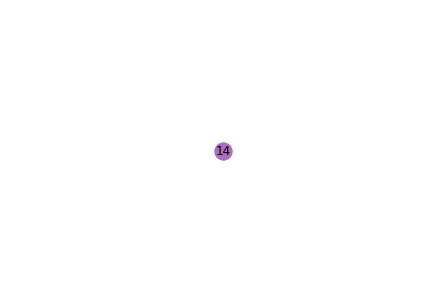

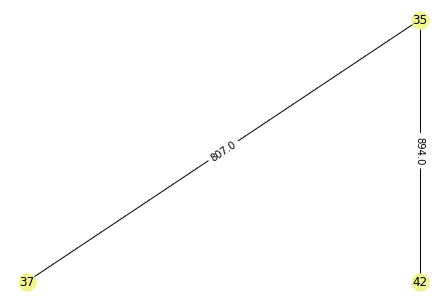

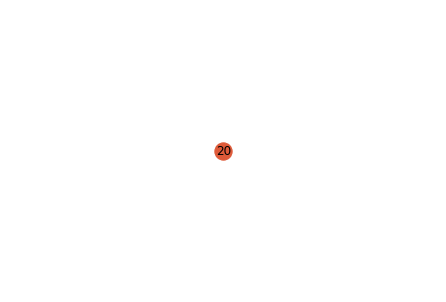

For k = 25
Clusters = [ 1 15  7 22  8  1  7  0  6 24 16 15 13 17  5  4 12 19  3 21 14  5  8  4
  9  3 20  7 11 14  6 23  3 15  2  3  2  9 18  3 13  2  8  0 10  9 10 16
  1  3]
Coditional Entropy = 0.33284412507440997
F Measure = 0.3480170940170941
The internal traffic for cluster 1 = 495.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 0.0
The emulated traffic between cluster 1 and cluster 4 = 1348.0
The emulated traffic between cluster 1 and cluster 5 = 193.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The emulated traffic between cluster 1 and cluster 7 = 0.0
The emulated traffic between cluster 1 and cluster 8 = 215.0
The emulated traffic between cluster 1 and cluster 9 = 0.0
The emulated traffic between cluster 1 and cluster 10 = 488.0
The emulated traffic between cluster 1 and cluster 11 = 0.0
The emulated traffic between cluster 1 and cluster 12 = 0.0
The emulated traffic between cluster 1 and clust

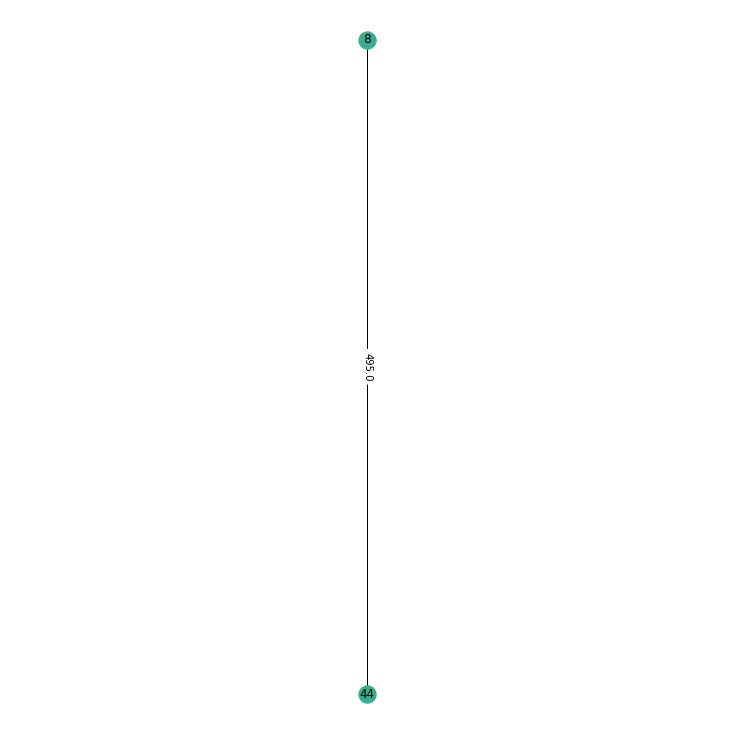

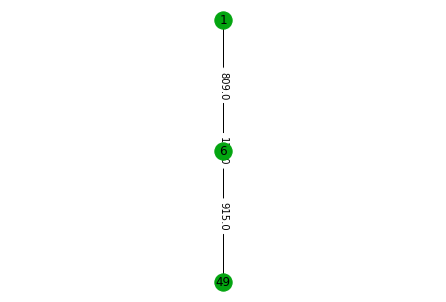

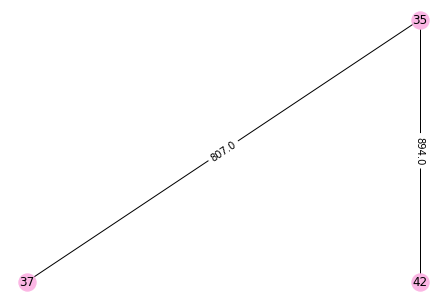

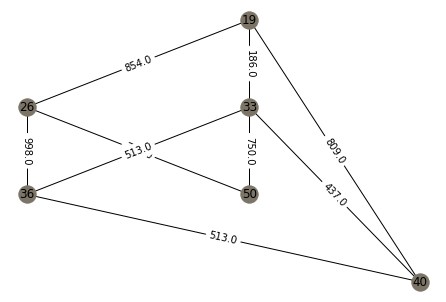

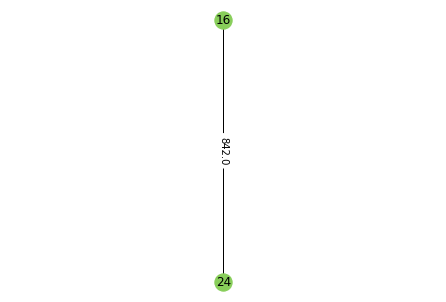

...

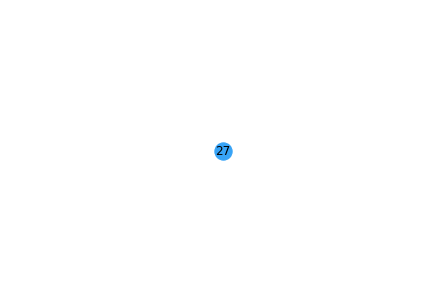

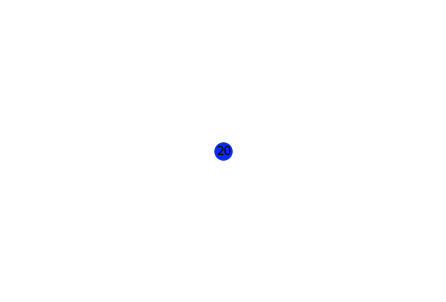

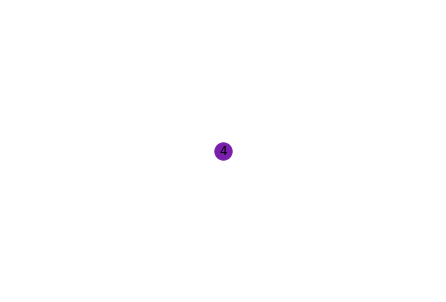

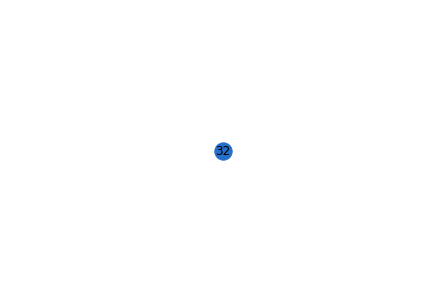

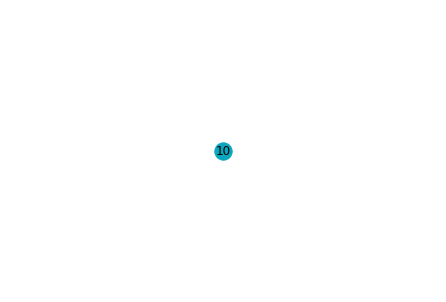

In [ ]:
#nodes = 50
# toplogy 4
example = examples[len(examples)-1-4]
gt = ground_truth_array[10+4]
print("Clusters for example 50_4")
for j in K_values_50:
  A = similarity_matrix(example)
  Y = Normalized_cut(A, j)
  cluster_matrix = get_traffic(Y, A)
  print("For k =",j)
  print("Clusters =",Y)
  print("Coditional Entropy =", conditional_entropy(Y, gt))
  print("F Measure =", f_measure(precision(Y, gt), recall(Y, gt)))
  for i in range(cluster_matrix.shape[0]):
    print("The internal traffic for cluster",i+1,"=",cluster_matrix[i,i])
    for k in range(cluster_matrix.shape[0]):
      if (i != k and k > i):
        print("The emulated traffic between cluster", i+1, "and cluster", k+1,"=",cluster_matrix[i][k])
  print("The graph after clustering:")
  visualize_topologies_afterClustering(example, Y)

Clusters for example 50_5
For k = 2
Clusters = [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1]
Coditional Entropy = 1.003640880687913
F Measure = 0.4051724137931034
The internal traffic for cluster 1 = 30607.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The internal traffic for cluster 2 = 0.0
The graph after clustering:


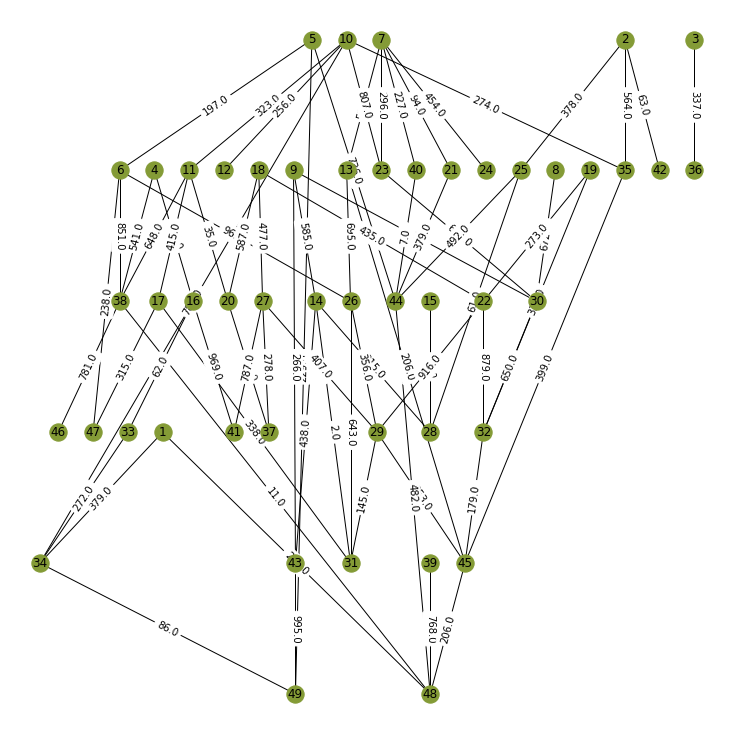

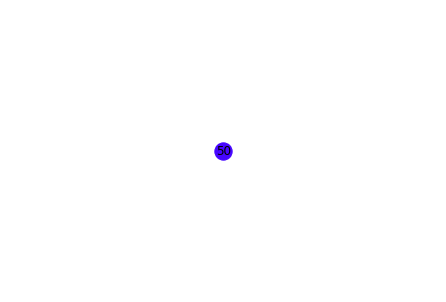

For k = 10
Clusters = [2 2 5 0 2 0 6 3 3 4 0 4 6 3 7 1 0 1 1 1 2 1 4 6 2 0 1 3 1 3 0 1 4 4 2 5 1
 0 2 6 1 8 3 2 2 0 0 2 3 9]
Coditional Entropy = 0.7072647027983784
F Measure = 0.3351551956815114
The internal traffic for cluster 1 = 5735.0
The emulated traffic between cluster 1 and cluster 2 = 1038.0
The emulated traffic between cluster 1 and cluster 3 = 208.0
The emulated traffic between cluster 1 and cluster 4 = 2.0
The emulated traffic between cluster 1 and cluster 5 = 323.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The emulated traffic between cluster 1 and cluster 7 = 695.0
The emulated traffic between cluster 1 and cluster 8 = 0.0
The emulated traffic between cluster 1 and cluster 9 = 0.0
The emulated traffic between cluster 1 and cluster 10 = 0.0
The internal traffic for cluster 2 = 6926.0
The emulated traffic between cluster 2 and cluster 3 = 532.0
The emulated traffic between cluster 2 and cluster 4 = 650.0
The emulated traffic between cluster 2 and cluster 5 

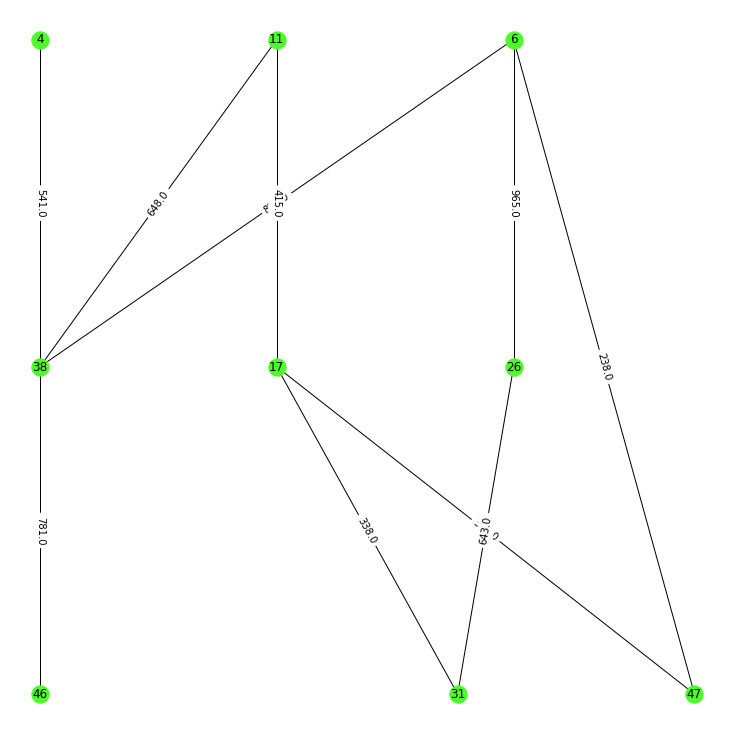

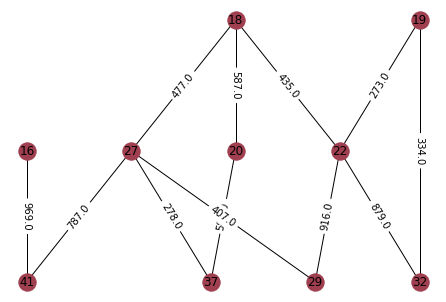

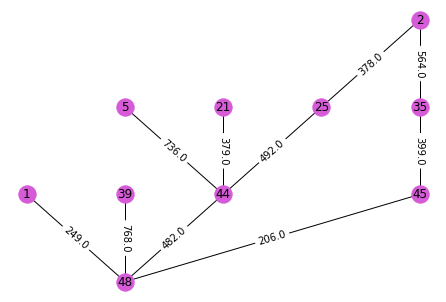

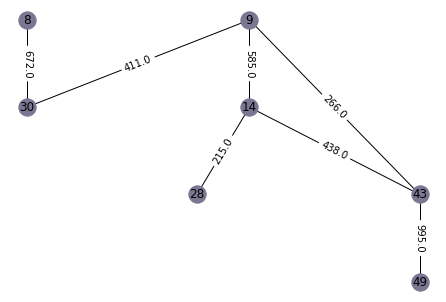

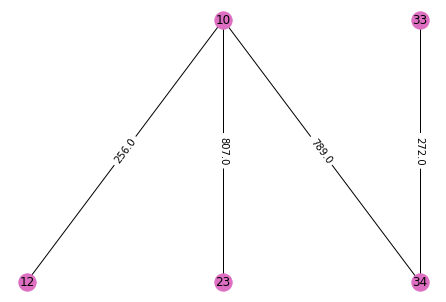

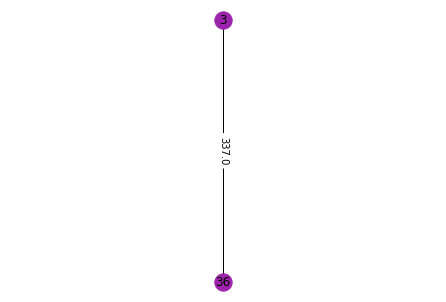

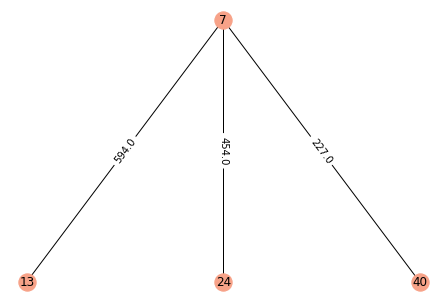

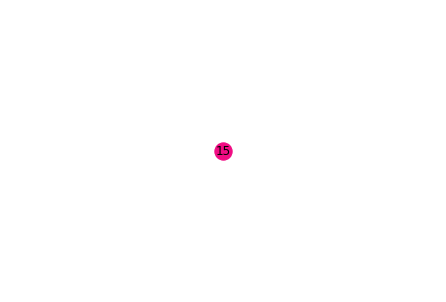

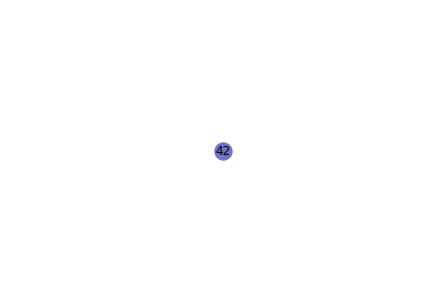

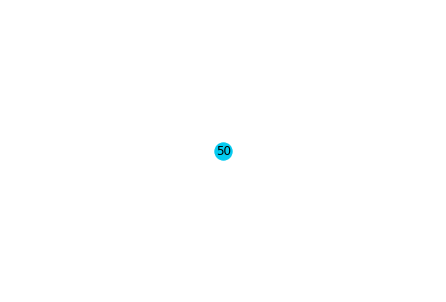

For k = 12
Clusters = [ 0  5  6  1  5  1  7  3  2  9  1  9  7  2 11  4  1  4  3  4  5  3  3  7
  5  1  4  2  3  3  1  3  0  0  5  6  4  1  5  7  4 10  2  5  3  1  1  5
  2  8]
Coditional Entropy = 0.6526548732993194
F Measure = 0.3171356421356421
The internal traffic for cluster 1 = 651.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 86.0
The emulated traffic between cluster 1 and cluster 4 = 0.0
The emulated traffic between cluster 1 and cluster 5 = 62.0
The emulated traffic between cluster 1 and cluster 6 = 249.0
The emulated traffic between cluster 1 and cluster 7 = 0.0
The emulated traffic between cluster 1 and cluster 8 = 0.0
The emulated traffic between cluster 1 and cluster 9 = 0.0
The emulated traffic between cluster 1 and cluster 10 = 789.0
The emulated traffic between cluster 1 and cluster 11 = 0.0
The emulated traffic between cluster 1 and cluster 12 = 0.0
The internal traffic for cluster 2 = 5735.0
The emul

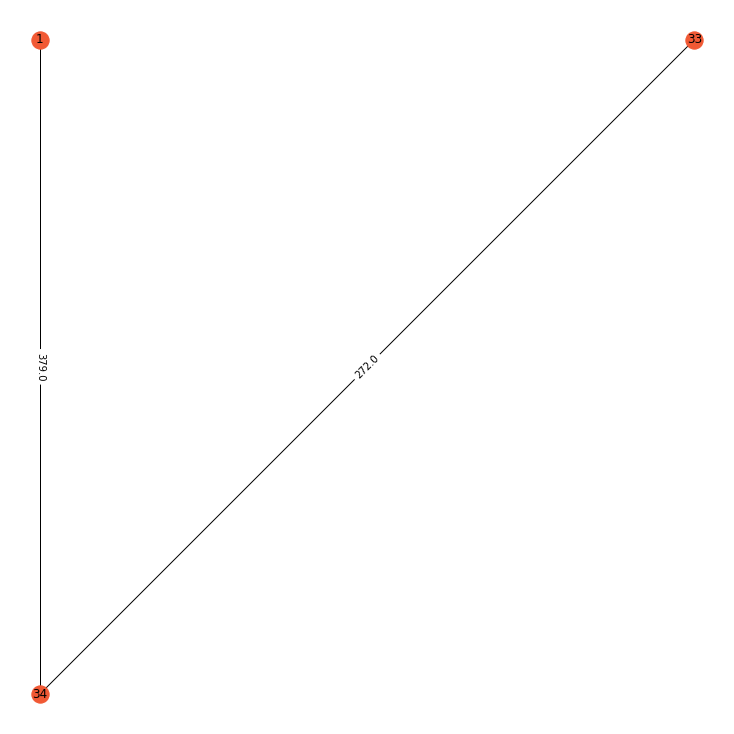

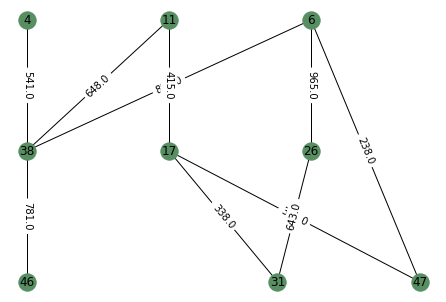

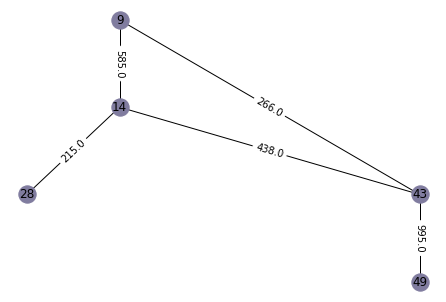

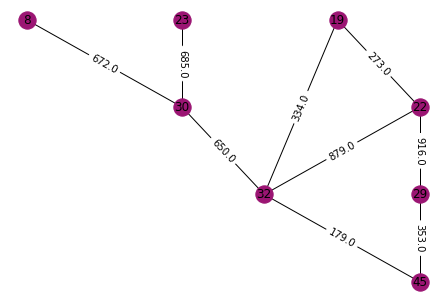

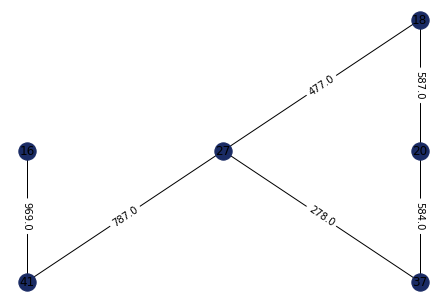

...

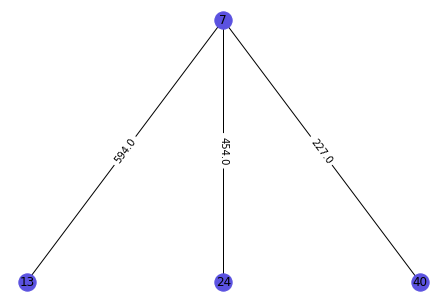

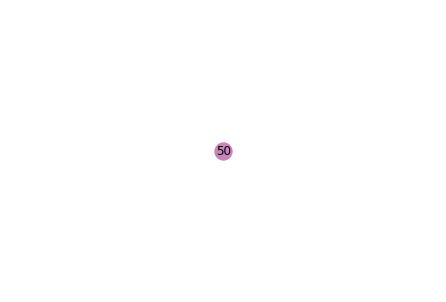

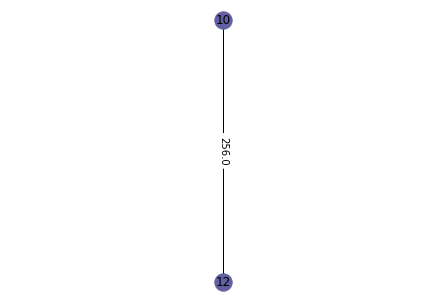

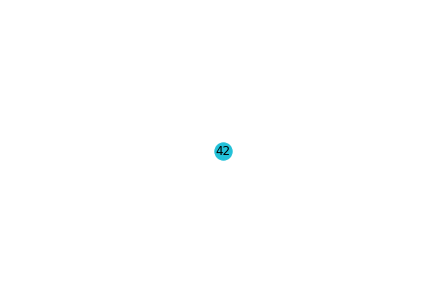

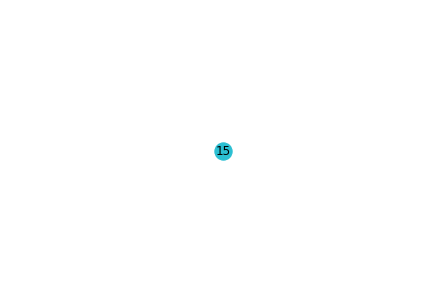

For k = 15
Clusters = [ 8  7  6  3  2  0  9 12  5  1  0  1  9  5 11  3  0  4 12  4  2 12  1  9
  7  0  4  5 12 12  0 12 13 13  7  6  4  3  8  9  3 10  5  2  7  3  0  8
  5 14]
Coditional Entropy = 0.5208029252478509
F Measure = 0.3200991600991601
The internal traffic for cluster 1 = 2914.0
The emulated traffic between cluster 1 and cluster 2 = 323.0
The emulated traffic between cluster 1 and cluster 3 = 197.0
The emulated traffic between cluster 1 and cluster 4 = 1499.0
The emulated traffic between cluster 1 and cluster 5 = 35.0
The emulated traffic between cluster 1 and cluster 6 = 2.0
The emulated traffic between cluster 1 and cluster 7 = 0.0
The emulated traffic between cluster 1 and cluster 8 = 0.0
The emulated traffic between cluster 1 and cluster 9 = 0.0
The emulated traffic between cluster 1 and cluster 10 = 695.0
The emulated traffic between cluster 1 and cluster 11 = 0.0
The emulated traffic between cluster 1 and cluster 12 = 0.0
The emulated traffic between cluster 1 and clus

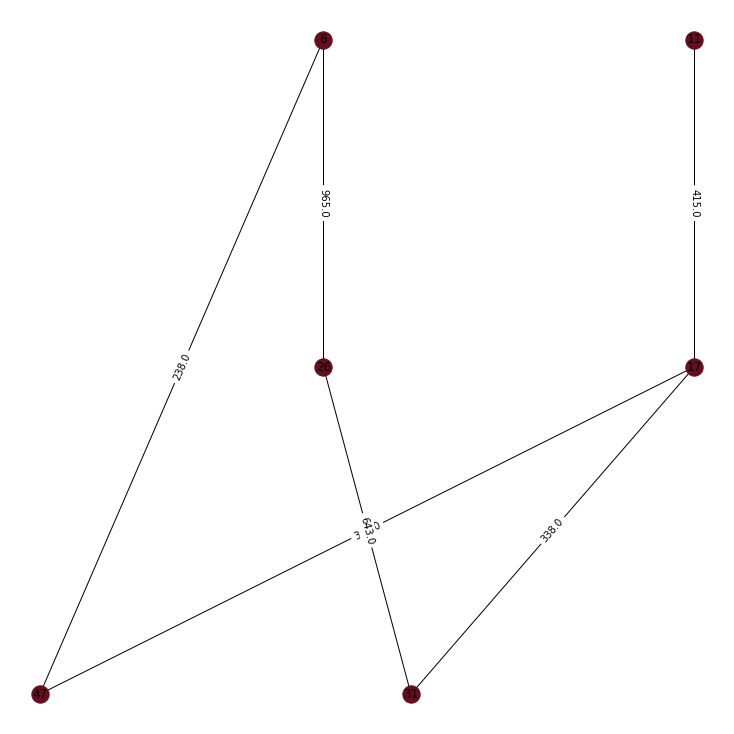

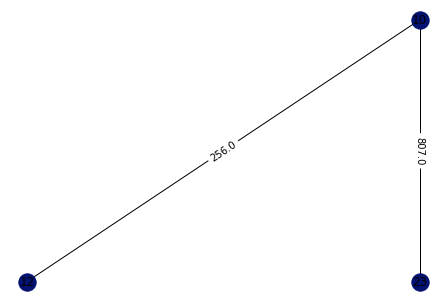

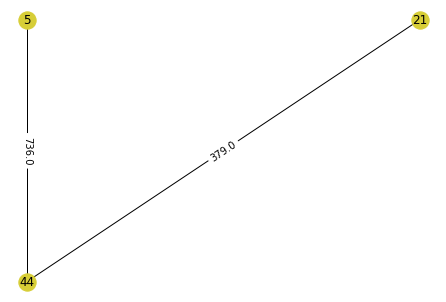

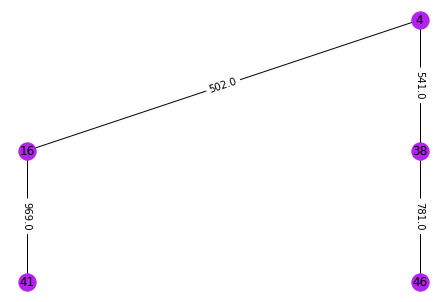

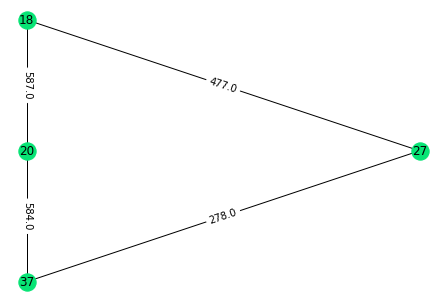

...

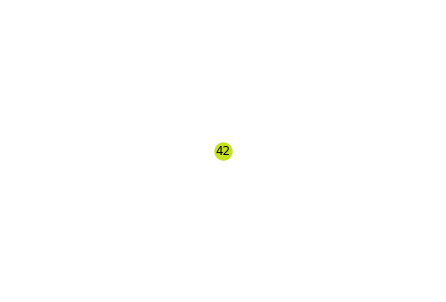

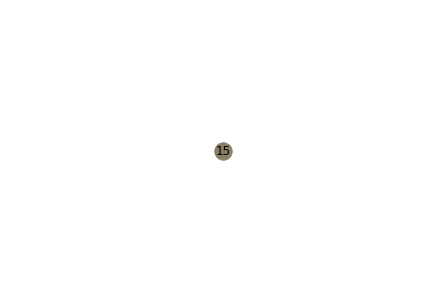

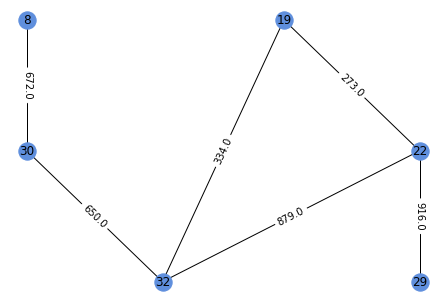

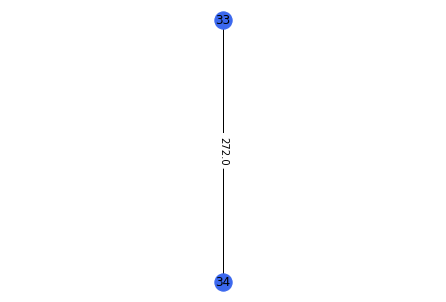

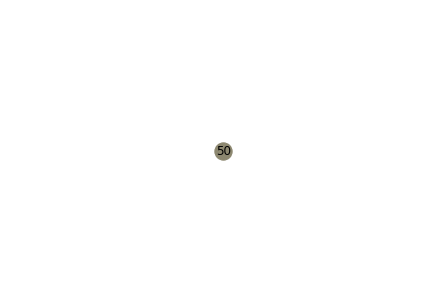

For k = 17
Clusters = [15  5  9  2  0  3  8  1  6  4  3  4  8  6 12  2  3 14  1 14  0  1  4  8
  5  3 14 13  1  1  3  1 15 15  5  9 14  2  7 16  2 11  6  0  5  2  3  7
  6 10]
Coditional Entropy = 0.4795332000974287
F Measure = 0.32213146330793385
The internal traffic for cluster 1 = 1115.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 0.0
The emulated traffic between cluster 1 and cluster 4 = 197.0
The emulated traffic between cluster 1 and cluster 5 = 0.0
The emulated traffic between cluster 1 and cluster 6 = 492.0
The emulated traffic between cluster 1 and cluster 7 = 229.0
The emulated traffic between cluster 1 and cluster 8 = 482.0
The emulated traffic between cluster 1 and cluster 9 = 94.0
The emulated traffic between cluster 1 and cluster 10 = 0.0
The emulated traffic between cluster 1 and cluster 11 = 0.0
The emulated traffic between cluster 1 and cluster 12 = 0.0
The emulated traffic between cluster 1 and clus

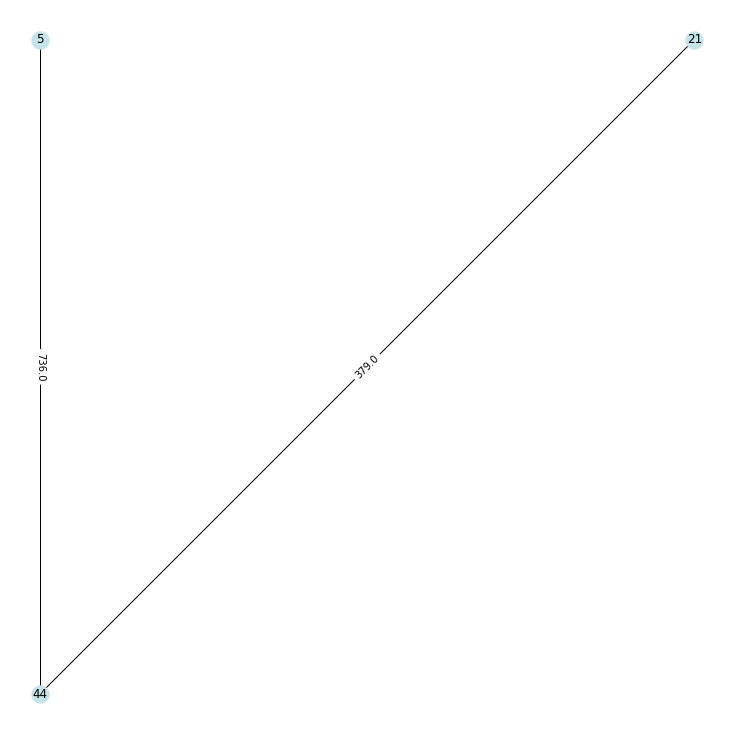

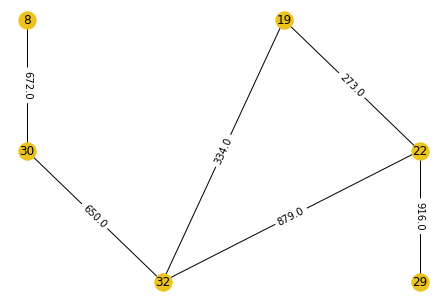

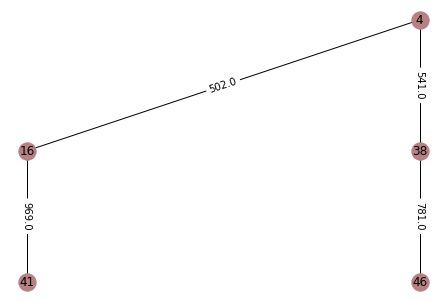

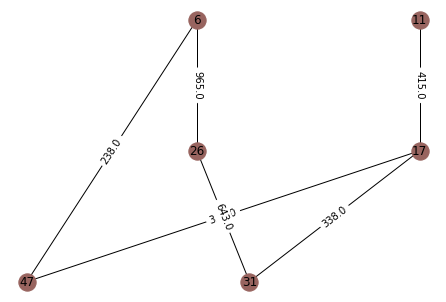

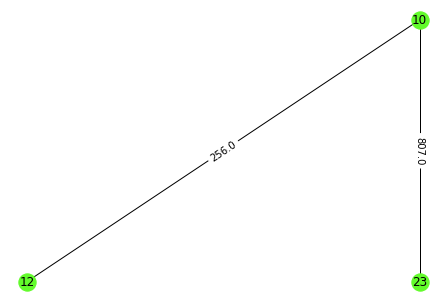

...

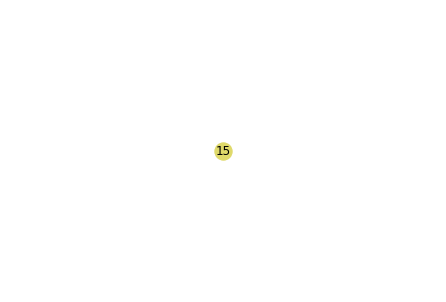

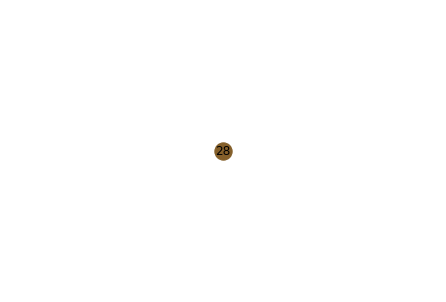

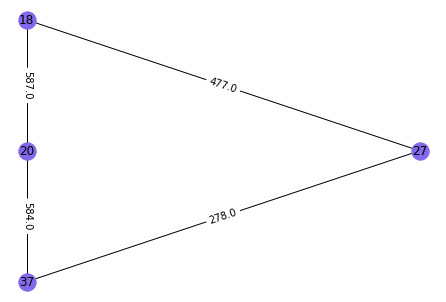

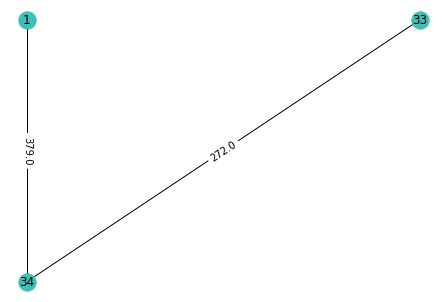

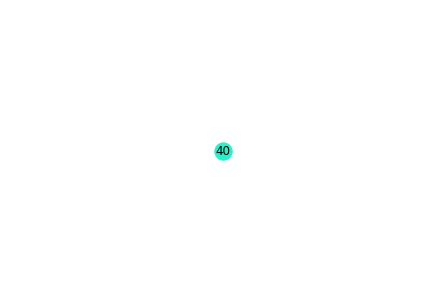

For k = 20
Clusters = [13  9  5  3  2  7 10  1 11 13  7 16 10 11 14  3  0  6  4  6  2  4  1 10
  9  0  3 19  4  1  0  4 17 13  9  5  6  7  8 15  3 18 11  2  9  7  0  8
 11 12]
Coditional Entropy = 0.4321251722533207
F Measure = 0.2907586857586858
The internal traffic for cluster 1 = 1296.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 0.0
The emulated traffic between cluster 1 and cluster 4 = 0.0
The emulated traffic between cluster 1 and cluster 5 = 501.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The emulated traffic between cluster 1 and cluster 7 = 0.0
The emulated traffic between cluster 1 and cluster 8 = 1618.0
The emulated traffic between cluster 1 and cluster 9 = 0.0
The emulated traffic between cluster 1 and cluster 10 = 0.0
The emulated traffic between cluster 1 and cluster 11 = 695.0
The emulated traffic between cluster 1 and cluster 12 = 2.0
The emulated traffic between cluster 1 and cluster

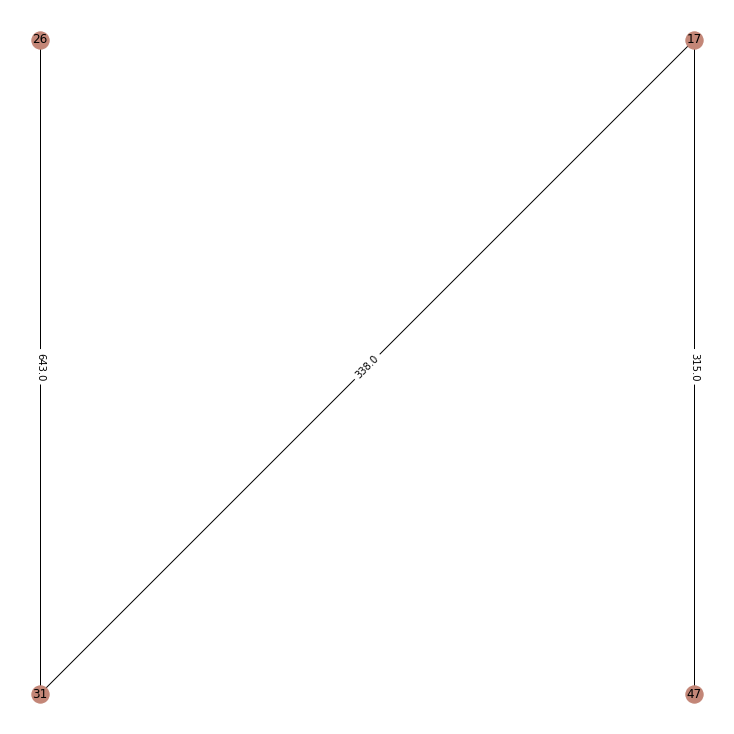

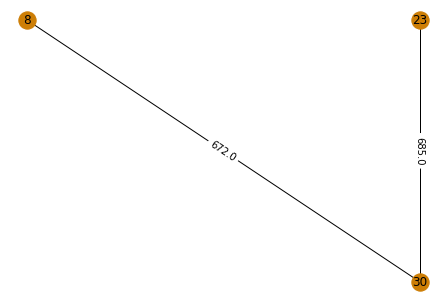

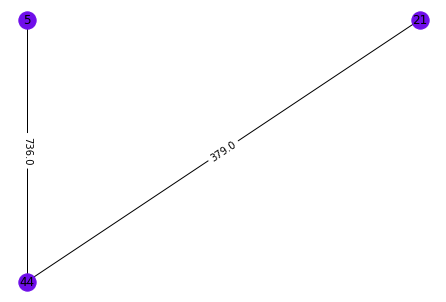

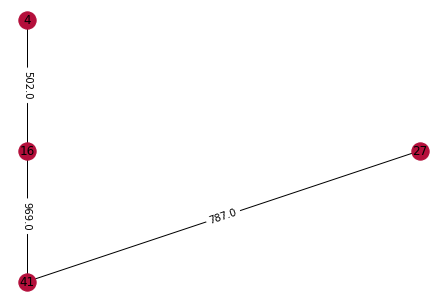

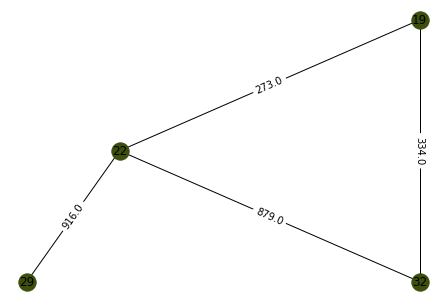

...

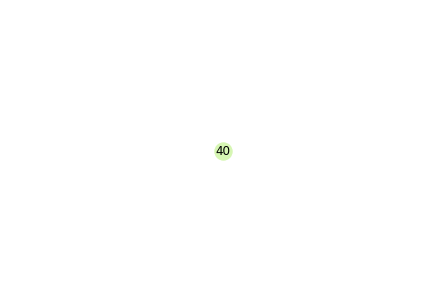

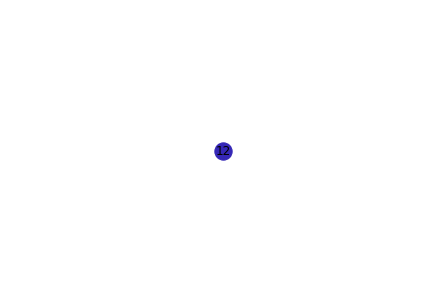

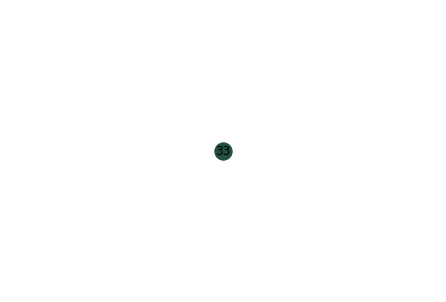

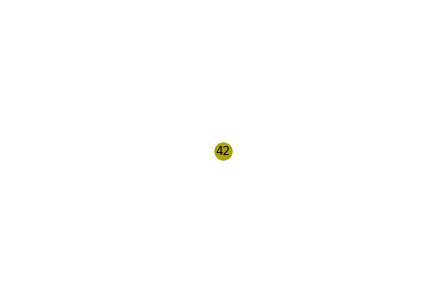

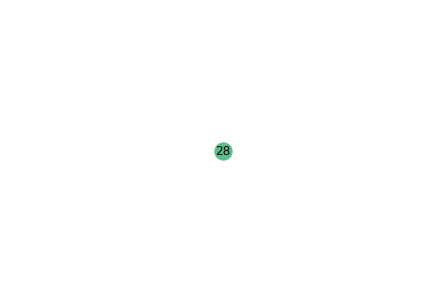

For k = 25
Clusters = [ 2 24 16  3  6  9  7 11  5  2 18 15  4  5 14  3 18  0  8  0  6  8 11  7
  6  1  3 17  4 11  1  8 20  2 24 23  0  9 12 13  3 19 10  6  4  9 21 12
 10 22]
Coditional Entropy = 0.3403404492709079
F Measure = 0.2985299145299145
The internal traffic for cluster 1 = 1171.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 0.0
The emulated traffic between cluster 1 and cluster 4 = 755.0
The emulated traffic between cluster 1 and cluster 5 = 0.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The emulated traffic between cluster 1 and cluster 7 = 0.0
The emulated traffic between cluster 1 and cluster 8 = 0.0
The emulated traffic between cluster 1 and cluster 9 = 435.0
The emulated traffic between cluster 1 and cluster 10 = 0.0
The emulated traffic between cluster 1 and cluster 11 = 0.0
The emulated traffic between cluster 1 and cluster 12 = 0.0
The emulated traffic between cluster 1 and cluster 13

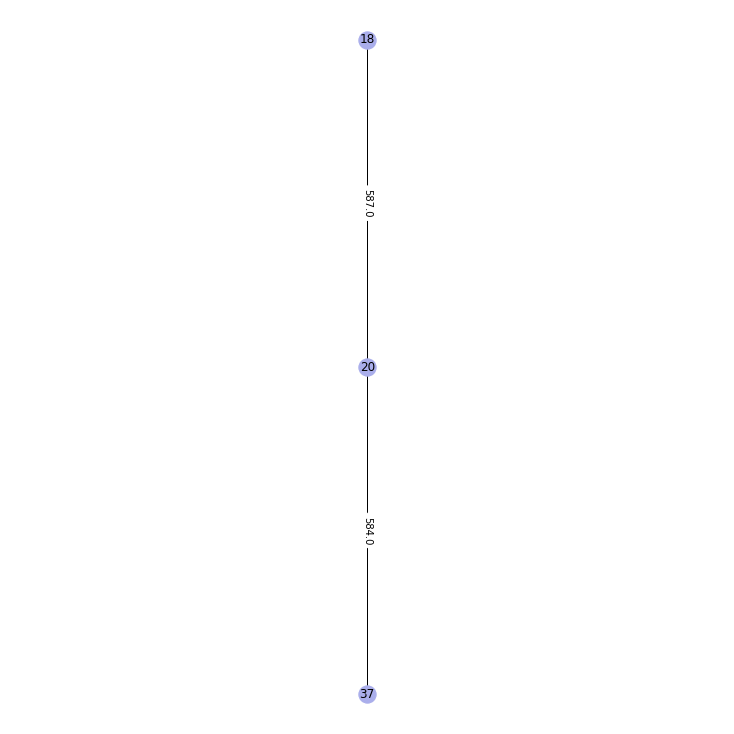

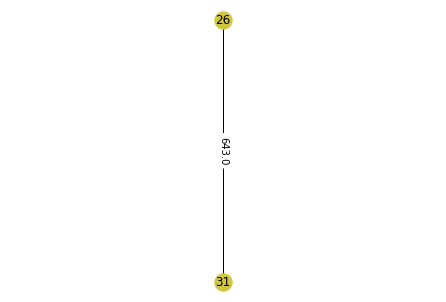

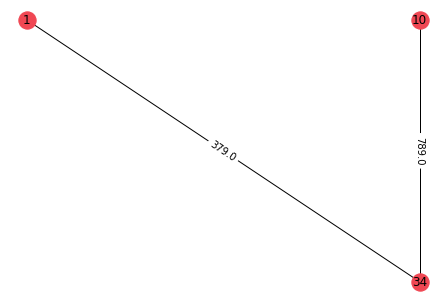

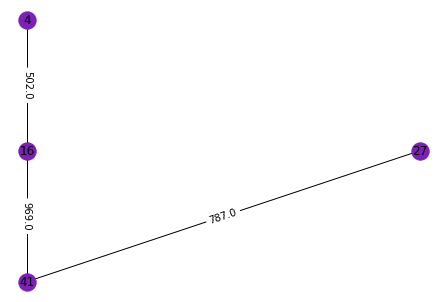

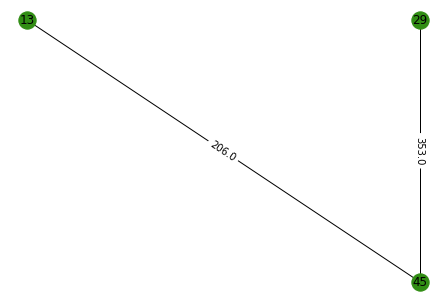

...

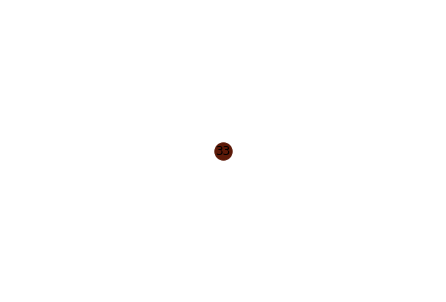

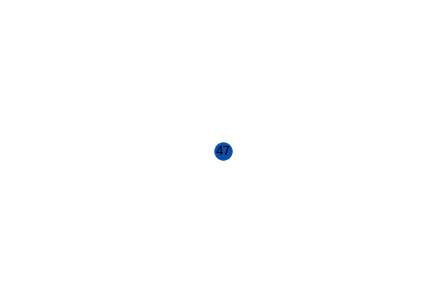

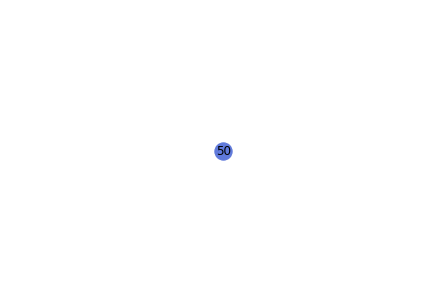

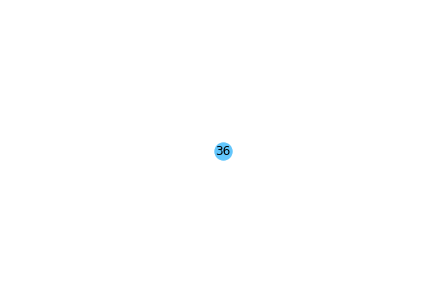

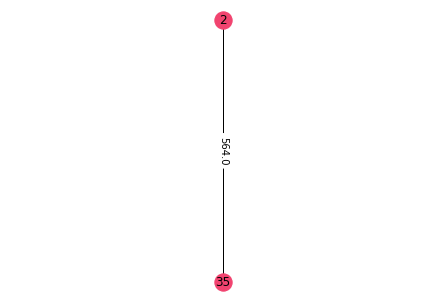

In [81]:
#nodes = 50
# toplogy 5
example = examples[len(examples)-1-5]
gt = ground_truth_array[10+5]
print("Clusters for example 50_5")
for j in K_values_50:
  A = similarity_matrix(example)
  Y = Normalized_cut(A, j)
  cluster_matrix = get_traffic(Y, A)
  print("For k =",j)
  print("Clusters =",Y)
  print("Coditional Entropy =", conditional_entropy(Y, gt))
  print("F Measure =", f_measure(precision(Y, gt), recall(Y, gt)))
  for i in range(cluster_matrix.shape[0]):
    print("The internal traffic for cluster",i+1,"=",cluster_matrix[i,i])
    for k in range(cluster_matrix.shape[0]):
      if (i != k and k > i):
        print("The emulated traffic between cluster", i+1, "and cluster", k+1,"=",cluster_matrix[i][k])
  print("The graph after clustering:")
  visualize_topologies_afterClustering(example, Y)

Clusters for example 50_6
For k = 2
Clusters = [0 0 1 0 1 0 1 0 1 1 1 0 1 1 1 0 0 1 1 0 0 0 0 1 1 0 0 1 1 1 1 0 1 1 1 1 1
 1 0 1 1 1 1 0 0 0 1 1 1 1]
Coditional Entropy = 1.1801943947710736
F Measure = 0.17267080745341612
The internal traffic for cluster 1 = 28401.0
The emulated traffic between cluster 1 and cluster 2 = 42062.0
The internal traffic for cluster 2 = 62935.0
The graph after clustering:


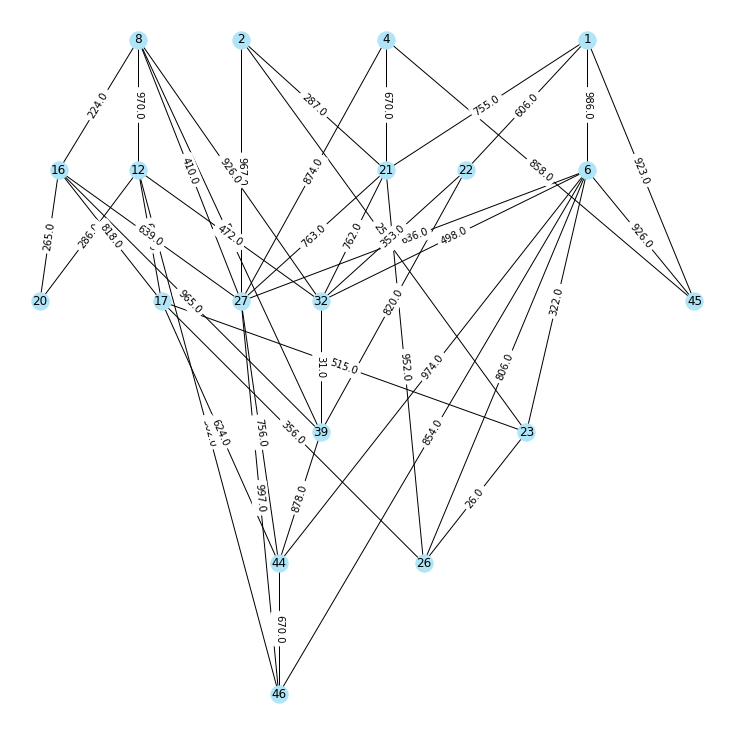

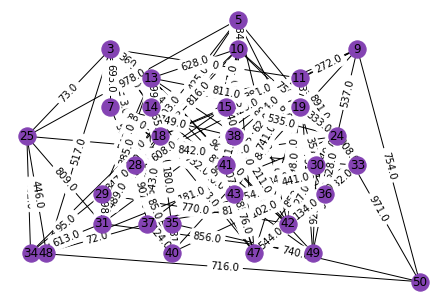

For k = 10
Clusters = [3 9 6 8 5 0 2 7 4 2 3 7 5 1 2 7 9 1 5 7 1 3 9 4 8 1 0 0 8 3 8 6 5 8 4 5 5
 2 3 4 2 5 3 0 8 0 2 6 3 4]
Coditional Entropy = 0.6445147023827479
F Measure = 0.33375901875901876
The internal traffic for cluster 1 = 5677.0
The emulated traffic between cluster 1 and cluster 2 = 2164.0
The emulated traffic between cluster 1 and cluster 3 = 3444.0
The emulated traffic between cluster 1 and cluster 4 = 3238.0
The emulated traffic between cluster 1 and cluster 5 = 2404.0
The emulated traffic between cluster 1 and cluster 6 = 3326.0
The emulated traffic between cluster 1 and cluster 7 = 501.0
The emulated traffic between cluster 1 and cluster 8 = 1982.0
The emulated traffic between cluster 1 and cluster 9 = 6286.0
The emulated traffic between cluster 1 and cluster 10 = 1913.0
The internal traffic for cluster 2 = 4653.0
The emulated traffic between cluster 2 and cluster 3 = 3867.0
The emulated traffic between cluster 2 and cluster 4 = 2401.0
The emulated traffic between clus

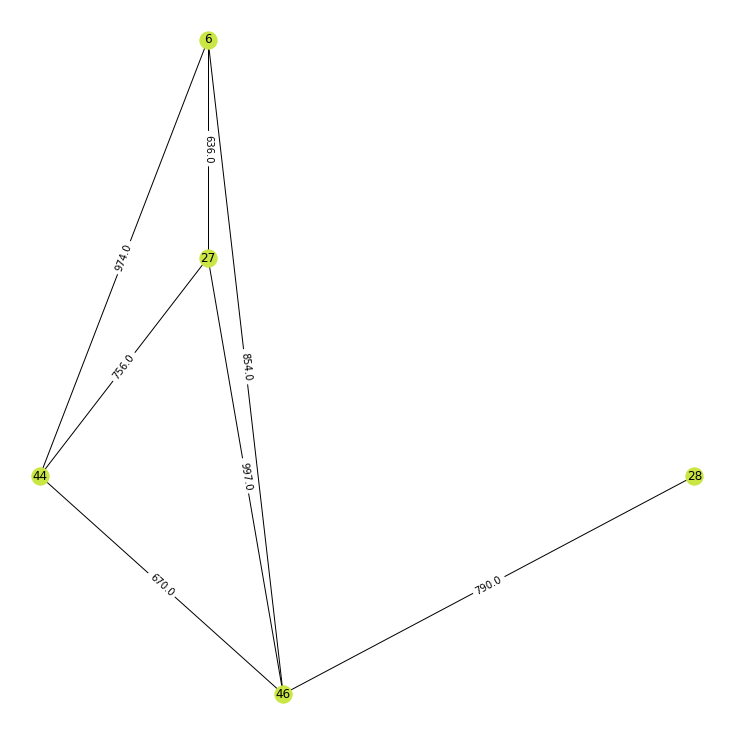

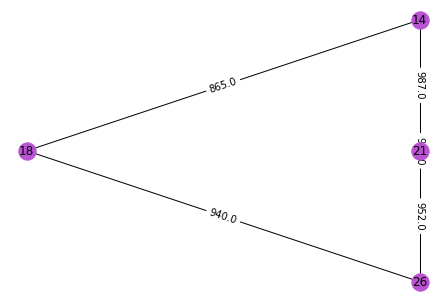

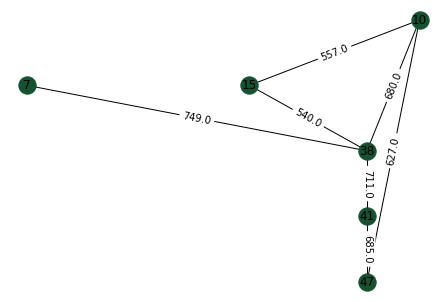

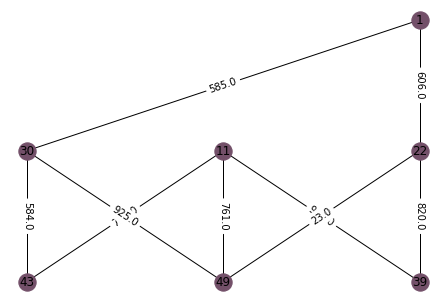

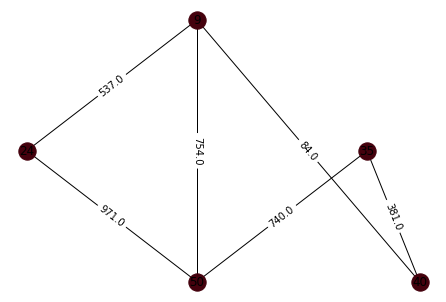

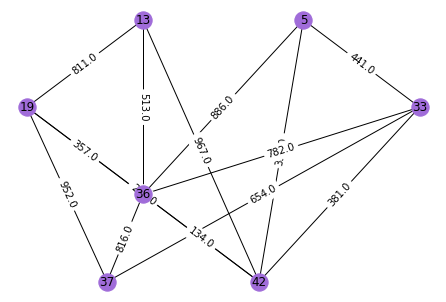

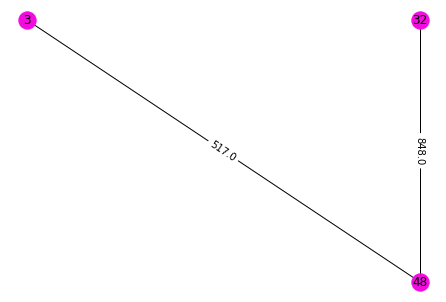

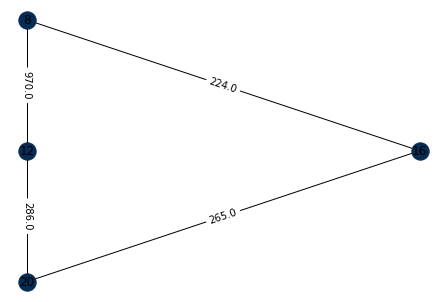

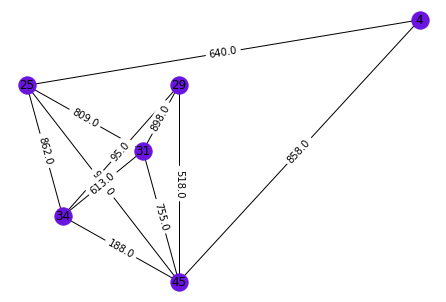

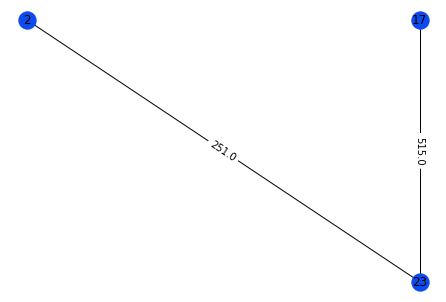

For k = 12
Clusters = [11  7  5  8  0  1 10  4  6 10 11  4  2  2 10  3  7  9  2  4  8  3  7 11
  8  2  1  1  1 11  8  5  0  8  6  0  2 10  3  6  9  2  9  1  8  1 10  5
 11  6]
Coditional Entropy = 0.5630648274212141
F Measure = 0.40365560365560366
The internal traffic for cluster 1 = 2109.0
The emulated traffic between cluster 1 and cluster 2 = 753.0
The emulated traffic between cluster 1 and cluster 3 = 3338.0
The emulated traffic between cluster 1 and cluster 4 = 978.0
The emulated traffic between cluster 1 and cluster 5 = 683.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The emulated traffic between cluster 1 and cluster 7 = 102.0
The emulated traffic between cluster 1 and cluster 8 = 741.0
The emulated traffic between cluster 1 and cluster 9 = 1840.0
The emulated traffic between cluster 1 and cluster 10 = 866.0
The emulated traffic between cluster 1 and cluster 11 = 1201.0
The emulated traffic between cluster 1 and cluster 12 = 1536.0
The internal traffic for cluster

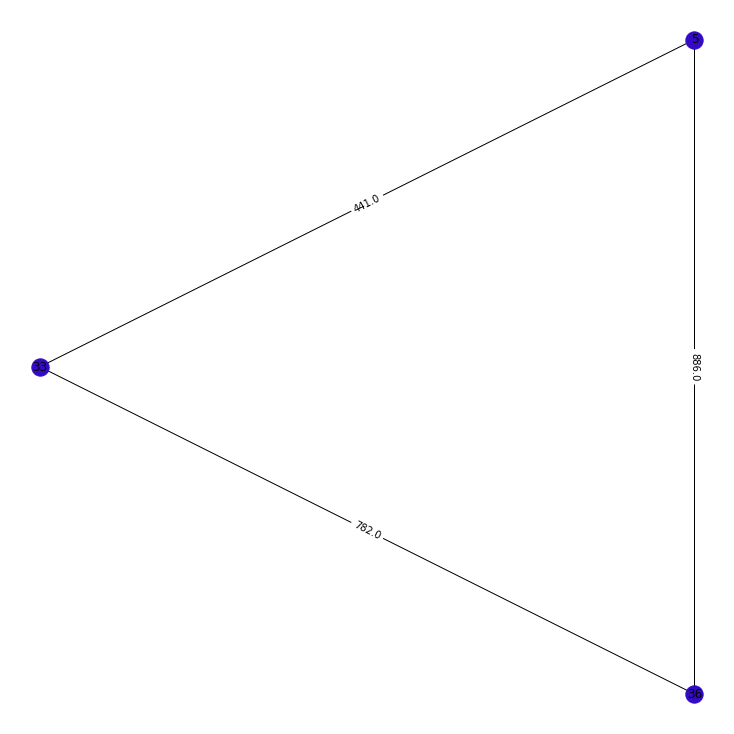

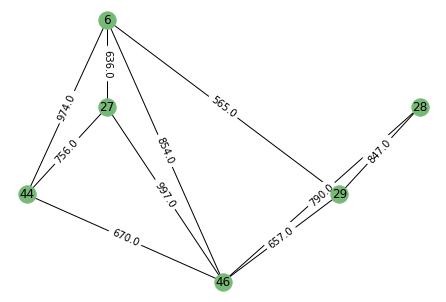

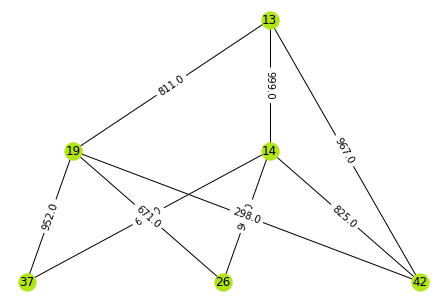

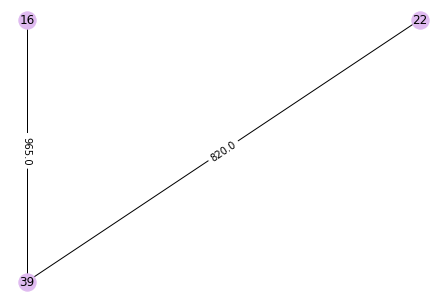

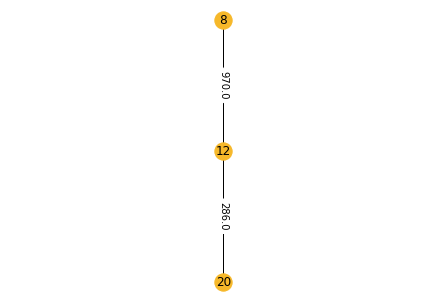

...

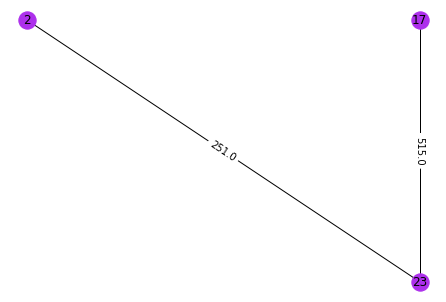

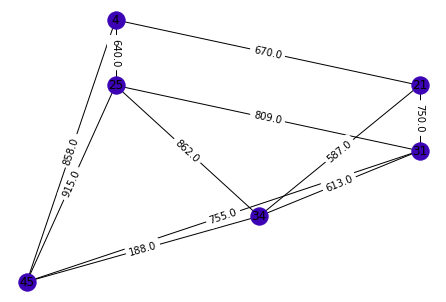

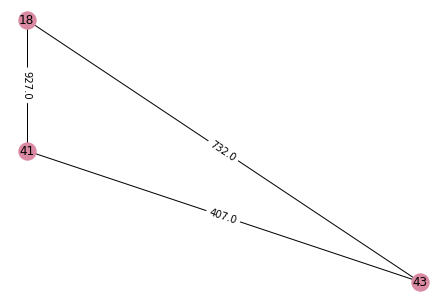

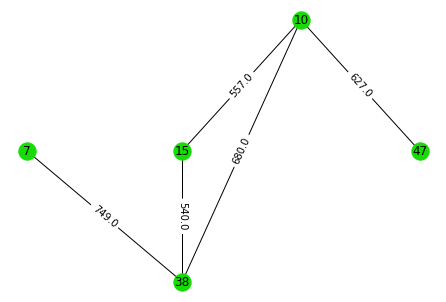

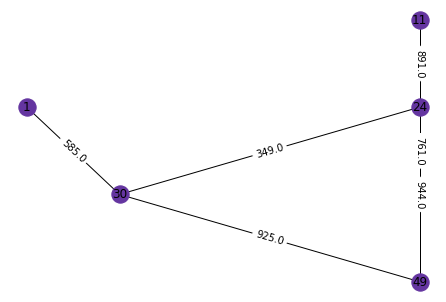

For k = 15
Clusters = [ 9  5  7  1 14  5 10 11  4 11 11  3  6  6 11  4  5  8  6  4  1  9  5  2
  1  8 10 13 13  3 13  7 14  1 12 14  0 11  9 12  8  6  8 10 13 10  2  7
  3  2]
Coditional Entropy = 0.506567048316984
F Measure = 0.38899470899470906
The internal traffic for cluster 1 = 0.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 0.0
The emulated traffic between cluster 1 and cluster 4 = 0.0
The emulated traffic between cluster 1 and cluster 5 = 0.0
The emulated traffic between cluster 1 and cluster 6 = 646.0
The emulated traffic between cluster 1 and cluster 7 = 1555.0
The emulated traffic between cluster 1 and cluster 8 = 72.0
The emulated traffic between cluster 1 and cluster 9 = 543.0
The emulated traffic between cluster 1 and cluster 10 = 750.0
The emulated traffic between cluster 1 and cluster 11 = 706.0
The emulated traffic between cluster 1 and cluster 12 = 0.0
The emulated traffic between cluster 1 and clust

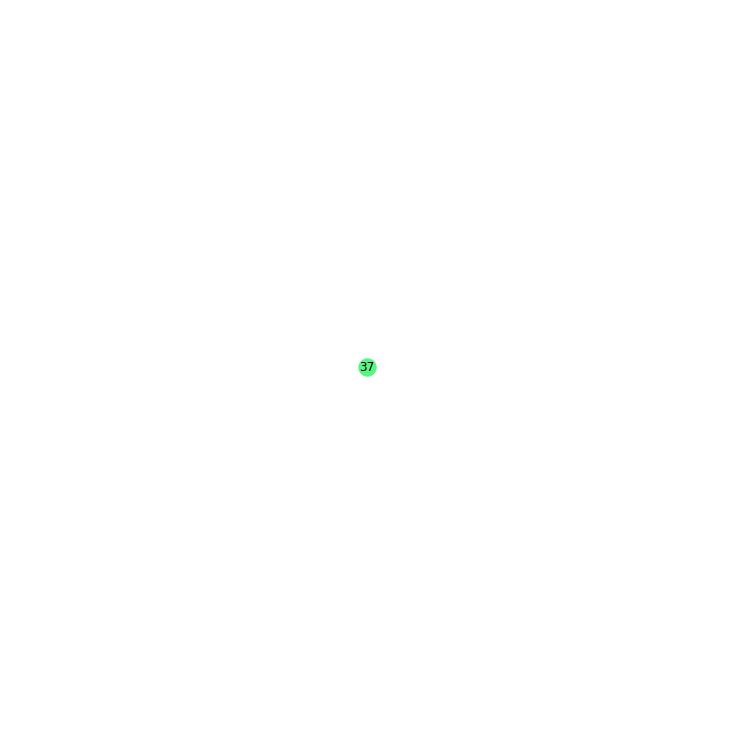

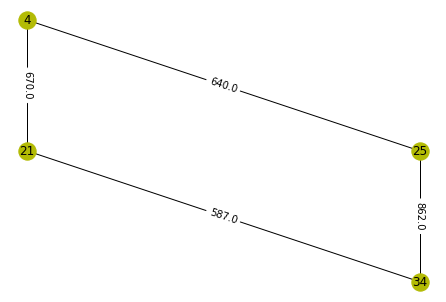

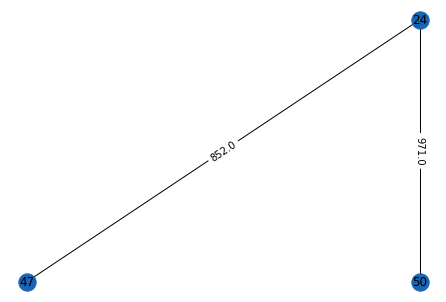

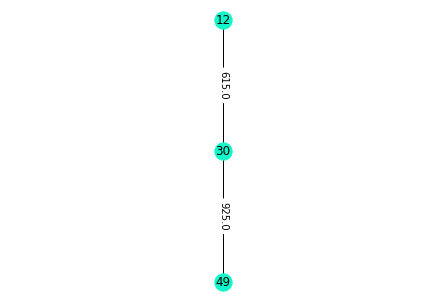

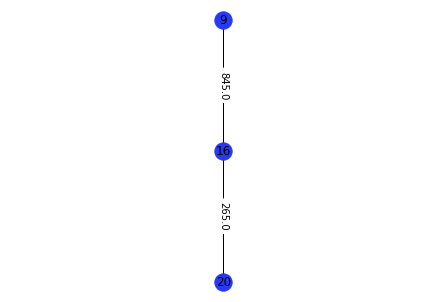

...

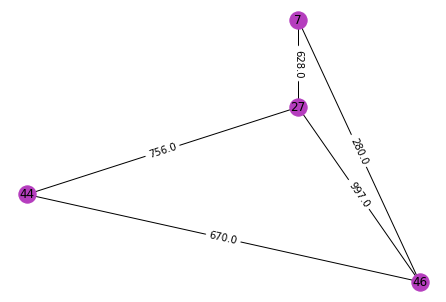

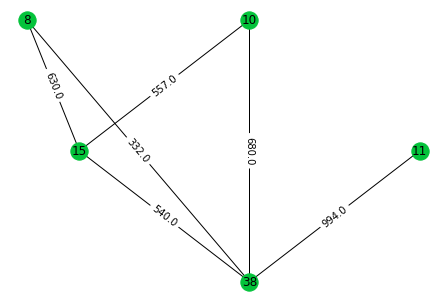

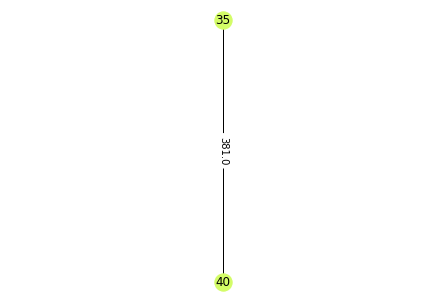

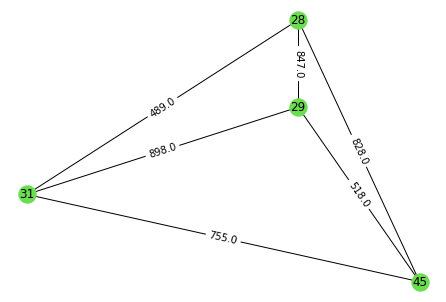

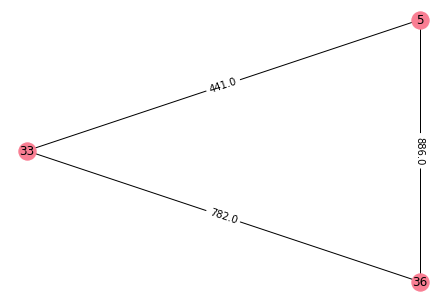

For k = 17
Clusters = [ 4  8 11  1  5  8  2 15 12 16  6 15  9  9  2 10  8 13  9 10  1  4  8 12
  5  1  3  4 14 15 14  7 16 14  0 16  4  2 10  0 13  9 13  3  4  3 11  7
  6 12]
Coditional Entropy = 0.4599956760743712
F Measure = 0.38963585434173675
The internal traffic for cluster 1 = 381.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 0.0
The emulated traffic between cluster 1 and cluster 4 = 446.0
The emulated traffic between cluster 1 and cluster 5 = 302.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The emulated traffic between cluster 1 and cluster 7 = 0.0
The emulated traffic between cluster 1 and cluster 8 = 0.0
The emulated traffic between cluster 1 and cluster 9 = 0.0
The emulated traffic between cluster 1 and cluster 10 = 0.0
The emulated traffic between cluster 1 and cluster 11 = 0.0
The emulated traffic between cluster 1 and cluster 12 = 236.0
The emulated traffic between cluster 1 and cluster 

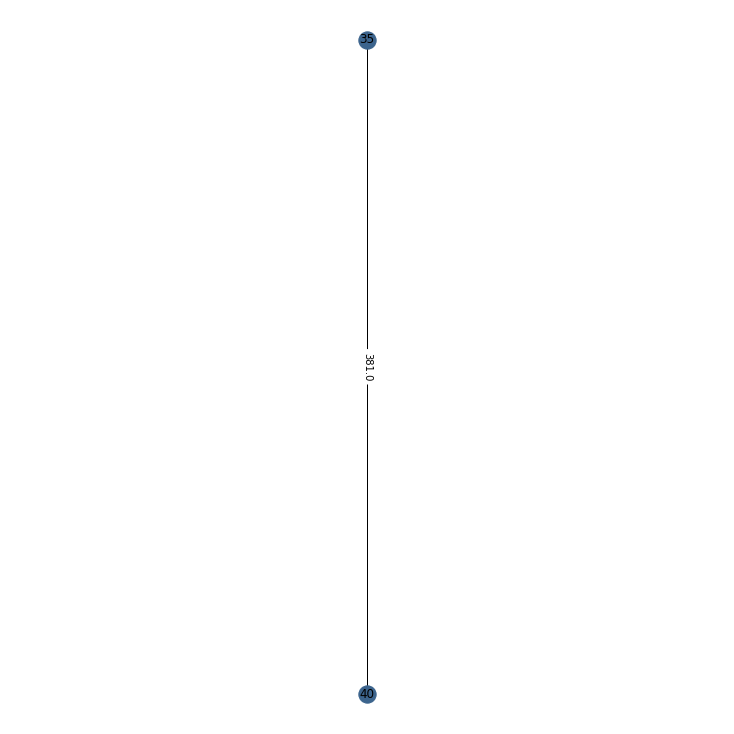

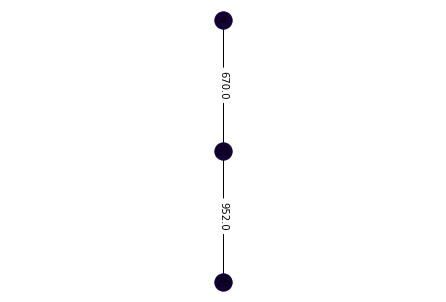

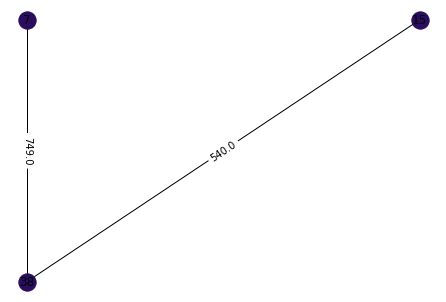

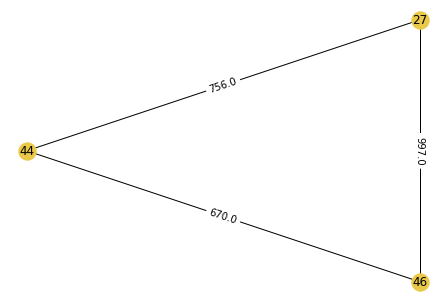

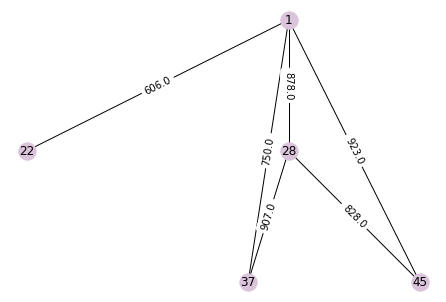

...

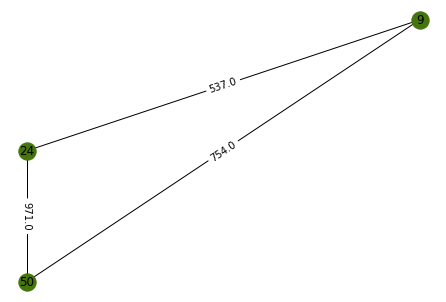

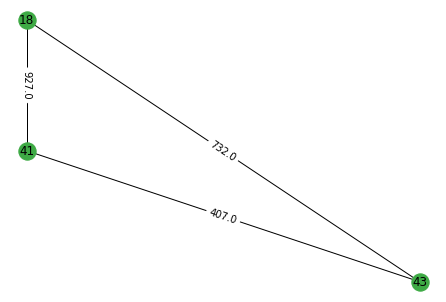

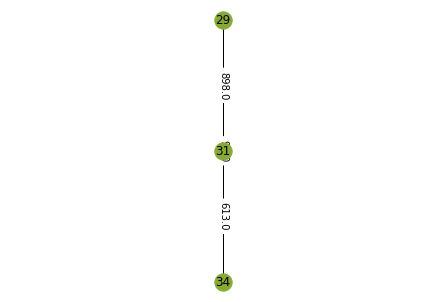

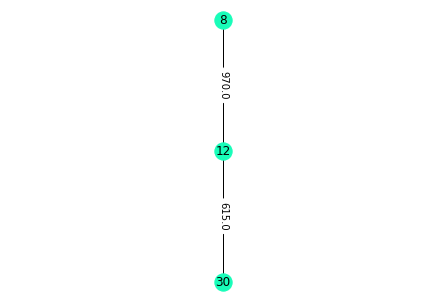

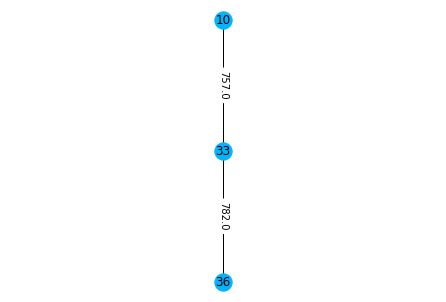

For k = 20
Clusters = [10  9  1 13  0  3 16 11  6  5  8 11  2  2  5  4  9  8 17  4  7 10  9  6
 13  7  3 15 15  8 19 18  0 13 14  0 17 16 10 14  4  2  8  3 19  3  5 18
 12  6]
Coditional Entropy = 0.39759499983726737
F Measure = 0.4133730158730159
The internal traffic for cluster 1 = 2109.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 1367.0
The emulated traffic between cluster 1 and cluster 4 = 350.0
The emulated traffic between cluster 1 and cluster 5 = 728.0
The emulated traffic between cluster 1 and cluster 6 = 1041.0
The emulated traffic between cluster 1 and cluster 7 = 1536.0
The emulated traffic between cluster 1 and cluster 8 = 144.0
The emulated traffic between cluster 1 and cluster 9 = 866.0
The emulated traffic between cluster 1 and cluster 10 = 741.0
The emulated traffic between cluster 1 and cluster 11 = 250.0
The emulated traffic between cluster 1 and cluster 12 = 683.0
The emulated traffic between clus

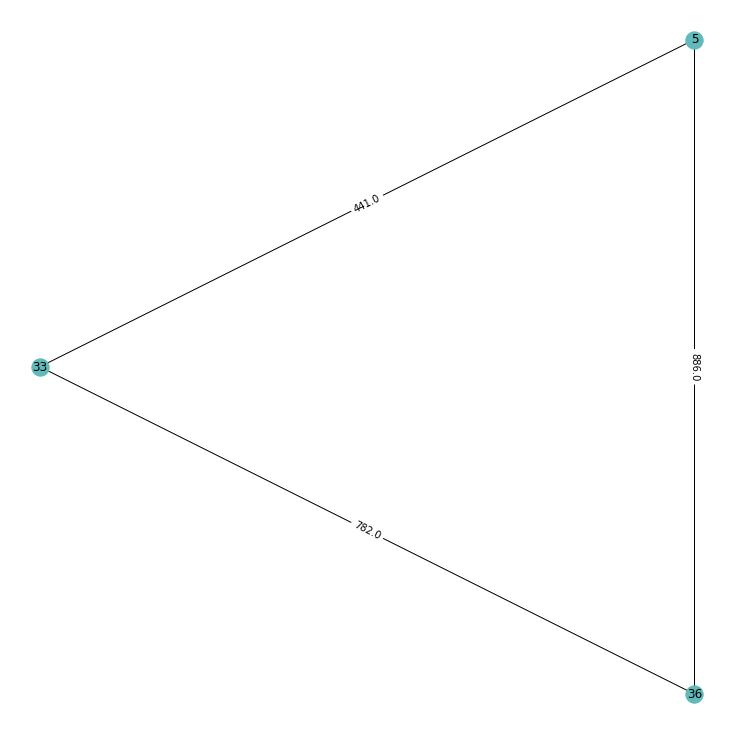

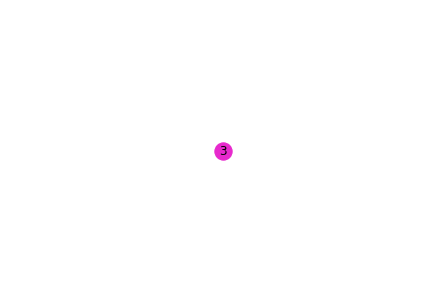

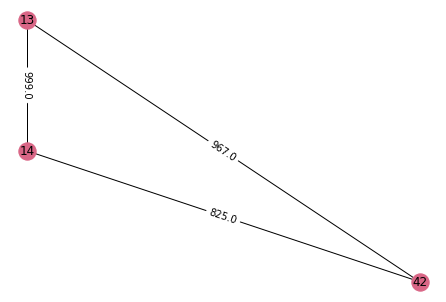

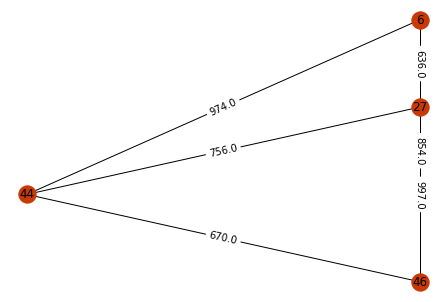

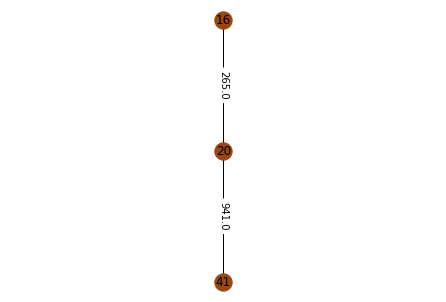

...

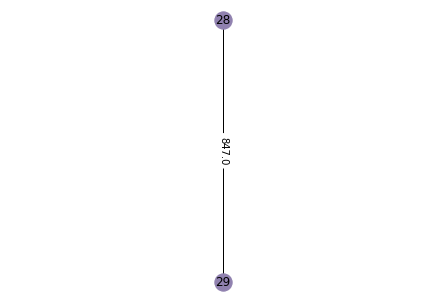

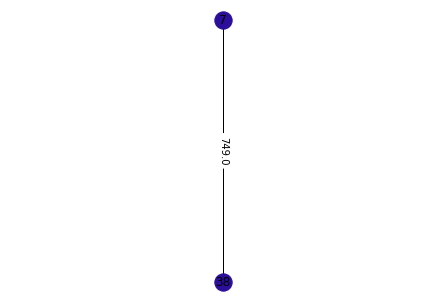

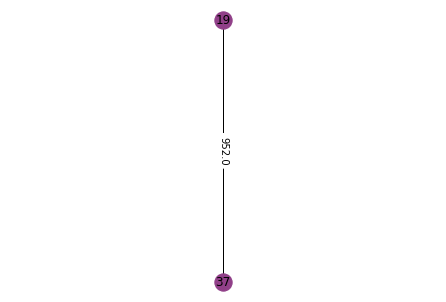

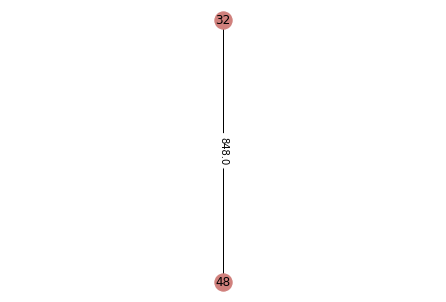

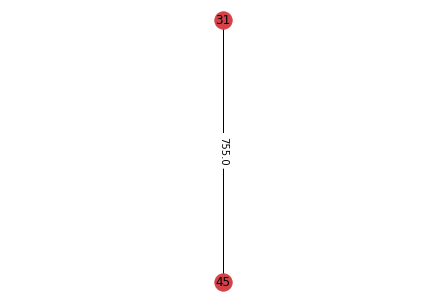

For k = 25
Clusters = [18 17 10  1  0 14 10 12  7 17  2 12 20  3 17  6  9  2  8 11  3 18  9  7
 21  3  5 19 19 24 21  4 23 21 13 23  8 10 16 13 11 20  2 14  1  5 22  4
 15  7]
Coditional Entropy = 0.30421684979123026
F Measure = 0.4274285714285715
The internal traffic for cluster 1 = 0.0
The emulated traffic between cluster 1 and cluster 2 = 20.0
The emulated traffic between cluster 1 and cluster 3 = 425.0
The emulated traffic between cluster 1 and cluster 4 = 144.0
The emulated traffic between cluster 1 and cluster 5 = 0.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The emulated traffic between cluster 1 and cluster 7 = 728.0
The emulated traffic between cluster 1 and cluster 8 = 0.0
The emulated traffic between cluster 1 and cluster 9 = 0.0
The emulated traffic between cluster 1 and cluster 10 = 0.0
The emulated traffic between cluster 1 and cluster 11 = 160.0
The emulated traffic between cluster 1 and cluster 12 = 0.0
The emulated traffic between cluster 1 and cluster

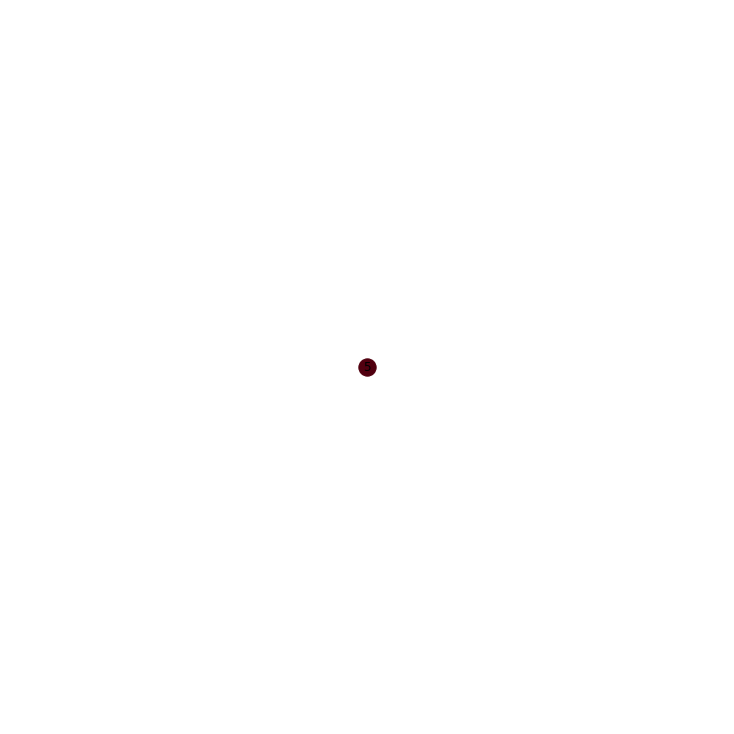

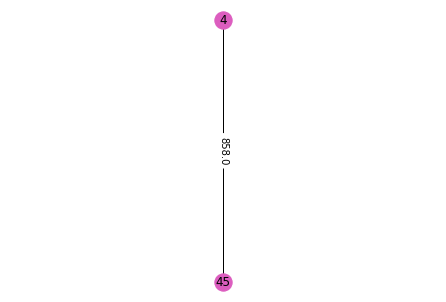

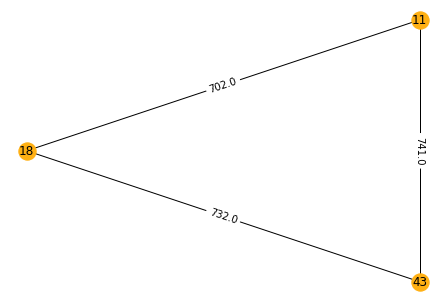

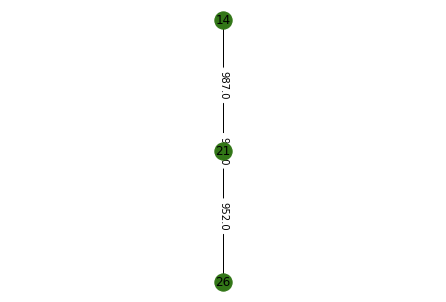

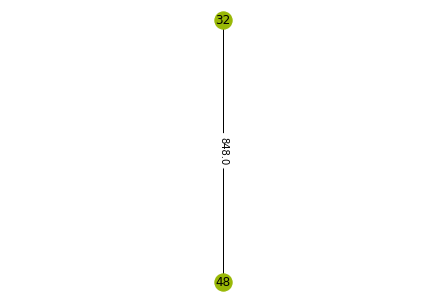

...

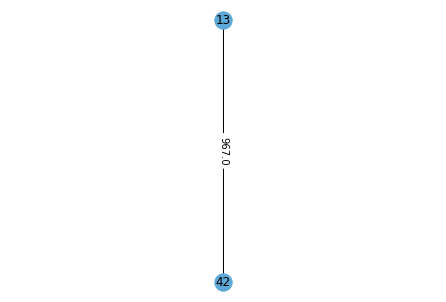

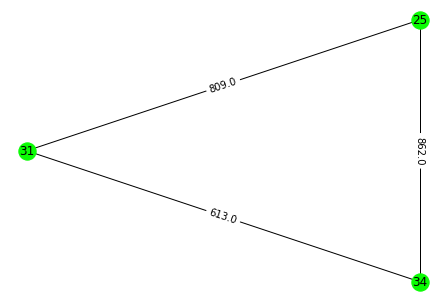

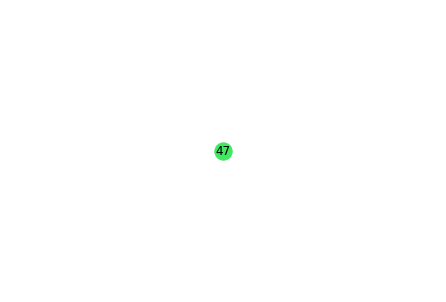

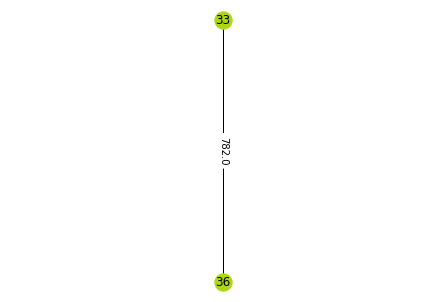

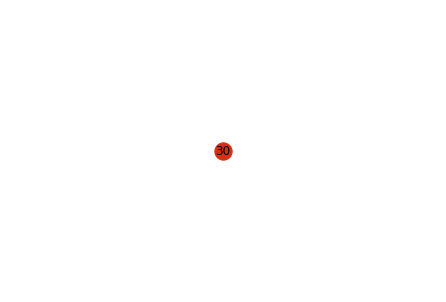

In [ ]:
#nodes = 50
# toplogy 6
example = examples[len(examples)-1-6]
gt = ground_truth_array[10+6]
print("Clusters for example 50_6")
for j in K_values_50:
  A = similarity_matrix(example)
  Y = Normalized_cut(A, j)
  cluster_matrix = get_traffic(Y, A)
  print("For k =",j)
  print("Clusters =",Y)
  print("Coditional Entropy =", conditional_entropy(Y, gt))
  print("F Measure =", f_measure(precision(Y, gt), recall(Y, gt)))
  for i in range(cluster_matrix.shape[0]):
    print("The internal traffic for cluster",i+1,"=",cluster_matrix[i,i])
    for k in range(cluster_matrix.shape[0]):
      if (i != k and k > i):
        print("The emulated traffic between cluster", i+1, "and cluster", k+1,"=",cluster_matrix[i][k])
  print("The graph after clustering:")
  visualize_topologies_afterClustering(example, Y)

Clusters for example 50_7
For k = 2
Clusters = [1 0 1 0 0 1 0 1 0 0 1 1 0 0 1 0 1 1 1 0 0 0 0 0 0 0 0 1 1 1 0 0 1 0 0 0 0
 0 0 0 0 1 1 0 0 1 0 0 0 0]
Coditional Entropy = 1.2399538361896294
F Measure = 0.1523809523809524
The internal traffic for cluster 1 = 66967.0
The emulated traffic between cluster 1 and cluster 2 = 34607.0
The internal traffic for cluster 2 = 23976.0
The graph after clustering:


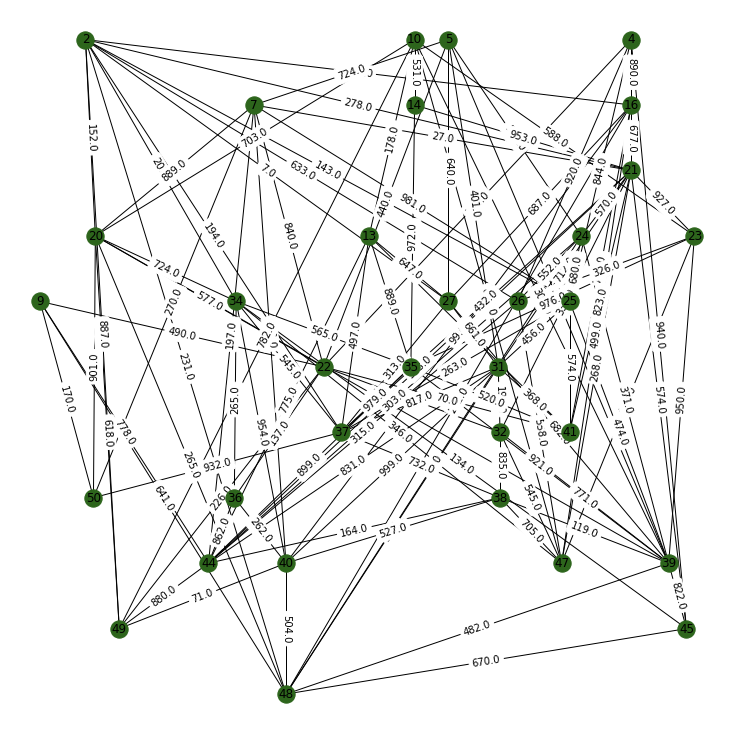

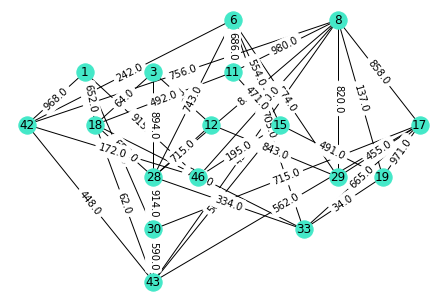

For k = 10
Clusters = [5 9 7 6 2 2 3 4 7 1 2 7 9 1 2 6 4 9 4 3 0 3 1 2 6 6 5 7 4 5 0 1 8 8 0 8 0
 0 2 8 0 5 9 9 6 5 1 2 9 3]
Coditional Entropy = 0.6592554249135874
F Measure = 0.3840476190476191
The internal traffic for cluster 1 = 5383.0
The emulated traffic between cluster 1 and cluster 2 = 6168.0
The emulated traffic between cluster 1 and cluster 3 = 2602.0
The emulated traffic between cluster 1 and cluster 4 = 1029.0
The emulated traffic between cluster 1 and cluster 5 = 2613.0
The emulated traffic between cluster 1 and cluster 6 = 2294.0
The emulated traffic between cluster 1 and cluster 7 = 3316.0
The emulated traffic between cluster 1 and cluster 8 = 534.0
The emulated traffic between cluster 1 and cluster 9 = 2940.0
The emulated traffic between cluster 1 and cluster 10 = 4351.0
The internal traffic for cluster 2 = 3158.0
The emulated traffic between cluster 2 and cluster 3 = 3234.0
The emulated traffic between cluster 2 and cluster 4 = 1686.0
The emulated traffic between clust

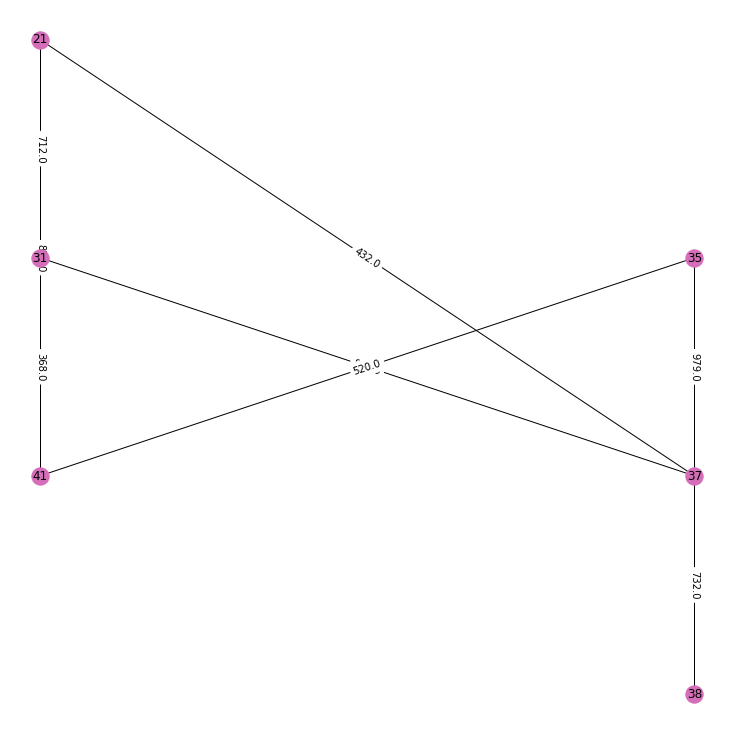

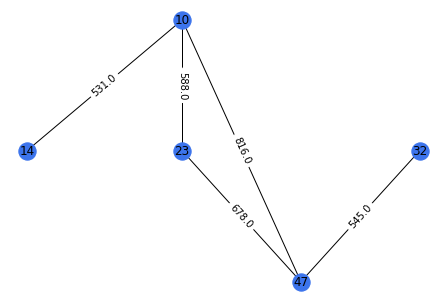

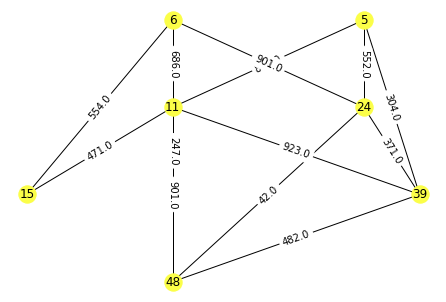

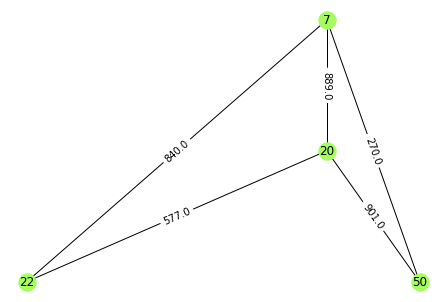

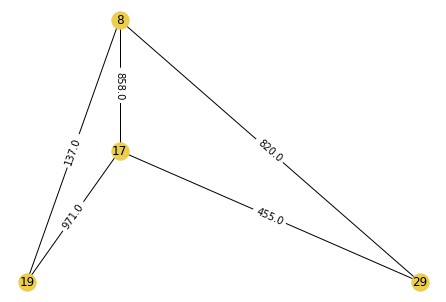

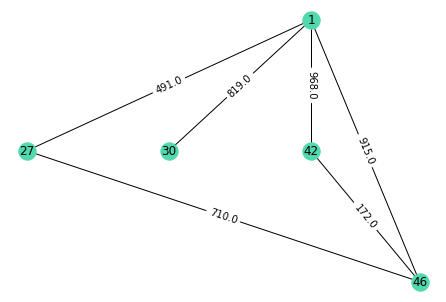

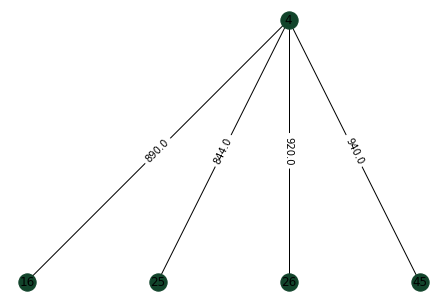

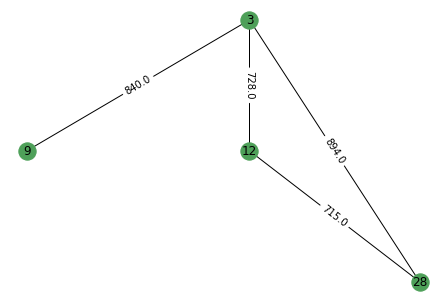

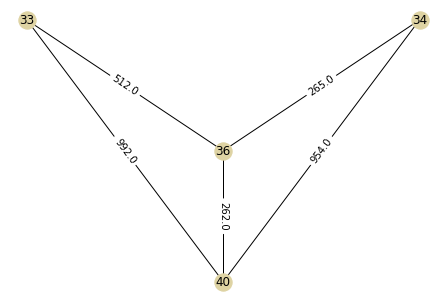

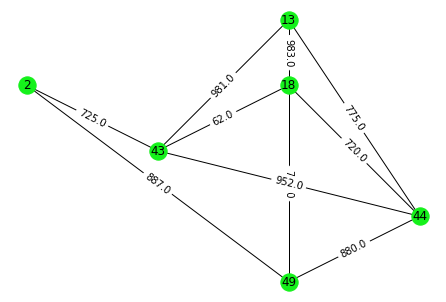

For k = 12
Clusters = [ 7  0 11  0  9  9  2  4  7 10  3  4  5 10  5  1  8  5  8  2  1  2 10  9
  9  0  7 11  4 11  1 10  6  6  1  6  1 10  3  6  1  7  8  5  3  7 10  3
  0  2]
Coditional Entropy = 0.6074415225595189
F Measure = 0.3742063492063492
The internal traffic for cluster 1 = 2440.0
The emulated traffic between cluster 1 and cluster 2 = 1759.0
The emulated traffic between cluster 1 and cluster 3 = 1777.0
The emulated traffic between cluster 1 and cluster 4 = 1407.0
The emulated traffic between cluster 1 and cluster 5 = 609.0
The emulated traffic between cluster 1 and cluster 6 = 1904.0
The emulated traffic between cluster 1 and cluster 7 = 278.0
The emulated traffic between cluster 1 and cluster 8 = 443.0
The emulated traffic between cluster 1 and cluster 9 = 1244.0
The emulated traffic between cluster 1 and cluster 10 = 1539.0
The emulated traffic between cluster 1 and cluster 11 = 1666.0
The emulated traffic between cluster 1 and cluster 12 = 0.0
The internal traffic for clust

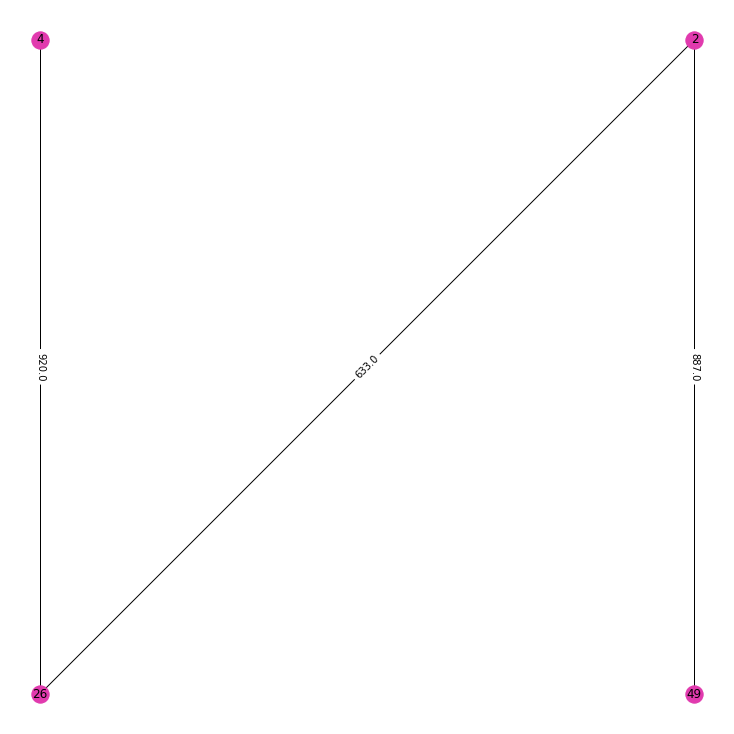

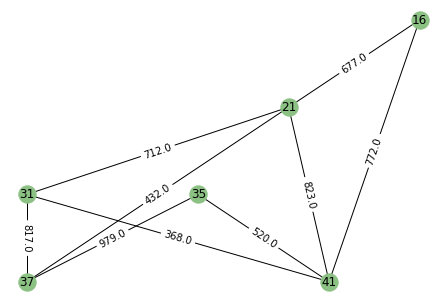

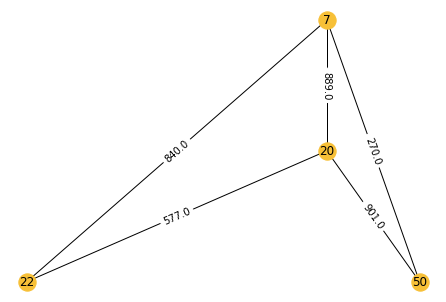

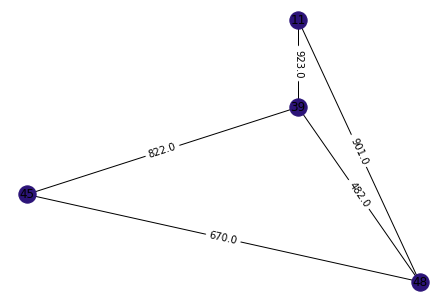

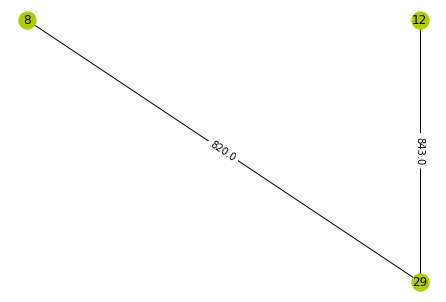

...

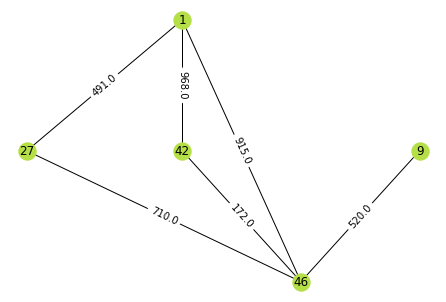

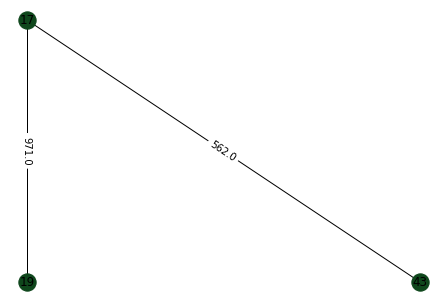

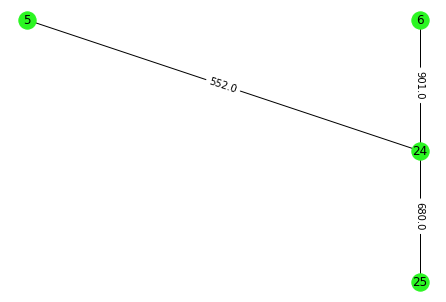

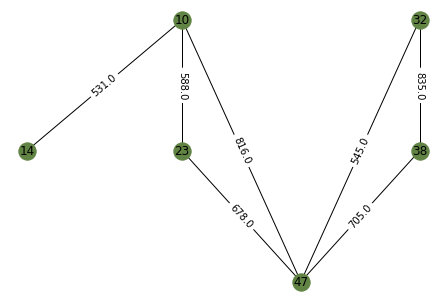

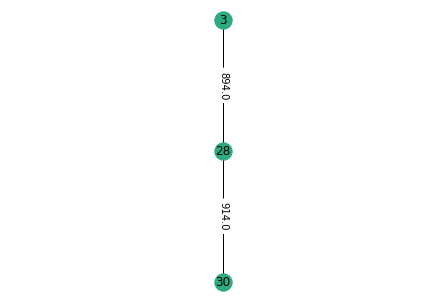

For k = 15
Clusters = [12  7  6  7  3  3  3  1  6  2  5  6 11  8 11  0 13  2 13 10  0 14  2  3
  3  7  0  6  1 12  0 14  4  4  8  4 10 14  5  4  0 12  9  9  5 12  2  5
  2 10]
Coditional Entropy = 0.5123144240284117
F Measure = 0.4196825396825397
The internal traffic for cluster 1 = 4700.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 2115.0
The emulated traffic between cluster 1 and cluster 4 = 2668.0
The emulated traffic between cluster 1 and cluster 5 = 1402.0
The emulated traffic between cluster 1 and cluster 6 = 2251.0
The emulated traffic between cluster 1 and cluster 7 = 534.0
The emulated traffic between cluster 1 and cluster 8 = 1572.0
The emulated traffic between cluster 1 and cluster 9 = 1473.0
The emulated traffic between cluster 1 and cluster 10 = 1224.0
The emulated traffic between cluster 1 and cluster 11 = 1562.0
The emulated traffic between cluster 1 and cluster 12 = 853.0
The emulated traffic between 

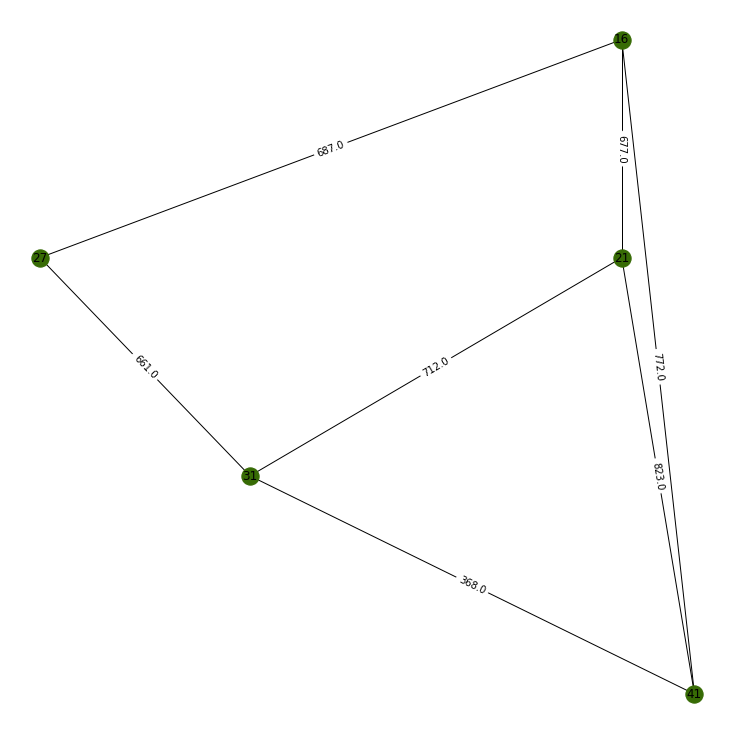

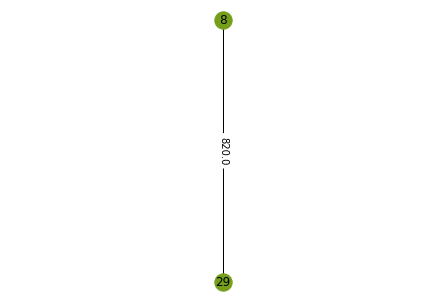

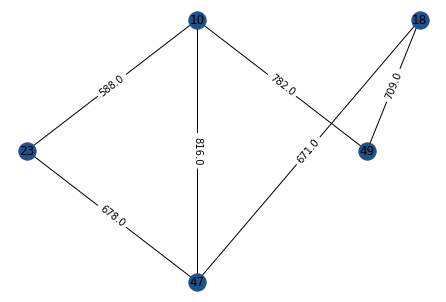

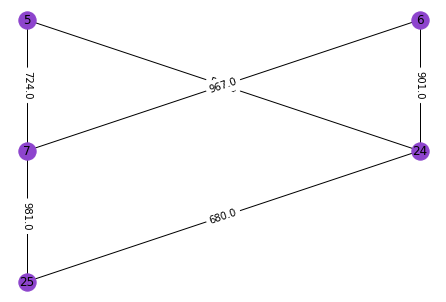

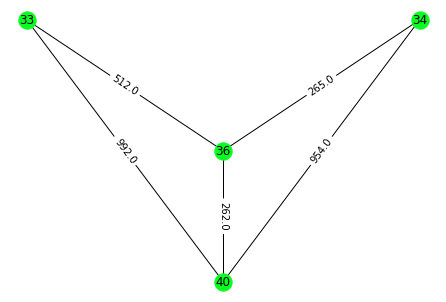

...

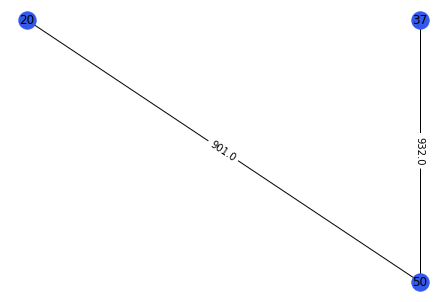

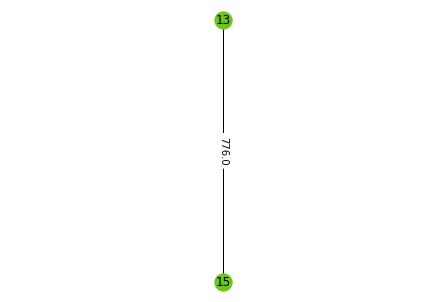

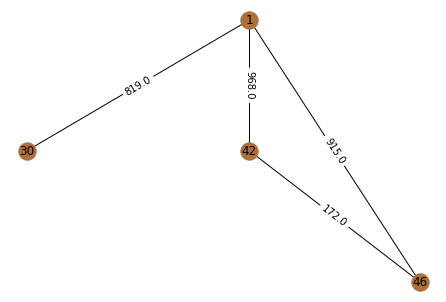

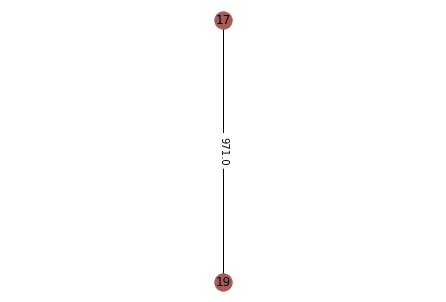

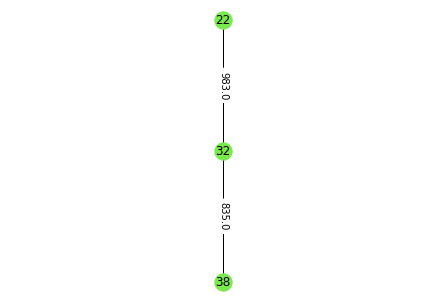

For k = 17
Clusters = [ 4  6  3  6 11 12  2  4  3  5  1 14 12 10 12  8  9  0  9 16 11 13  5  6
  2  6  8 15 14 15 11 13  7  7 10  7 10 13  1  7 11  4 10  0  1  4  5  1
  0 16]
Coditional Entropy = 0.47574509592949654
F Measure = 0.41204481792717085
The internal traffic for cluster 1 = 2309.0
The emulated traffic between cluster 1 and cluster 2 = 728.0
The emulated traffic between cluster 1 and cluster 3 = 197.0
The emulated traffic between cluster 1 and cluster 4 = 842.0
The emulated traffic between cluster 1 and cluster 5 = 652.0
The emulated traffic between cluster 1 and cluster 6 = 1453.0
The emulated traffic between cluster 1 and cluster 7 = 1505.0
The emulated traffic between cluster 1 and cluster 8 = 1708.0
The emulated traffic between cluster 1 and cluster 9 = 421.0
The emulated traffic between cluster 1 and cluster 10 = 572.0
The emulated traffic between cluster 1 and cluster 11 = 1913.0
The emulated traffic between cluster 1 and cluster 12 = 1224.0
The emulated traffic between

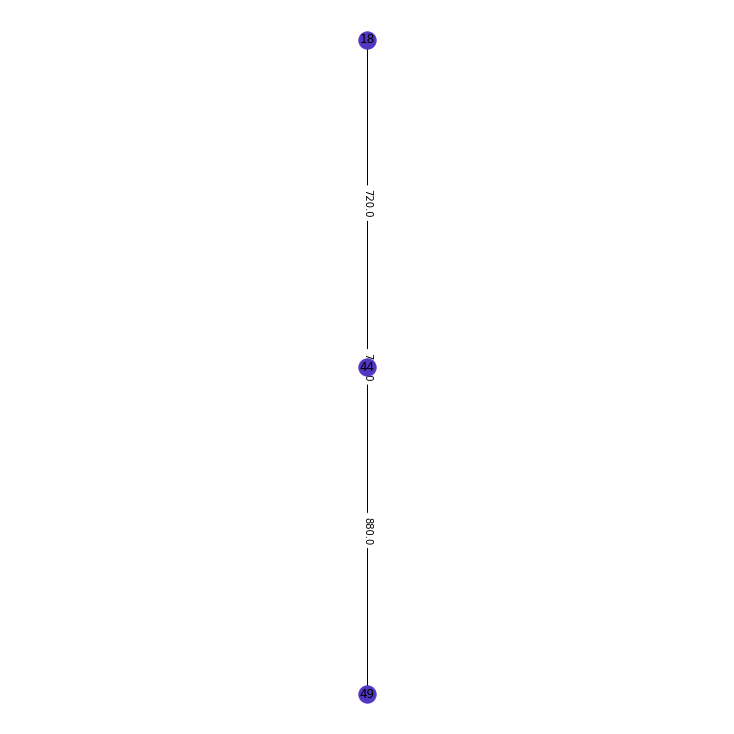

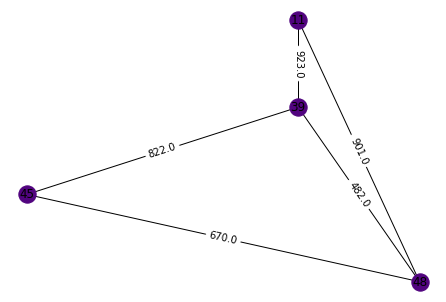

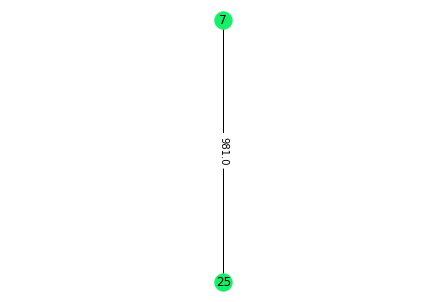

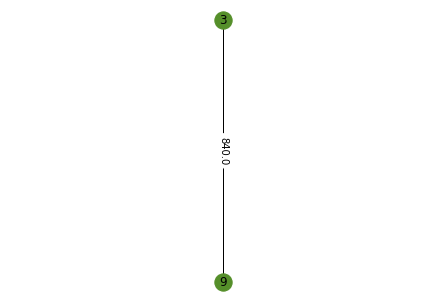

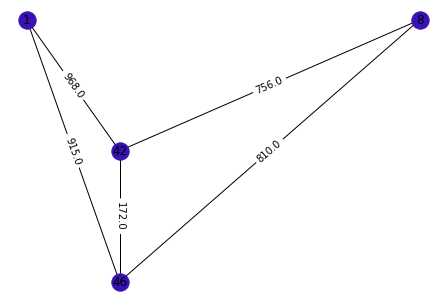

...

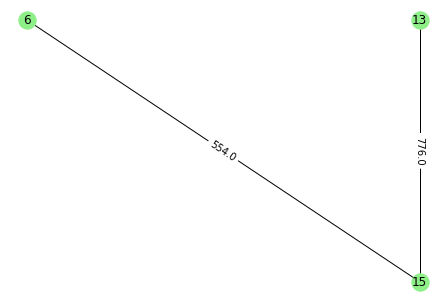

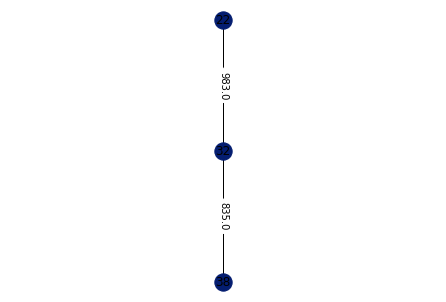

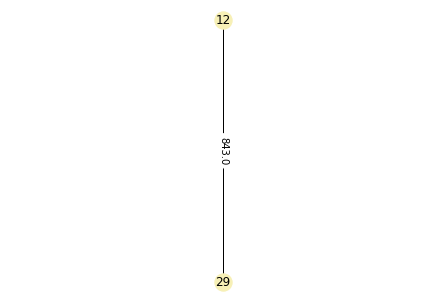

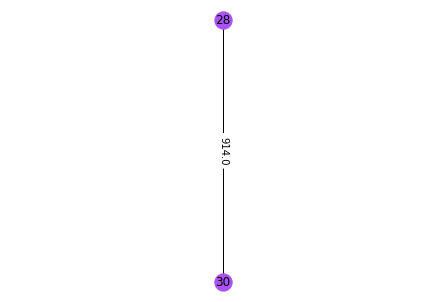

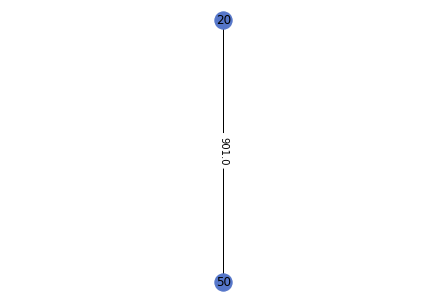

For k = 20
Clusters = [19  1  5  7 11 15  7  3  5  2 10  6 15  2 15 16 13  0 13  4 18  9  2 11
  7  1 11  6  3 14 18  9  0  8  2  0  4  9 17  8 16 19 14 14 17 19 12 10
  1  4]
Coditional Entropy = 0.4021398754673286
F Measure = 0.43619047619047624
The internal traffic for cluster 1 = 1287.0
The emulated traffic between cluster 1 and cluster 2 = 709.0
The emulated traffic between cluster 1 and cluster 3 = 0.0
The emulated traffic between cluster 1 and cluster 4 = 0.0
The emulated traffic between cluster 1 and cluster 5 = 64.0
The emulated traffic between cluster 1 and cluster 6 = 64.0
The emulated traffic between cluster 1 and cluster 7 = 990.0
The emulated traffic between cluster 1 and cluster 8 = 0.0
The emulated traffic between cluster 1 and cluster 9 = 1519.0
The emulated traffic between cluster 1 and cluster 10 = 137.0
The emulated traffic between cluster 1 and cluster 11 = 492.0
The emulated traffic between cluster 1 and cluster 12 = 0.0
The emulated traffic between cluster 1 and 

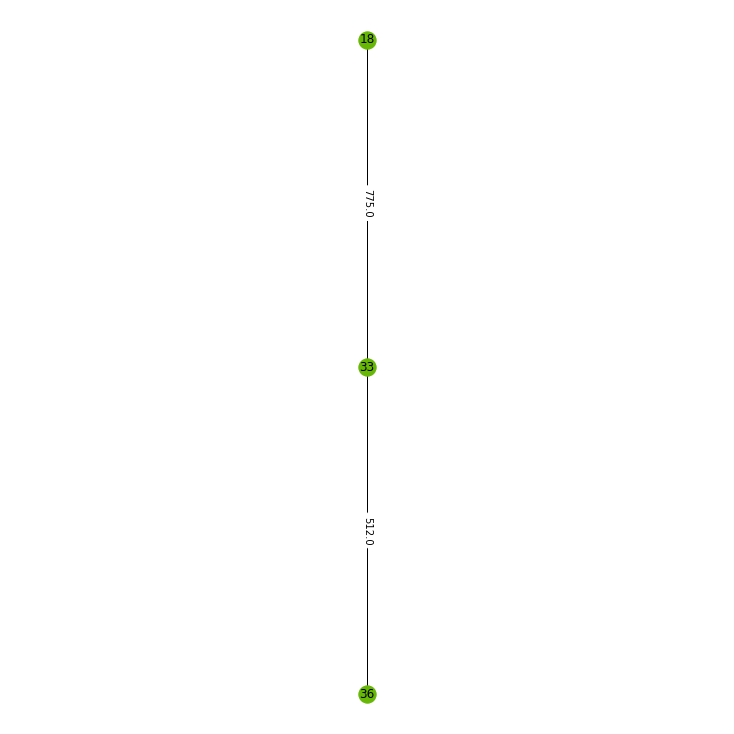

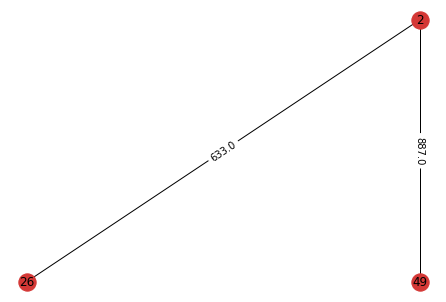

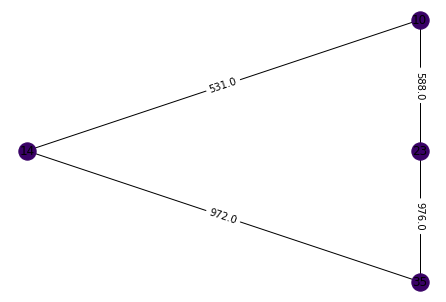

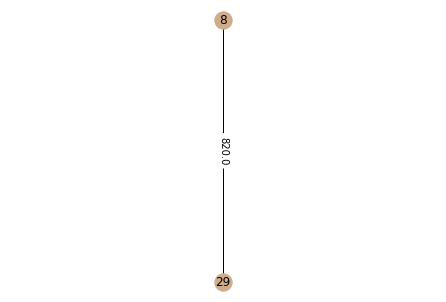

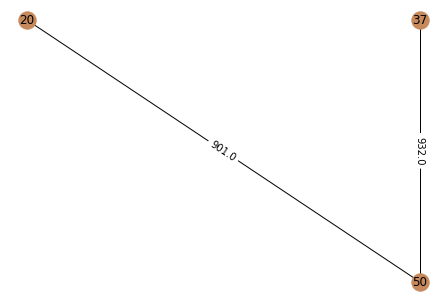

...

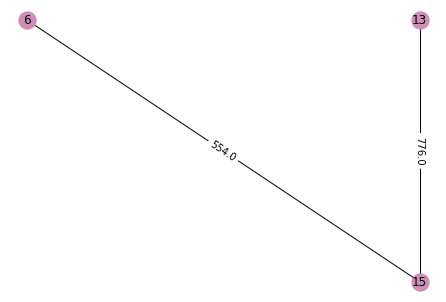

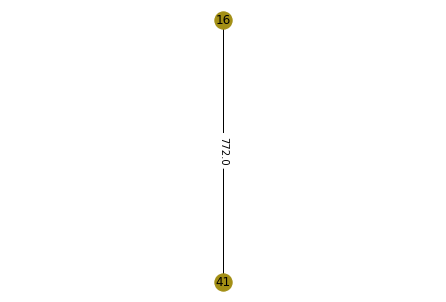

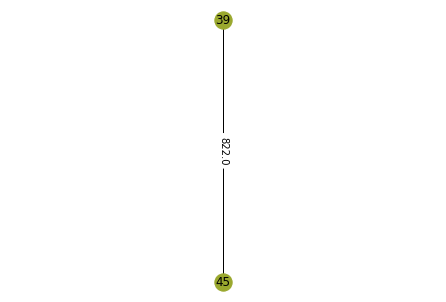

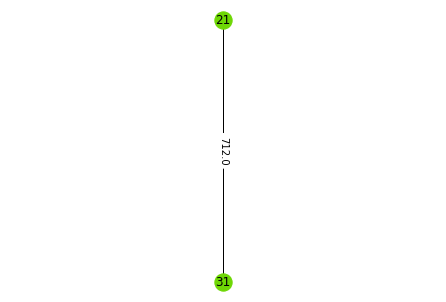

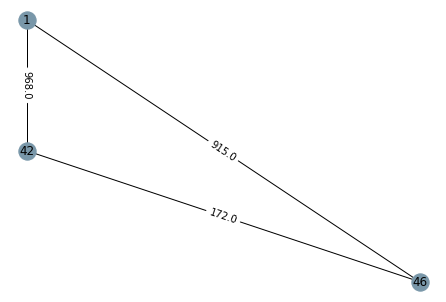

For k = 25
Clusters = [ 7 22 17  3  8 16 12  4 17 10  8 17 19 10 19  1 11 22 11  2 13 18 15 16
 12  3 14 20  4 20 13  6  9 24 15  9 21  6 15 23  1  7 10  5  0 14  6  8
 22 21]
Coditional Entropy = 0.32829924944434874
F Measure = 0.5034285714285714
The internal traffic for cluster 1 = 0.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 0.0
The emulated traffic between cluster 1 and cluster 4 = 940.0
The emulated traffic between cluster 1 and cluster 5 = 0.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The emulated traffic between cluster 1 and cluster 7 = 0.0
The emulated traffic between cluster 1 and cluster 8 = 0.0
The emulated traffic between cluster 1 and cluster 9 = 670.0
The emulated traffic between cluster 1 and cluster 10 = 0.0
The emulated traffic between cluster 1 and cluster 11 = 0.0
The emulated traffic between cluster 1 and cluster 12 = 297.0
The emulated traffic between cluster 1 and cluster 13

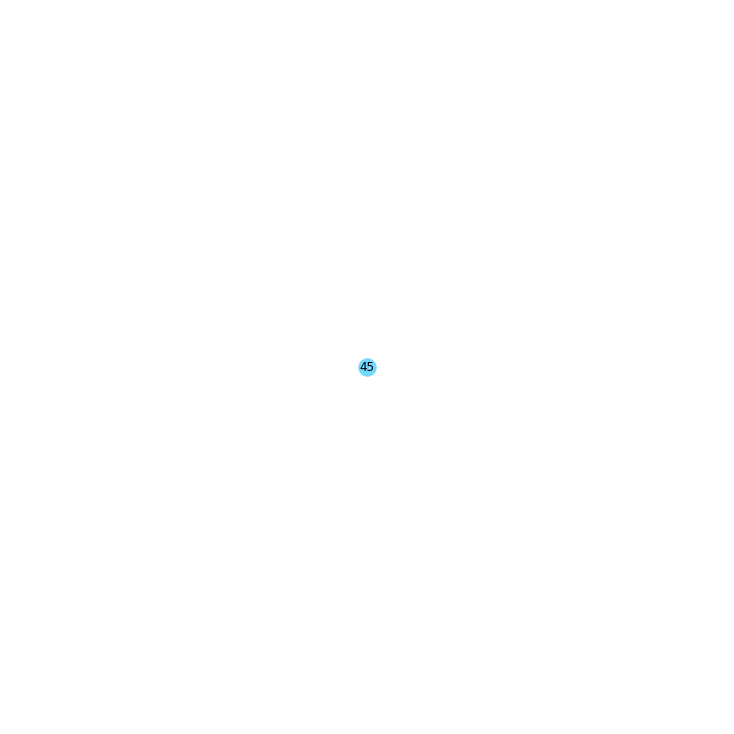

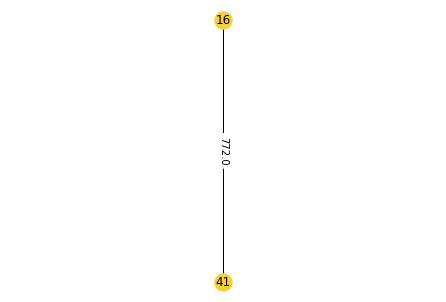

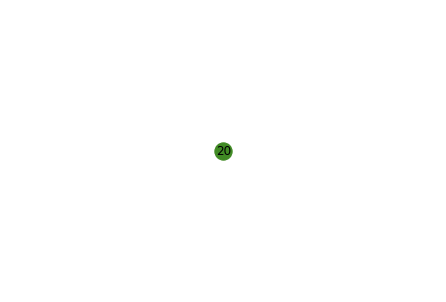

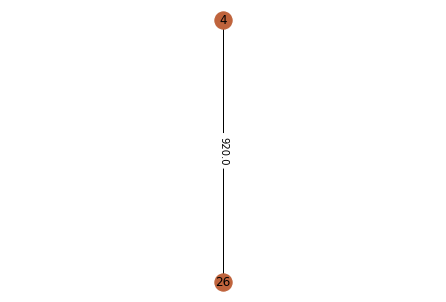

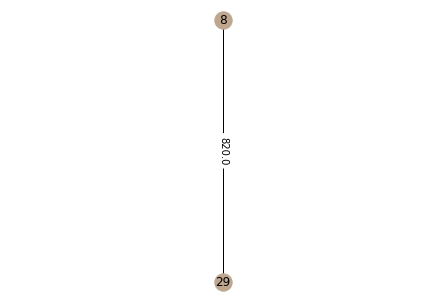

...

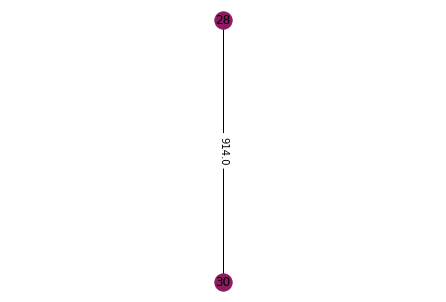

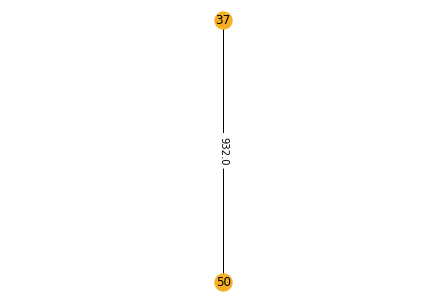

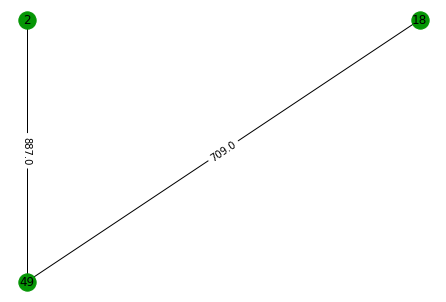

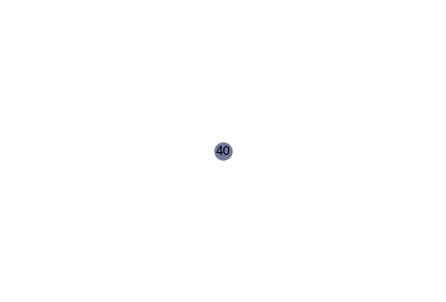

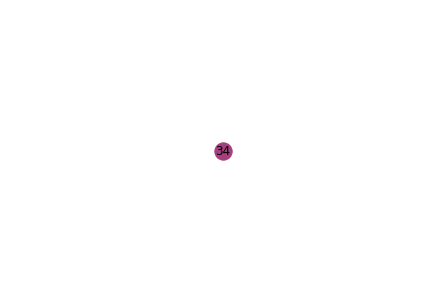

In [ ]:
#nodes = 50
# toplogy 7
example = examples[len(examples)-1-7]
gt = ground_truth_array[10+7]
print("Clusters for example 50_7")
for j in K_values_50:
  A = similarity_matrix(example)
  Y = Normalized_cut(A, j)
  cluster_matrix = get_traffic(Y, A)
  print("For k =",j)
  print("Clusters =",Y)
  print("Coditional Entropy =", conditional_entropy(Y, gt))
  print("F Measure =", f_measure(precision(Y, gt), recall(Y, gt)))
  for i in range(cluster_matrix.shape[0]):
    print("The internal traffic for cluster",i+1,"=",cluster_matrix[i,i])
    for k in range(cluster_matrix.shape[0]):
      if (i != k and k > i):
        print("The emulated traffic between cluster", i+1, "and cluster", k+1,"=",cluster_matrix[i][k])
  print("The graph after clustering:")
  visualize_topologies_afterClustering(example, Y)

Clusters for example 50_8
For k = 2
Clusters = [1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0]
Coditional Entropy = 1.0151772349145003
F Measure = 0.27575757575757576
The internal traffic for cluster 1 = 52994.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The internal traffic for cluster 2 = 0.0
The graph after clustering:


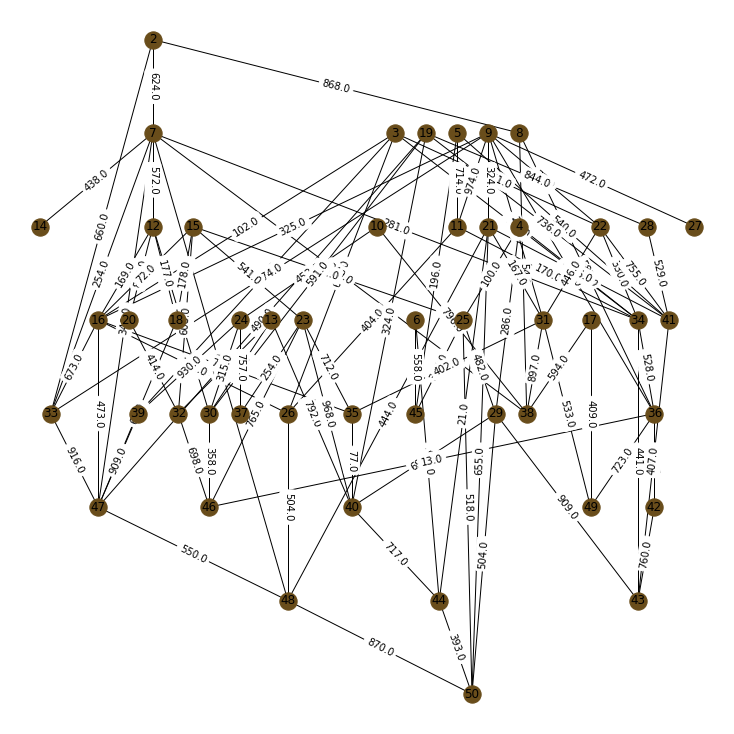

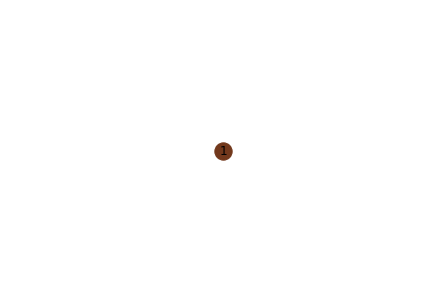

For k = 10
Clusters = [8 6 1 3 1 7 6 4 9 5 1 2 2 6 2 1 4 0 1 2 1 1 2 5 3 1 9 1 3 2 4 2 1 3 2 4 5
 4 5 2 1 3 3 7 7 2 1 1 4 3]
Coditional Entropy = 0.6938208230513131
F Measure = 0.3276251234145971
The internal traffic for cluster 1 = 0.0
The emulated traffic between cluster 1 and cluster 2 = 63.0
The emulated traffic between cluster 1 and cluster 3 = 355.0
The emulated traffic between cluster 1 and cluster 4 = 0.0
The emulated traffic between cluster 1 and cluster 5 = 0.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The emulated traffic between cluster 1 and cluster 7 = 0.0
The emulated traffic between cluster 1 and cluster 8 = 0.0
The emulated traffic between cluster 1 and cluster 9 = 0.0
The emulated traffic between cluster 1 and cluster 10 = 0.0
The internal traffic for cluster 2 = 11624.0
The emulated traffic between cluster 2 and cluster 3 = 1865.0
The emulated traffic between cluster 2 and cluster 4 = 3041.0
The emulated traffic between cluster 2 and cluster 5 = 613.

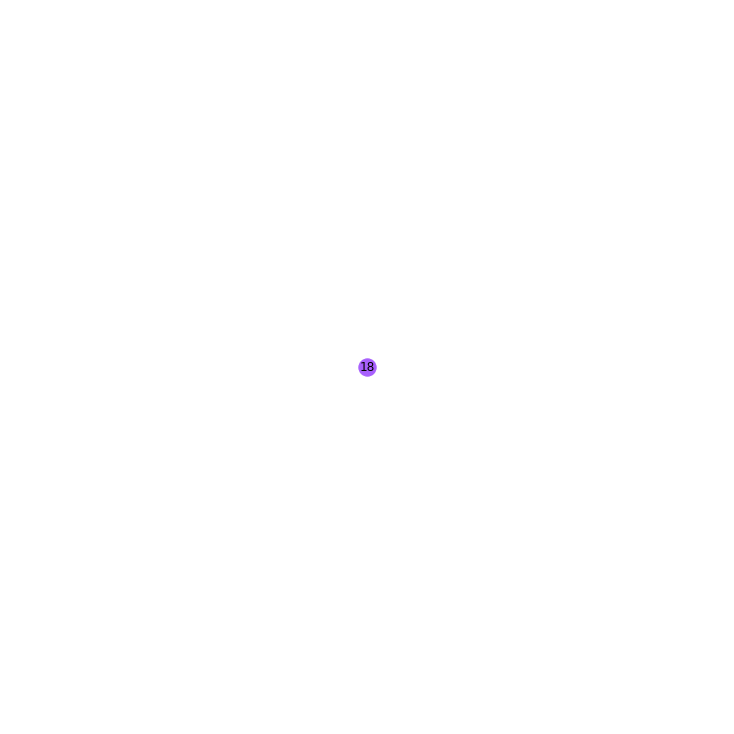

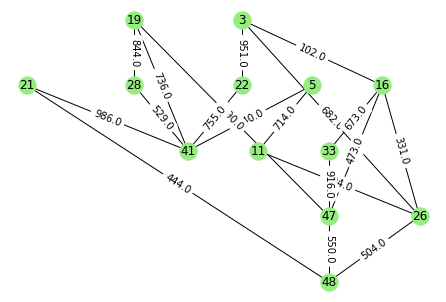

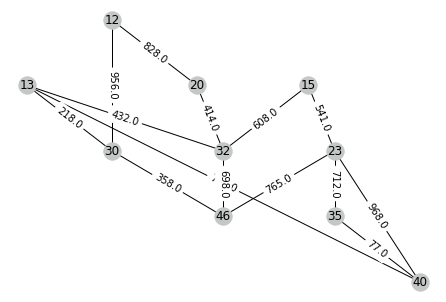

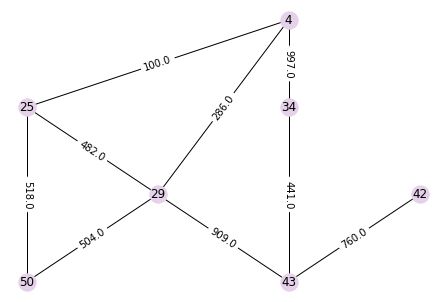

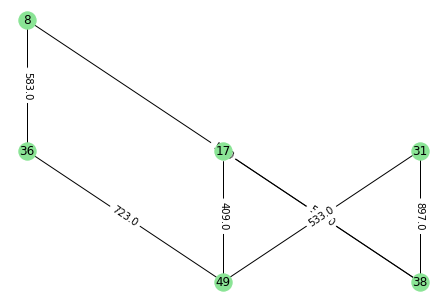

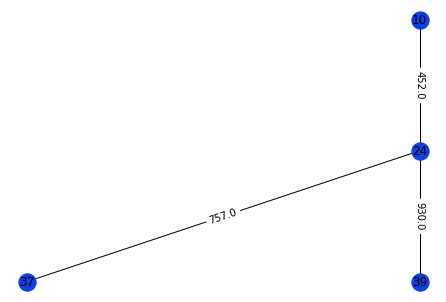

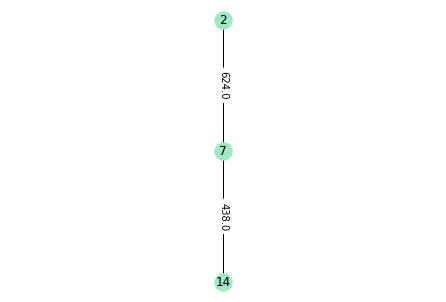

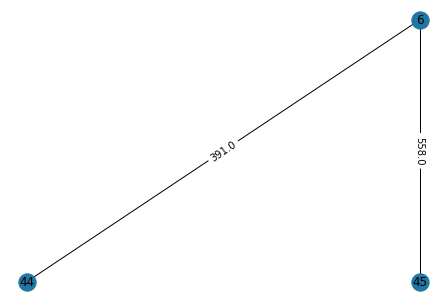

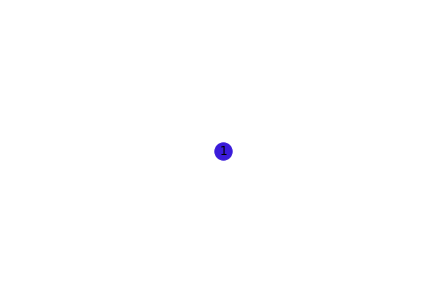

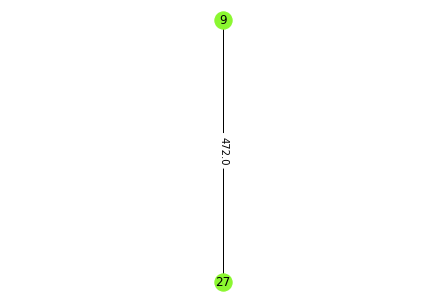

For k = 12
Clusters = [11 10  9  3  0  6  4 10  8  5  9  7  1  4  1  9  2  7  0  7  0  0  1  5
  6  9  8  0  3  7  2  1 10  3  1 10  5  2  5  1  0  3  3  6  6  1  9  9
  2  6]
Coditional Entropy = 0.6134408241331037
F Measure = 0.2875180375180375
The internal traffic for cluster 1 = 4390.0
The emulated traffic between cluster 1 and cluster 2 = 324.0
The emulated traffic between cluster 1 and cluster 3 = 613.0
The emulated traffic between cluster 1 and cluster 4 = 737.0
The emulated traffic between cluster 1 and cluster 5 = 0.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The emulated traffic between cluster 1 and cluster 7 = 872.0
The emulated traffic between cluster 1 and cluster 8 = 591.0
The emulated traffic between cluster 1 and cluster 9 = 401.0
The emulated traffic between cluster 1 and cluster 10 = 2599.0
The emulated traffic between cluster 1 and cluster 11 = 0.0
The emulated traffic between cluster 1 and cluster 12 = 0.0
The internal traffic for cluster 2 = 5593.

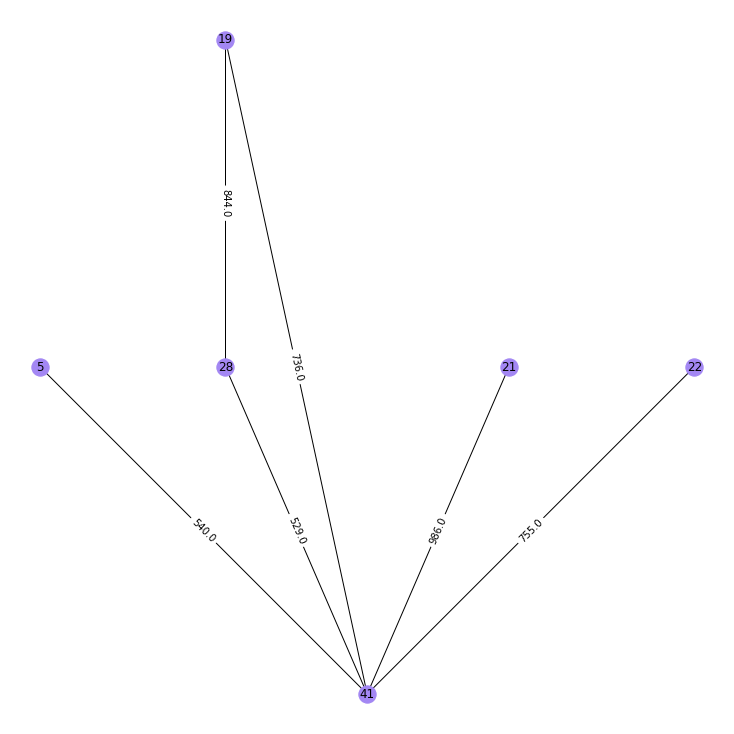

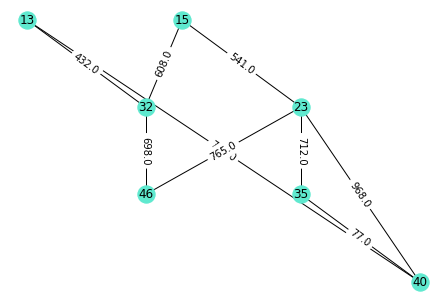

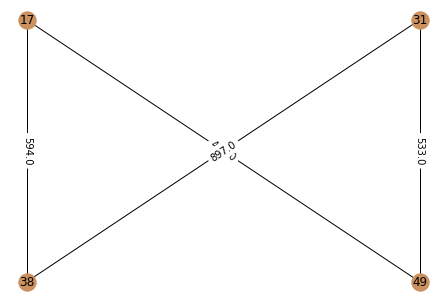

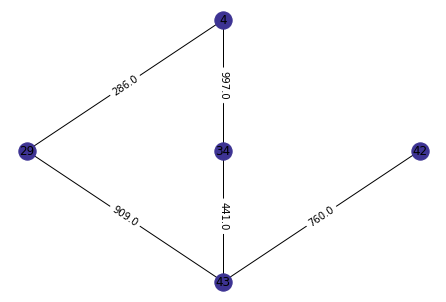

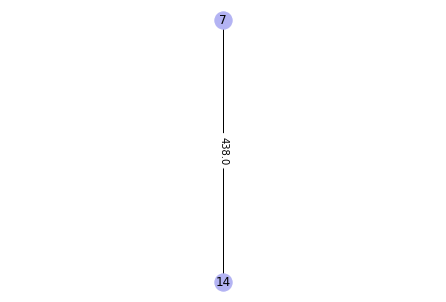

...

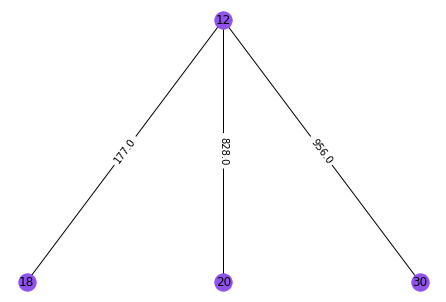

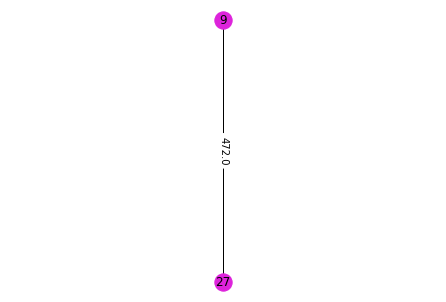

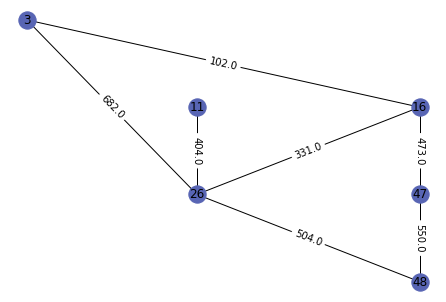

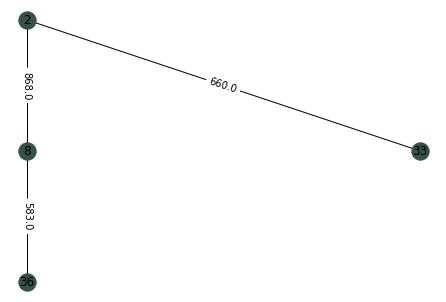

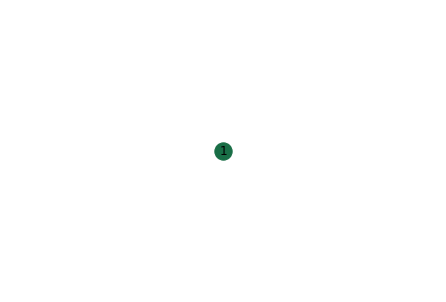

For k = 15
Clusters = [ 7  7  3  3  0 11  7  7  0  9  0  6  5 14  5  2  8  4 13  6  2  3  5  9
  1  2 12 13  1  6  8  5  7  3  5 10  9  8  9  5 13 10 10  1 11  5  2  2
  8  1]
Coditional Entropy = 0.5171112255206298
F Measure = 0.31826358826358825
The internal traffic for cluster 1 = 1688.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 1053.0
The emulated traffic between cluster 1 and cluster 4 = 247.0
The emulated traffic between cluster 1 and cluster 5 = 0.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The emulated traffic between cluster 1 and cluster 7 = 0.0
The emulated traffic between cluster 1 and cluster 8 = 374.0
The emulated traffic between cluster 1 and cluster 9 = 23.0
The emulated traffic between cluster 1 and cluster 10 = 0.0
The emulated traffic between cluster 1 and cluster 11 = 594.0
The emulated traffic between cluster 1 and cluster 12 = 196.0
The emulated traffic between cluster 1 and c

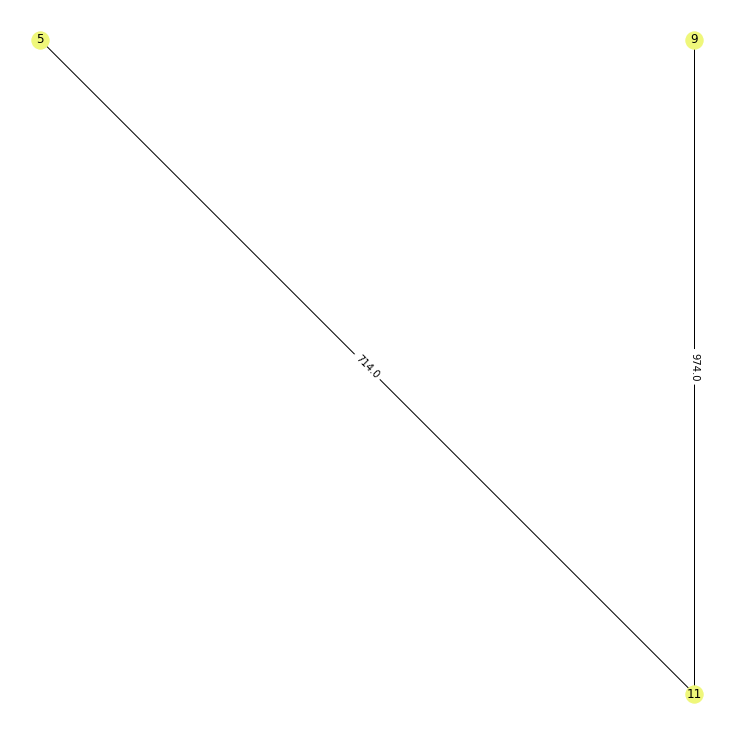

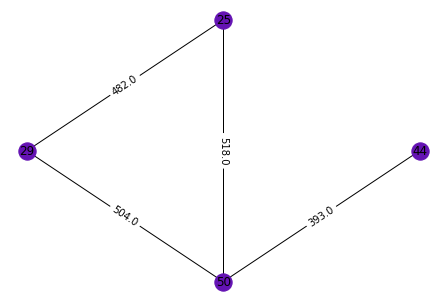

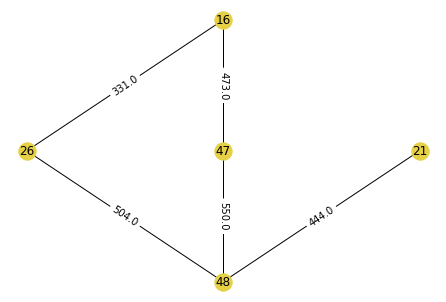

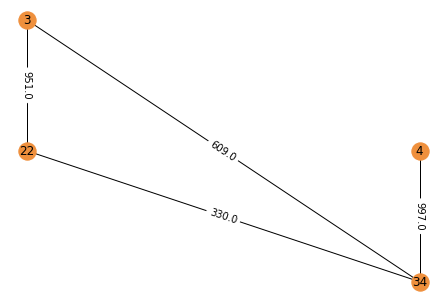

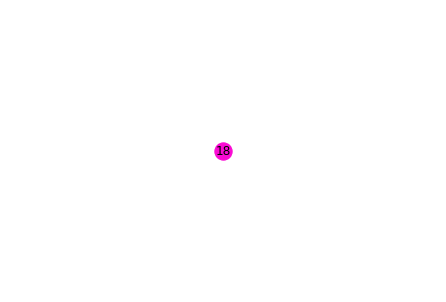

...

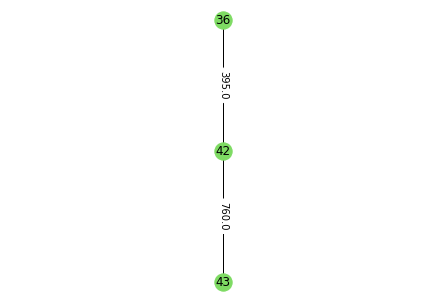

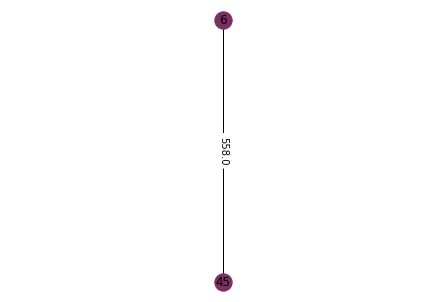

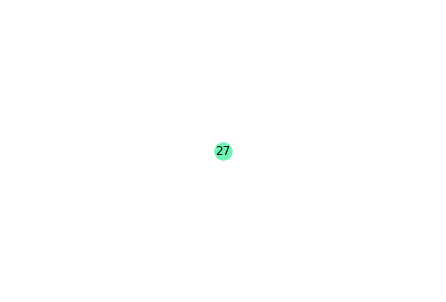

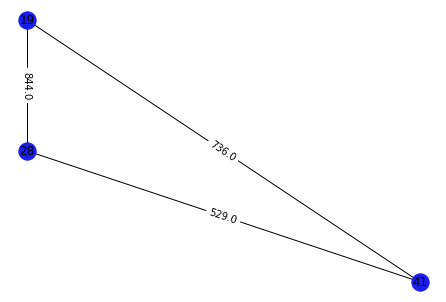

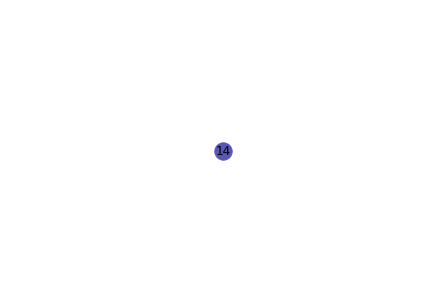

For k = 17
Clusters = [15  4  6 12  9 13  2  4  9  3  9  8  5 16  5  2  3  0 11  8  1  6  5  7
  1  6  4 11  1  8  3  5  2 12 14  4  7  3  7 14 11 10 10 14 13  5  2  1
  4  1]
Coditional Entropy = 0.4657430517857987
F Measure = 0.32741278329513623
The internal traffic for cluster 1 = 0.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 63.0
The emulated traffic between cluster 1 and cluster 4 = 0.0
The emulated traffic between cluster 1 and cluster 5 = 0.0
The emulated traffic between cluster 1 and cluster 6 = 178.0
The emulated traffic between cluster 1 and cluster 7 = 0.0
The emulated traffic between cluster 1 and cluster 8 = 0.0
The emulated traffic between cluster 1 and cluster 9 = 177.0
The emulated traffic between cluster 1 and cluster 10 = 0.0
The emulated traffic between cluster 1 and cluster 11 = 0.0
The emulated traffic between cluster 1 and cluster 12 = 0.0
The emulated traffic between cluster 1 and cluster 13 

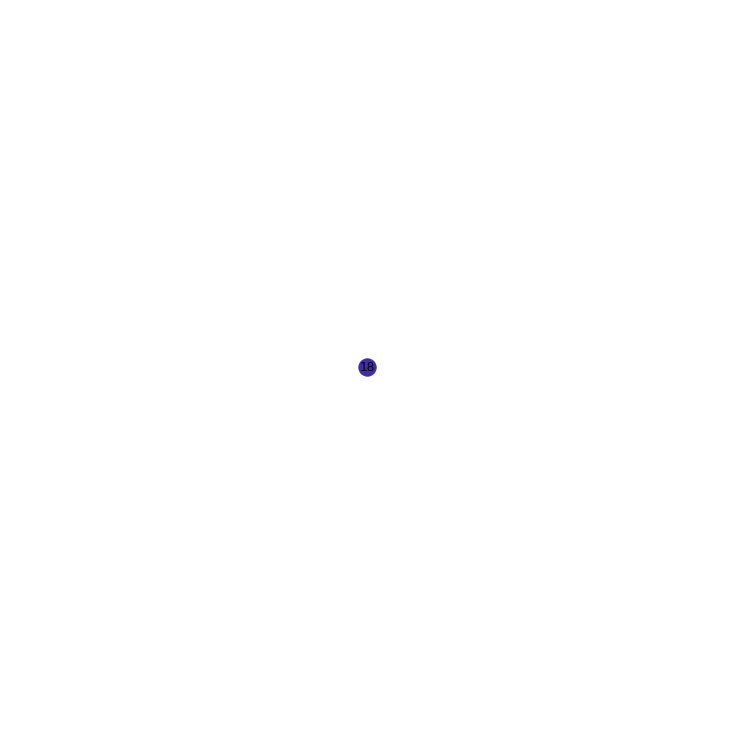

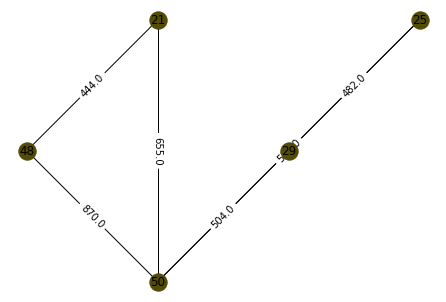

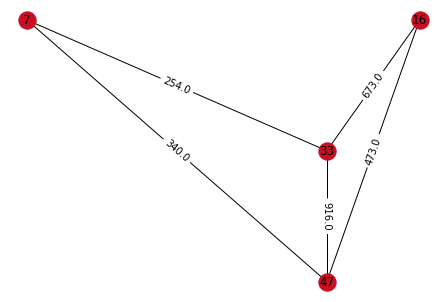

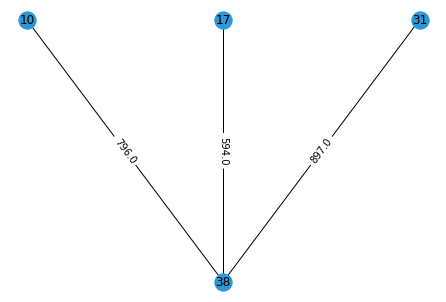

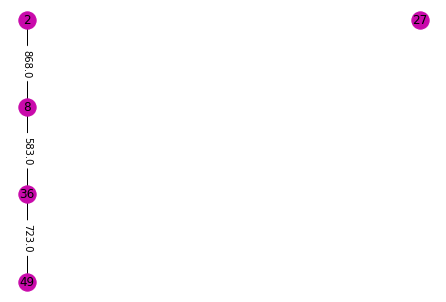

...

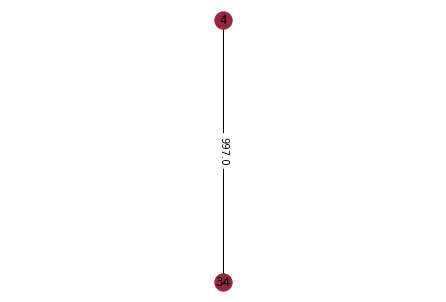

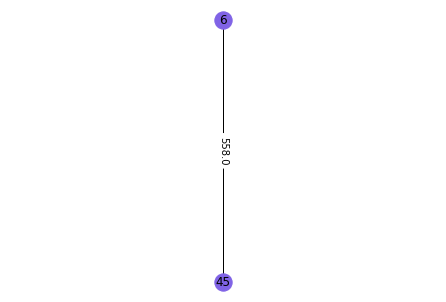

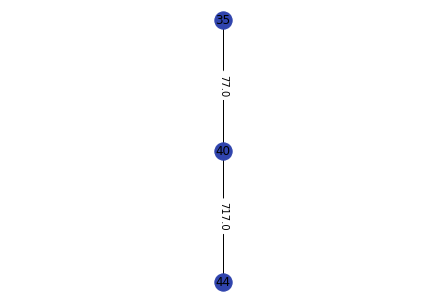

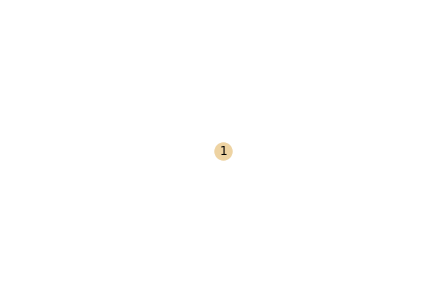

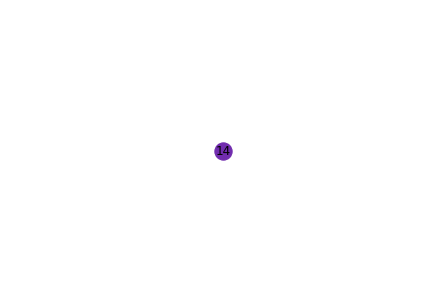

For k = 20
Clusters = [13  0 12 11  9 10 17  0  9  3  9  6  7 17  2  4 18 14 16  6  1 12  2 15
 19 12  9 16 19  6  3  2  4 11  4 18  8  3 15  7 16  5  5  7 10  2 15  1
 18  1]
Coditional Entropy = 0.37805747581421
F Measure = 0.3366269841269841
The internal traffic for cluster 1 = 868.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 0.0
The emulated traffic between cluster 1 and cluster 4 = 54.0
The emulated traffic between cluster 1 and cluster 5 = 660.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The emulated traffic between cluster 1 and cluster 7 = 0.0
The emulated traffic between cluster 1 and cluster 8 = 0.0
The emulated traffic between cluster 1 and cluster 9 = 0.0
The emulated traffic between cluster 1 and cluster 10 = 0.0
The emulated traffic between cluster 1 and cluster 11 = 0.0
The emulated traffic between cluster 1 and cluster 12 = 0.0
The emulated traffic between cluster 1 and cluster 13 = 0

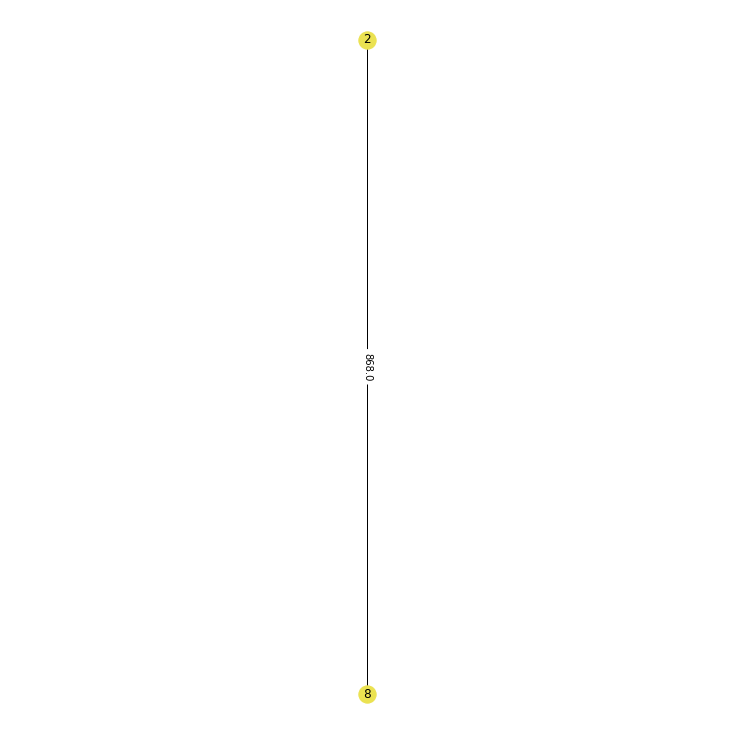

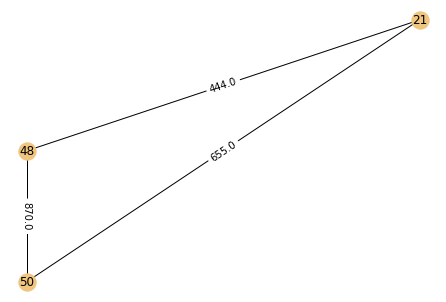

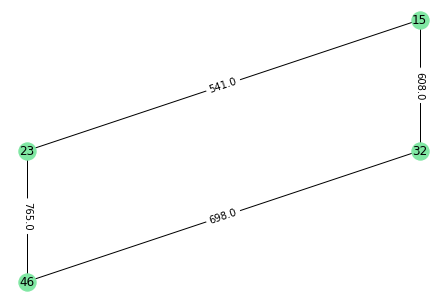

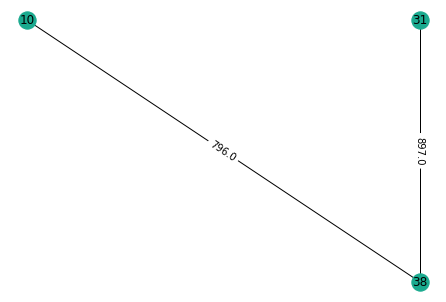

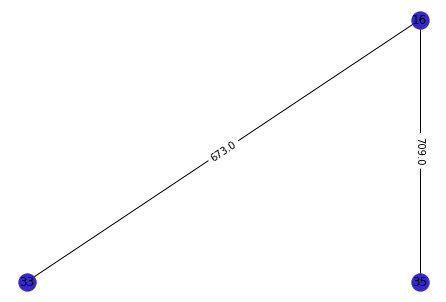

...

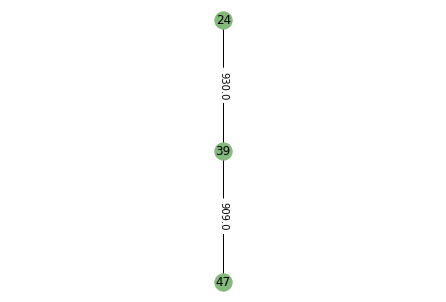

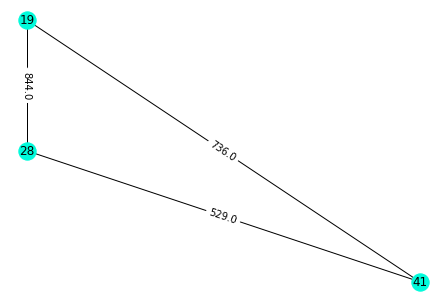

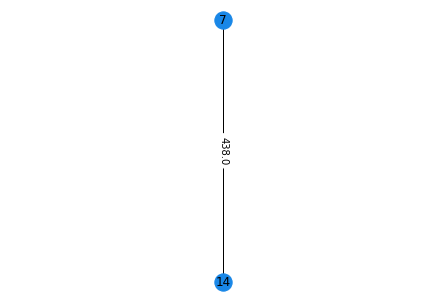

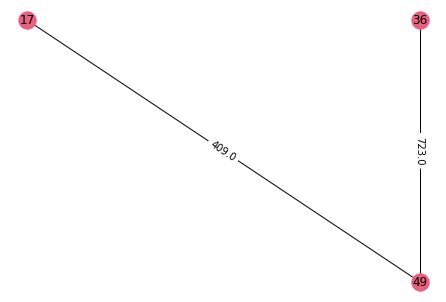

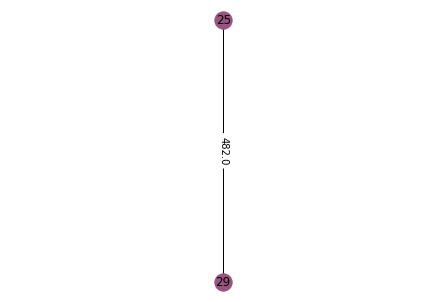

For k = 25
Clusters = [15 21  1 17  2  9  0 21  8 13  8 10 14 20  4  0 11 22 12 10  5  1 18 16
  6  1  8 12  6 23 24  4  0 17 18  3  7 13 16 14  2 19 19 14  9 23  0  5
  3  5]
Coditional Entropy = 0.30716829835766707
F Measure = 0.3277777777777778
The internal traffic for cluster 1 = 2656.0
The emulated traffic between cluster 1 and cluster 2 = 433.0
The emulated traffic between cluster 1 and cluster 3 = 0.0
The emulated traffic between cluster 1 and cluster 4 = 0.0
The emulated traffic between cluster 1 and cluster 5 = 72.0
The emulated traffic between cluster 1 and cluster 6 = 1396.0
The emulated traffic between cluster 1 and cluster 7 = 0.0
The emulated traffic between cluster 1 and cluster 8 = 0.0
The emulated traffic between cluster 1 and cluster 9 = 699.0
The emulated traffic between cluster 1 and cluster 10 = 0.0
The emulated traffic between cluster 1 and cluster 11 = 741.0
The emulated traffic between cluster 1 and cluster 12 = 0.0
The emulated traffic between cluster 1 and clu

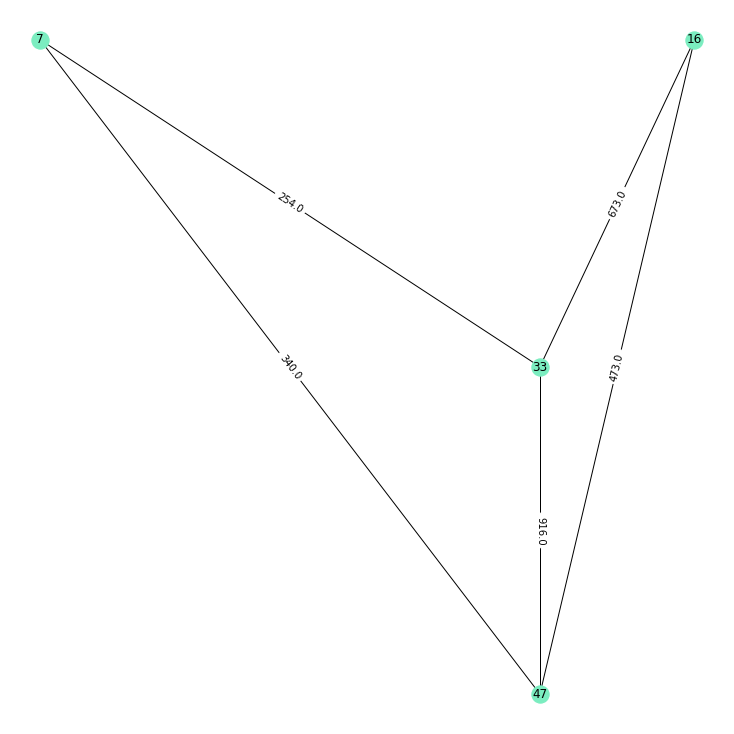

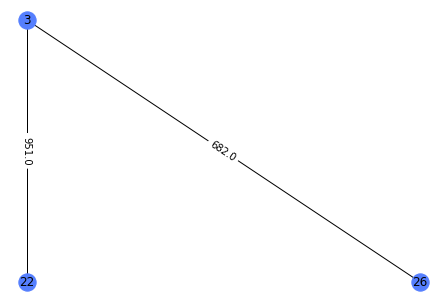

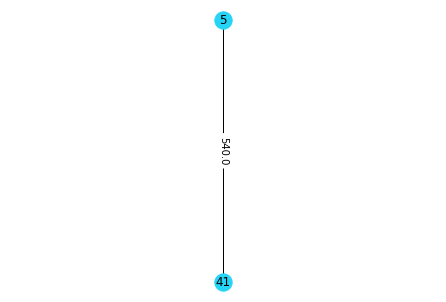

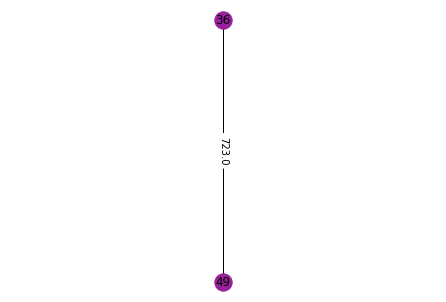

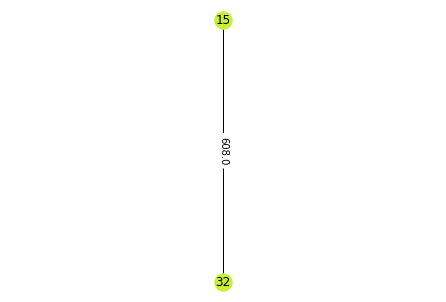

...

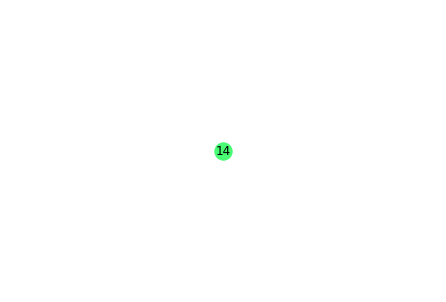

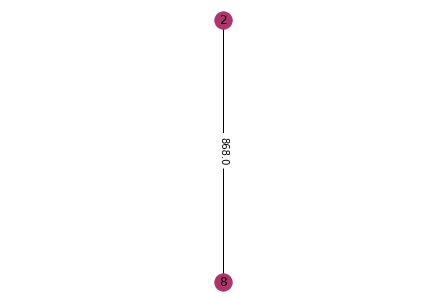

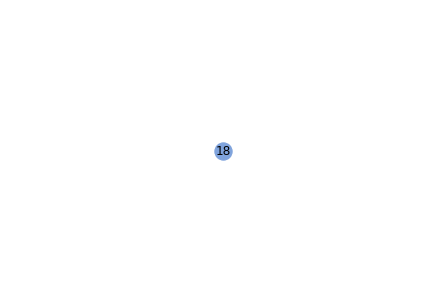

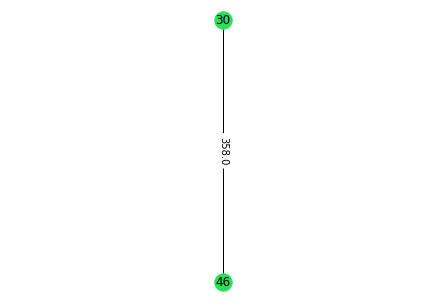

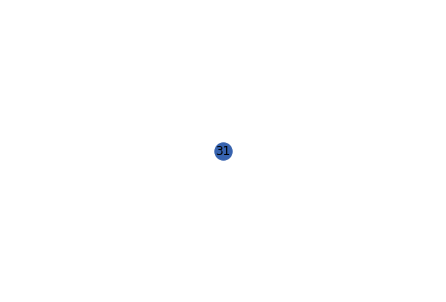

In [ ]:
#nodes = 50
# toplogy 8
example = examples[len(examples)-1-8]
gt = ground_truth_array[10+8]
print("Clusters for example 50_8")
for j in K_values_50:
  A = similarity_matrix(example)
  Y = Normalized_cut(A, j)
  cluster_matrix = get_traffic(Y, A)
  print("For k =",j)
  print("Clusters =",Y)
  print("Coditional Entropy =", conditional_entropy(Y, gt))
  print("F Measure =", f_measure(precision(Y, gt), recall(Y, gt)))
  for i in range(cluster_matrix.shape[0]):
    print("The internal traffic for cluster",i+1,"=",cluster_matrix[i,i])
    for k in range(cluster_matrix.shape[0]):
      if (i != k and k > i):
        print("The emulated traffic between cluster", i+1, "and cluster", k+1,"=",cluster_matrix[i][k])
  print("The graph after clustering:")
  visualize_topologies_afterClustering(example, Y)

Clusters for example 50_9
For k = 2
Clusters = [0 1 1 1 1 0 1 0 0 0 1 1 1 0 0 1 0 1 1 1 1 0 0 1 1 0 1 1 0 1 1 1 0 1 0 1 1
 0 1 0 1 1 1 1 0 0 1 1 0 0]
Coditional Entropy = 1.1070127769362208
F Measure = 0.20333333333333334
The internal traffic for cluster 1 = 6975.0
The emulated traffic between cluster 1 and cluster 2 = 4890.0
The internal traffic for cluster 2 = 11777.0
The graph after clustering:


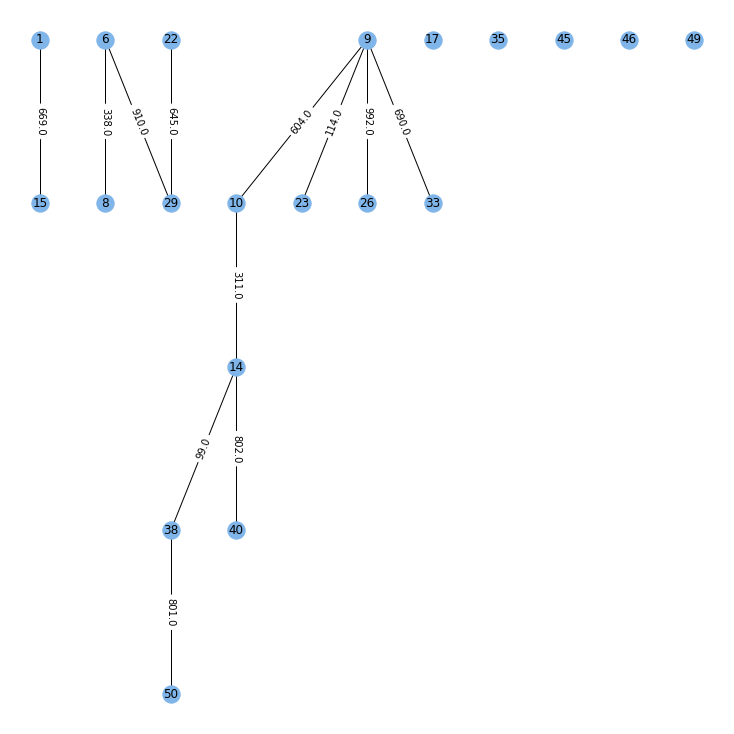

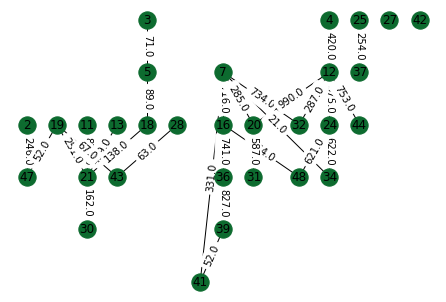

For k = 10
Clusters = [0 3 1 0 1 0 0 0 2 2 1 0 1 2 0 0 9 1 1 0 1 0 2 0 0 2 5 4 0 1 0 0 2 0 8 0 0
 0 0 2 0 6 4 0 0 0 3 0 7 0]
Coditional Entropy = 0.8450101152866992
F Measure = 0.38969696969696965
The internal traffic for cluster 1 = 17339.0
The emulated traffic between cluster 1 and cluster 2 = 11.0
The emulated traffic between cluster 1 and cluster 3 = 382.0
The emulated traffic between cluster 1 and cluster 4 = 0.0
The emulated traffic between cluster 1 and cluster 5 = 0.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The emulated traffic between cluster 1 and cluster 7 = 0.0
The emulated traffic between cluster 1 and cluster 8 = 0.0
The emulated traffic between cluster 1 and cluster 9 = 0.0
The emulated traffic between cluster 1 and cluster 10 = 0.0
The internal traffic for cluster 2 = 1969.0
The emulated traffic between cluster 2 and cluster 3 = 0.0
The emulated traffic between cluster 2 and cluster 4 = 52.0
The emulated traffic between cluster 2 and cluster 5 = 67.0


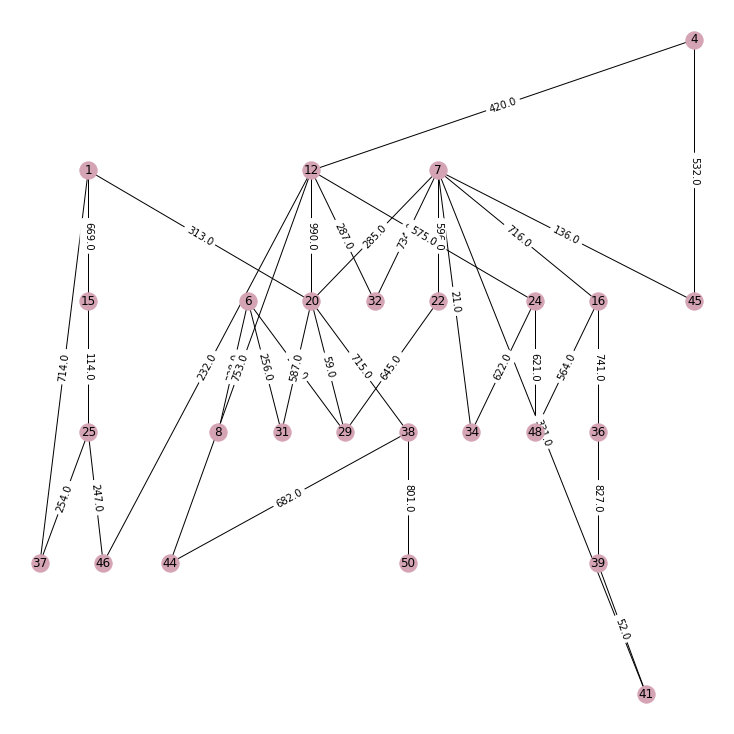

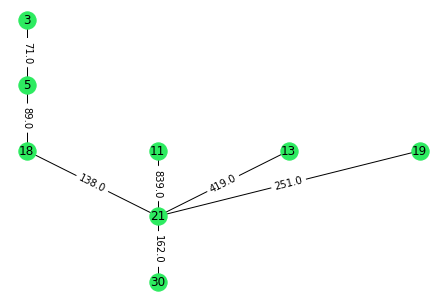

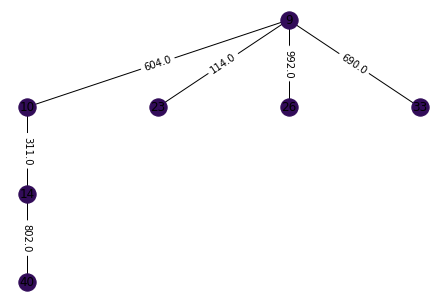

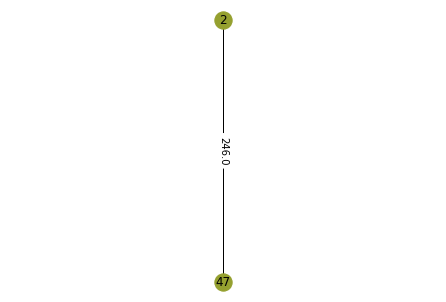

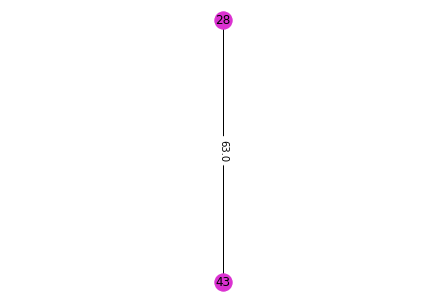

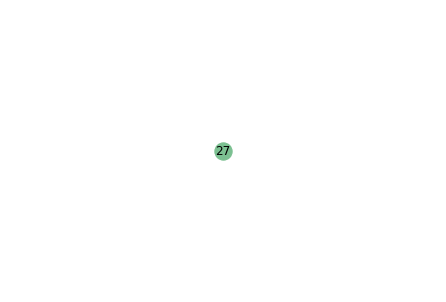

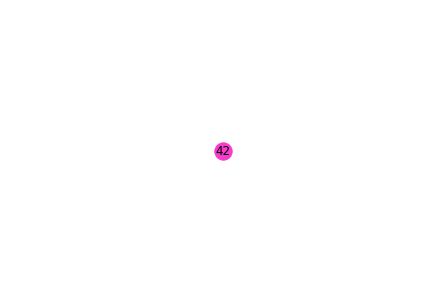

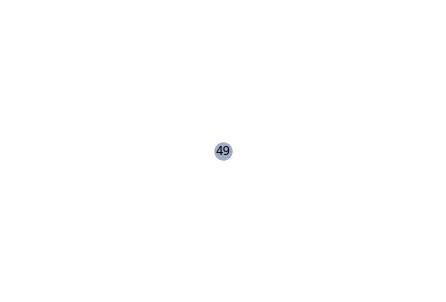

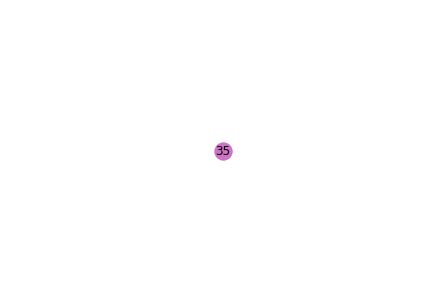

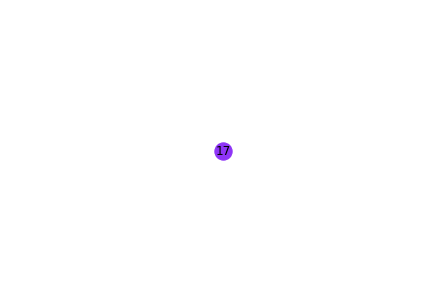

For k = 12
Clusters = [ 1  6  4 11  4  2  2  2  0  0  3 11  3  0  1  2 10  3  3 11  3  2  2  2
  1  0  9  7  2  3 11  2  0  2  5  2  1 11  2  0  2  5  7 11  2  1  6  2
  8 11]
Coditional Entropy = 0.6539537778213969
F Measure = 0.33988696488696485
The internal traffic for cluster 1 = 3399.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 114.0
The emulated traffic between cluster 1 and cluster 4 = 0.0
The emulated traffic between cluster 1 and cluster 5 = 0.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The emulated traffic between cluster 1 and cluster 7 = 0.0
The emulated traffic between cluster 1 and cluster 8 = 0.0
The emulated traffic between cluster 1 and cluster 9 = 0.0
The emulated traffic between cluster 1 and cluster 10 = 0.0
The emulated traffic between cluster 1 and cluster 11 = 0.0
The emulated traffic between cluster 1 and cluster 12 = 99.0
The internal traffic for cluster 2 = 1998.0
The emula

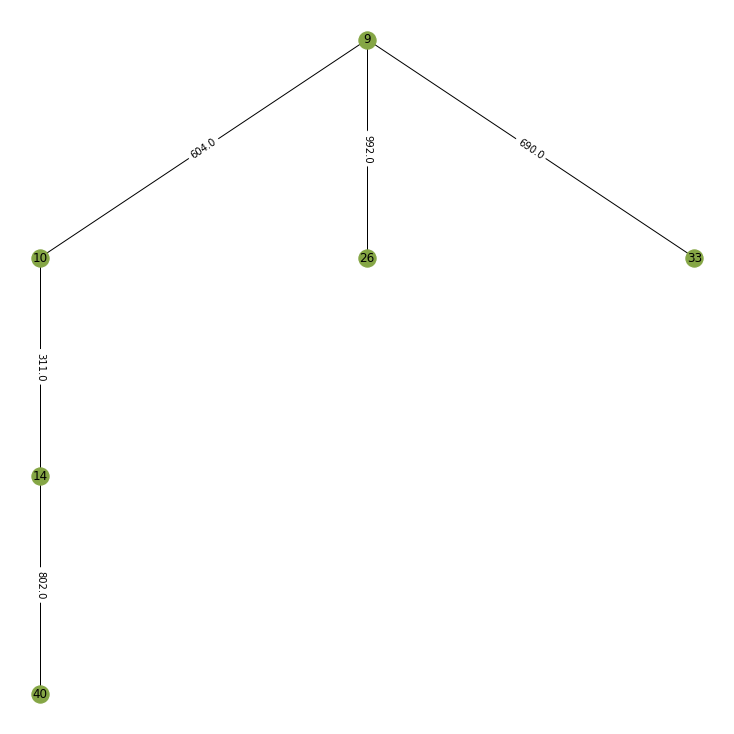

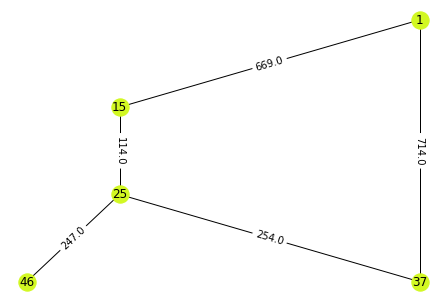

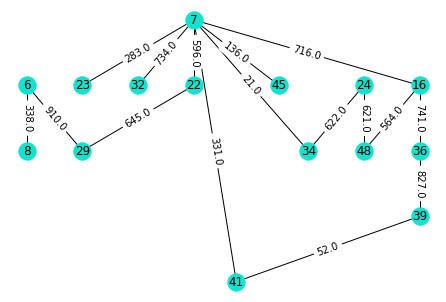

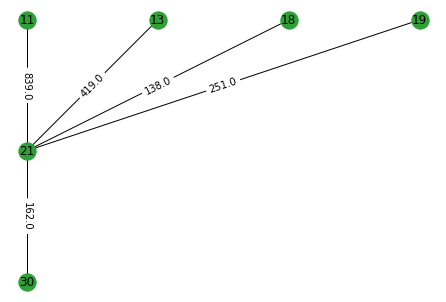

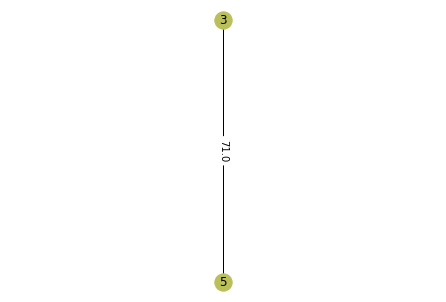

...

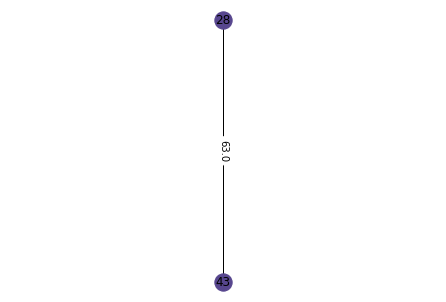

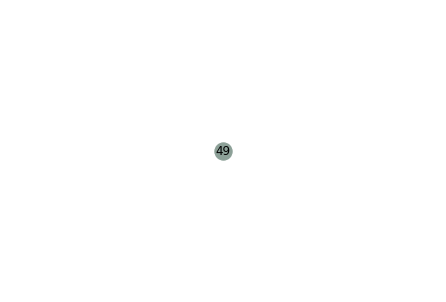

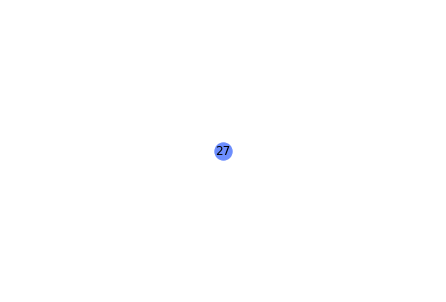

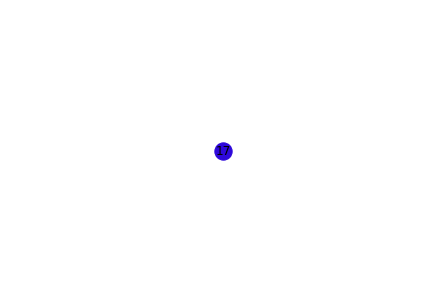

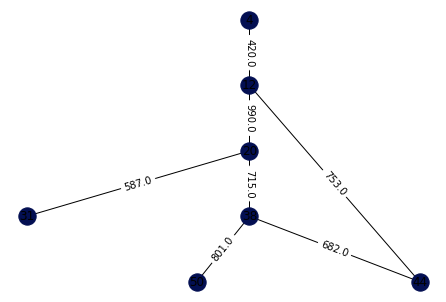

For k = 15
Clusters = [ 3  7  8  1  0  6  1  6  5  5  4  2  4  5  3  1 13  0  4  2  4  6  1  1
  3  5  9 12  6  4  6  1  5  1 11  1  3  2  1  5  1 10 12  2  1  3  7  1
 14  2]
Coditional Entropy = 0.6078872511787563
F Measure = 0.3470418470418471
The internal traffic for cluster 1 = 89.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 0.0
The emulated traffic between cluster 1 and cluster 4 = 0.0
The emulated traffic between cluster 1 and cluster 5 = 138.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The emulated traffic between cluster 1 and cluster 7 = 0.0
The emulated traffic between cluster 1 and cluster 8 = 0.0
The emulated traffic between cluster 1 and cluster 9 = 71.0
The emulated traffic between cluster 1 and cluster 10 = 0.0
The emulated traffic between cluster 1 and cluster 11 = 0.0
The emulated traffic between cluster 1 and cluster 12 = 0.0
The emulated traffic between cluster 1 and cluster 13 = 

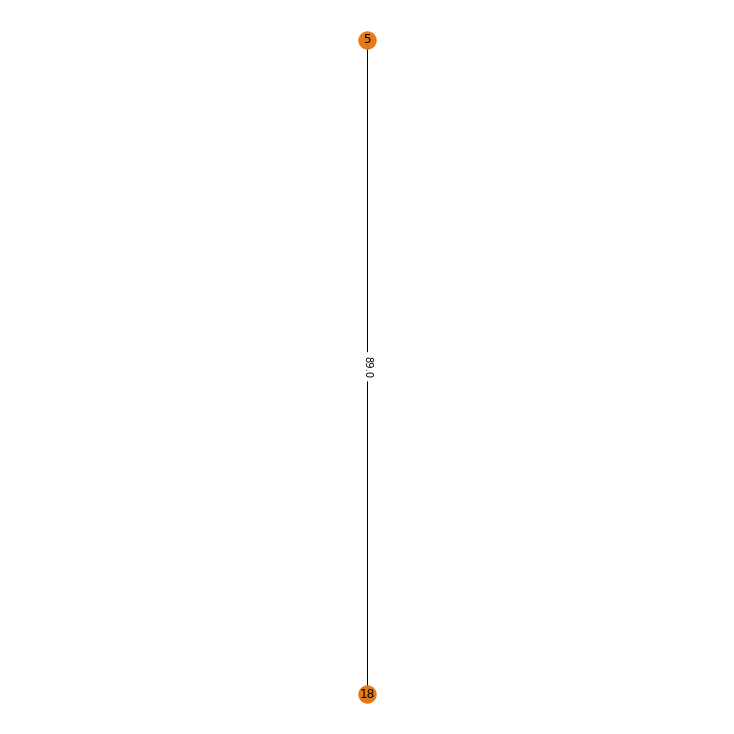

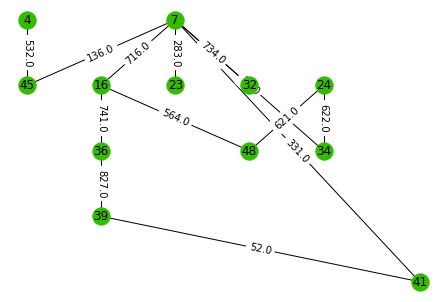

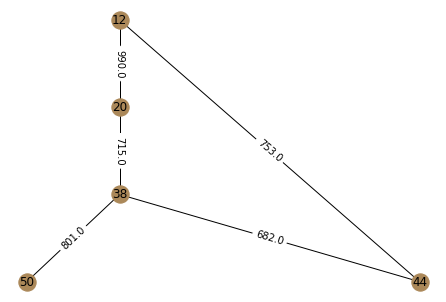

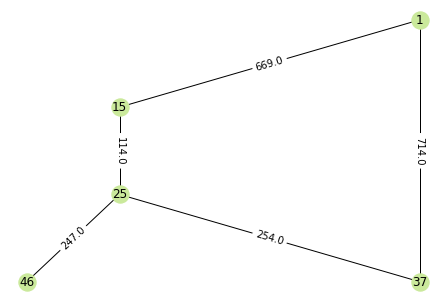

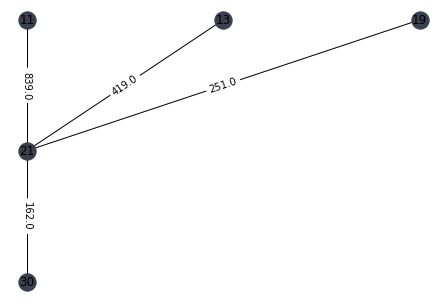

...

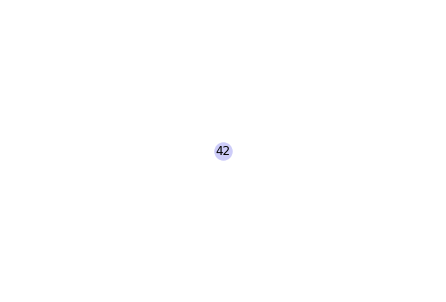

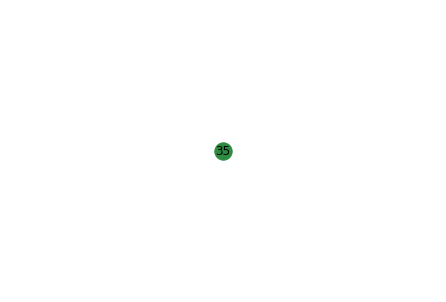

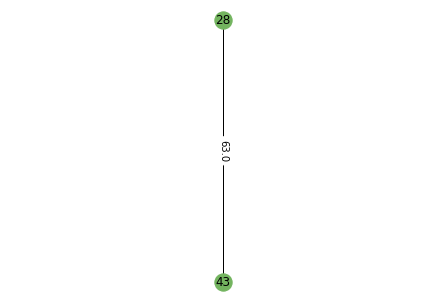

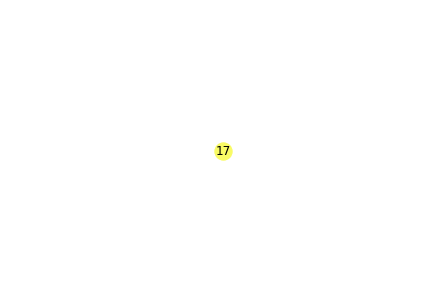

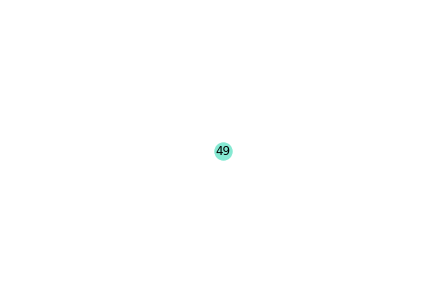

For k = 17
Clusters = [ 2  5  7  0 10  6  3  6  4  4 12  0 12  8  2  3 14 10  1  0 12  6  4  0
  2  4  9 16  6 12  6  3  4  0 11  3  2  0  3  8  3 15  1  0  0  2  5  3
 13  0]
Coditional Entropy = 0.5599743777346766
F Measure = 0.37184873949579833
The internal traffic for cluster 1 = 6090.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 545.0
The emulated traffic between cluster 1 and cluster 4 = 1350.0
The emulated traffic between cluster 1 and cluster 5 = 0.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The emulated traffic between cluster 1 and cluster 7 = 646.0
The emulated traffic between cluster 1 and cluster 8 = 0.0
The emulated traffic between cluster 1 and cluster 9 = 99.0
The emulated traffic between cluster 1 and cluster 10 = 0.0
The emulated traffic between cluster 1 and cluster 11 = 0.0
The emulated traffic between cluster 1 and cluster 12 = 0.0
The emulated traffic between cluster 1 and clust

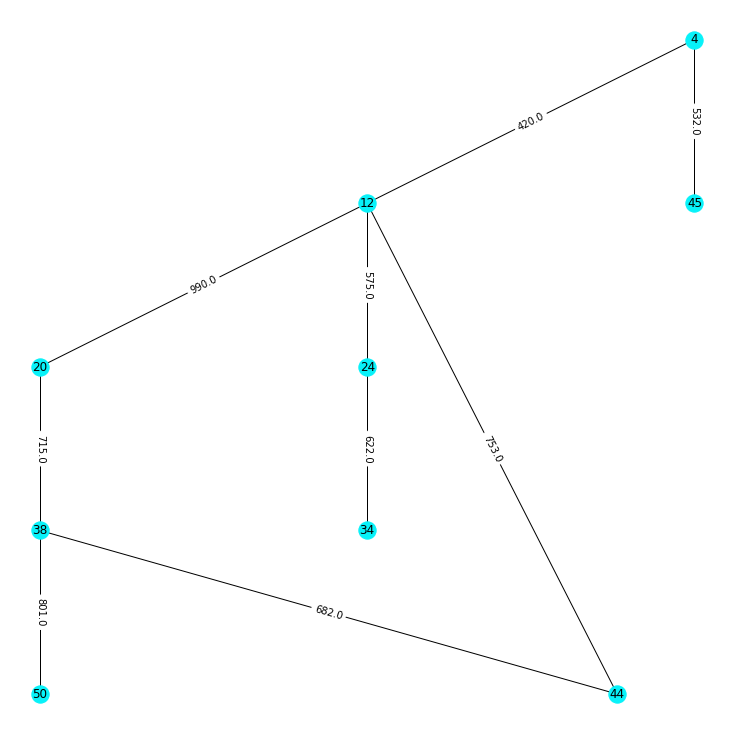

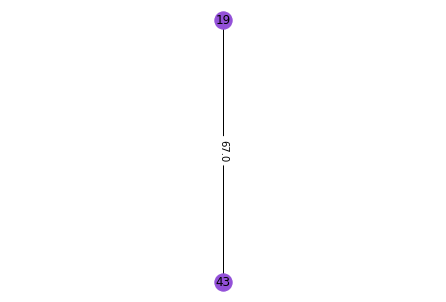

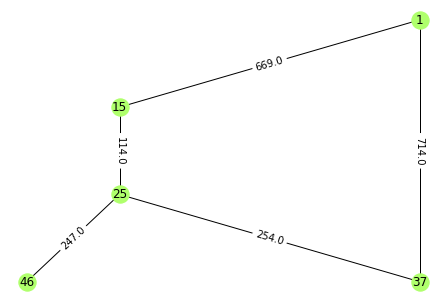

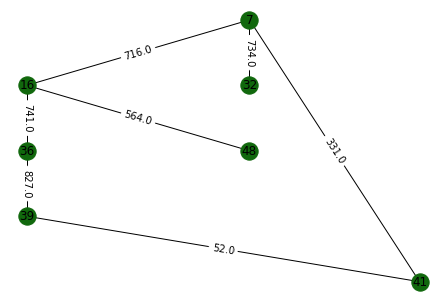

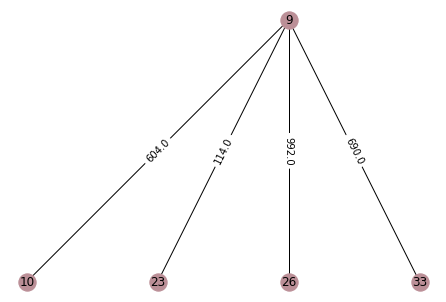

...

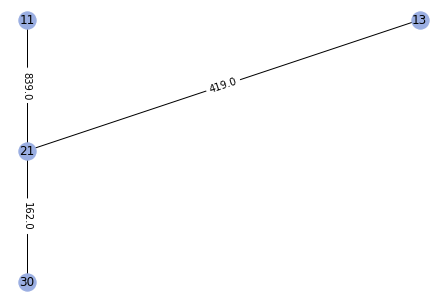

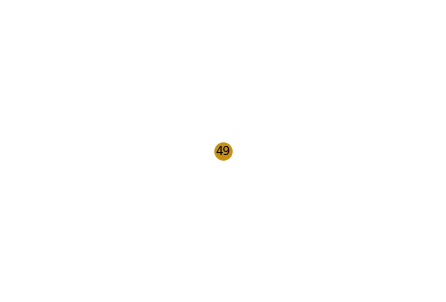

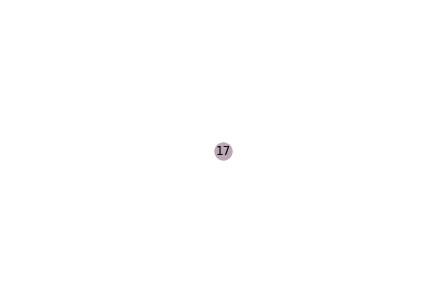

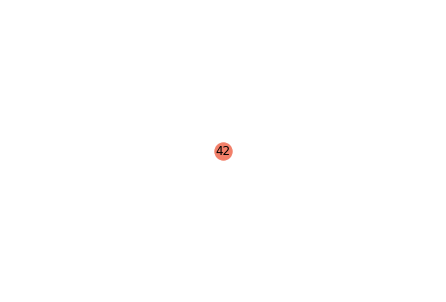

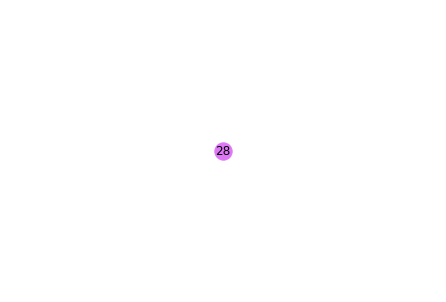

For k = 20
Clusters = [ 0 13  4 14 12  7  1  7  6  6  2  3  2  5  0  8 17 12  2  3  2  7  1  9
  0  6 11 15  7 10  3  1  6  9 19  8  0  3  8  5  1 16 15  3 14  0 13  9
 18  3]
Coditional Entropy = 0.4493124977506245
F Measure = 0.39369047619047626
The internal traffic for cluster 1 = 1998.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 0.0
The emulated traffic between cluster 1 and cluster 4 = 545.0
The emulated traffic between cluster 1 and cluster 5 = 0.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The emulated traffic between cluster 1 and cluster 7 = 0.0
The emulated traffic between cluster 1 and cluster 8 = 0.0
The emulated traffic between cluster 1 and cluster 9 = 0.0
The emulated traffic between cluster 1 and cluster 10 = 0.0
The emulated traffic between cluster 1 and cluster 11 = 0.0
The emulated traffic between cluster 1 and cluster 12 = 0.0
The emulated traffic between cluster 1 and cluster 13 

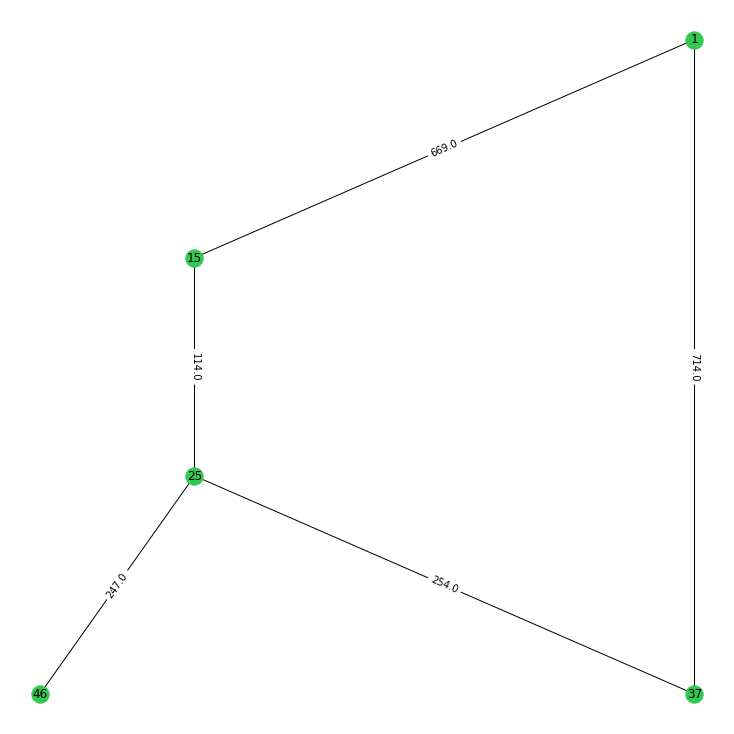

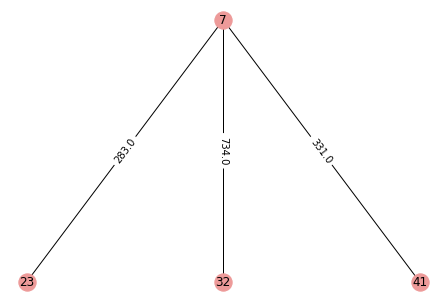

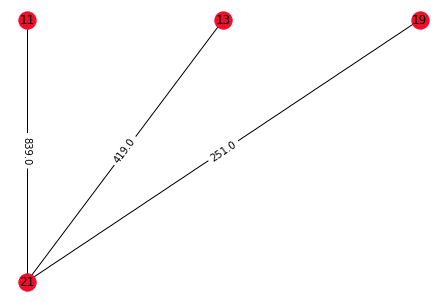

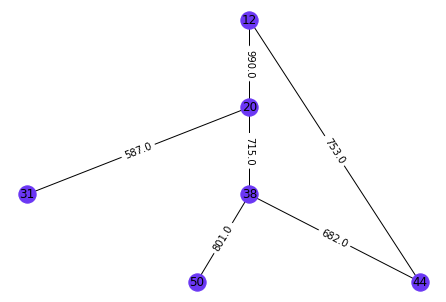

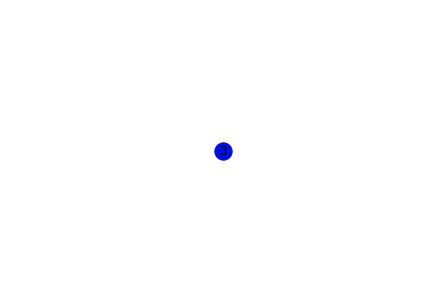

...

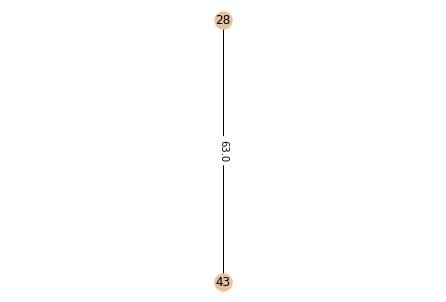

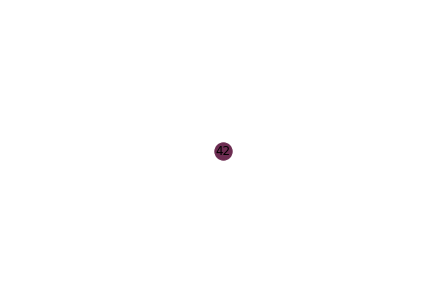

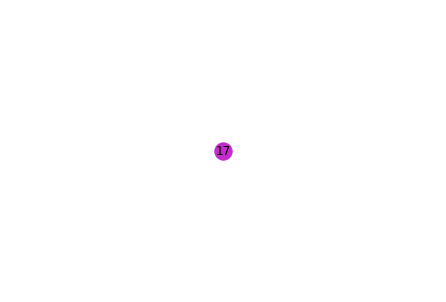

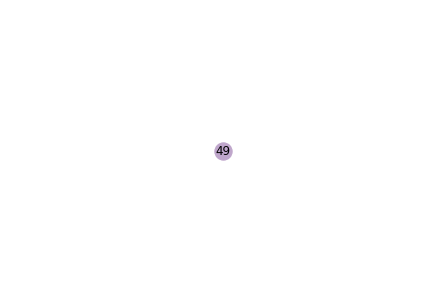

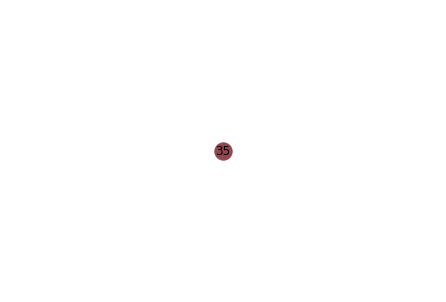

For k = 25
Clusters = [ 9  8 19  7 18  1 22  1  3  3  6  2  6 14  9 10 12 21 23  2  6  1 24  5
  4  3 15 11  1 20  2 22  3  5  0 10  9  2 10 14 22 13 16  2  7  4  8  5
 17  2]
Coditional Entropy = 0.3689677245540876
F Measure = 0.4061904761904762
The internal traffic for cluster 1 = 0.0
The emulated traffic between cluster 1 and cluster 2 = 0.0
The emulated traffic between cluster 1 and cluster 3 = 0.0
The emulated traffic between cluster 1 and cluster 4 = 0.0
The emulated traffic between cluster 1 and cluster 5 = 0.0
The emulated traffic between cluster 1 and cluster 6 = 0.0
The emulated traffic between cluster 1 and cluster 7 = 0.0
The emulated traffic between cluster 1 and cluster 8 = 0.0
The emulated traffic between cluster 1 and cluster 9 = 0.0
The emulated traffic between cluster 1 and cluster 10 = 0.0
The emulated traffic between cluster 1 and cluster 11 = 0.0
The emulated traffic between cluster 1 and cluster 12 = 0.0
The emulated traffic between cluster 1 and cluster 13 = 0.0


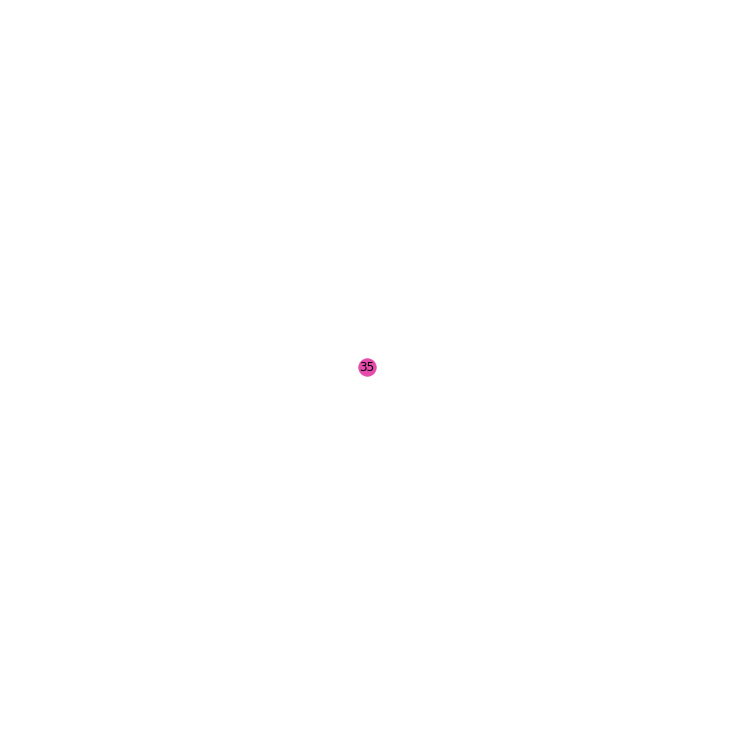

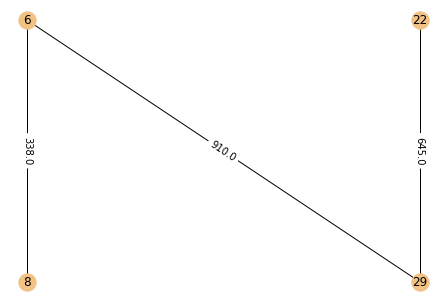

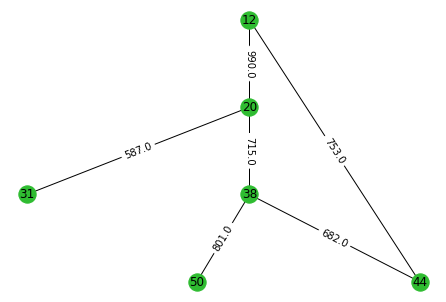

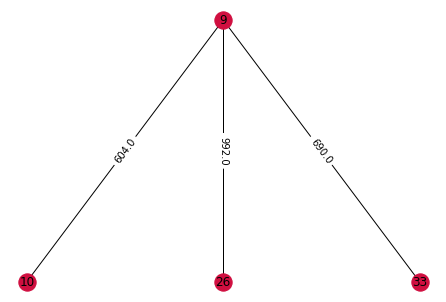

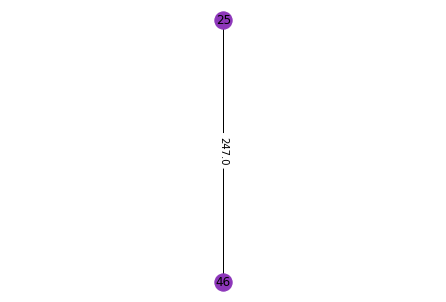

...

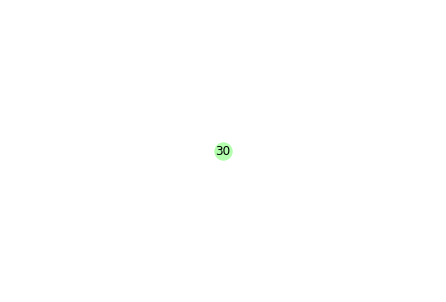

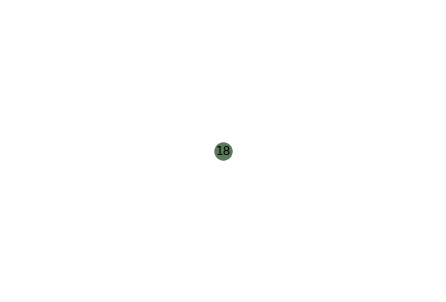

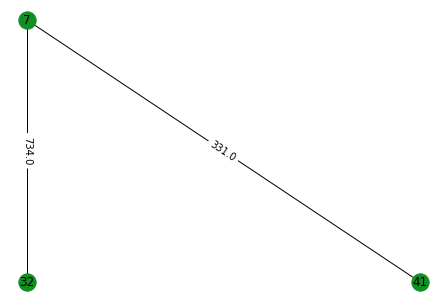

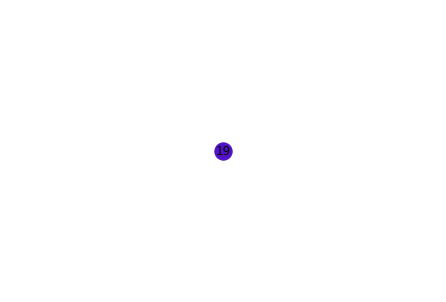

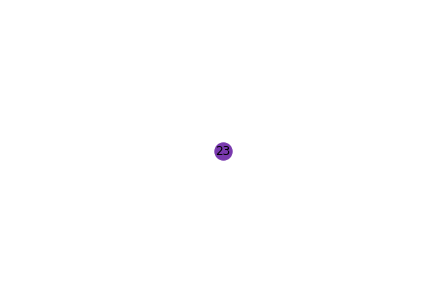

In [ ]:
#nodes = 50
# toplogy 9
example = examples[len(examples)-1-9]
gt = ground_truth_array[10+9]
print("Clusters for example 50_9")
for j in K_values_50:
  A = similarity_matrix(example)
  Y = Normalized_cut(A, j)
  cluster_matrix = get_traffic(Y, A)
  print("For k =",j)
  print("Clusters =",Y)
  print("Coditional Entropy =", conditional_entropy(Y, gt))
  print("F Measure =", f_measure(precision(Y, gt), recall(Y, gt)))
  for i in range(cluster_matrix.shape[0]):
    print("The internal traffic for cluster",i+1,"=",cluster_matrix[i,i])
    for k in range(cluster_matrix.shape[0]):
      if (i != k and k > i):
        print("The emulated traffic between cluster", i+1, "and cluster", k+1,"=",cluster_matrix[i][k])
  print("The graph after clustering:")
  visualize_topologies_afterClustering(example, Y)

In [ ]:
#nodes = 100
# toplogy 0
example = examples[10]
print("Clusters for example 100_0")
for j in K_values_50:
  A = similarity_matrix(example)
  Y = Normalized_cut(A, j)
  cluster_matrix = get_traffic(Y, A)
  print("For k =",j)
  print("Clusters =",Y)
  Ncut = Ncut_eval(Y,A)
  print("Normalized Cut =", Ncut)
  print("Normalized Cut percentage =", (Ncut/j) * 100 , "%")
  for i in range(cluster_matrix.shape[0]):
    print("The internal traffic for cluster",i+1,"=",cluster_matrix[i,i])
    for k in range(cluster_matrix.shape[0]):
      if (i != k and k > i):
        print("The emulated traffic between cluster", i+1, "and cluster", k+1,"=",cluster_matrix[i][k])
  print("The graph after clustering:")
  visualize_topologies_afterClustering(example, Y)

Output hidden; open in https://colab.research.google.com to view.

In [82]:
#nodes = 100
# toplogy 1
example = examples[10+1]
print("Clusters for example 100_0")
for j in K_values_50:
  A = similarity_matrix(example)
  Y = Normalized_cut(A, j)
  cluster_matrix = get_traffic(Y, A)
  print("For k =",j)
  print("Clusters =",Y)
  Ncut = Ncut_eval(Y,A)
  print("Normalized Cut =", Ncut)
  print("Normalized Cut percentage =", (Ncut/j) * 100 , "%")
  for i in range(cluster_matrix.shape[0]):
    print("The internal traffic for cluster",i+1,"=",cluster_matrix[i,i])
    for k in range(cluster_matrix.shape[0]):
      if (i != k and k > i):
        print("The emulated traffic between cluster", i+1, "and cluster", k+1,"=",cluster_matrix[i][k])
  print("The graph after clustering:")
  visualize_topologies_afterClustering(example, Y)

Output hidden; open in https://colab.research.google.com to view.

In [83]:
#nodes = 100
# toplogy 2
example = examples[10+2]
print("Clusters for example 100_0")
for j in K_values_50:
  A = similarity_matrix(example)
  Y = Normalized_cut(A, j)
  cluster_matrix = get_traffic(Y, A)
  print("For k =",j)
  print("Clusters =",Y)
  Ncut = Ncut_eval(Y,A)
  print("Normalized Cut =", Ncut)
  print("Normalized Cut percentage =", (Ncut/j) * 100 , "%")
  for i in range(cluster_matrix.shape[0]):
    print("The internal traffic for cluster",i+1,"=",cluster_matrix[i,i])
    for k in range(cluster_matrix.shape[0]):
      if (i != k and k > i):
        print("The emulated traffic between cluster", i+1, "and cluster", k+1,"=",cluster_matrix[i][k])
  print("The graph after clustering:")
  visualize_topologies_afterClustering(example, Y)

Output hidden; open in https://colab.research.google.com to view.

In [84]:
#nodes = 100
# toplogy 3
example = examples[10+3]
print("Clusters for example 100_0")
for j in K_values_50:
  A = similarity_matrix(example)
  Y = Normalized_cut(A, j)
  cluster_matrix = get_traffic(Y, A)
  print("For k =",j)
  print("Clusters =",Y)
  Ncut = Ncut_eval(Y,A)
  print("Normalized Cut =", Ncut)
  print("Normalized Cut percentage =", (Ncut/j) * 100 , "%")
  for i in range(cluster_matrix.shape[0]):
    print("The internal traffic for cluster",i+1,"=",cluster_matrix[i,i])
    for k in range(cluster_matrix.shape[0]):
      if (i != k and k > i):
        print("The emulated traffic between cluster", i+1, "and cluster", k+1,"=",cluster_matrix[i][k])
  print("The graph after clustering:")
  visualize_topologies_afterClustering(example, Y)

Output hidden; open in https://colab.research.google.com to view.

In [85]:
#nodes = 100
# toplogy 4
example = examples[10+4]
print("Clusters for example 100_0")
for j in K_values_50:
  A = similarity_matrix(example)
  Y = Normalized_cut(A, j)
  cluster_matrix = get_traffic(Y, A)
  print("For k =",j)
  print("Clusters =",Y)
  Ncut = Ncut_eval(Y,A)
  print("Normalized Cut =", Ncut)
  print("Normalized Cut percentage =", (Ncut/j) * 100 , "%")
  for i in range(cluster_matrix.shape[0]):
    print("The internal traffic for cluster",i+1,"=",cluster_matrix[i,i])
    for k in range(cluster_matrix.shape[0]):
      if (i != k and k > i):
        print("The emulated traffic between cluster", i+1, "and cluster", k+1,"=",cluster_matrix[i][k])
  print("The graph after clustering:")
  visualize_topologies_afterClustering(example, Y)

Output hidden; open in https://colab.research.google.com to view.

In [86]:
#nodes = 100
# toplogy 5
example = examples[10+5]
print("Clusters for example 100_0")
for j in K_values_50:
  A = similarity_matrix(example)
  Y = Normalized_cut(A, j)
  cluster_matrix = get_traffic(Y, A)
  print("For k =",j)
  print("Clusters =",Y)
  Ncut = Ncut_eval(Y,A)
  print("Normalized Cut =", Ncut)
  print("Normalized Cut percentage =", (Ncut/j) * 100 , "%")
  for i in range(cluster_matrix.shape[0]):
    print("The internal traffic for cluster",i+1,"=",cluster_matrix[i,i])
    for k in range(cluster_matrix.shape[0]):
      if (i != k and k > i):
        print("The emulated traffic between cluster", i+1, "and cluster", k+1,"=",cluster_matrix[i][k])
  print("The graph after clustering:")
  visualize_topologies_afterClustering(example, Y)

Output hidden; open in https://colab.research.google.com to view.

In [87]:
#nodes = 100
# toplogy 6
example = examples[10+6]
print("Clusters for example 100_0")
for j in K_values_50:
  A = similarity_matrix(example)
  Y = Normalized_cut(A, j)
  cluster_matrix = get_traffic(Y, A)
  print("For k =",j)
  print("Clusters =",Y)
  Ncut = Ncut_eval(Y,A)
  print("Normalized Cut =", Ncut)
  print("Normalized Cut percentage =", (Ncut/j) * 100 , "%")
  for i in range(cluster_matrix.shape[0]):
    print("The internal traffic for cluster",i+1,"=",cluster_matrix[i,i])
    for k in range(cluster_matrix.shape[0]):
      if (i != k and k > i):
        print("The emulated traffic between cluster", i+1, "and cluster", k+1,"=",cluster_matrix[i][k])
  print("The graph after clustering:")
  visualize_topologies_afterClustering(example, Y)

Output hidden; open in https://colab.research.google.com to view.

In [88]:
#nodes = 100
# toplogy 7
example = examples[10+7]
print("Clusters for example 100_0")
for j in K_values_50:
  A = similarity_matrix(example)
  Y = Normalized_cut(A, j)
  cluster_matrix = get_traffic(Y, A)
  print("For k =",j)
  print("Clusters =",Y)
  Ncut = Ncut_eval(Y,A)
  print("Normalized Cut =", Ncut)
  print("Normalized Cut percentage =", (Ncut/j) * 100 , "%")
  for i in range(cluster_matrix.shape[0]):
    print("The internal traffic for cluster",i+1,"=",cluster_matrix[i,i])
    for k in range(cluster_matrix.shape[0]):
      if (i != k and k > i):
        print("The emulated traffic between cluster", i+1, "and cluster", k+1,"=",cluster_matrix[i][k])
  print("The graph after clustering:")
  visualize_topologies_afterClustering(example, Y)

Output hidden; open in https://colab.research.google.com to view.

In [89]:
#nodes = 100
# toplogy 8
example = examples[10+8]
print("Clusters for example 100_8")
for j in K_values_50:
  A = similarity_matrix(example)
  Y = Normalized_cut(A, j)
  cluster_matrix = get_traffic(Y, A)
  print("For k =",j)
  print("Clusters =",Y)
  Ncut = Ncut_eval(Y,A)
  print("Normalized Cut =", Ncut)
  print("Normalized Cut percentage =", (Ncut/j) * 100 , "%")
  for i in range(cluster_matrix.shape[0]):
    print("The internal traffic for cluster",i+1,"=",cluster_matrix[i,i])
    for k in range(cluster_matrix.shape[0]):
      if (i != k and k > i):
        print("The emulated traffic between cluster", i+1, "and cluster", k+1,"=",cluster_matrix[i][k])
  print("The graph after clustering:")
  visualize_topologies_afterClustering(example, Y)

Output hidden; open in https://colab.research.google.com to view.

In [90]:
#nodes = 100
# toplogy 9
example = examples[10+9]
print("Clusters for example 100_9")
for j in K_values_50:
  A = similarity_matrix(example)
  Y = Normalized_cut(A, j)
  cluster_matrix = get_traffic(Y, A)
  print("For k =",j)
  print("Clusters =",Y)
  Ncut = Ncut_eval(Y,A)
  print("Normalized Cut =", Ncut)
  print("Normalized Cut percentage =", (Ncut/j) * 100 , "%")
  for i in range(cluster_matrix.shape[0]):
    print("The internal traffic for cluster",i+1,"=",cluster_matrix[i,i])
    for k in range(cluster_matrix.shape[0]):
      if (i != k and k > i):
        print("The emulated traffic between cluster", i+1, "and cluster", k+1,"=",cluster_matrix[i][k])
  print("The graph after clustering:")
  visualize_topologies_afterClustering(example, Y)

Output hidden; open in https://colab.research.google.com to view.